In [1]:
# !git clone https://github.com/pavelshapka/Optimization_8sem.git

In [2]:
# !pip3 install -r /content/Optimization_8sem/requirements.txt

In [3]:
import os
os.chdir("./Optimization_8sem/")

In [4]:
import tensorflow as tf
tf.config.experimental.set_visible_devices([], "GPU")
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'

import jax
from flax import linen as nn
import jax.numpy as jnp
import optax
from flaxmodels import ResNet18
from typing import Callable
from optimizers import SGD, PAGE
from dataloader import get_cifar10_dataloaders, tf_to_jax
from tqdm import tqdm
import matplotlib.pyplot as plt

import seaborn as sns
sns.set_style("whitegrid")


2025-05-23 07:05:15.112520: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747983915.134080   46874 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747983915.141190   46874 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1747983915.157240   46874 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1747983915.157260   46874 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1747983915.157262   46874 computation_placer.cc:177] computation placer alr

In [5]:
def init_model(rng: jax.random.PRNGKey, init_batch: tuple[jnp.ndarray, jnp.ndarray]) -> tuple[nn.Module, dict]:
    model = ResNet18(output="logits",
                     pretrained=False,
                     num_classes=10)
    variables = model.init(rng, init_batch[0])
    return model, variables

In [6]:
def get_cross_entropy_loss_fn(model: nn.Module, train: bool = True) -> Callable:
    def loss_fn(variables: dict, batch: tuple[jnp.ndarray, jnp.ndarray]) -> jnp.ndarray:
        images, labels = batch
        outs  = model.apply(variables,
                            images,
                            mutable=["batch_stats"] if train else False,
                            train=train)
        logits, new_batch_stats_dict = outs if train else (outs, {})
        loss = optax.softmax_cross_entropy_with_integer_labels(logits, labels).mean()
        return loss, new_batch_stats_dict.get("batch_stats")

    return loss_fn

In [7]:
def get_compute_accuracy_fn(model: nn.Module) -> Callable:
    def compute_accuracy(variables: dict, batch: tuple[jnp.ndarray, jnp.ndarray]) -> jnp.ndarray:
        images, labels = batch
        logits = model.apply(variables, images, train=False)
        return jnp.mean(logits.argmax(axis=1) == labels)
    return compute_accuracy

In [8]:
def train(state,
          optimizer,
          train_loader,
          val_loader,
          num_epochs: int,
		  compute_accuracy) -> dict:
    # state = optimizer.init(variables, tf_to_jax(next(iter(train_loader))))
	acc_arr, grad_count = [], []
	for epoch in range(num_epochs):
		progress_bar = tqdm(train_loader, desc="Training")
		for batch in progress_bar:
			jax_batch = tf_to_jax(batch)
			loss, state = optimizer.update(state, jax_batch)
			progress_bar.set_postfix({"loss": f"{loss:.4f}"})
			# print("loss =", loss)

		val_acc, val_count = 0, 0
		for batch in val_loader:
			jax_batch = tf_to_jax(batch)
			acc = compute_accuracy({"params": state.params, "batch_stats": state.batch_stats}, jax_batch)
			val_acc += acc * batch[0].shape[0]
			val_count += batch[0].shape[0]

		print(f"Epoch {epoch + 1}: val_acc={val_acc / val_count}")
		acc_arr.append(val_acc / val_count)
		grad_count.append(optimizer.computed_grad_count)
		
		if epoch % 5 == 0:
			plt.plot(grad_count, acc_arr, label="PAGE")
			plt.xlabel('#gradient computations', fontsize=12)
			plt.ylabel('Acc', fontsize=12)
			plt.title('Acc vs Gradient Computations', fontsize=14)
			plt.show()

	return acc_arr, grad_count, state


In [9]:
jax.devices()

[CudaDevice(id=0)]

2025-05-23 07:05:20.193507: I tensorflow/core/kernels/data/tf_record_dataset_op.cc:387] The default buffer size is 262144, which is overridden by the user specified `buffer_size` of 8388608
2025-05-23 07:05:20.211531: W tensorflow/core/kernels/data/cache_dataset_ops.cc:916] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


2025-05-23 07:05:29.554113: W tensorflow/core/kernels/data/cache_dataset_ops.cc:916] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.
Training: 100%|██████████| 195/195 [00:14<00:00, 13.07it/s, loss=44.4720] 


Epoch 1: val_acc=0.09995993971824646


2025-05-23 07:05:52.294983: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


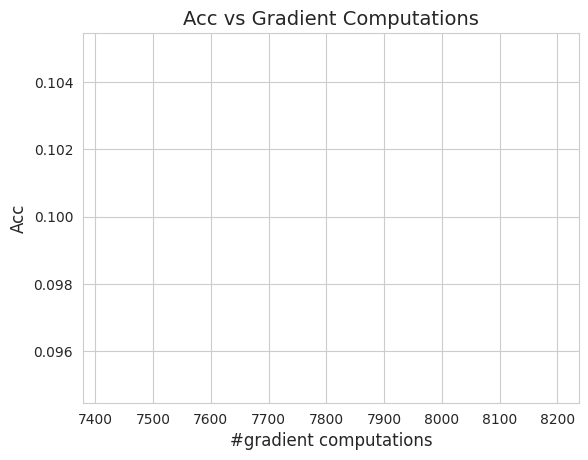

Training: 100%|██████████| 195/195 [00:01<00:00, 120.37it/s, loss=18.4134]
2025-05-23 07:05:54.290827: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 2: val_acc=0.10596955567598343


Training: 100%|██████████| 195/195 [00:01<00:00, 130.84it/s, loss=22.7390]


Epoch 3: val_acc=0.13421474397182465


Training: 100%|██████████| 195/195 [00:01<00:00, 119.93it/s, loss=14.3588]
2025-05-23 07:05:57.854867: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 4: val_acc=0.12449920177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 129.86it/s, loss=6.6689] 


Epoch 5: val_acc=0.12720352411270142


Training: 100%|██████████| 195/195 [00:01<00:00, 127.16it/s, loss=7.1749] 


Epoch 6: val_acc=0.15625


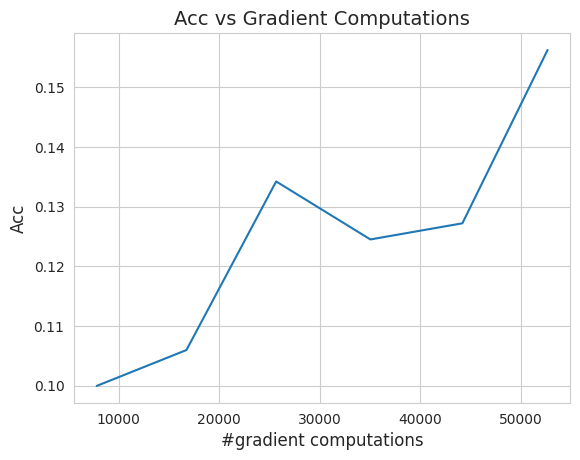

Training: 100%|██████████| 195/195 [00:01<00:00, 127.43it/s, loss=10.3839]


Epoch 7: val_acc=0.1497395783662796


Training: 100%|██████████| 195/195 [00:01<00:00, 120.28it/s, loss=5.3984] 
2025-05-23 07:06:05.034925: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 8: val_acc=0.1642628163099289


Training: 100%|██████████| 195/195 [00:01<00:00, 120.15it/s, loss=2.6736] 


Epoch 9: val_acc=0.13671875


Training: 100%|██████████| 195/195 [00:01<00:00, 119.29it/s, loss=6.4731] 


Epoch 10: val_acc=0.17017227411270142


Training: 100%|██████████| 195/195 [00:01<00:00, 124.84it/s, loss=11.1840]


Epoch 11: val_acc=0.16045673191547394


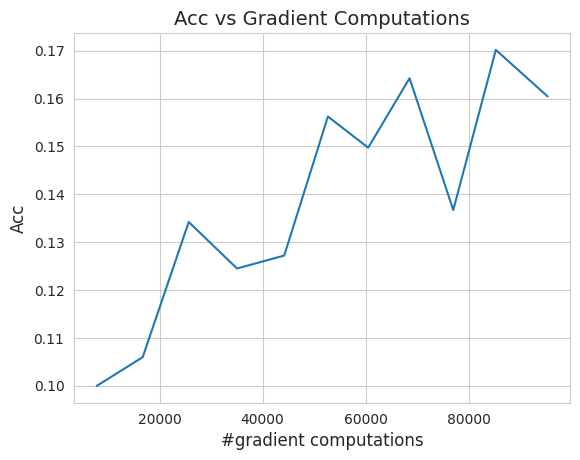

Training: 100%|██████████| 195/195 [00:01<00:00, 132.19it/s, loss=4.0742] 


Epoch 12: val_acc=0.1837940663099289


Training: 100%|██████████| 195/195 [00:01<00:00, 106.98it/s, loss=5.7758] 


Epoch 13: val_acc=0.17047275602817535


Training: 100%|██████████| 195/195 [00:01<00:00, 112.11it/s, loss=4.6299] 


Epoch 14: val_acc=0.1953125


Training: 100%|██████████| 195/195 [00:01<00:00, 119.85it/s, loss=3.5100] 


Epoch 15: val_acc=0.19200721383094788


Training: 100%|██████████| 195/195 [00:01<00:00, 131.27it/s, loss=4.7795] 


Epoch 16: val_acc=0.17678286135196686


2025-05-23 07:06:19.923143: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


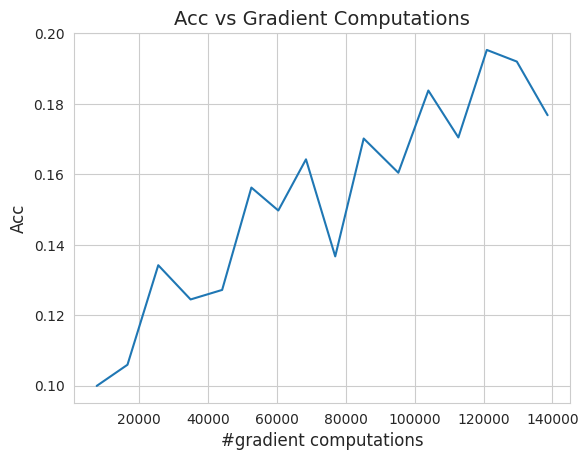

Training: 100%|██████████| 195/195 [00:01<00:00, 101.58it/s, loss=2.2162] 


Epoch 17: val_acc=0.20622996985912323


Training: 100%|██████████| 195/195 [00:01<00:00, 115.95it/s, loss=3.7184] 


Epoch 18: val_acc=0.1903044879436493


Training: 100%|██████████| 195/195 [00:02<00:00, 94.85it/s, loss=3.6201] 


Epoch 19: val_acc=0.2120392620563507


Training: 100%|██████████| 195/195 [00:02<00:00, 84.41it/s, loss=1.8077] 


Epoch 20: val_acc=0.20743189752101898


Training: 100%|██████████| 195/195 [00:02<00:00, 86.92it/s, loss=10.9760]


Epoch 21: val_acc=0.21574519574642181


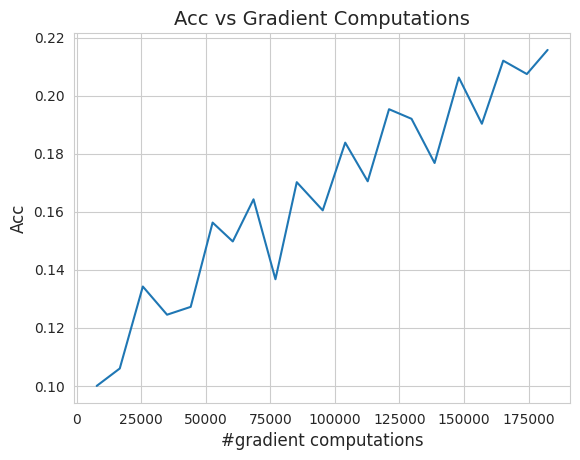

Training: 100%|██████████| 195/195 [00:02<00:00, 84.55it/s, loss=2.0850]


Epoch 22: val_acc=0.20933493971824646


Training: 100%|██████████| 195/195 [00:02<00:00, 87.01it/s, loss=2.0913] 


Epoch 23: val_acc=0.22205528616905212


Training: 100%|██████████| 195/195 [00:02<00:00, 89.14it/s, loss=8.2828] 


Epoch 24: val_acc=0.21915064752101898


Training: 100%|██████████| 195/195 [00:02<00:00, 85.96it/s, loss=1.7995] 


Epoch 25: val_acc=0.19631411135196686


Training: 100%|██████████| 195/195 [00:02<00:00, 87.21it/s, loss=2.0548]


Epoch 26: val_acc=0.21524439752101898


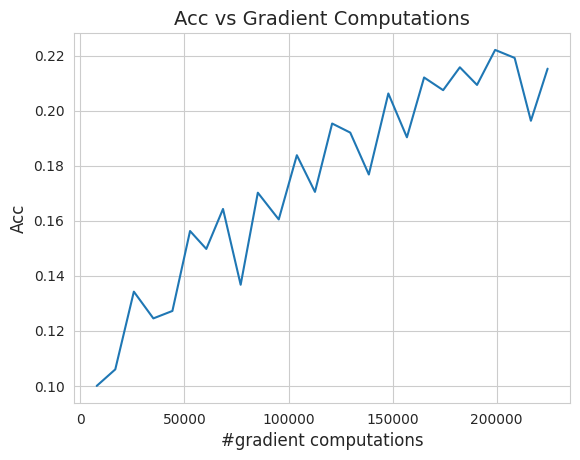

Training: 100%|██████████| 195/195 [00:02<00:00, 86.51it/s, loss=2.9672] 


Epoch 27: val_acc=0.23447516560554504


Training: 100%|██████████| 195/195 [00:02<00:00, 84.78it/s, loss=2.7014]


Epoch 28: val_acc=0.2332732379436493


Training: 100%|██████████| 195/195 [00:02<00:00, 83.64it/s, loss=8.0360] 


Epoch 29: val_acc=0.24429087340831757


Training: 100%|██████████| 195/195 [00:02<00:00, 84.94it/s, loss=2.2811] 


Epoch 30: val_acc=0.22455929219722748


Training: 100%|██████████| 195/195 [00:02<00:00, 86.99it/s, loss=2.0419]


Epoch 31: val_acc=0.2358774095773697


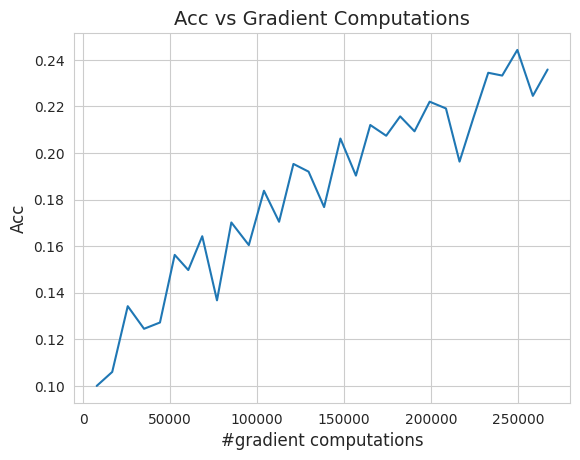

Training: 100%|██████████| 195/195 [00:02<00:00, 86.67it/s, loss=2.0059]
2025-05-23 07:06:59.043316: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 32: val_acc=0.24949920177459717


Training: 100%|██████████| 195/195 [00:02<00:00, 85.09it/s, loss=2.4245]


Epoch 33: val_acc=0.24519230425357819


Training: 100%|██████████| 195/195 [00:02<00:00, 86.50it/s, loss=3.7212] 


Epoch 34: val_acc=0.24469150602817535


Training: 100%|██████████| 195/195 [00:02<00:00, 86.93it/s, loss=2.3509]


Epoch 35: val_acc=0.25991585850715637


Training: 100%|██████████| 195/195 [00:02<00:00, 83.73it/s, loss=1.8149]


Epoch 36: val_acc=0.25580930709838867


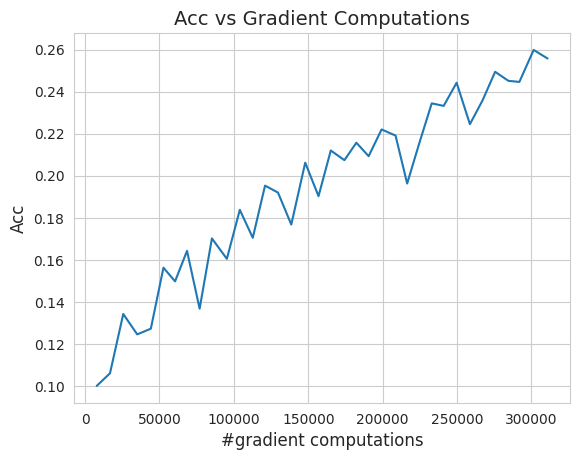

Training: 100%|██████████| 195/195 [00:02<00:00, 87.75it/s, loss=2.0847]


Epoch 37: val_acc=0.23507612943649292


Training: 100%|██████████| 195/195 [00:02<00:00, 84.84it/s, loss=1.7063]


Epoch 38: val_acc=0.24929888546466827


Training: 100%|██████████| 195/195 [00:02<00:00, 83.65it/s, loss=1.7702]


Epoch 39: val_acc=0.24338942766189575


Training: 100%|██████████| 195/195 [00:02<00:00, 88.92it/s, loss=2.2174] 


Epoch 40: val_acc=0.22345753014087677


Training: 100%|██████████| 195/195 [00:02<00:00, 89.53it/s, loss=1.6519] 


Epoch 41: val_acc=0.2637219727039337


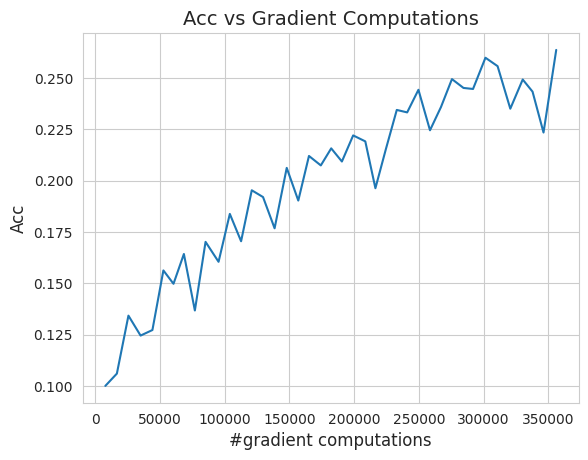

Training: 100%|██████████| 195/195 [00:02<00:00, 86.17it/s, loss=4.9453]


Epoch 42: val_acc=0.23898237943649292


Training: 100%|██████████| 195/195 [00:02<00:00, 84.57it/s, loss=1.9938] 


Epoch 43: val_acc=0.23778045177459717


Training: 100%|██████████| 195/195 [00:02<00:00, 85.59it/s, loss=1.9918]


Epoch 44: val_acc=0.2764423191547394


Training: 100%|██████████| 195/195 [00:02<00:00, 84.68it/s, loss=1.8148]


Epoch 45: val_acc=0.2650240361690521


Training: 100%|██████████| 195/195 [00:02<00:00, 86.79it/s, loss=2.0284] 


Epoch 46: val_acc=0.26462340354919434


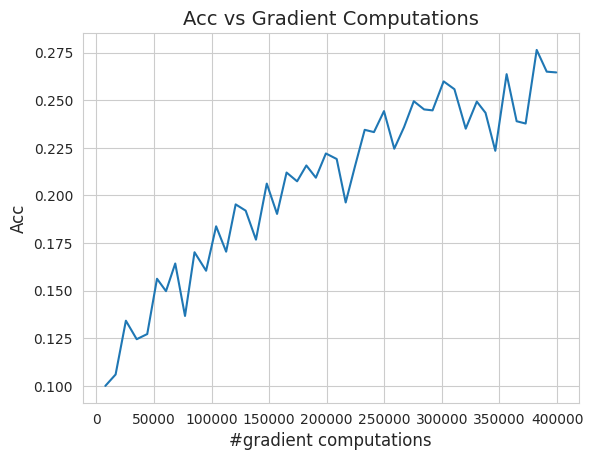

Training: 100%|██████████| 195/195 [00:02<00:00, 87.01it/s, loss=2.4796] 


Epoch 47: val_acc=0.22516025602817535


Training: 100%|██████████| 195/195 [00:02<00:00, 88.00it/s, loss=1.9931] 


Epoch 48: val_acc=0.2706330120563507


Training: 100%|██████████| 195/195 [00:02<00:00, 85.84it/s, loss=2.1949]


Epoch 49: val_acc=0.2730368673801422


Training: 100%|██████████| 195/195 [00:02<00:00, 88.19it/s, loss=5.5856]


Epoch 50: val_acc=0.2728365361690521


Training: 100%|██████████| 195/195 [00:02<00:00, 85.31it/s, loss=2.0066]


Epoch 51: val_acc=0.282151460647583


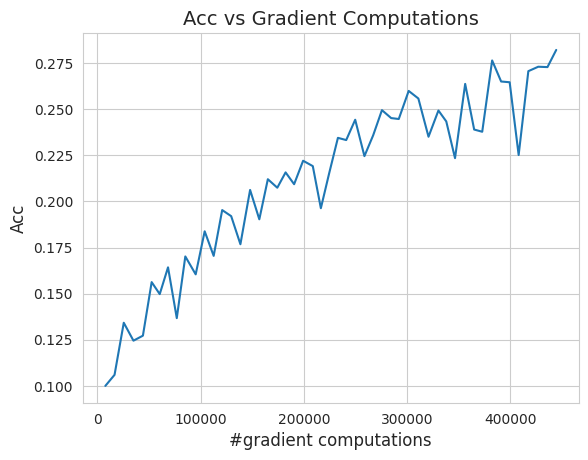

Training: 100%|██████████| 195/195 [00:02<00:00, 85.84it/s, loss=2.1496]


Epoch 52: val_acc=0.27914664149284363


Training: 100%|██████████| 195/195 [00:02<00:00, 87.47it/s, loss=2.3040]


Epoch 53: val_acc=0.2550080120563507


Training: 100%|██████████| 195/195 [00:02<00:00, 86.18it/s, loss=1.7721]


Epoch 54: val_acc=0.2725360691547394


Training: 100%|██████████| 195/195 [00:02<00:00, 85.56it/s, loss=2.1420]


Epoch 55: val_acc=0.28285256028175354


Training: 100%|██████████| 195/195 [00:02<00:00, 86.02it/s, loss=2.0897] 


Epoch 56: val_acc=0.2741386294364929


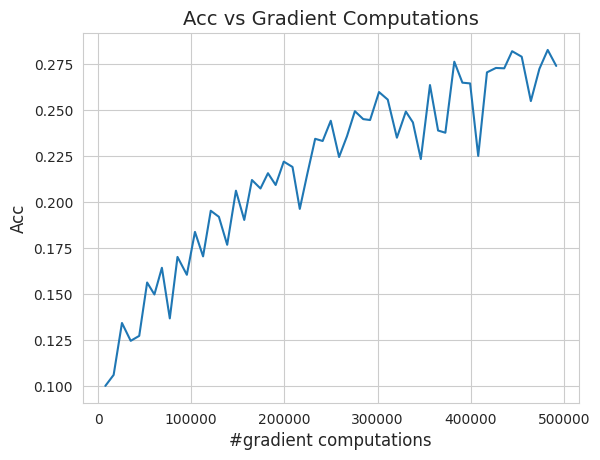

Training: 100%|██████████| 195/195 [00:02<00:00, 85.39it/s, loss=1.8880]


Epoch 57: val_acc=0.2795472741127014


Training: 100%|██████████| 195/195 [00:02<00:00, 85.80it/s, loss=1.7495] 


Epoch 58: val_acc=0.2799479067325592


Training: 100%|██████████| 195/195 [00:02<00:00, 84.26it/s, loss=2.1284]


Epoch 59: val_acc=0.2691306173801422


Training: 100%|██████████| 195/195 [00:02<00:00, 87.53it/s, loss=1.5645]


Epoch 60: val_acc=0.2706330120563507


Training: 100%|██████████| 195/195 [00:02<00:00, 82.98it/s, loss=2.9694]


Epoch 61: val_acc=0.2875601053237915


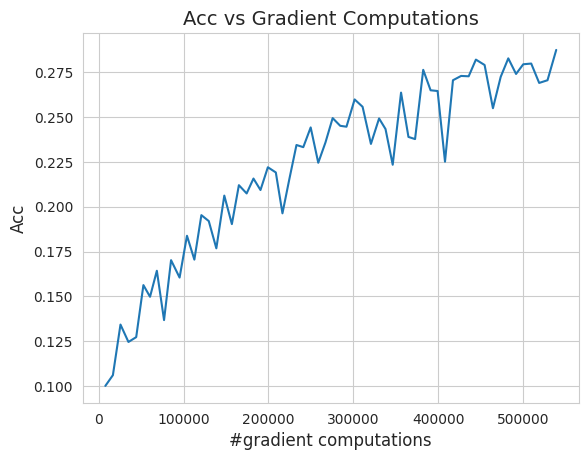

Training: 100%|██████████| 195/195 [00:02<00:00, 88.04it/s, loss=2.2670]


Epoch 62: val_acc=0.23687900602817535


Training: 100%|██████████| 195/195 [00:02<00:00, 86.03it/s, loss=2.7180]


Epoch 63: val_acc=0.29136618971824646


Training: 100%|██████████| 195/195 [00:02<00:00, 87.77it/s, loss=2.1373]
2025-05-23 07:08:19.212789: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 64: val_acc=0.2845552861690521


Training: 100%|██████████| 195/195 [00:02<00:00, 88.02it/s, loss=2.1027]


Epoch 65: val_acc=0.2790464758872986


Training: 100%|██████████| 195/195 [00:02<00:00, 89.60it/s, loss=1.9995] 


Epoch 66: val_acc=0.2916666567325592


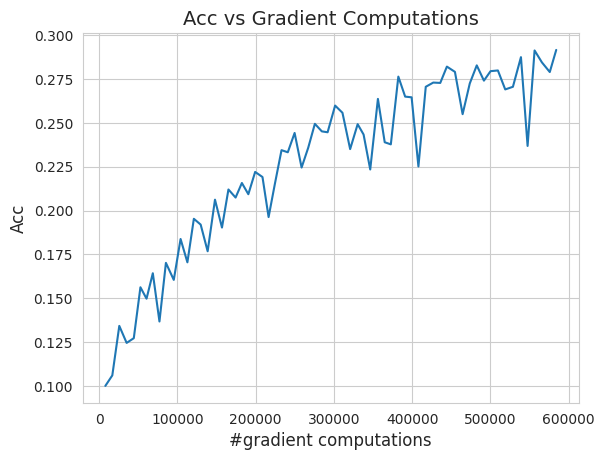

Training: 100%|██████████| 195/195 [00:02<00:00, 85.11it/s, loss=1.8306]


Epoch 67: val_acc=0.25620993971824646


Training: 100%|██████████| 195/195 [00:02<00:00, 86.95it/s, loss=1.6724] 


Epoch 68: val_acc=0.2654246687889099


Training: 100%|██████████| 195/195 [00:02<00:00, 88.72it/s, loss=1.6662]


Epoch 69: val_acc=0.29567307233810425


Training: 100%|██████████| 195/195 [00:02<00:00, 87.89it/s, loss=1.5654] 


Epoch 70: val_acc=0.29767629504203796


Training: 100%|██████████| 195/195 [00:02<00:00, 87.56it/s, loss=1.9369]


Epoch 71: val_acc=0.28635817766189575


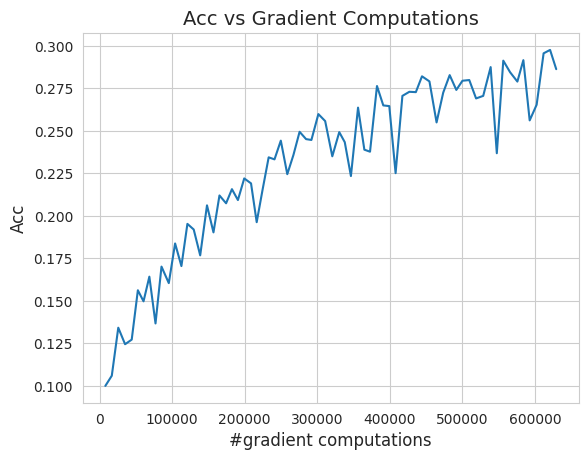

Training: 100%|██████████| 195/195 [00:02<00:00, 87.61it/s, loss=1.7322]


Epoch 72: val_acc=0.2766426205635071


Training: 100%|██████████| 195/195 [00:02<00:00, 87.45it/s, loss=1.5557]


Epoch 73: val_acc=0.28024840354919434


Training: 100%|██████████| 195/195 [00:02<00:00, 88.27it/s, loss=1.7113]


Epoch 74: val_acc=0.28856170177459717


Training: 100%|██████████| 195/195 [00:02<00:00, 88.41it/s, loss=1.7463]


Epoch 75: val_acc=0.2957732379436493


Training: 100%|██████████| 195/195 [00:02<00:00, 85.00it/s, loss=1.9959]


Epoch 76: val_acc=0.2701322138309479


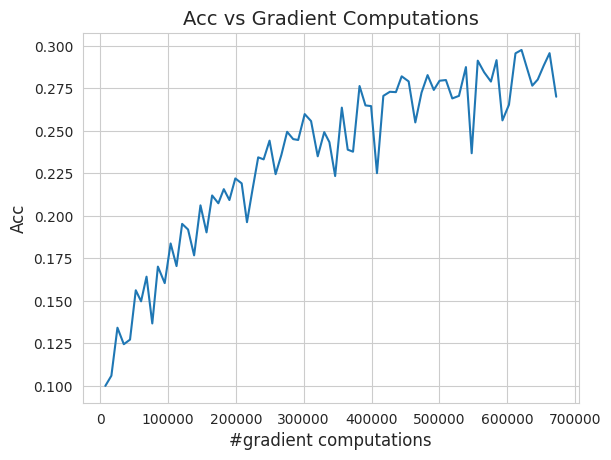

Training: 100%|██████████| 195/195 [00:02<00:00, 86.98it/s, loss=2.4806] 


Epoch 77: val_acc=0.30759215354919434


Training: 100%|██████████| 195/195 [00:02<00:00, 85.83it/s, loss=2.1693]


Epoch 78: val_acc=0.3003806173801422


Training: 100%|██████████| 195/195 [00:02<00:00, 92.89it/s, loss=2.0151] 


Epoch 79: val_acc=0.2981770932674408


Training: 100%|██████████| 195/195 [00:02<00:00, 87.19it/s, loss=1.6873]


Epoch 80: val_acc=0.3039863705635071


Training: 100%|██████████| 195/195 [00:02<00:00, 83.09it/s, loss=1.8520]


Epoch 81: val_acc=0.30198317766189575


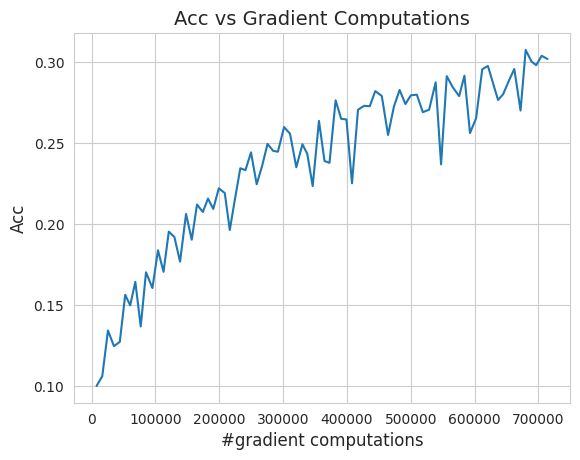

Training: 100%|██████████| 195/195 [00:02<00:00, 85.57it/s, loss=2.1082]


Epoch 82: val_acc=0.30418670177459717


Training: 100%|██████████| 195/195 [00:02<00:00, 86.78it/s, loss=1.9833]


Epoch 83: val_acc=0.30829328298568726


Training: 100%|██████████| 195/195 [00:02<00:00, 88.94it/s, loss=1.8768]


Epoch 84: val_acc=0.30048078298568726


Training: 100%|██████████| 195/195 [00:02<00:00, 89.54it/s, loss=2.2523]


Epoch 85: val_acc=0.26292067766189575


Training: 100%|██████████| 195/195 [00:02<00:00, 88.21it/s, loss=2.8441] 


Epoch 86: val_acc=0.2565104067325592


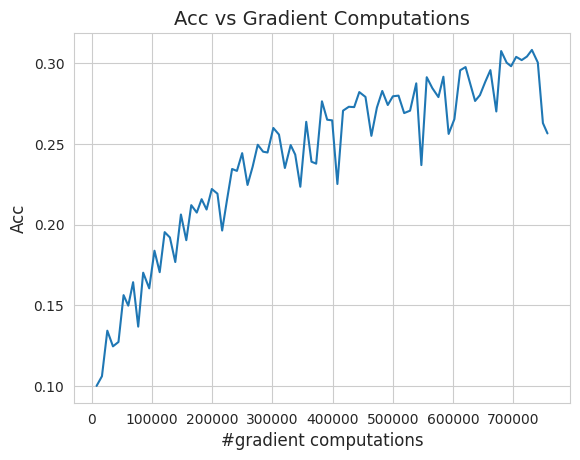

Training: 100%|██████████| 195/195 [00:02<00:00, 85.10it/s, loss=2.5642]


Epoch 87: val_acc=0.24649439752101898


Training: 100%|██████████| 195/195 [00:02<00:00, 83.86it/s, loss=1.8325]


Epoch 88: val_acc=0.30348557233810425


Training: 100%|██████████| 195/195 [00:02<00:00, 84.79it/s, loss=1.7452]


Epoch 89: val_acc=0.3029847741127014


Training: 100%|██████████| 195/195 [00:02<00:00, 87.67it/s, loss=1.8018]


Epoch 90: val_acc=0.3046875


Training: 100%|██████████| 195/195 [00:02<00:00, 87.50it/s, loss=2.0147]


Epoch 91: val_acc=0.31830930709838867


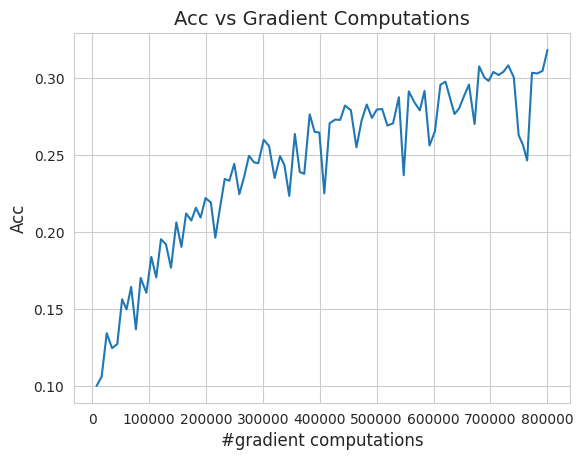

Training: 100%|██████████| 195/195 [00:02<00:00, 87.29it/s, loss=1.9703]


Epoch 92: val_acc=0.3013822138309479


Training: 100%|██████████| 195/195 [00:02<00:00, 87.44it/s, loss=2.4603]


Epoch 93: val_acc=0.3113982379436493


Training: 100%|██████████| 195/195 [00:02<00:00, 86.93it/s, loss=2.0838]


Epoch 94: val_acc=0.30568909645080566


Training: 100%|██████████| 195/195 [00:02<00:00, 87.66it/s, loss=2.1745]


Epoch 95: val_acc=0.3000801205635071


Training: 100%|██████████| 195/195 [00:02<00:00, 86.14it/s, loss=1.9083]


Epoch 96: val_acc=0.31690704822540283


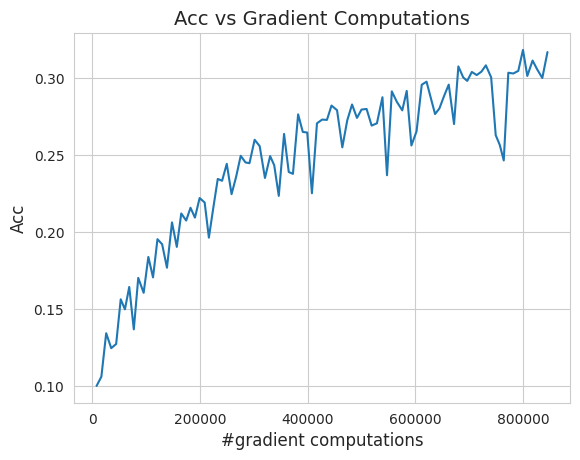

Training: 100%|██████████| 195/195 [00:02<00:00, 82.79it/s, loss=1.5320]


Epoch 97: val_acc=0.3235176205635071


Training: 100%|██████████| 195/195 [00:02<00:00, 93.20it/s, loss=1.7747]


Epoch 98: val_acc=0.3201121687889099


Training: 100%|██████████| 195/195 [00:02<00:00, 85.06it/s, loss=1.9914]


Epoch 99: val_acc=0.3081931173801422


Training: 100%|██████████| 195/195 [00:02<00:00, 92.88it/s, loss=2.0849] 


Epoch 100: val_acc=0.32912659645080566


Training: 100%|██████████| 195/195 [00:02<00:00, 85.78it/s, loss=3.2900]


Epoch 101: val_acc=0.30478766560554504


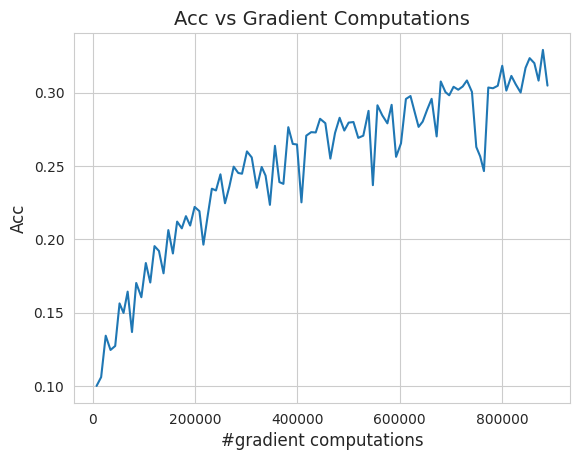

Training: 100%|██████████| 195/195 [00:02<00:00, 86.31it/s, loss=1.6199]


Epoch 102: val_acc=0.3059895932674408


Training: 100%|██████████| 195/195 [00:02<00:00, 88.20it/s, loss=2.0668]


Epoch 103: val_acc=0.31690704822540283


Training: 100%|██████████| 195/195 [00:02<00:00, 84.34it/s, loss=1.8669]


Epoch 104: val_acc=0.31820914149284363


Training: 100%|██████████| 195/195 [00:02<00:00, 87.68it/s, loss=2.1529] 


Epoch 105: val_acc=0.3145032227039337


Training: 100%|██████████| 195/195 [00:02<00:00, 89.77it/s, loss=1.7005]


Epoch 106: val_acc=0.3231169879436493


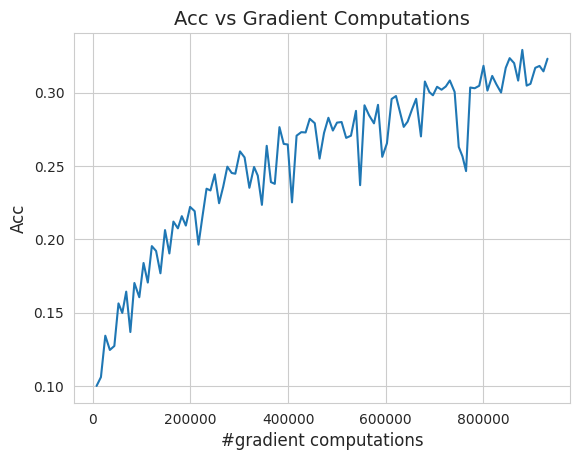

Training: 100%|██████████| 195/195 [00:02<00:00, 88.03it/s, loss=1.8845]


Epoch 107: val_acc=0.3157051205635071


Training: 100%|██████████| 195/195 [00:02<00:00, 88.84it/s, loss=1.9855]


Epoch 108: val_acc=0.32782453298568726


Training: 100%|██████████| 195/195 [00:02<00:00, 91.02it/s, loss=2.0740] 


Epoch 109: val_acc=0.3096955120563507


Training: 100%|██████████| 195/195 [00:02<00:00, 89.79it/s, loss=1.8957] 


Epoch 110: val_acc=0.3081931173801422


Training: 100%|██████████| 195/195 [00:02<00:00, 86.29it/s, loss=1.9118]


Epoch 111: val_acc=0.3188101053237915


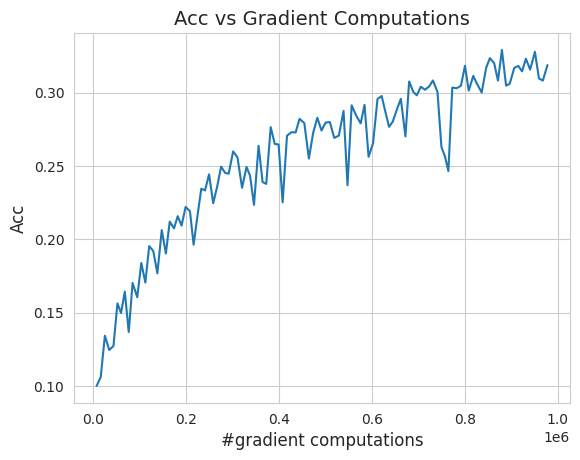

Training: 100%|██████████| 195/195 [00:02<00:00, 86.57it/s, loss=1.5912]


Epoch 112: val_acc=0.32321715354919434


Training: 100%|██████████| 195/195 [00:02<00:00, 91.90it/s, loss=1.6495] 


Epoch 113: val_acc=0.32762420177459717


Training: 100%|██████████| 195/195 [00:02<00:00, 87.43it/s, loss=2.2026] 


Epoch 114: val_acc=0.30088141560554504


Training: 100%|██████████| 195/195 [00:02<00:00, 86.57it/s, loss=1.6687]


Epoch 115: val_acc=0.3273237347602844


Training: 100%|██████████| 195/195 [00:02<00:00, 85.70it/s, loss=1.8913]


Epoch 116: val_acc=0.33153045177459717


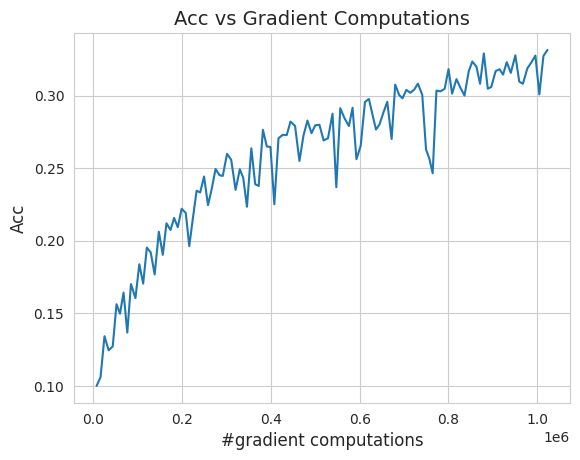

Training: 100%|██████████| 195/195 [00:02<00:00, 84.70it/s, loss=1.7503]


Epoch 117: val_acc=0.3357371985912323


Training: 100%|██████████| 195/195 [00:02<00:00, 86.03it/s, loss=1.9646] 


Epoch 118: val_acc=0.3050881326198578


Training: 100%|██████████| 195/195 [00:02<00:00, 88.89it/s, loss=1.9824]


Epoch 119: val_acc=0.33203125


Training: 100%|██████████| 195/195 [00:02<00:00, 85.03it/s, loss=1.6912]


Epoch 120: val_acc=0.3288261294364929


Training: 100%|██████████| 195/195 [00:02<00:00, 84.95it/s, loss=2.2372]


Epoch 121: val_acc=0.2875601053237915


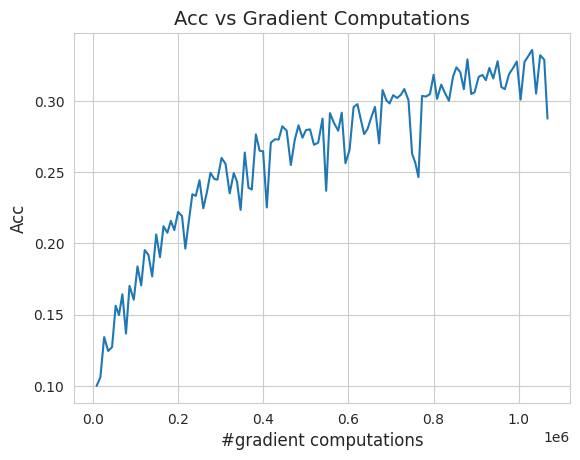

Training: 100%|██████████| 195/195 [00:02<00:00, 89.71it/s, loss=1.7743]


Epoch 122: val_acc=0.3266226053237915


Training: 100%|██████████| 195/195 [00:02<00:00, 84.80it/s, loss=1.7027]


Epoch 123: val_acc=0.3296273946762085


Training: 100%|██████████| 195/195 [00:02<00:00, 87.20it/s, loss=1.5834]


Epoch 124: val_acc=0.32972756028175354


Training: 100%|██████████| 195/195 [00:02<00:00, 84.97it/s, loss=2.0227]


Epoch 125: val_acc=0.3273237347602844


Training: 100%|██████████| 195/195 [00:02<00:00, 91.19it/s, loss=2.0014]


Epoch 126: val_acc=0.31690704822540283


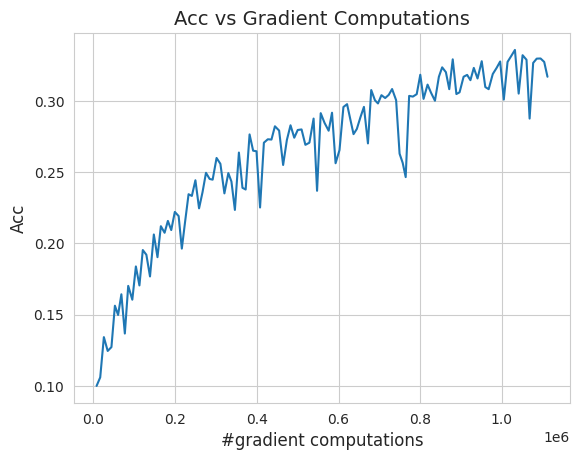

Training: 100%|██████████| 195/195 [00:02<00:00, 90.76it/s, loss=1.7816] 


Epoch 127: val_acc=0.33974358439445496


Training: 100%|██████████| 195/195 [00:02<00:00, 86.38it/s, loss=1.5093]
2025-05-23 07:10:57.644078: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 128: val_acc=0.3376402258872986


Training: 100%|██████████| 195/195 [00:02<00:00, 85.74it/s, loss=1.4655]


Epoch 129: val_acc=0.33283254504203796


Training: 100%|██████████| 195/195 [00:02<00:00, 89.11it/s, loss=1.7705]


Epoch 130: val_acc=0.3179086446762085


Training: 100%|██████████| 195/195 [00:02<00:00, 85.26it/s, loss=1.8674]


Epoch 131: val_acc=0.32602164149284363


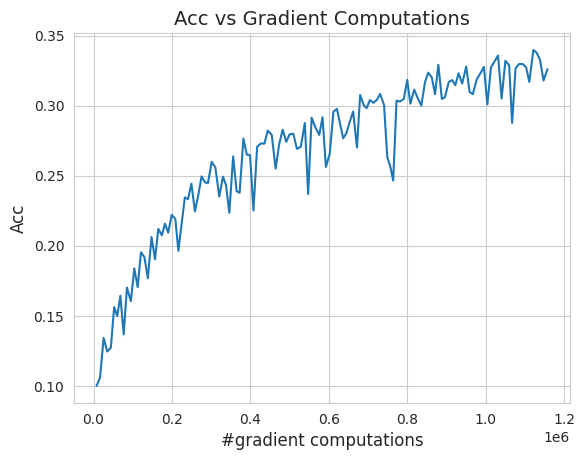

Training: 100%|██████████| 195/195 [00:02<00:00, 86.21it/s, loss=1.7597]


Epoch 132: val_acc=0.32822516560554504


Training: 100%|██████████| 195/195 [00:02<00:00, 86.56it/s, loss=1.9632]


Epoch 133: val_acc=0.33784055709838867


Training: 100%|██████████| 195/195 [00:02<00:00, 89.07it/s, loss=1.4640]


Epoch 134: val_acc=0.3385416567325592


Training: 100%|██████████| 195/195 [00:02<00:00, 84.45it/s, loss=2.1668]


Epoch 135: val_acc=0.3333333432674408


Training: 100%|██████████| 195/195 [00:02<00:00, 89.34it/s, loss=1.6542]


Epoch 136: val_acc=0.34324920177459717


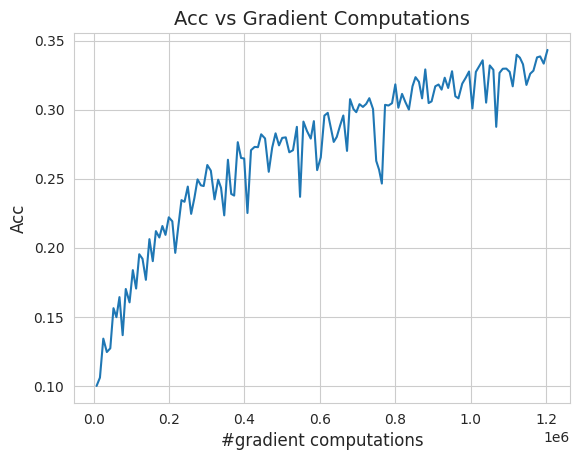

Training: 100%|██████████| 195/195 [00:02<00:00, 89.21it/s, loss=1.8085]


Epoch 137: val_acc=0.3209134638309479


Training: 100%|██████████| 195/195 [00:02<00:00, 87.70it/s, loss=1.5789]


Epoch 138: val_acc=0.3227163553237915


Training: 100%|██████████| 195/195 [00:02<00:00, 83.37it/s, loss=2.1195]


Epoch 139: val_acc=0.33844152092933655


Training: 100%|██████████| 195/195 [00:02<00:00, 85.02it/s, loss=1.6813]


Epoch 140: val_acc=0.3318309485912323


Training: 100%|██████████| 195/195 [00:02<00:00, 86.67it/s, loss=1.7606]


Epoch 141: val_acc=0.3465544879436493


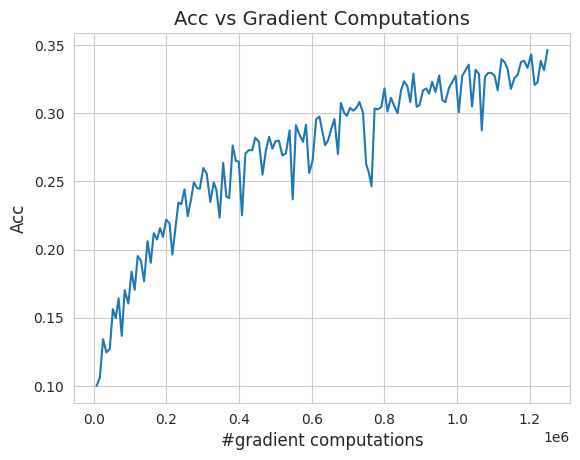

Training: 100%|██████████| 195/195 [00:02<00:00, 85.06it/s, loss=1.7788]


Epoch 142: val_acc=0.34254807233810425


Training: 100%|██████████| 195/195 [00:02<00:00, 86.18it/s, loss=1.7811]


Epoch 143: val_acc=0.3381410241127014


Training: 100%|██████████| 195/195 [00:02<00:00, 84.05it/s, loss=1.7086]


Epoch 144: val_acc=0.33693909645080566


Training: 100%|██████████| 195/195 [00:02<00:00, 89.02it/s, loss=1.8467]


Epoch 145: val_acc=0.26382210850715637


Training: 100%|██████████| 195/195 [00:02<00:00, 91.15it/s, loss=1.4811]


Epoch 146: val_acc=0.3474559485912323


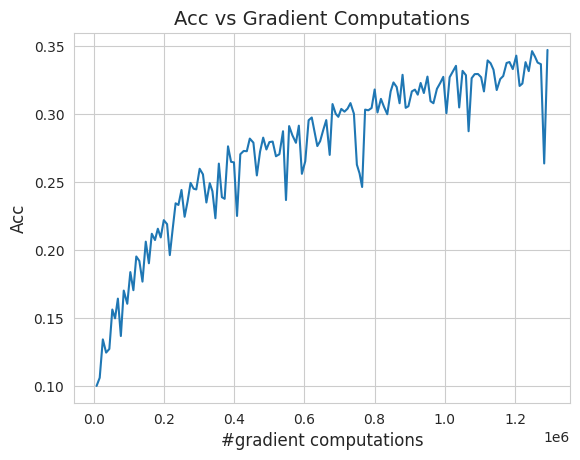

Training: 100%|██████████| 195/195 [00:02<00:00, 89.68it/s, loss=1.7642]


Epoch 147: val_acc=0.34375


Training: 100%|██████████| 195/195 [00:02<00:00, 86.90it/s, loss=1.7755]


Epoch 148: val_acc=0.31800881028175354


Training: 100%|██████████| 195/195 [00:02<00:00, 85.34it/s, loss=2.0478]


Epoch 149: val_acc=0.325120210647583


Training: 100%|██████████| 195/195 [00:02<00:00, 88.39it/s, loss=1.6414]


Epoch 150: val_acc=0.33343350887298584


Training: 100%|██████████| 195/195 [00:02<00:00, 85.17it/s, loss=1.7597]


Epoch 151: val_acc=0.3415464758872986


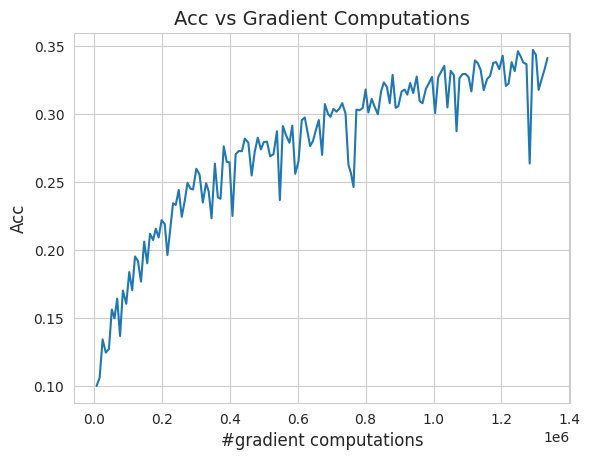

Training: 100%|██████████| 195/195 [00:02<00:00, 86.73it/s, loss=1.7587]


Epoch 152: val_acc=0.35036057233810425


Training: 100%|██████████| 195/195 [00:02<00:00, 87.14it/s, loss=1.6305]


Epoch 153: val_acc=0.34535256028175354


Training: 100%|██████████| 195/195 [00:02<00:00, 86.69it/s, loss=1.4996]


Epoch 154: val_acc=0.3363381326198578


Training: 100%|██████████| 195/195 [00:02<00:00, 88.54it/s, loss=1.9950]


Epoch 155: val_acc=0.2998798191547394


Training: 100%|██████████| 195/195 [00:02<00:00, 89.57it/s, loss=1.9775]


Epoch 156: val_acc=0.34214743971824646


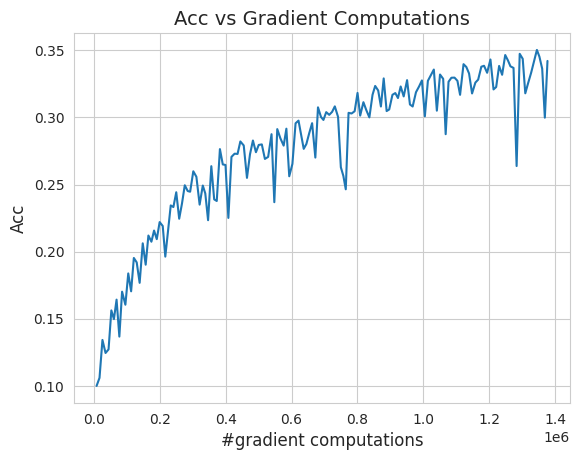

Training: 100%|██████████| 195/195 [00:02<00:00, 86.41it/s, loss=1.8546]


Epoch 157: val_acc=0.34344953298568726


Training: 100%|██████████| 195/195 [00:02<00:00, 86.68it/s, loss=2.0123]


Epoch 158: val_acc=0.336838960647583


Training: 100%|██████████| 195/195 [00:02<00:00, 85.02it/s, loss=1.2946]


Epoch 159: val_acc=0.3426482379436493


Training: 100%|██████████| 195/195 [00:02<00:00, 84.83it/s, loss=1.9369]


Epoch 160: val_acc=0.3428485691547394


Training: 100%|██████████| 195/195 [00:02<00:00, 87.35it/s, loss=1.9326]


Epoch 161: val_acc=0.3441506326198578


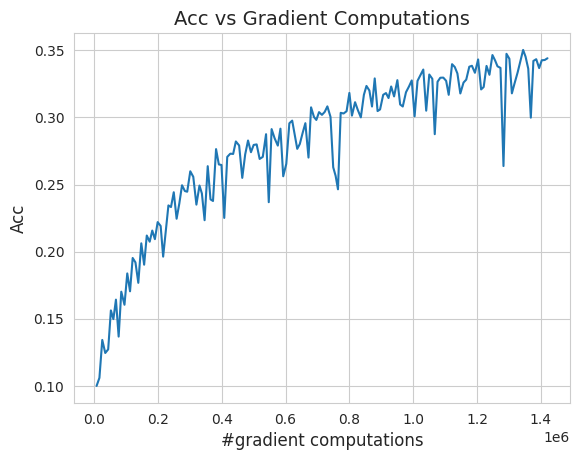

Training: 100%|██████████| 195/195 [00:02<00:00, 85.62it/s, loss=1.7179]


Epoch 162: val_acc=0.3422476053237915


Training: 100%|██████████| 195/195 [00:02<00:00, 85.69it/s, loss=1.3859]


Epoch 163: val_acc=0.34425079822540283


Training: 100%|██████████| 195/195 [00:02<00:00, 84.98it/s, loss=1.6817]


Epoch 164: val_acc=0.33733975887298584


Training: 100%|██████████| 195/195 [00:02<00:00, 88.42it/s, loss=1.5321]


Epoch 165: val_acc=0.34124600887298584


Training: 100%|██████████| 195/195 [00:02<00:00, 86.55it/s, loss=2.1241]


Epoch 166: val_acc=0.3413461446762085


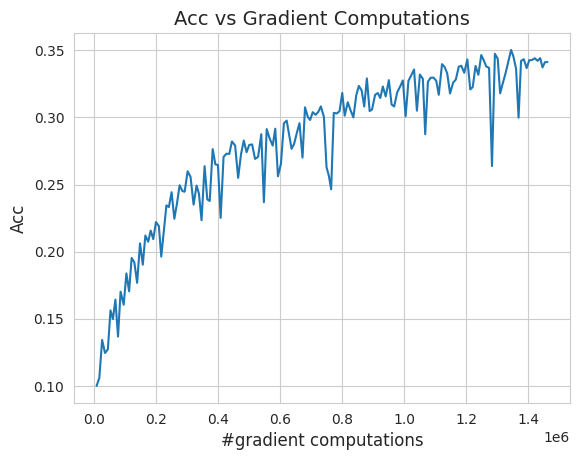

Training: 100%|██████████| 195/195 [00:02<00:00, 89.37it/s, loss=1.7988]


Epoch 167: val_acc=0.34555289149284363


Training: 100%|██████████| 195/195 [00:02<00:00, 86.56it/s, loss=1.2370]


Epoch 168: val_acc=0.32782453298568726


Training: 100%|██████████| 195/195 [00:02<00:00, 91.51it/s, loss=2.0140] 


Epoch 169: val_acc=0.34174680709838867


Training: 100%|██████████| 195/195 [00:02<00:00, 85.03it/s, loss=1.7867]


Epoch 170: val_acc=0.3361378312110901


Training: 100%|██████████| 195/195 [00:02<00:00, 84.94it/s, loss=1.7639]


Epoch 171: val_acc=0.3155048191547394


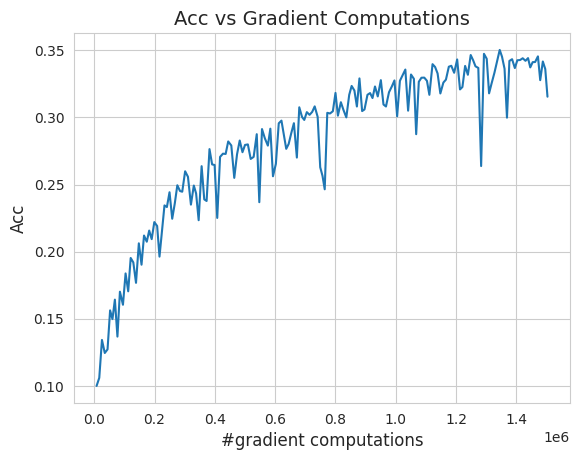

Training: 100%|██████████| 195/195 [00:02<00:00, 85.70it/s, loss=1.7618]


Epoch 172: val_acc=0.3428485691547394


Training: 100%|██████████| 195/195 [00:02<00:00, 84.37it/s, loss=1.8480]


Epoch 173: val_acc=0.3236177861690521


Training: 100%|██████████| 195/195 [00:02<00:00, 88.47it/s, loss=1.5139]


Epoch 174: val_acc=0.34795674681663513


Training: 100%|██████████| 195/195 [00:02<00:00, 83.89it/s, loss=1.7819]


Epoch 175: val_acc=0.3502604067325592


Training: 100%|██████████| 195/195 [00:02<00:00, 92.82it/s, loss=1.8769]


Epoch 176: val_acc=0.34815704822540283


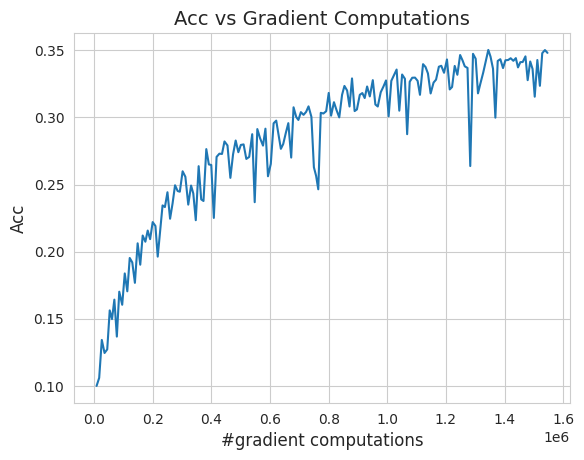

Training: 100%|██████████| 195/195 [00:02<00:00, 87.93it/s, loss=1.4473] 


Epoch 177: val_acc=0.34214743971824646


Training: 100%|██████████| 195/195 [00:02<00:00, 85.96it/s, loss=1.4179]


Epoch 178: val_acc=0.3530648946762085


Training: 100%|██████████| 195/195 [00:02<00:00, 89.95it/s, loss=1.7343]


Epoch 179: val_acc=0.3509615361690521


Training: 100%|██████████| 195/195 [00:02<00:00, 86.00it/s, loss=1.7522]


Epoch 180: val_acc=0.3372395932674408


Training: 100%|██████████| 195/195 [00:02<00:00, 90.73it/s, loss=1.5659] 


Epoch 181: val_acc=0.35406652092933655


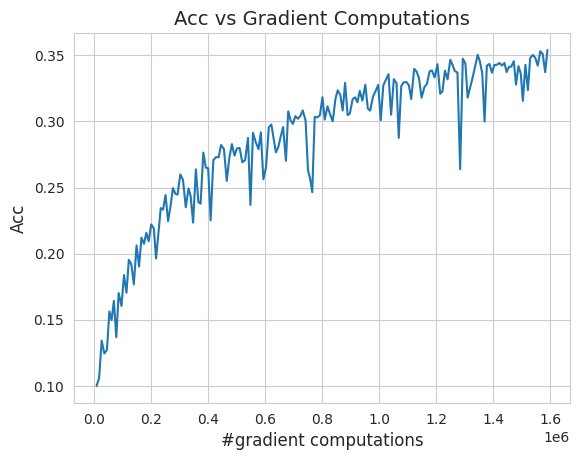

Training: 100%|██████████| 195/195 [00:02<00:00, 84.88it/s, loss=1.4665]


Epoch 182: val_acc=0.34605368971824646


Training: 100%|██████████| 195/195 [00:02<00:00, 86.10it/s, loss=1.7501]


Epoch 183: val_acc=0.35206329822540283


Training: 100%|██████████| 195/195 [00:02<00:00, 90.58it/s, loss=1.8026] 


Epoch 184: val_acc=0.35687100887298584


Training: 100%|██████████| 195/195 [00:02<00:00, 87.38it/s, loss=1.4670] 


Epoch 185: val_acc=0.3576722741127014


Training: 100%|██████████| 195/195 [00:02<00:00, 86.95it/s, loss=1.9655]


Epoch 186: val_acc=0.33984375


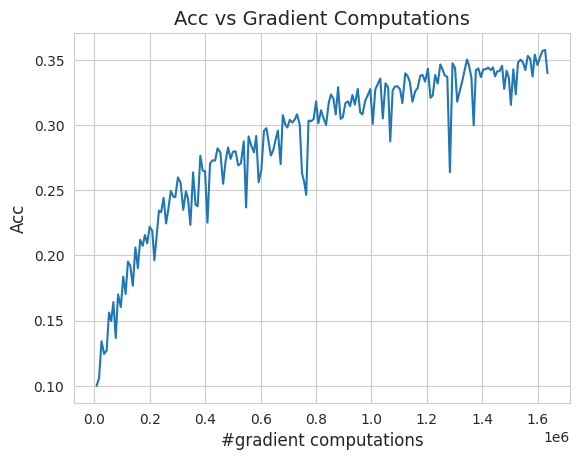

Training: 100%|██████████| 195/195 [00:02<00:00, 84.39it/s, loss=1.7027]


Epoch 187: val_acc=0.34455129504203796


Training: 100%|██████████| 195/195 [00:02<00:00, 84.96it/s, loss=1.4538]


Epoch 188: val_acc=0.3483573794364929


Training: 100%|██████████| 195/195 [00:02<00:00, 86.20it/s, loss=1.9096]


Epoch 189: val_acc=0.33473557233810425


Training: 100%|██████████| 195/195 [00:02<00:00, 86.98it/s, loss=1.9377]


Epoch 190: val_acc=0.3519631326198578


Training: 100%|██████████| 195/195 [00:02<00:00, 87.72it/s, loss=1.6064]


Epoch 191: val_acc=0.34795674681663513


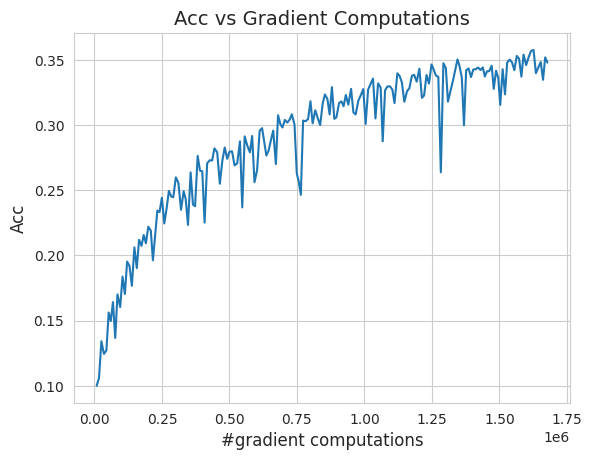

Training: 100%|██████████| 195/195 [00:02<00:00, 87.82it/s, loss=1.5572]


Epoch 192: val_acc=0.35837340354919434


Training: 100%|██████████| 195/195 [00:02<00:00, 90.28it/s, loss=1.4926] 


Epoch 193: val_acc=0.35737180709838867


Training: 100%|██████████| 195/195 [00:02<00:00, 93.75it/s, loss=1.5331] 


Epoch 194: val_acc=0.3621794879436493


Training: 100%|██████████| 195/195 [00:02<00:00, 86.18it/s, loss=1.7298]


Epoch 195: val_acc=0.33493590354919434


Training: 100%|██████████| 195/195 [00:02<00:00, 87.35it/s, loss=1.4168]


Epoch 196: val_acc=0.36017629504203796


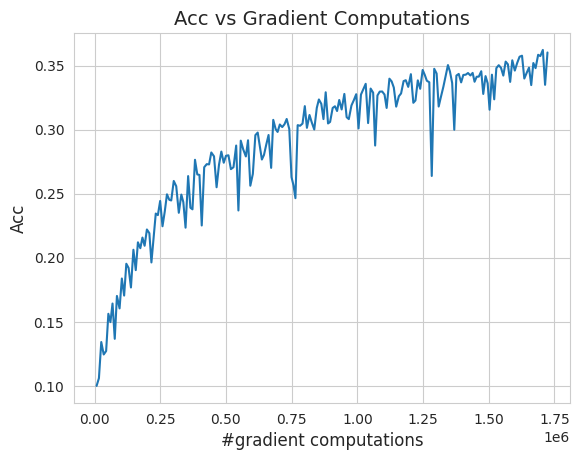

Training: 100%|██████████| 195/195 [00:02<00:00, 89.05it/s, loss=1.4626] 


Epoch 197: val_acc=0.35546875


Training: 100%|██████████| 195/195 [00:02<00:00, 86.76it/s, loss=2.2009]


Epoch 198: val_acc=0.3418469727039337


Training: 100%|██████████| 195/195 [00:02<00:00, 85.47it/s, loss=1.3929]


Epoch 199: val_acc=0.3552684485912323


Training: 100%|██████████| 195/195 [00:02<00:00, 86.60it/s, loss=1.3187]


Epoch 200: val_acc=0.3647836446762085


Training: 100%|██████████| 195/195 [00:02<00:00, 89.92it/s, loss=1.4628] 


Epoch 201: val_acc=0.3636818826198578


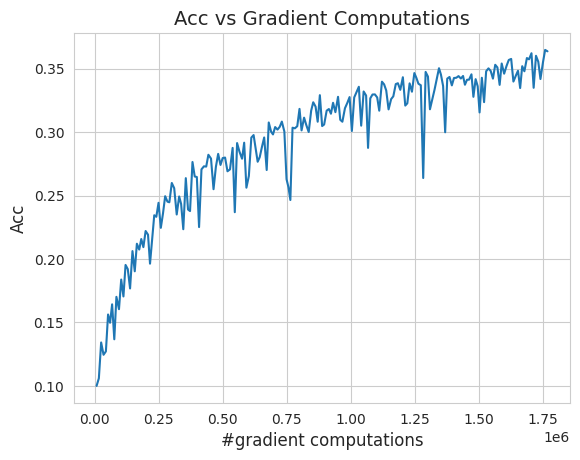

Training: 100%|██████████| 195/195 [00:02<00:00, 86.06it/s, loss=1.8865]


Epoch 202: val_acc=0.35316506028175354


Training: 100%|██████████| 195/195 [00:02<00:00, 88.16it/s, loss=1.6929]


Epoch 203: val_acc=0.3599759638309479


Training: 100%|██████████| 195/195 [00:02<00:00, 87.60it/s, loss=1.3175]


Epoch 204: val_acc=0.36448317766189575


Training: 100%|██████████| 195/195 [00:02<00:00, 88.11it/s, loss=1.5744] 


Epoch 205: val_acc=0.36097756028175354


Training: 100%|██████████| 195/195 [00:02<00:00, 86.26it/s, loss=1.8657]


Epoch 206: val_acc=0.36037659645080566


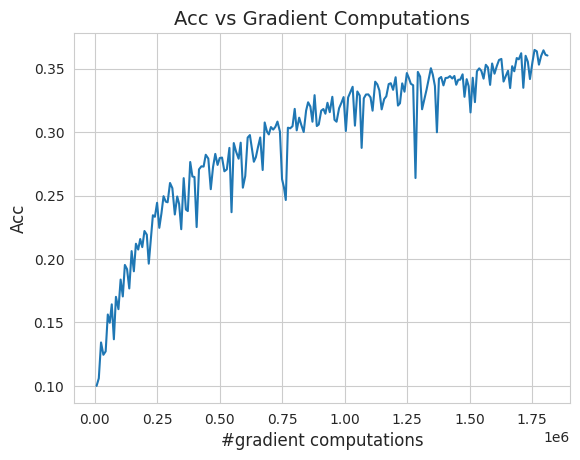

Training: 100%|██████████| 195/195 [00:02<00:00, 85.80it/s, loss=1.4755]


Epoch 207: val_acc=0.36468350887298584


Training: 100%|██████████| 195/195 [00:02<00:00, 84.84it/s, loss=1.6557]


Epoch 208: val_acc=0.35817307233810425


Training: 100%|██████████| 195/195 [00:02<00:00, 86.08it/s, loss=2.1624]


Epoch 209: val_acc=0.3595753312110901


Training: 100%|██████████| 195/195 [00:02<00:00, 86.41it/s, loss=1.4842]


Epoch 210: val_acc=0.36618590354919434


Training: 100%|██████████| 195/195 [00:02<00:00, 83.20it/s, loss=1.5818]


Epoch 211: val_acc=0.3552684485912323


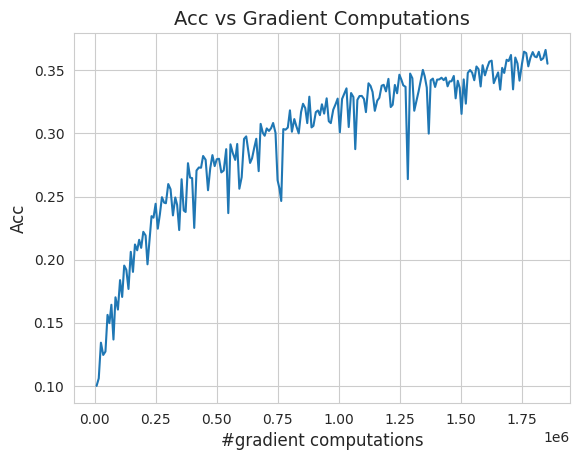

Training: 100%|██████████| 195/195 [00:02<00:00, 87.30it/s, loss=1.5037]


Epoch 212: val_acc=0.3652844727039337


Training: 100%|██████████| 195/195 [00:02<00:00, 91.60it/s, loss=1.8069] 


Epoch 213: val_acc=0.3608773946762085


Training: 100%|██████████| 195/195 [00:02<00:00, 86.33it/s, loss=1.1797]


Epoch 214: val_acc=0.35837340354919434


Training: 100%|██████████| 195/195 [00:02<00:00, 87.74it/s, loss=1.8793]


Epoch 215: val_acc=0.36989182233810425


Training: 100%|██████████| 195/195 [00:02<00:00, 84.52it/s, loss=1.9566]


Epoch 216: val_acc=0.3703926205635071


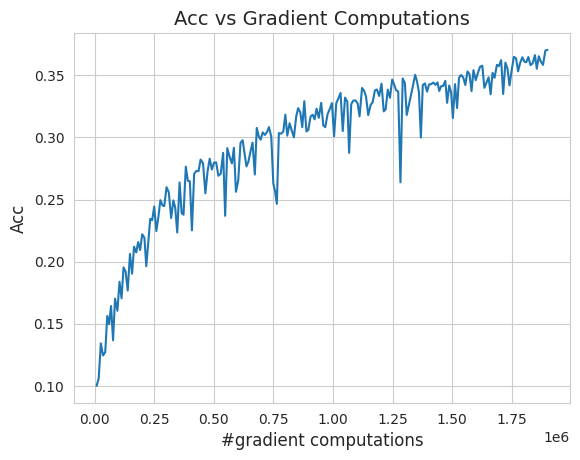

Training: 100%|██████████| 195/195 [00:02<00:00, 94.15it/s, loss=1.1925] 


Epoch 217: val_acc=0.3754006326198578


Training: 100%|██████████| 195/195 [00:02<00:00, 86.59it/s, loss=1.4055]


Epoch 218: val_acc=0.37059295177459717


Training: 100%|██████████| 195/195 [00:02<00:00, 87.12it/s, loss=1.4891]


Epoch 219: val_acc=0.3664863705635071


Training: 100%|██████████| 195/195 [00:02<00:00, 85.44it/s, loss=1.9538]


Epoch 220: val_acc=0.36899039149284363


Training: 100%|██████████| 195/195 [00:02<00:00, 87.23it/s, loss=1.6368]


Epoch 221: val_acc=0.36818909645080566


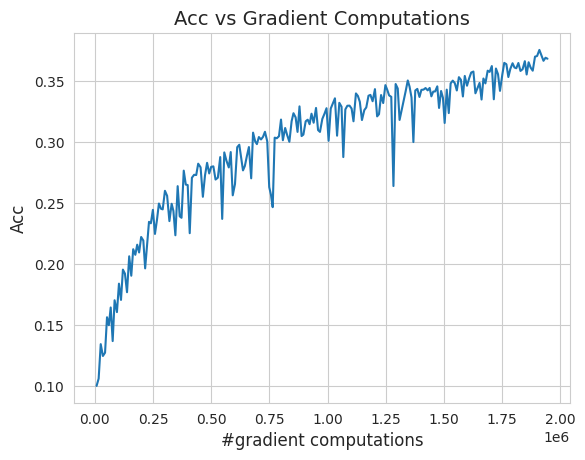

Training: 100%|██████████| 195/195 [00:02<00:00, 85.18it/s, loss=1.7476]


Epoch 222: val_acc=0.3706931173801422


Training: 100%|██████████| 195/195 [00:02<00:00, 84.06it/s, loss=1.8377]


Epoch 223: val_acc=0.3658854067325592


Training: 100%|██████████| 195/195 [00:02<00:00, 85.44it/s, loss=1.5077]


Epoch 224: val_acc=0.3613782227039337


Training: 100%|██████████| 195/195 [00:02<00:00, 84.58it/s, loss=1.8126]


Epoch 225: val_acc=0.37189504504203796


Training: 100%|██████████| 195/195 [00:02<00:00, 86.39it/s, loss=1.8202]


Epoch 226: val_acc=0.36077725887298584


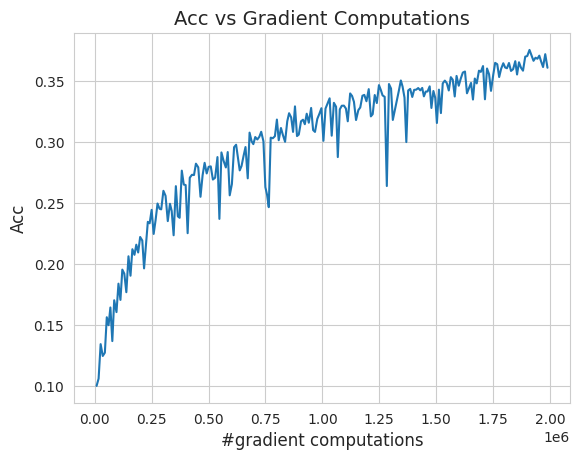

Training: 100%|██████████| 195/195 [00:02<00:00, 84.63it/s, loss=1.8516]


Epoch 227: val_acc=0.3586738705635071


Training: 100%|██████████| 195/195 [00:02<00:00, 84.93it/s, loss=1.6331]


Epoch 228: val_acc=0.3660857379436493


Training: 100%|██████████| 195/195 [00:02<00:00, 84.53it/s, loss=1.5445]


Epoch 229: val_acc=0.3675881326198578


Training: 100%|██████████| 195/195 [00:02<00:00, 86.55it/s, loss=1.4760]


Epoch 230: val_acc=0.36818909645080566


Training: 100%|██████████| 195/195 [00:02<00:00, 88.29it/s, loss=1.6690]


Epoch 231: val_acc=0.35496795177459717


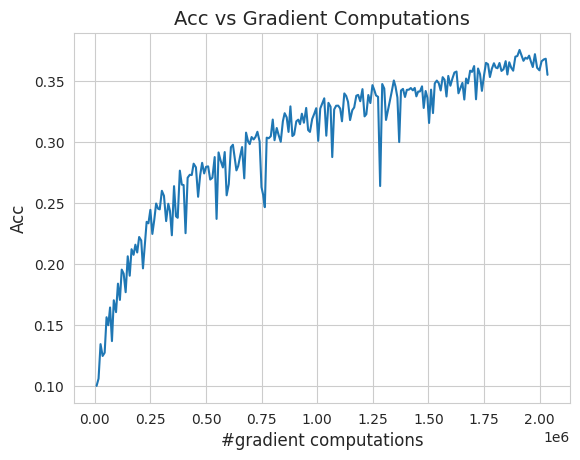

Training: 100%|██████████| 195/195 [00:02<00:00, 84.99it/s, loss=1.7041] 


Epoch 232: val_acc=0.35837340354919434


Training: 100%|██████████| 195/195 [00:02<00:00, 88.36it/s, loss=1.9608]


Epoch 233: val_acc=0.3678886294364929


Training: 100%|██████████| 195/195 [00:02<00:00, 83.94it/s, loss=1.8105]


Epoch 234: val_acc=0.3736979067325592


Training: 100%|██████████| 195/195 [00:02<00:00, 85.04it/s, loss=1.9554]


Epoch 235: val_acc=0.3565705120563507


Training: 100%|██████████| 195/195 [00:02<00:00, 86.78it/s, loss=1.3535]


Epoch 236: val_acc=0.3673878312110901


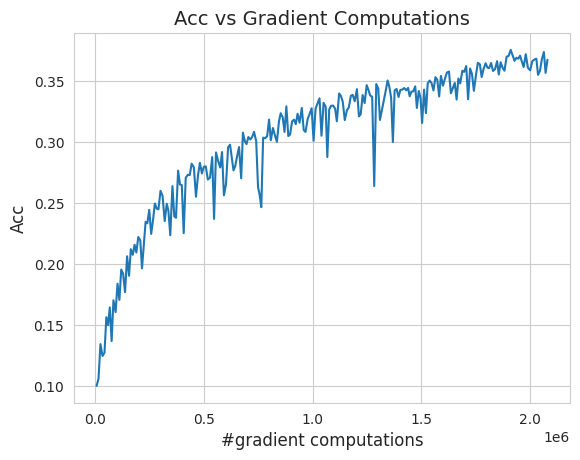

Training: 100%|██████████| 195/195 [00:02<00:00, 87.63it/s, loss=1.3105]


Epoch 237: val_acc=0.3658854067325592


Training: 100%|██████████| 195/195 [00:02<00:00, 85.84it/s, loss=1.7795]


Epoch 238: val_acc=0.36909055709838867


Training: 100%|██████████| 195/195 [00:02<00:00, 88.14it/s, loss=1.6048]


Epoch 239: val_acc=0.3765023946762085


Training: 100%|██████████| 195/195 [00:02<00:00, 84.77it/s, loss=1.3489]


Epoch 240: val_acc=0.37510016560554504


Training: 100%|██████████| 195/195 [00:02<00:00, 88.73it/s, loss=1.1074]


Epoch 241: val_acc=0.37660256028175354


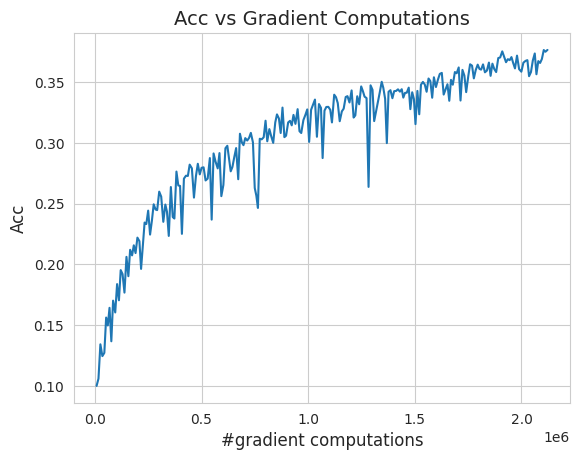

Training: 100%|██████████| 195/195 [00:02<00:00, 88.46it/s, loss=1.5911]


Epoch 242: val_acc=0.36448317766189575


Training: 100%|██████████| 195/195 [00:02<00:00, 84.93it/s, loss=1.5770]


Epoch 243: val_acc=0.37119391560554504


Training: 100%|██████████| 195/195 [00:02<00:00, 86.52it/s, loss=1.8332]


Epoch 244: val_acc=0.37449920177459717


Training: 100%|██████████| 195/195 [00:02<00:00, 87.12it/s, loss=1.3800]


Epoch 245: val_acc=0.38271233439445496


Training: 100%|██████████| 195/195 [00:02<00:00, 94.46it/s, loss=1.5875] 


Epoch 246: val_acc=0.3774038553237915


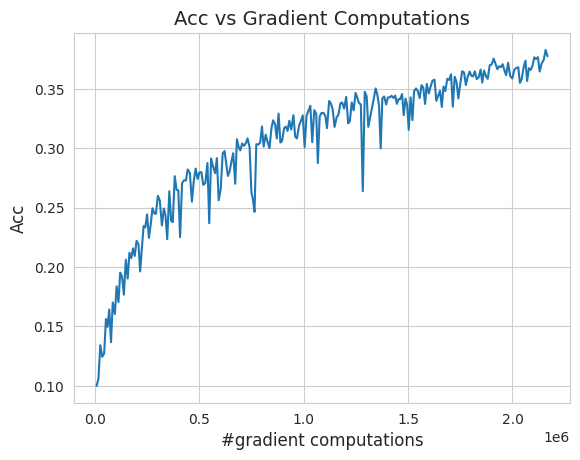

Training: 100%|██████████| 195/195 [00:02<00:00, 85.99it/s, loss=1.6313]


Epoch 247: val_acc=0.3817107379436493


Training: 100%|██████████| 195/195 [00:02<00:00, 86.88it/s, loss=1.0949]


Epoch 248: val_acc=0.37620192766189575


Training: 100%|██████████| 195/195 [00:02<00:00, 90.53it/s, loss=1.5359]


Epoch 249: val_acc=0.3756009638309479


Training: 100%|██████████| 195/195 [00:02<00:00, 85.65it/s, loss=1.8237]


Epoch 250: val_acc=0.3852163553237915


Training: 100%|██████████| 195/195 [00:02<00:00, 85.40it/s, loss=1.5561]


Epoch 251: val_acc=0.3359375


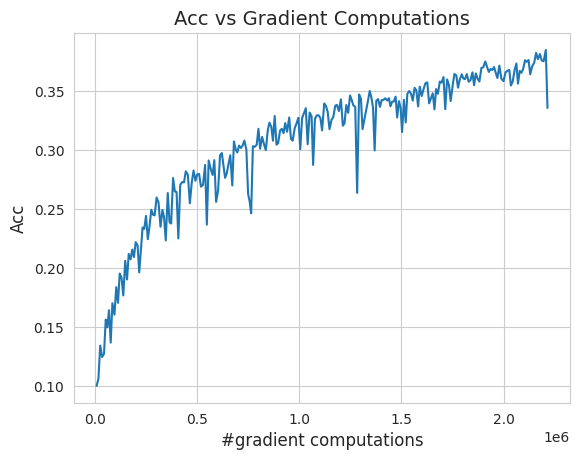

Training: 100%|██████████| 195/195 [00:02<00:00, 90.20it/s, loss=1.4163]


Epoch 252: val_acc=0.37139424681663513


Training: 100%|██████████| 195/195 [00:02<00:00, 88.73it/s, loss=1.1380]


Epoch 253: val_acc=0.3770032227039337


Training: 100%|██████████| 195/195 [00:02<00:00, 84.67it/s, loss=1.7376]


Epoch 254: val_acc=0.3747996985912323


Training: 100%|██████████| 195/195 [00:02<00:00, 85.05it/s, loss=1.5530]


Epoch 255: val_acc=0.37860578298568726


Training: 100%|██████████| 195/195 [00:02<00:00, 89.02it/s, loss=1.5181]


Epoch 256: val_acc=0.3819110691547394


2025-05-23 07:16:15.723913: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


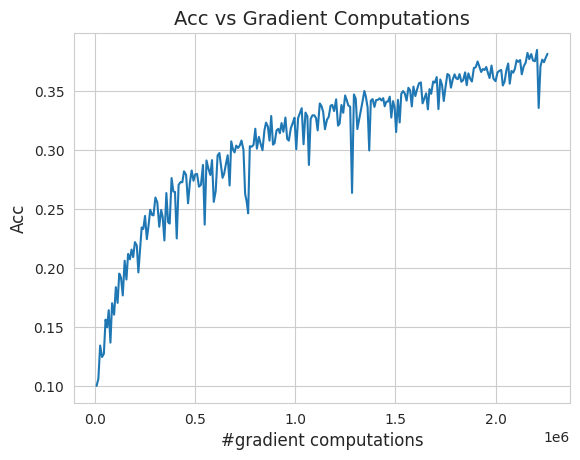

Training: 100%|██████████| 195/195 [00:02<00:00, 91.87it/s, loss=1.4253]


Epoch 257: val_acc=0.37770432233810425


Training: 100%|██████████| 195/195 [00:02<00:00, 86.58it/s, loss=1.2846]


Epoch 258: val_acc=0.38471555709838867


Training: 100%|██████████| 195/195 [00:02<00:00, 84.49it/s, loss=1.4768]


Epoch 259: val_acc=0.3854166865348816


Training: 100%|██████████| 195/195 [00:02<00:00, 85.72it/s, loss=1.6446]


Epoch 260: val_acc=0.37359777092933655


Training: 100%|██████████| 195/195 [00:02<00:00, 86.23it/s, loss=1.3934]


Epoch 261: val_acc=0.3776041567325592


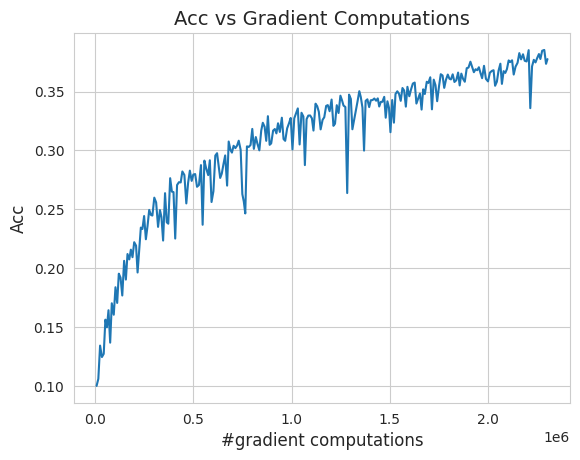

Training: 100%|██████████| 195/195 [00:02<00:00, 88.10it/s, loss=1.5812]


Epoch 262: val_acc=0.38882210850715637


Training: 100%|██████████| 195/195 [00:02<00:00, 85.96it/s, loss=1.4763]


Epoch 263: val_acc=0.3871193826198578


Training: 100%|██████████| 195/195 [00:02<00:00, 87.54it/s, loss=1.5581]


Epoch 264: val_acc=0.37990784645080566


Training: 100%|██████████| 195/195 [00:02<00:00, 83.63it/s, loss=1.8776]


Epoch 265: val_acc=0.38962340354919434


Training: 100%|██████████| 195/195 [00:02<00:00, 87.77it/s, loss=1.7656]


Epoch 266: val_acc=0.39032453298568726


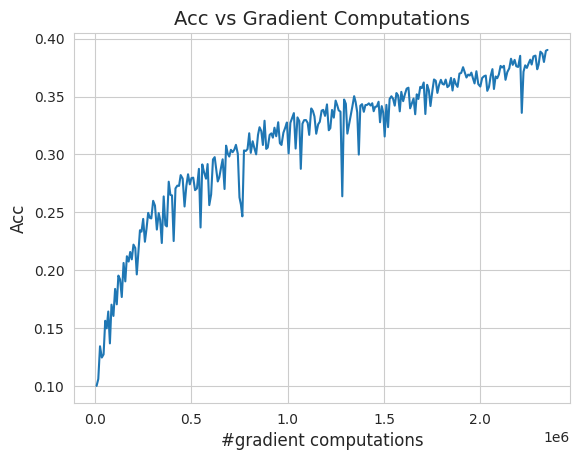

Training: 100%|██████████| 195/195 [00:02<00:00, 83.76it/s, loss=1.7048]


Epoch 267: val_acc=0.3904246985912323


Training: 100%|██████████| 195/195 [00:02<00:00, 89.55it/s, loss=1.7618] 


Epoch 268: val_acc=0.37189504504203796


Training: 100%|██████████| 195/195 [00:02<00:00, 85.16it/s, loss=1.2738]


Epoch 269: val_acc=0.38551682233810425


Training: 100%|██████████| 195/195 [00:02<00:00, 83.46it/s, loss=1.8841]


Epoch 270: val_acc=0.34515225887298584


Training: 100%|██████████| 195/195 [00:02<00:00, 84.21it/s, loss=1.6342]


Epoch 271: val_acc=0.3834134638309479


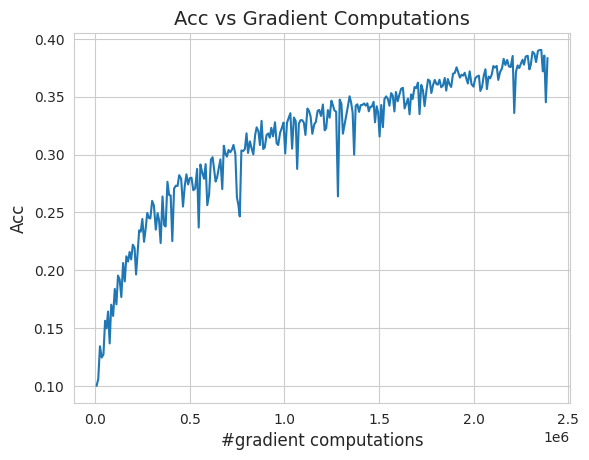

Training: 100%|██████████| 195/195 [00:02<00:00, 91.95it/s, loss=1.7439] 


Epoch 272: val_acc=0.3904246985912323


Training: 100%|██████████| 195/195 [00:02<00:00, 83.34it/s, loss=1.8585]


Epoch 273: val_acc=0.38120993971824646


Training: 100%|██████████| 195/195 [00:02<00:00, 85.88it/s, loss=1.6337]


Epoch 274: val_acc=0.39312902092933655


Training: 100%|██████████| 195/195 [00:02<00:00, 84.79it/s, loss=1.7787] 


Epoch 275: val_acc=0.34535256028175354


Training: 100%|██████████| 195/195 [00:02<00:00, 86.52it/s, loss=1.9128]


Epoch 276: val_acc=0.36328125


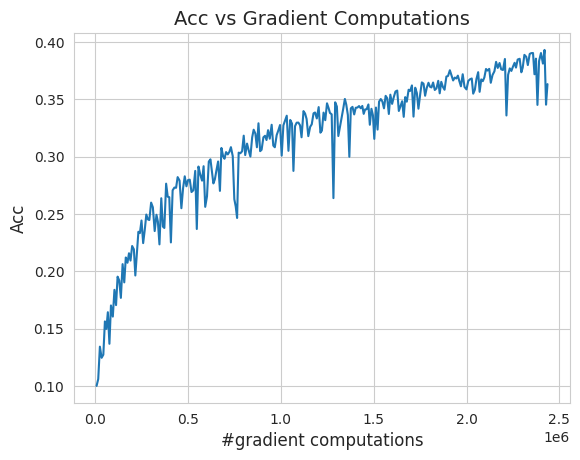

Training: 100%|██████████| 195/195 [00:02<00:00, 85.77it/s, loss=1.6771]


Epoch 277: val_acc=0.3704927861690521


Training: 100%|██████████| 195/195 [00:02<00:00, 86.39it/s, loss=1.3938]


Epoch 278: val_acc=0.3656851053237915


Training: 100%|██████████| 195/195 [00:02<00:00, 86.94it/s, loss=2.0348]


Epoch 279: val_acc=0.38661858439445496


Training: 100%|██████████| 195/195 [00:02<00:00, 92.29it/s, loss=1.8049] 


Epoch 280: val_acc=0.3800080120563507


Training: 100%|██████████| 195/195 [00:02<00:00, 92.24it/s, loss=1.5606] 


Epoch 281: val_acc=0.38030850887298584


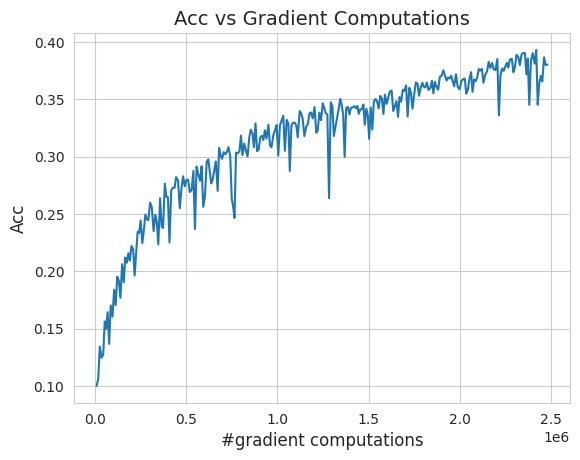

Training: 100%|██████████| 195/195 [00:02<00:00, 89.13it/s, loss=1.4197]


Epoch 282: val_acc=0.3884214758872986


Training: 100%|██████████| 195/195 [00:02<00:00, 87.82it/s, loss=1.4498]


Epoch 283: val_acc=0.3824118673801422


Training: 100%|██████████| 195/195 [00:02<00:00, 87.82it/s, loss=1.8435] 


Epoch 284: val_acc=0.3754006326198578


Training: 100%|██████████| 195/195 [00:02<00:00, 82.77it/s, loss=1.2980]


Epoch 285: val_acc=0.3802083432674408


Training: 100%|██████████| 195/195 [00:02<00:00, 85.26it/s, loss=1.2098]


Epoch 286: val_acc=0.3806089758872986


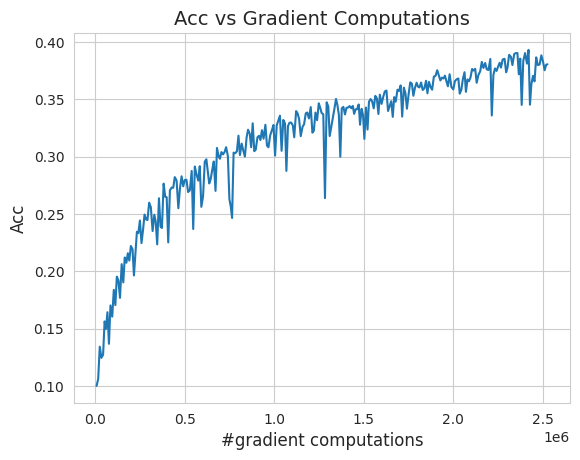

Training: 100%|██████████| 195/195 [00:02<00:00, 84.98it/s, loss=1.5546]


Epoch 287: val_acc=0.39423078298568726


Training: 100%|██████████| 195/195 [00:02<00:00, 89.30it/s, loss=1.3883] 


Epoch 288: val_acc=0.39443108439445496


Training: 100%|██████████| 195/195 [00:02<00:00, 84.75it/s, loss=1.4397]


Epoch 289: val_acc=0.3882211446762085


Training: 100%|██████████| 195/195 [00:02<00:00, 89.97it/s, loss=1.9330]


Epoch 290: val_acc=0.3782051205635071


Training: 100%|██████████| 195/195 [00:02<00:00, 86.22it/s, loss=1.9672]


Epoch 291: val_acc=0.3928285241127014


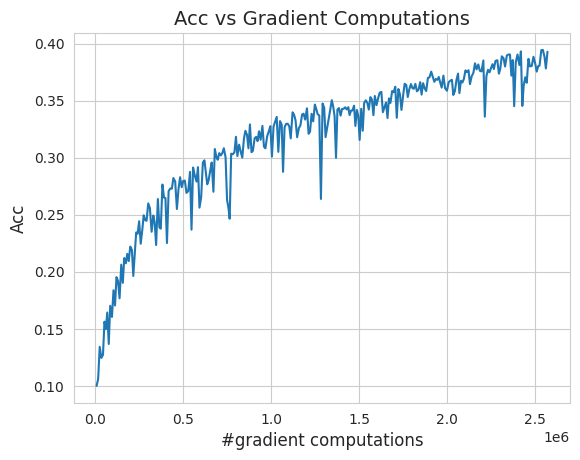

Training: 100%|██████████| 195/195 [00:02<00:00, 86.48it/s, loss=1.5887] 


Epoch 292: val_acc=0.3770032227039337


Training: 100%|██████████| 195/195 [00:02<00:00, 88.34it/s, loss=1.5420]


Epoch 293: val_acc=0.375


Training: 100%|██████████| 195/195 [00:02<00:00, 86.10it/s, loss=1.2113]


Epoch 294: val_acc=0.3932291865348816


Training: 100%|██████████| 195/195 [00:02<00:00, 84.37it/s, loss=1.7019]


Epoch 295: val_acc=0.39072516560554504


Training: 100%|██████████| 195/195 [00:02<00:00, 88.27it/s, loss=1.7501]


Epoch 296: val_acc=0.39332932233810425


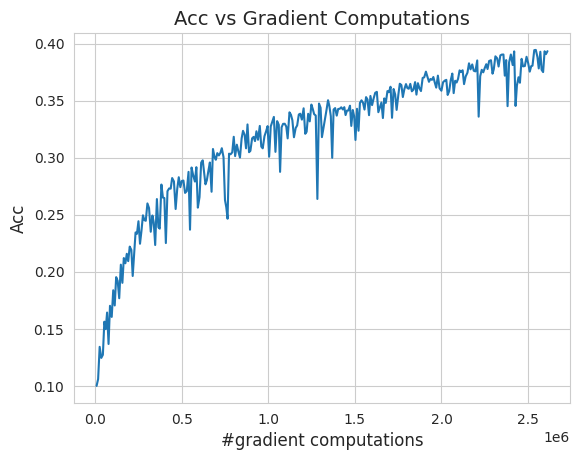

Training: 100%|██████████| 195/195 [00:02<00:00, 83.81it/s, loss=1.2881]


Epoch 297: val_acc=0.3943309485912323


Training: 100%|██████████| 195/195 [00:02<00:00, 85.68it/s, loss=1.5455]


Epoch 298: val_acc=0.39112579822540283


Training: 100%|██████████| 195/195 [00:02<00:00, 86.58it/s, loss=1.7805]


Epoch 299: val_acc=0.3975360691547394


Training: 100%|██████████| 195/195 [00:02<00:00, 90.62it/s, loss=1.6677] 


Epoch 300: val_acc=0.37840545177459717


Training: 100%|██████████| 195/195 [00:02<00:00, 86.90it/s, loss=1.7160]


Epoch 301: val_acc=0.3704927861690521


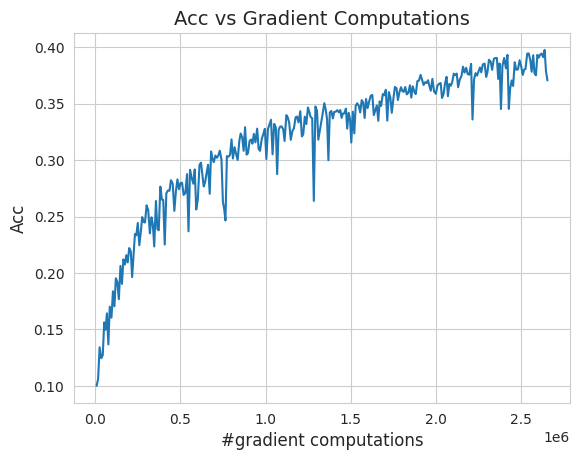

Training: 100%|██████████| 195/195 [00:02<00:00, 86.75it/s, loss=1.8776]


Epoch 302: val_acc=0.37860578298568726


Training: 100%|██████████| 195/195 [00:02<00:00, 88.15it/s, loss=1.6027]


Epoch 303: val_acc=0.38772034645080566


Training: 100%|██████████| 195/195 [00:02<00:00, 86.31it/s, loss=1.4484]


Epoch 304: val_acc=0.39332932233810425


Training: 100%|██████████| 195/195 [00:02<00:00, 85.38it/s, loss=1.1061]


Epoch 305: val_acc=0.39272835850715637


Training: 100%|██████████| 195/195 [00:02<00:00, 91.95it/s, loss=1.4410] 


Epoch 306: val_acc=0.39072516560554504


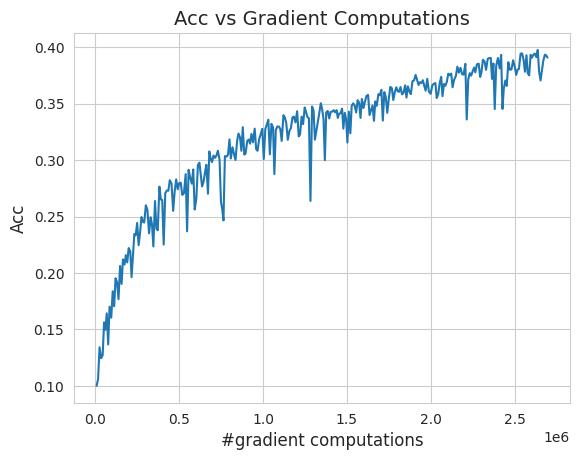

Training: 100%|██████████| 195/195 [00:02<00:00, 84.74it/s, loss=1.5821]


Epoch 307: val_acc=0.38511618971824646


Training: 100%|██████████| 195/195 [00:02<00:00, 88.60it/s, loss=0.9906] 


Epoch 308: val_acc=0.3982371985912323


Training: 100%|██████████| 195/195 [00:02<00:00, 85.09it/s, loss=1.6832]


Epoch 309: val_acc=0.3949318826198578


Training: 100%|██████████| 195/195 [00:02<00:00, 84.85it/s, loss=1.6987]


Epoch 310: val_acc=0.3787059485912323


Training: 100%|██████████| 195/195 [00:02<00:00, 84.73it/s, loss=1.6952]


Epoch 311: val_acc=0.3891226053237915


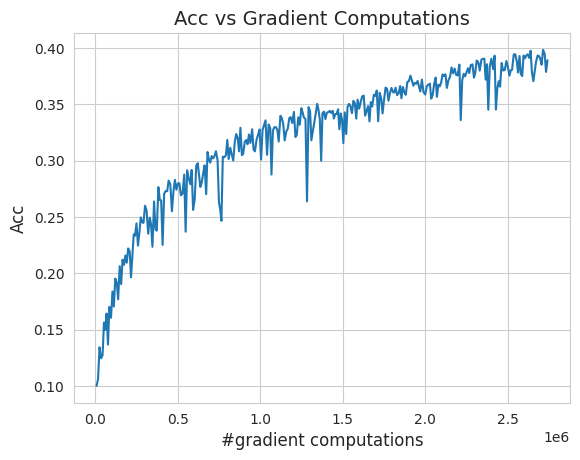

Training: 100%|██████████| 195/195 [00:02<00:00, 87.39it/s, loss=1.2616]


Epoch 312: val_acc=0.3394431173801422


Training: 100%|██████████| 195/195 [00:02<00:00, 84.73it/s, loss=1.3032]


Epoch 313: val_acc=0.39162659645080566


Training: 100%|██████████| 195/195 [00:02<00:00, 88.63it/s, loss=1.4982]


Epoch 314: val_acc=0.3757011294364929


Training: 100%|██████████| 195/195 [00:02<00:00, 84.97it/s, loss=2.6735]


Epoch 315: val_acc=0.39503204822540283


Training: 100%|██████████| 195/195 [00:02<00:00, 88.72it/s, loss=1.5698] 


Epoch 316: val_acc=0.3917267620563507


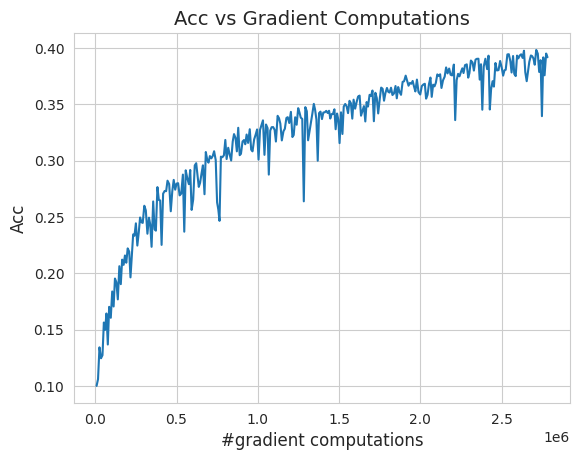

Training: 100%|██████████| 195/195 [00:02<00:00, 83.60it/s, loss=2.2975]


Epoch 317: val_acc=0.3923277258872986


Training: 100%|██████████| 195/195 [00:02<00:00, 89.23it/s, loss=1.6342]


Epoch 318: val_acc=0.40114182233810425


Training: 100%|██████████| 195/195 [00:02<00:00, 96.65it/s, loss=1.8288] 


Epoch 319: val_acc=0.4008413553237915


Training: 100%|██████████| 195/195 [00:02<00:00, 93.64it/s, loss=1.5412] 


Epoch 320: val_acc=0.39503204822540283


Training: 100%|██████████| 195/195 [00:02<00:00, 85.69it/s, loss=1.5680]


Epoch 321: val_acc=0.3978365361690521


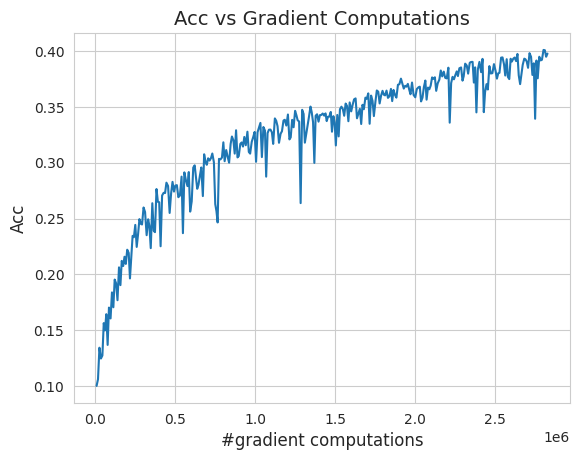

Training: 100%|██████████| 195/195 [00:02<00:00, 88.58it/s, loss=1.7136]


Epoch 322: val_acc=0.4055488705635071


Training: 100%|██████████| 195/195 [00:02<00:00, 87.12it/s, loss=1.3326]


Epoch 323: val_acc=0.39663460850715637


Training: 100%|██████████| 195/195 [00:02<00:00, 87.69it/s, loss=1.9003] 


Epoch 324: val_acc=0.4040464758872986


Training: 100%|██████████| 195/195 [00:02<00:00, 93.17it/s, loss=1.6464] 


Epoch 325: val_acc=0.38772034645080566


Training: 100%|██████████| 195/195 [00:02<00:00, 85.14it/s, loss=1.4160]


Epoch 326: val_acc=0.38311299681663513


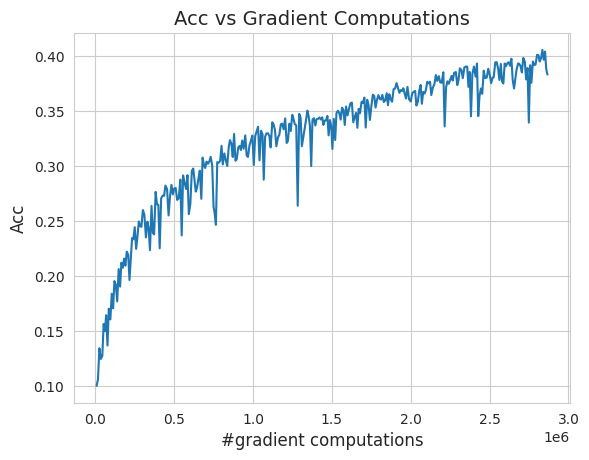

Training: 100%|██████████| 195/195 [00:02<00:00, 86.34it/s, loss=1.9433]


Epoch 327: val_acc=0.4045472741127014


Training: 100%|██████████| 195/195 [00:02<00:00, 88.29it/s, loss=1.4980] 


Epoch 328: val_acc=0.40184295177459717


Training: 100%|██████████| 195/195 [00:02<00:00, 90.01it/s, loss=1.1359]


Epoch 329: val_acc=0.39463141560554504


Training: 100%|██████████| 195/195 [00:02<00:00, 84.71it/s, loss=1.3213]


Epoch 330: val_acc=0.40114182233810425


Training: 100%|██████████| 195/195 [00:02<00:00, 85.69it/s, loss=1.3449]


Epoch 331: val_acc=0.39553284645080566


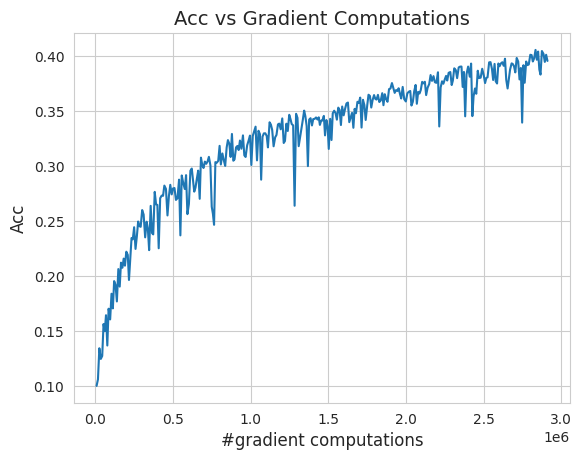

Training: 100%|██████████| 195/195 [00:02<00:00, 87.30it/s, loss=1.3276] 


Epoch 332: val_acc=0.4034455120563507


Training: 100%|██████████| 195/195 [00:02<00:00, 83.97it/s, loss=1.3284]


Epoch 333: val_acc=0.40614983439445496


Training: 100%|██████████| 195/195 [00:02<00:00, 85.98it/s, loss=1.6337]


Epoch 334: val_acc=0.40815305709838867


Training: 100%|██████████| 195/195 [00:02<00:00, 85.27it/s, loss=1.6750]


Epoch 335: val_acc=0.38571715354919434


Training: 100%|██████████| 195/195 [00:02<00:00, 87.16it/s, loss=2.1162] 


Epoch 336: val_acc=0.391526460647583


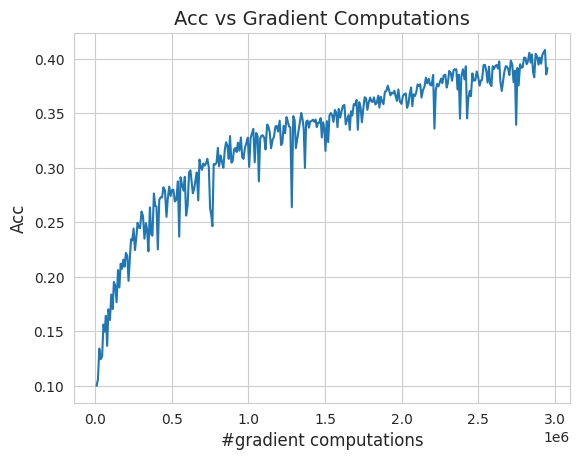

Training: 100%|██████████| 195/195 [00:02<00:00, 85.39it/s, loss=1.3605]


Epoch 337: val_acc=0.4021434485912323


Training: 100%|██████████| 195/195 [00:02<00:00, 88.16it/s, loss=1.4152]


Epoch 338: val_acc=0.40675079822540283


Training: 100%|██████████| 195/195 [00:02<00:00, 87.35it/s, loss=1.9784]


Epoch 339: val_acc=0.39463141560554504


Training: 100%|██████████| 195/195 [00:02<00:00, 96.31it/s, loss=1.4844] 


Epoch 340: val_acc=0.39963942766189575


Training: 100%|██████████| 195/195 [00:02<00:00, 85.15it/s, loss=1.7925]


Epoch 341: val_acc=0.4027443826198578


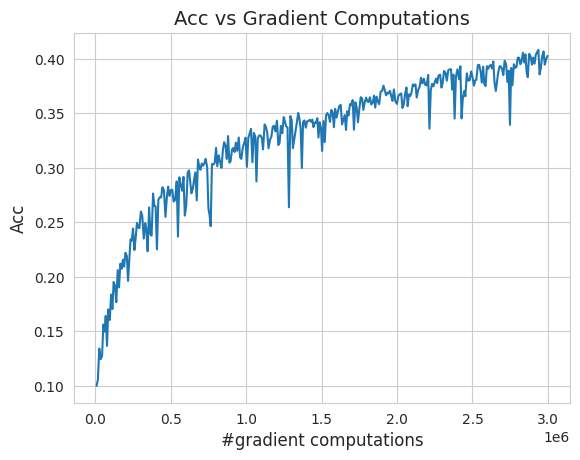

Training: 100%|██████████| 195/195 [00:02<00:00, 83.30it/s, loss=1.1646]


Epoch 342: val_acc=0.3982371985912323


Training: 100%|██████████| 195/195 [00:02<00:00, 83.77it/s, loss=2.2583]


Epoch 343: val_acc=0.40745192766189575


Training: 100%|██████████| 195/195 [00:02<00:00, 88.86it/s, loss=1.6819] 


Epoch 344: val_acc=0.4019431173801422


Training: 100%|██████████| 195/195 [00:02<00:00, 86.12it/s, loss=1.4789]


Epoch 345: val_acc=0.411057710647583


Training: 100%|██████████| 195/195 [00:02<00:00, 85.40it/s, loss=1.1880]


Epoch 346: val_acc=0.414963960647583


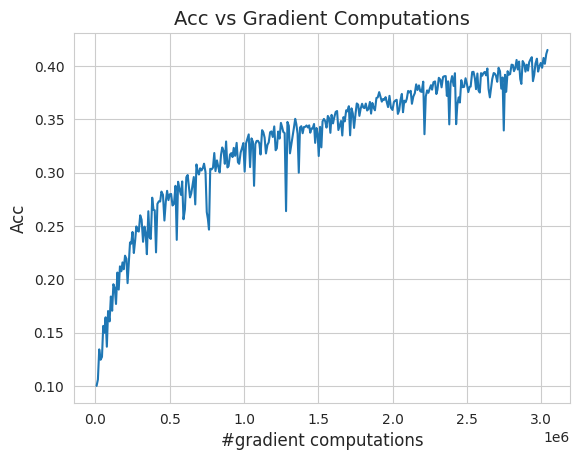

Training: 100%|██████████| 195/195 [00:02<00:00, 87.09it/s, loss=0.8867]


Epoch 347: val_acc=0.40264424681663513


Training: 100%|██████████| 195/195 [00:02<00:00, 85.44it/s, loss=1.2187]


Epoch 348: val_acc=0.4053485691547394


Training: 100%|██████████| 195/195 [00:02<00:00, 85.25it/s, loss=1.9729]


Epoch 349: val_acc=0.39533254504203796


Training: 100%|██████████| 195/195 [00:02<00:00, 87.76it/s, loss=0.7424]


Epoch 350: val_acc=0.40374600887298584


Training: 100%|██████████| 195/195 [00:02<00:00, 89.31it/s, loss=1.2461] 


Epoch 351: val_acc=0.40394631028175354


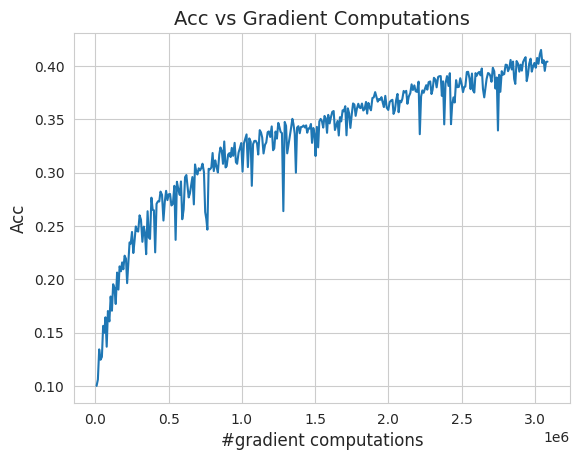

Training: 100%|██████████| 195/195 [00:02<00:00, 94.53it/s, loss=1.9932] 


Epoch 352: val_acc=0.3697916567325592


Training: 100%|██████████| 195/195 [00:02<00:00, 86.63it/s, loss=1.5006]


Epoch 353: val_acc=0.40895432233810425


Training: 100%|██████████| 195/195 [00:02<00:00, 88.90it/s, loss=1.4292]


Epoch 354: val_acc=0.41025641560554504


Training: 100%|██████████| 195/195 [00:02<00:00, 85.85it/s, loss=1.2463]


Epoch 355: val_acc=0.4016426205635071


Training: 100%|██████████| 195/195 [00:02<00:00, 91.57it/s, loss=1.2046] 


Epoch 356: val_acc=0.3952323794364929


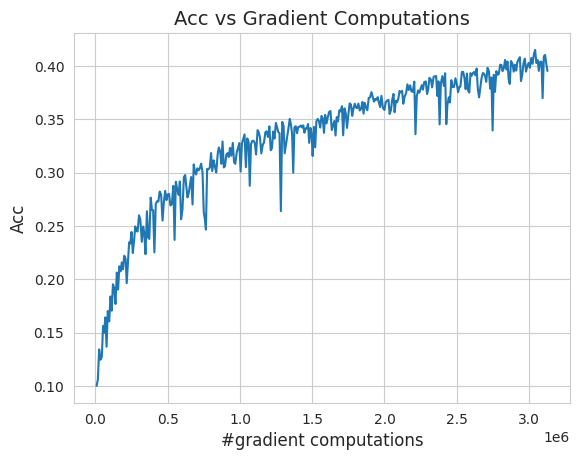

Training: 100%|██████████| 195/195 [00:02<00:00, 85.20it/s, loss=1.2041]


Epoch 357: val_acc=0.40264424681663513


Training: 100%|██████████| 195/195 [00:02<00:00, 88.20it/s, loss=1.4905]


Epoch 358: val_acc=0.4066506326198578


Training: 100%|██████████| 195/195 [00:02<00:00, 86.92it/s, loss=1.7411]


Epoch 359: val_acc=0.27393829822540283


Training: 100%|██████████| 195/195 [00:02<00:00, 88.73it/s, loss=1.7902] 


Epoch 360: val_acc=0.36508414149284363


Training: 100%|██████████| 195/195 [00:02<00:00, 88.07it/s, loss=1.8066]


Epoch 361: val_acc=0.3418469727039337


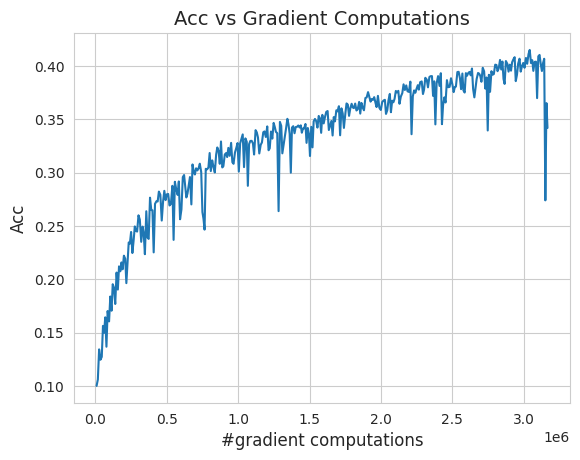

Training: 100%|██████████| 195/195 [00:02<00:00, 86.95it/s, loss=1.5962]


Epoch 362: val_acc=0.37660256028175354


Training: 100%|██████████| 195/195 [00:02<00:00, 85.78it/s, loss=1.8247]


Epoch 363: val_acc=0.37640225887298584


Training: 100%|██████████| 195/195 [00:02<00:00, 91.78it/s, loss=1.9032] 


Epoch 364: val_acc=0.3472556173801422


Training: 100%|██████████| 195/195 [00:02<00:00, 88.89it/s, loss=1.9579]


Epoch 365: val_acc=0.3863181173801422


Training: 100%|██████████| 195/195 [00:02<00:00, 89.77it/s, loss=1.7380]


Epoch 366: val_acc=0.3780048191547394


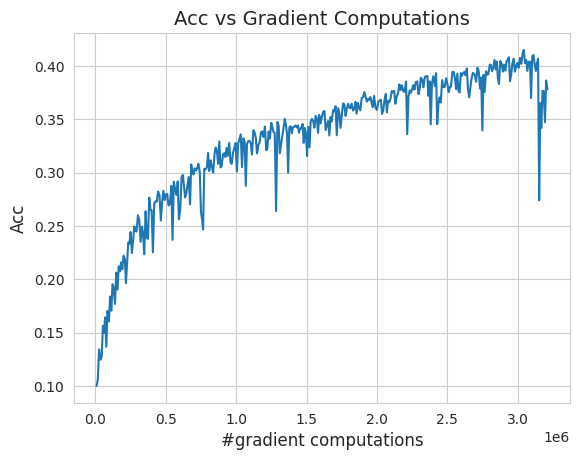

Training: 100%|██████████| 195/195 [00:02<00:00, 81.95it/s, loss=1.4269]


Epoch 367: val_acc=0.39242789149284363


Training: 100%|██████████| 195/195 [00:02<00:00, 86.69it/s, loss=1.4270] 


Epoch 368: val_acc=0.3962339758872986


Training: 100%|██████████| 195/195 [00:02<00:00, 84.45it/s, loss=1.3930]


Epoch 369: val_acc=0.3913261294364929


Training: 100%|██████████| 195/195 [00:02<00:00, 86.31it/s, loss=1.7149]


Epoch 370: val_acc=0.39573317766189575


Training: 100%|██████████| 195/195 [00:02<00:00, 83.43it/s, loss=1.5644]


Epoch 371: val_acc=0.39943909645080566


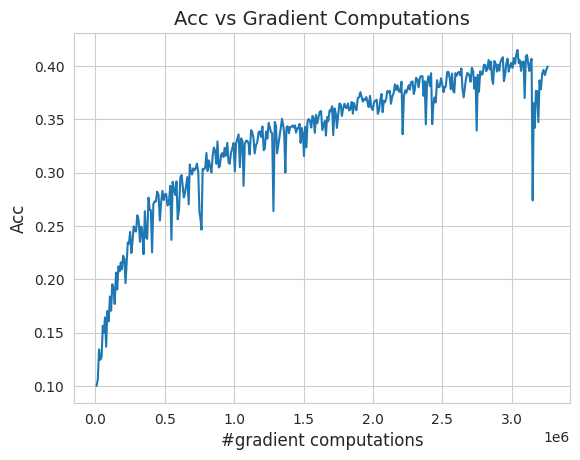

Training: 100%|██████████| 195/195 [00:02<00:00, 88.48it/s, loss=1.5142] 


Epoch 372: val_acc=0.40034055709838867


Training: 100%|██████████| 195/195 [00:02<00:00, 84.04it/s, loss=1.2694]


Epoch 373: val_acc=0.3990384638309479


Training: 100%|██████████| 195/195 [00:02<00:00, 84.84it/s, loss=1.3421]


Epoch 374: val_acc=0.39272835850715637


Training: 100%|██████████| 195/195 [00:02<00:00, 85.21it/s, loss=1.2180]


Epoch 375: val_acc=0.387620210647583


Training: 100%|██████████| 195/195 [00:02<00:00, 85.66it/s, loss=1.8821]


Epoch 376: val_acc=0.3608773946762085


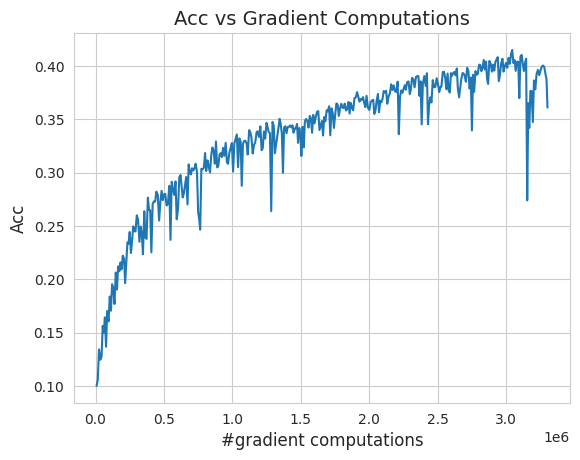

Training: 100%|██████████| 195/195 [00:02<00:00, 85.94it/s, loss=1.5541]


Epoch 377: val_acc=0.3990384638309479


Training: 100%|██████████| 195/195 [00:02<00:00, 92.56it/s, loss=1.9495] 


Epoch 378: val_acc=0.3804086446762085


Training: 100%|██████████| 195/195 [00:02<00:00, 83.92it/s, loss=1.5809]


Epoch 379: val_acc=0.3984375


Training: 100%|██████████| 195/195 [00:02<00:00, 85.98it/s, loss=1.4185]


Epoch 380: val_acc=0.40765225887298584


Training: 100%|██████████| 195/195 [00:02<00:00, 86.33it/s, loss=1.4597]


Epoch 381: val_acc=0.39983975887298584


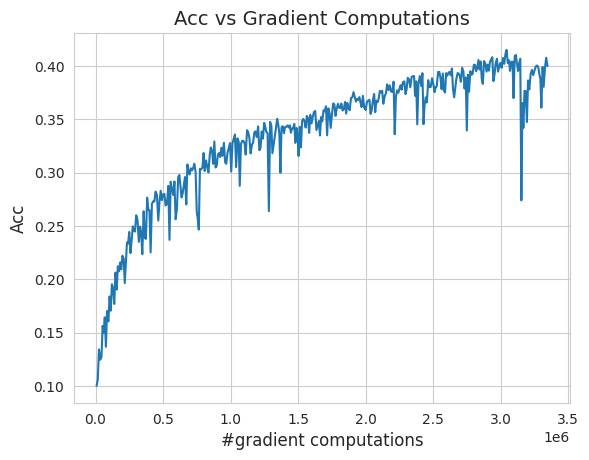

Training: 100%|██████████| 195/195 [00:02<00:00, 86.72it/s, loss=1.5549]


Epoch 382: val_acc=0.3969351053237915


Training: 100%|██████████| 195/195 [00:02<00:00, 85.34it/s, loss=1.4883]


Epoch 383: val_acc=0.40805289149284363


Training: 100%|██████████| 195/195 [00:02<00:00, 87.65it/s, loss=1.9299]


Epoch 384: val_acc=0.39873799681663513


Training: 100%|██████████| 195/195 [00:02<00:00, 89.89it/s, loss=1.2020]


Epoch 385: val_acc=0.39553284645080566


Training: 100%|██████████| 195/195 [00:02<00:00, 86.05it/s, loss=2.1588]


Epoch 386: val_acc=0.40114182233810425


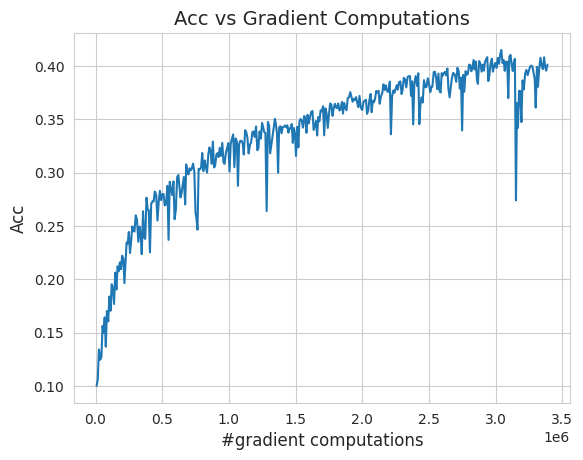

Training: 100%|██████████| 195/195 [00:02<00:00, 85.30it/s, loss=1.9876]


Epoch 387: val_acc=0.3578726053237915


Training: 100%|██████████| 195/195 [00:02<00:00, 87.67it/s, loss=1.6075]


Epoch 388: val_acc=0.3835136294364929


Training: 100%|██████████| 195/195 [00:02<00:00, 81.72it/s, loss=1.7086]


Epoch 389: val_acc=0.40835335850715637


Training: 100%|██████████| 195/195 [00:02<00:00, 83.83it/s, loss=1.6769]


Epoch 390: val_acc=0.40915465354919434


Training: 100%|██████████| 195/195 [00:02<00:00, 86.52it/s, loss=1.2923]


Epoch 391: val_acc=0.40765225887298584


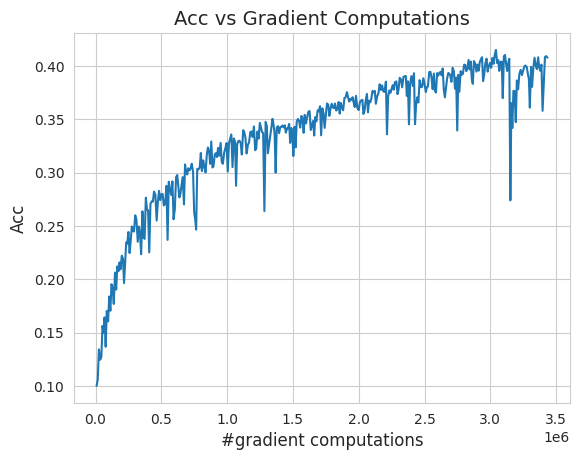

Training: 100%|██████████| 195/195 [00:02<00:00, 83.83it/s, loss=1.9306]


Epoch 392: val_acc=0.4075520932674408


Training: 100%|██████████| 195/195 [00:02<00:00, 83.67it/s, loss=1.3182]


Epoch 393: val_acc=0.41175881028175354


Training: 100%|██████████| 195/195 [00:02<00:00, 84.00it/s, loss=1.8597]


Epoch 394: val_acc=0.41456329822540283


Training: 100%|██████████| 195/195 [00:02<00:00, 86.64it/s, loss=1.7042] 


Epoch 395: val_acc=0.41286057233810425


Training: 100%|██████████| 195/195 [00:02<00:00, 85.26it/s, loss=2.0893]


Epoch 396: val_acc=0.4140625


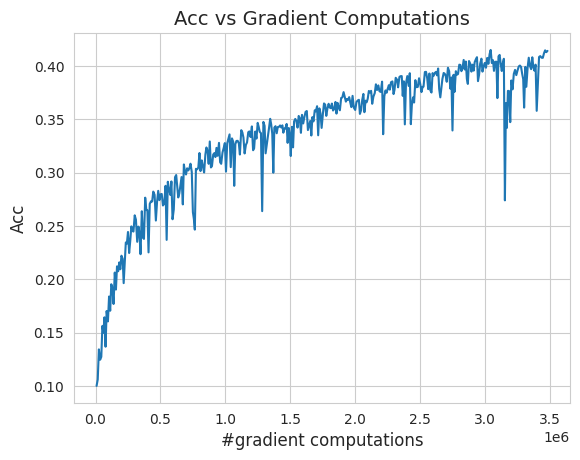

Training: 100%|██████████| 195/195 [00:02<00:00, 83.46it/s, loss=1.2137]


Epoch 397: val_acc=0.41596555709838867


Training: 100%|██████████| 195/195 [00:02<00:00, 83.53it/s, loss=1.6581]


Epoch 398: val_acc=0.41175881028175354


Training: 100%|██████████| 195/195 [00:02<00:00, 85.89it/s, loss=1.7028]


Epoch 399: val_acc=0.41957131028175354


Training: 100%|██████████| 195/195 [00:02<00:00, 82.42it/s, loss=1.3741]


Epoch 400: val_acc=0.41586539149284363


Training: 100%|██████████| 195/195 [00:02<00:00, 83.20it/s, loss=1.2255]


Epoch 401: val_acc=0.4132612347602844


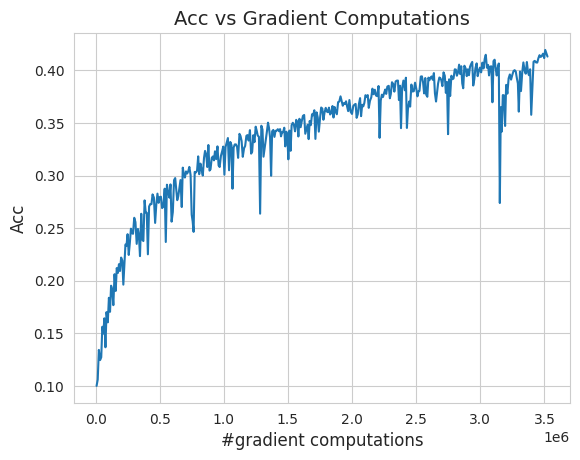

Training: 100%|██████████| 195/195 [00:02<00:00, 90.89it/s, loss=1.5235]


Epoch 402: val_acc=0.40765225887298584


Training: 100%|██████████| 195/195 [00:02<00:00, 88.98it/s, loss=1.6018] 


Epoch 403: val_acc=0.40675079822540283


Training: 100%|██████████| 195/195 [00:02<00:00, 87.65it/s, loss=1.4629]


Epoch 404: val_acc=0.4064503312110901


Training: 100%|██████████| 195/195 [00:02<00:00, 89.11it/s, loss=1.5465]


Epoch 405: val_acc=0.40875402092933655


Training: 100%|██████████| 195/195 [00:02<00:00, 84.32it/s, loss=1.3689]


Epoch 406: val_acc=0.4060496985912323


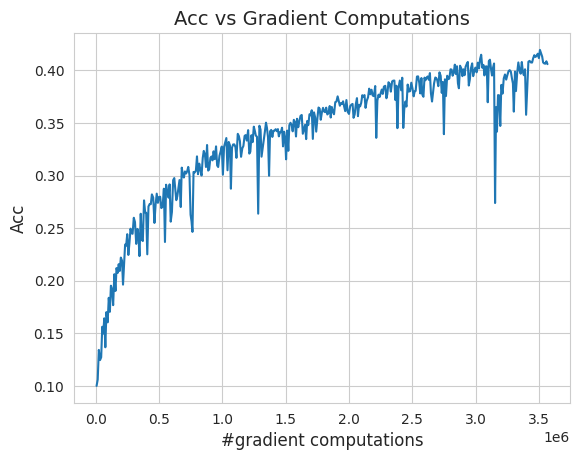

Training: 100%|██████████| 195/195 [00:02<00:00, 93.86it/s, loss=1.4893] 


Epoch 407: val_acc=0.4138621985912323


Training: 100%|██████████| 195/195 [00:02<00:00, 84.16it/s, loss=1.6900]


Epoch 408: val_acc=0.4134615361690521


Training: 100%|██████████| 195/195 [00:02<00:00, 85.13it/s, loss=1.4478]


Epoch 409: val_acc=0.40594953298568726


Training: 100%|██████████| 195/195 [00:02<00:00, 84.15it/s, loss=1.2674]


Epoch 410: val_acc=0.4025440812110901


Training: 100%|██████████| 195/195 [00:02<00:00, 86.80it/s, loss=1.4639] 


Epoch 411: val_acc=0.41356170177459717


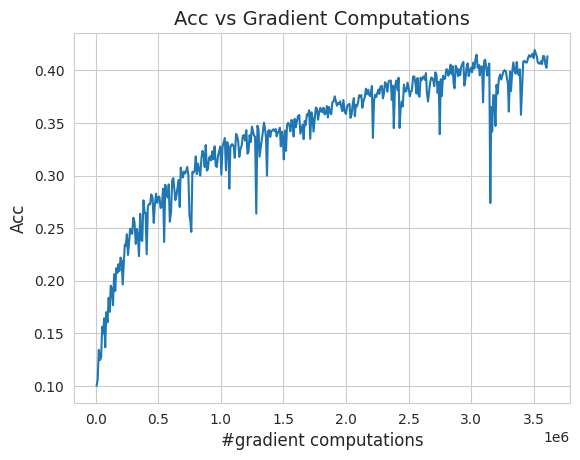

Training: 100%|██████████| 195/195 [00:02<00:00, 82.95it/s, loss=1.6961]


Epoch 412: val_acc=0.3951322138309479


Training: 100%|██████████| 195/195 [00:02<00:00, 82.85it/s, loss=1.7132]


Epoch 413: val_acc=0.40504807233810425


Training: 100%|██████████| 195/195 [00:02<00:00, 95.24it/s, loss=1.5756] 


Epoch 414: val_acc=0.41416266560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 115.12it/s, loss=1.6600]


Epoch 415: val_acc=0.42047277092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 127.44it/s, loss=1.3347]


Epoch 416: val_acc=0.4045472741127014


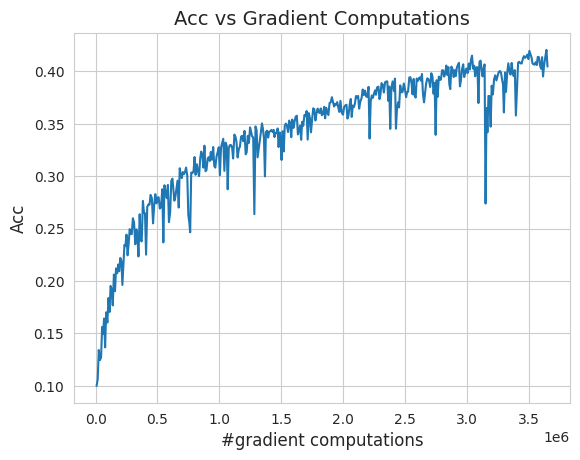

Training: 100%|██████████| 195/195 [00:01<00:00, 121.39it/s, loss=1.3445]


Epoch 417: val_acc=0.41266027092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 133.39it/s, loss=1.6430]


Epoch 418: val_acc=0.4112580120563507


Training: 100%|██████████| 195/195 [00:01<00:00, 125.35it/s, loss=1.6308]


Epoch 419: val_acc=0.41616585850715637


Training: 100%|██████████| 195/195 [00:01<00:00, 138.13it/s, loss=1.8090]


Epoch 420: val_acc=0.41416266560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 127.14it/s, loss=1.4859]


Epoch 421: val_acc=0.4196714758872986


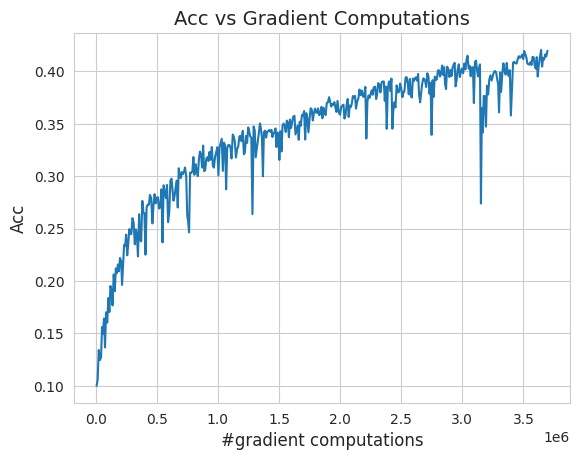

Training: 100%|██████████| 195/195 [00:01<00:00, 129.33it/s, loss=1.4177]


Epoch 422: val_acc=0.4186698794364929


Training: 100%|██████████| 195/195 [00:01<00:00, 125.46it/s, loss=1.3839]


Epoch 423: val_acc=0.4153645932674408


Training: 100%|██████████| 195/195 [00:01<00:00, 124.24it/s, loss=1.7502]


Epoch 424: val_acc=0.41796875


Training: 100%|██████████| 195/195 [00:01<00:00, 123.66it/s, loss=1.4172]


Epoch 425: val_acc=0.4168669879436493


Training: 100%|██████████| 195/195 [00:01<00:00, 131.03it/s, loss=1.5895]


Epoch 426: val_acc=0.40835335850715637


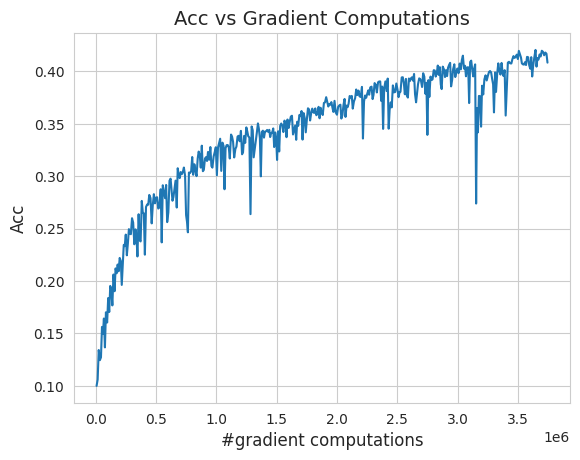

Training: 100%|██████████| 195/195 [00:01<00:00, 129.68it/s, loss=1.9159]


Epoch 427: val_acc=0.4125601053237915


Training: 100%|██████████| 195/195 [00:01<00:00, 138.58it/s, loss=1.9699]


Epoch 428: val_acc=0.4207732379436493


Training: 100%|██████████| 195/195 [00:01<00:00, 127.70it/s, loss=1.7746]


Epoch 429: val_acc=0.4173677861690521


Training: 100%|██████████| 195/195 [00:01<00:00, 131.42it/s, loss=1.4457]


Epoch 430: val_acc=0.4172676205635071


Training: 100%|██████████| 195/195 [00:01<00:00, 130.96it/s, loss=1.0574]


Epoch 431: val_acc=0.41897034645080566


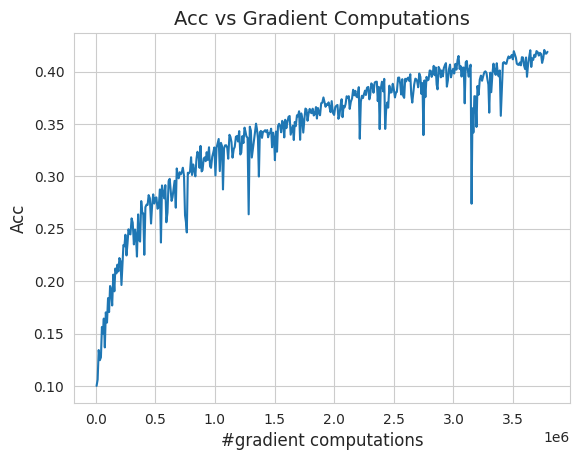

Training: 100%|██████████| 195/195 [00:01<00:00, 127.08it/s, loss=1.2294]


Epoch 432: val_acc=0.42377805709838867


Training: 100%|██████████| 195/195 [00:01<00:00, 127.14it/s, loss=1.1464]


Epoch 433: val_acc=0.4112580120563507


Training: 100%|██████████| 195/195 [00:01<00:00, 134.71it/s, loss=1.3984]


Epoch 434: val_acc=0.42457932233810425


Training: 100%|██████████| 195/195 [00:01<00:00, 124.25it/s, loss=1.2168]


Epoch 435: val_acc=0.4242788553237915


Training: 100%|██████████| 195/195 [00:01<00:00, 126.03it/s, loss=1.7782]


Epoch 436: val_acc=0.42007210850715637


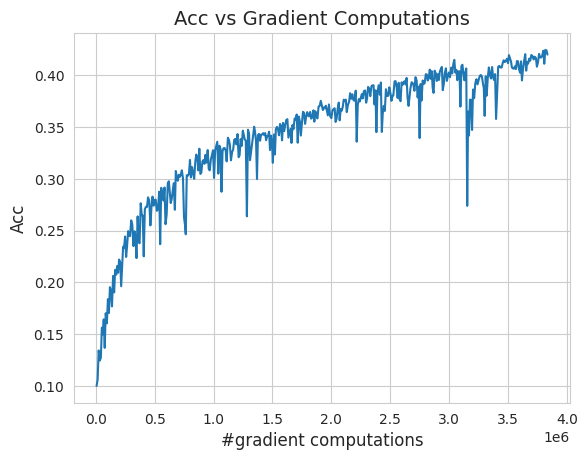

Training: 100%|██████████| 195/195 [00:01<00:00, 127.87it/s, loss=1.2919]


Epoch 437: val_acc=0.42347756028175354


Training: 100%|██████████| 195/195 [00:01<00:00, 120.67it/s, loss=1.6731]


Epoch 438: val_acc=0.4244791865348816


Training: 100%|██████████| 195/195 [00:01<00:00, 125.06it/s, loss=1.6265]


Epoch 439: val_acc=0.4205729365348816


Training: 100%|██████████| 195/195 [00:01<00:00, 125.71it/s, loss=1.7385]


Epoch 440: val_acc=0.3951322138309479


Training: 100%|██████████| 195/195 [00:01<00:00, 128.51it/s, loss=1.2428]


Epoch 441: val_acc=0.4147636294364929


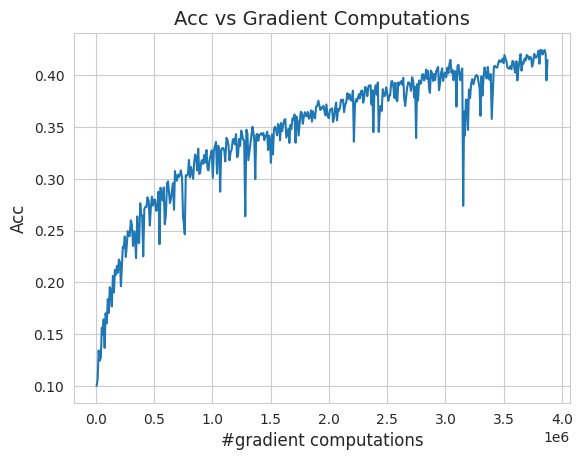

Training: 100%|██████████| 195/195 [00:01<00:00, 130.22it/s, loss=1.6242]


Epoch 442: val_acc=0.4127604365348816


Training: 100%|██████████| 195/195 [00:01<00:00, 139.86it/s, loss=1.7106]


Epoch 443: val_acc=0.40374600887298584


Training: 100%|██████████| 195/195 [00:01<00:00, 129.55it/s, loss=1.3906]


Epoch 444: val_acc=0.4151642620563507


Training: 100%|██████████| 195/195 [00:01<00:00, 123.13it/s, loss=1.2723]


Epoch 445: val_acc=0.41987180709838867


Training: 100%|██████████| 195/195 [00:01<00:00, 122.24it/s, loss=1.2030]


Epoch 446: val_acc=0.41746795177459717


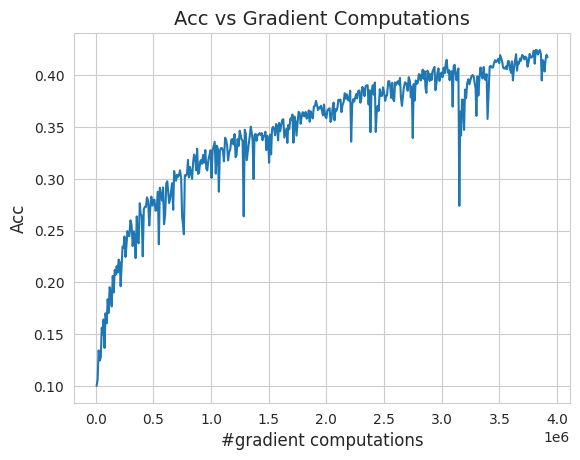

Training: 100%|██████████| 195/195 [00:01<00:00, 125.00it/s, loss=1.5941]


Epoch 447: val_acc=0.42237579822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 125.17it/s, loss=1.2008]


Epoch 448: val_acc=0.4268830120563507


Training: 100%|██████████| 195/195 [00:01<00:00, 119.15it/s, loss=1.5266]


Epoch 449: val_acc=0.42237579822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 124.26it/s, loss=1.4272]


Epoch 450: val_acc=0.4186698794364929


Training: 100%|██████████| 195/195 [00:01<00:00, 133.02it/s, loss=1.4595]


Epoch 451: val_acc=0.4162660241127014


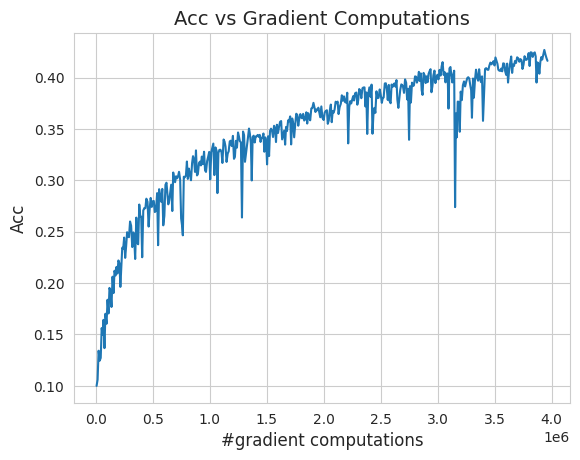

Training: 100%|██████████| 195/195 [00:01<00:00, 121.60it/s, loss=1.3096]


Epoch 452: val_acc=0.4300881326198578


Training: 100%|██████████| 195/195 [00:01<00:00, 113.88it/s, loss=1.4059]


Epoch 453: val_acc=0.41796875


Training: 100%|██████████| 195/195 [00:01<00:00, 121.16it/s, loss=1.4489]


Epoch 454: val_acc=0.42267629504203796


Training: 100%|██████████| 195/195 [00:01<00:00, 117.17it/s, loss=1.2104]


Epoch 455: val_acc=0.4207732379436493


Training: 100%|██████████| 195/195 [00:01<00:00, 123.58it/s, loss=1.4006]


Epoch 456: val_acc=0.4196714758872986


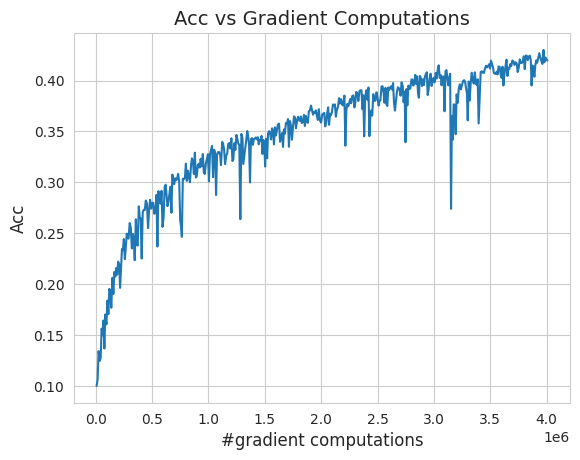

Training: 100%|██████████| 195/195 [00:01<00:00, 137.87it/s, loss=1.3533]


Epoch 457: val_acc=0.41266027092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 129.40it/s, loss=1.3956]


Epoch 458: val_acc=0.42327725887298584


Training: 100%|██████████| 195/195 [00:01<00:00, 126.64it/s, loss=1.5433]


Epoch 459: val_acc=0.42978766560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 123.71it/s, loss=1.4785]


Epoch 460: val_acc=0.4222756326198578


Training: 100%|██████████| 195/195 [00:01<00:00, 122.37it/s, loss=1.6454]


Epoch 461: val_acc=0.40034055709838867


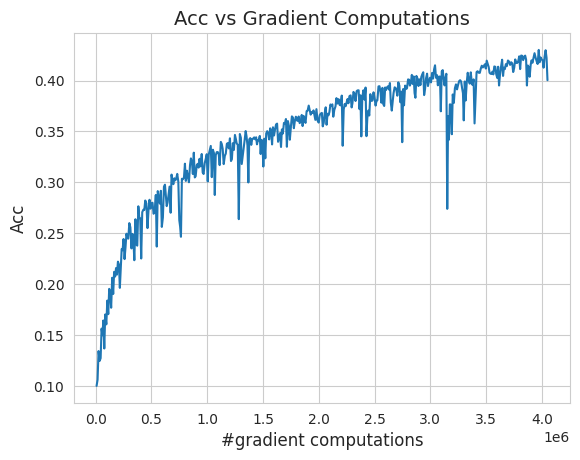

Training: 100%|██████████| 195/195 [00:01<00:00, 119.15it/s, loss=1.7022]


Epoch 462: val_acc=0.4099559485912323


Training: 100%|██████████| 195/195 [00:01<00:00, 121.66it/s, loss=1.7228]


Epoch 463: val_acc=0.414963960647583


Training: 100%|██████████| 195/195 [00:01<00:00, 125.32it/s, loss=1.4257]


Epoch 464: val_acc=0.42377805709838867


Training: 100%|██████████| 195/195 [00:01<00:00, 126.57it/s, loss=1.4599]


Epoch 465: val_acc=0.42287659645080566


Training: 100%|██████████| 195/195 [00:01<00:00, 122.56it/s, loss=1.0492]


Epoch 466: val_acc=0.414963960647583


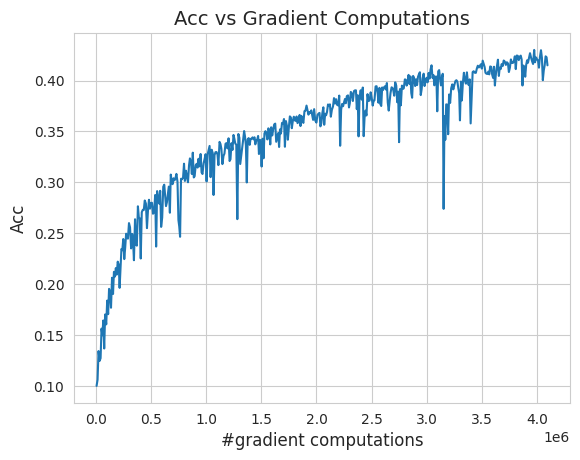

Training: 100%|██████████| 195/195 [00:01<00:00, 123.34it/s, loss=1.4077]


Epoch 467: val_acc=0.42217549681663513


Training: 100%|██████████| 195/195 [00:01<00:00, 123.44it/s, loss=1.4124]


Epoch 468: val_acc=0.41266027092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 125.93it/s, loss=1.1801]


Epoch 469: val_acc=0.42568108439445496


Training: 100%|██████████| 195/195 [00:01<00:00, 128.42it/s, loss=0.9536]


Epoch 470: val_acc=0.42397835850715637


Training: 100%|██████████| 195/195 [00:01<00:00, 126.04it/s, loss=1.3855]


Epoch 471: val_acc=0.42267629504203796


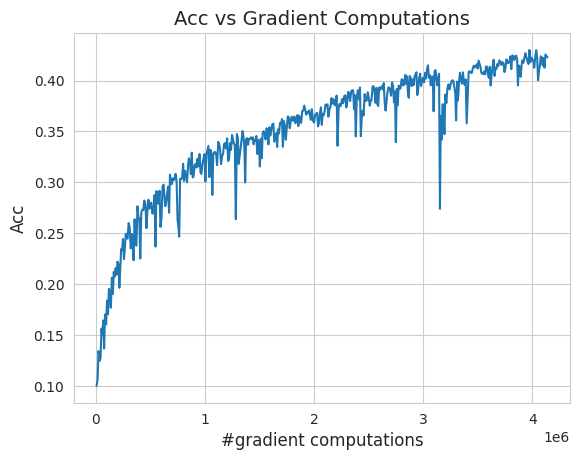

Training: 100%|██████████| 195/195 [00:01<00:00, 128.91it/s, loss=1.3550]


Epoch 472: val_acc=0.42457932233810425


Training: 100%|██████████| 195/195 [00:01<00:00, 119.77it/s, loss=1.5134]


Epoch 473: val_acc=0.4238782227039337


Training: 100%|██████████| 195/195 [00:01<00:00, 130.49it/s, loss=1.3583]


Epoch 474: val_acc=0.4274839758872986


Training: 100%|██████████| 195/195 [00:01<00:00, 130.60it/s, loss=1.5092]


Epoch 475: val_acc=0.42347756028175354


Training: 100%|██████████| 195/195 [00:01<00:00, 123.43it/s, loss=1.3136]


Epoch 476: val_acc=0.4107572138309479


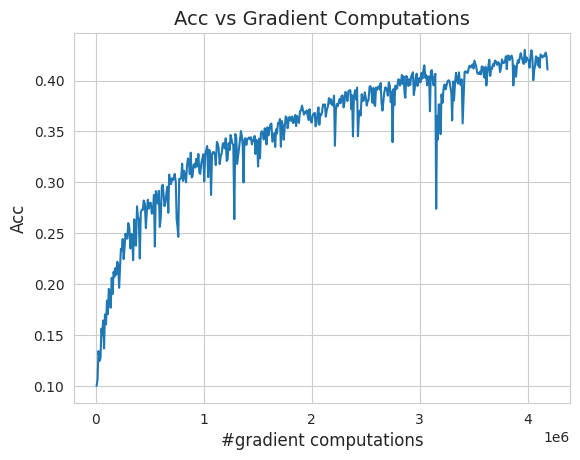

Training: 100%|██████████| 195/195 [00:01<00:00, 129.51it/s, loss=1.2842]


Epoch 477: val_acc=0.4287860691547394


Training: 100%|██████████| 195/195 [00:01<00:00, 124.97it/s, loss=1.4673]


Epoch 478: val_acc=0.40815305709838867


Training: 100%|██████████| 195/195 [00:01<00:00, 126.42it/s, loss=1.4379]


Epoch 479: val_acc=0.4288862347602844


Training: 100%|██████████| 195/195 [00:01<00:00, 125.05it/s, loss=1.0724]


Epoch 480: val_acc=0.4242788553237915


Training: 100%|██████████| 195/195 [00:01<00:00, 121.21it/s, loss=1.4309]


Epoch 481: val_acc=0.4287860691547394


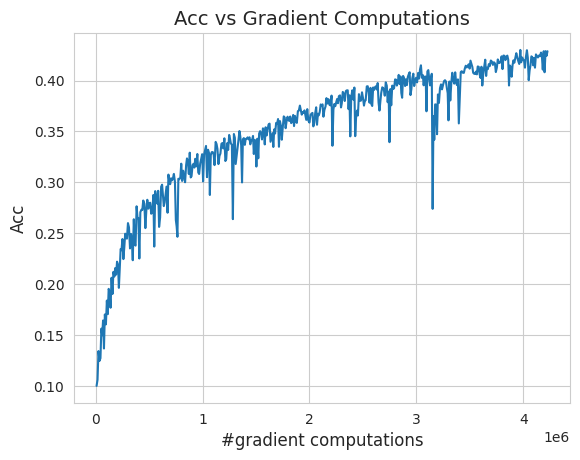

Training: 100%|██████████| 195/195 [00:01<00:00, 126.18it/s, loss=1.2506]


Epoch 482: val_acc=0.4324919879436493


Training: 100%|██████████| 195/195 [00:01<00:00, 126.73it/s, loss=1.1814]


Epoch 483: val_acc=0.43159055709838867


Training: 100%|██████████| 195/195 [00:01<00:00, 129.28it/s, loss=1.7716]


Epoch 484: val_acc=0.42417868971824646


Training: 100%|██████████| 195/195 [00:01<00:00, 125.01it/s, loss=1.4727]


Epoch 485: val_acc=0.422776460647583


Training: 100%|██████████| 195/195 [00:01<00:00, 134.12it/s, loss=1.6665]


Epoch 486: val_acc=0.4302884638309479


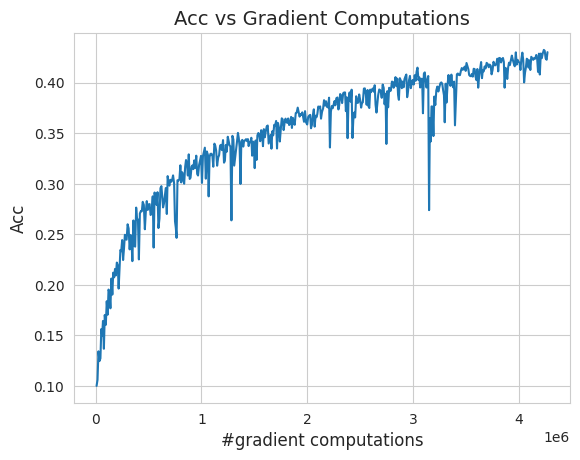

Training: 100%|██████████| 195/195 [00:01<00:00, 126.34it/s, loss=1.4781]


Epoch 487: val_acc=0.43459534645080566


Training: 100%|██████████| 195/195 [00:01<00:00, 124.26it/s, loss=1.5220]


Epoch 488: val_acc=0.4281851053237915


Training: 100%|██████████| 195/195 [00:01<00:00, 132.96it/s, loss=1.3685]


Epoch 489: val_acc=0.4324919879436493


Training: 100%|██████████| 195/195 [00:01<00:00, 125.92it/s, loss=1.2659]


Epoch 490: val_acc=0.42718350887298584


Training: 100%|██████████| 195/195 [00:01<00:00, 131.62it/s, loss=1.3848]


Epoch 491: val_acc=0.4341947138309479


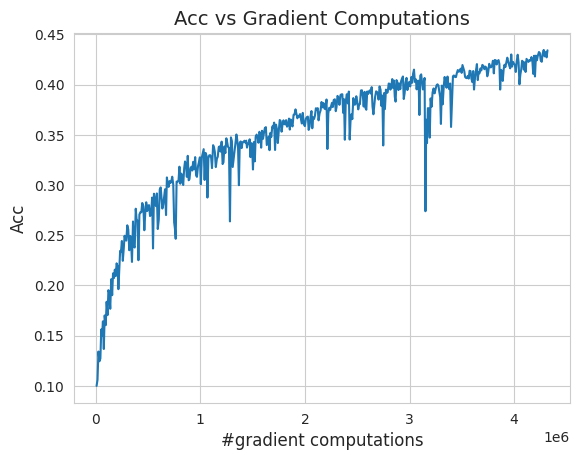

Training: 100%|██████████| 195/195 [00:01<00:00, 138.45it/s, loss=1.0877]


Epoch 492: val_acc=0.434495210647583


Training: 100%|██████████| 195/195 [00:01<00:00, 131.86it/s, loss=1.4286]


Epoch 493: val_acc=0.43479567766189575


Training: 100%|██████████| 195/195 [00:01<00:00, 125.34it/s, loss=1.2217]


Epoch 494: val_acc=0.4309895932674408


Training: 100%|██████████| 195/195 [00:01<00:00, 128.68it/s, loss=1.4977]


Epoch 495: val_acc=0.434495210647583


Training: 100%|██████████| 195/195 [00:01<00:00, 127.70it/s, loss=1.1836]


Epoch 496: val_acc=0.43108975887298584


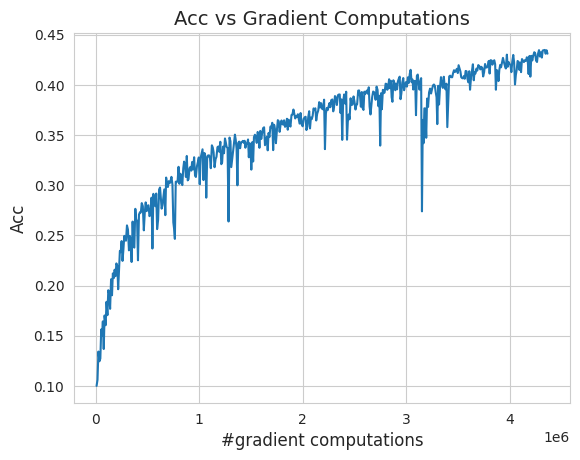

Training: 100%|██████████| 195/195 [00:01<00:00, 131.53it/s, loss=1.1349]


Epoch 497: val_acc=0.43609777092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 125.51it/s, loss=1.5626]


Epoch 498: val_acc=0.43309295177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 133.02it/s, loss=1.3294]


Epoch 499: val_acc=0.43739983439445496


Training: 100%|██████████| 195/195 [00:01<00:00, 120.83it/s, loss=1.9067]


Epoch 500: val_acc=0.4151642620563507


In [10]:
rng = jax.random.PRNGKey(42)
bs = 256
bs_hat = 16

train_loader, val_loader = get_cifar10_dataloaders(batch_size=bs, with_augmentation=False, shuffle=False)
init_batch = tf_to_jax(next(iter(train_loader)))
resnet18, variables = init_model(rng, init_batch)

compute_accuracy = jax.jit(get_compute_accuracy_fn(resnet18))

train_loss_fn = get_cross_entropy_loss_fn(resnet18, train=True)
eval_loss_fn = get_cross_entropy_loss_fn(resnet18, train=False)
# optimizer = SGD(train_loss_fn,
#                 lr=1e-4,
#                 need_jit=True)
optimizer = PAGE(loss_fn=train_loss_fn,
                eval_loss_fn=eval_loss_fn,
                p=bs_hat/(bs+bs_hat),
                lr=1e-4,
                bs=bs,
                bs_hat=bs_hat,
                need_jit=True)

state = optimizer.init(variables, tf_to_jax(next(iter(train_loader))))

acc_arr, grad_count, state = train(state=state,
            optimizer=optimizer,
            train_loader=train_loader,
            val_loader=val_loader,
            num_epochs=500,
            compute_accuracy=compute_accuracy)

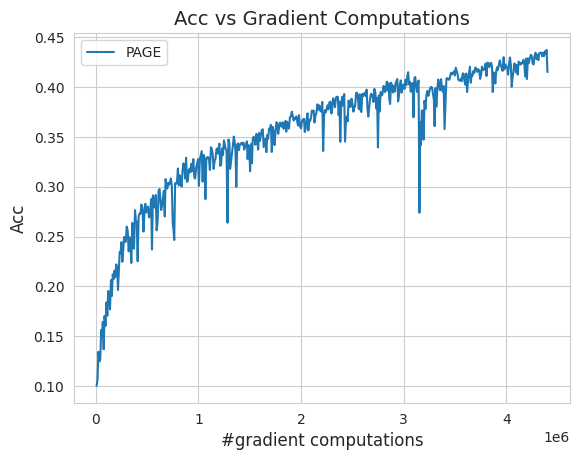

In [12]:
plt.plot(grad_count, acc_arr, label="PAGE")
plt.xlabel('#gradient computations', fontsize=12)
plt.ylabel('Acc', fontsize=12)
plt.title('Acc vs Gradient Computations', fontsize=14)
plt.legend()
plt.show()

Training: 100%|██████████| 195/195 [00:01<00:00, 119.25it/s, loss=1.4467]


Epoch 1: val_acc=0.42918670177459717


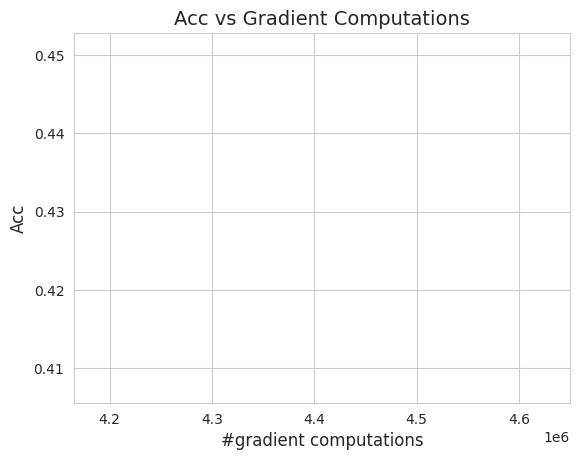

Training: 100%|██████████| 195/195 [00:01<00:00, 128.57it/s, loss=1.3897]


Epoch 2: val_acc=0.41636618971824646


Training: 100%|██████████| 195/195 [00:01<00:00, 125.01it/s, loss=1.4557]


Epoch 3: val_acc=0.43780049681663513


Training: 100%|██████████| 195/195 [00:01<00:00, 122.09it/s, loss=1.3938]


Epoch 4: val_acc=0.43780049681663513


Training: 100%|██████████| 195/195 [00:01<00:00, 132.78it/s, loss=1.0507]


Epoch 5: val_acc=0.42628204822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 122.31it/s, loss=1.2113]


Epoch 6: val_acc=0.4272836446762085


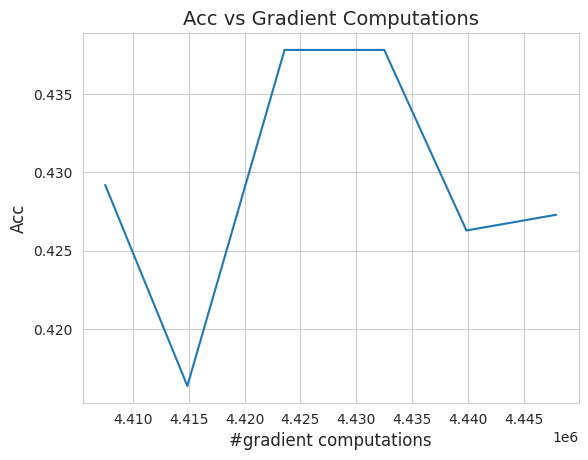

Training: 100%|██████████| 195/195 [00:01<00:00, 123.67it/s, loss=1.4320]


Epoch 7: val_acc=0.43018829822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 133.31it/s, loss=1.4715]


Epoch 8: val_acc=0.43369391560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 127.48it/s, loss=1.3456]


Epoch 9: val_acc=0.4352964758872986


Training: 100%|██████████| 195/195 [00:01<00:00, 124.82it/s, loss=1.6274]


Epoch 10: val_acc=0.4427083432674408


Training: 100%|██████████| 195/195 [00:01<00:00, 134.24it/s, loss=1.5964]


Epoch 11: val_acc=0.43719953298568726


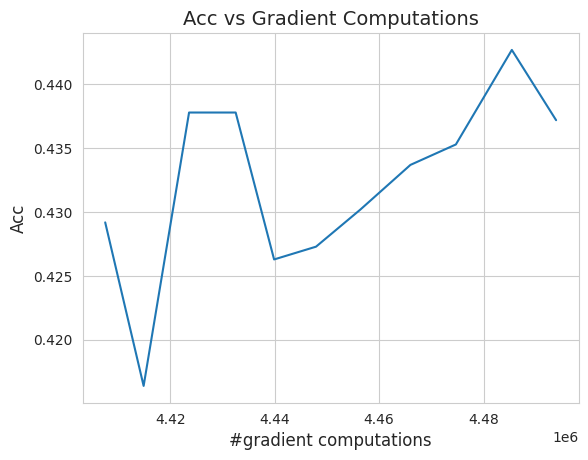

Training: 100%|██████████| 195/195 [00:01<00:00, 125.47it/s, loss=1.3070]
2025-05-23 07:36:31.226393: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 12: val_acc=0.42958733439445496


Training: 100%|██████████| 195/195 [00:01<00:00, 133.95it/s, loss=1.2158]


Epoch 13: val_acc=0.4342948794364929


Training: 100%|██████████| 195/195 [00:01<00:00, 133.21it/s, loss=1.3998]


Epoch 14: val_acc=0.43800079822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 119.45it/s, loss=1.4554]


Epoch 15: val_acc=0.4397035241127014


Training: 100%|██████████| 195/195 [00:01<00:00, 119.35it/s, loss=1.3814]


Epoch 16: val_acc=0.4294871985912323


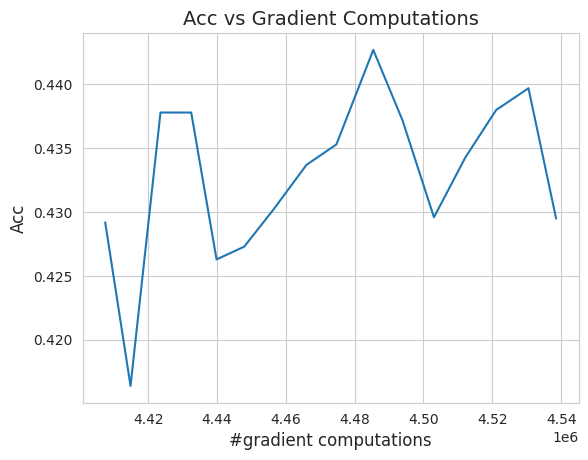

Training: 100%|██████████| 195/195 [00:01<00:00, 130.17it/s, loss=1.4020]


Epoch 17: val_acc=0.43359375


Training: 100%|██████████| 195/195 [00:01<00:00, 125.92it/s, loss=1.3094]


Epoch 18: val_acc=0.43850159645080566


Training: 100%|██████████| 195/195 [00:01<00:00, 131.69it/s, loss=1.8183]


Epoch 19: val_acc=0.4248798191547394


Training: 100%|██████████| 195/195 [00:01<00:00, 130.54it/s, loss=1.4441]


Epoch 20: val_acc=0.39703527092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 128.08it/s, loss=1.4917]


Epoch 21: val_acc=0.4357972741127014


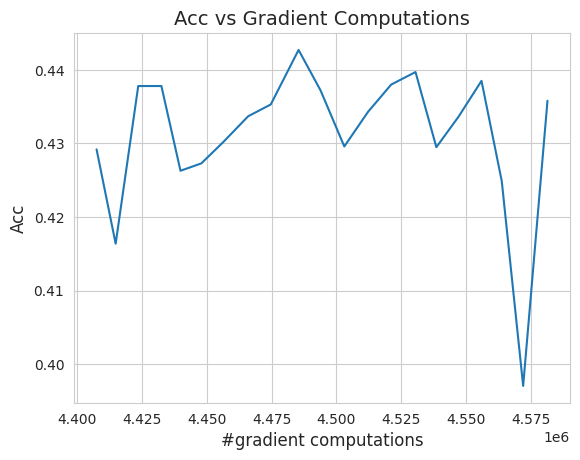

Training: 100%|██████████| 195/195 [00:01<00:00, 127.95it/s, loss=2.1502]


Epoch 22: val_acc=0.4207732379436493


Training: 100%|██████████| 195/195 [00:01<00:00, 128.25it/s, loss=1.1145]


Epoch 23: val_acc=0.4407051205635071


Training: 100%|██████████| 195/195 [00:01<00:00, 126.99it/s, loss=1.3548]


Epoch 24: val_acc=0.44150641560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 120.49it/s, loss=1.3576]


Epoch 25: val_acc=0.4328926205635071


Training: 100%|██████████| 195/195 [00:01<00:00, 124.25it/s, loss=1.4718]


Epoch 26: val_acc=0.4203726053237915


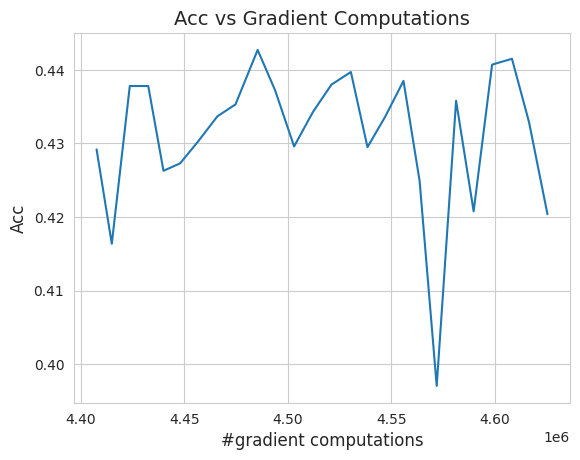

Training: 100%|██████████| 195/195 [00:01<00:00, 133.03it/s, loss=1.1096]


Epoch 27: val_acc=0.43539664149284363


Training: 100%|██████████| 195/195 [00:01<00:00, 134.35it/s, loss=1.5628]


Epoch 28: val_acc=0.4307892620563507


Training: 100%|██████████| 195/195 [00:01<00:00, 137.17it/s, loss=1.6243]


Epoch 29: val_acc=0.43980368971824646


Training: 100%|██████████| 195/195 [00:01<00:00, 122.47it/s, loss=1.1801]


Epoch 30: val_acc=0.4309895932674408


Training: 100%|██████████| 195/195 [00:01<00:00, 127.29it/s, loss=1.2568]


Epoch 31: val_acc=0.42217549681663513


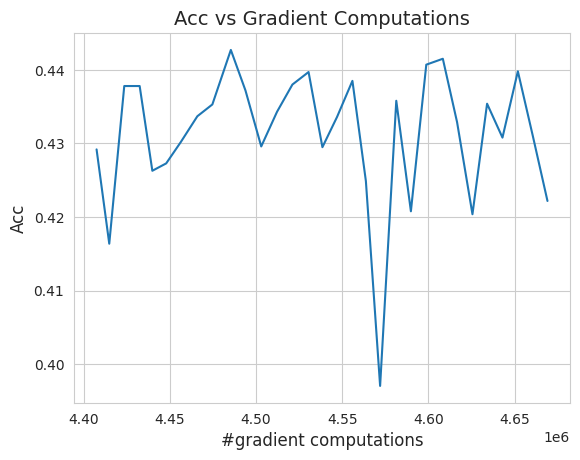

Training: 100%|██████████| 195/195 [00:01<00:00, 119.47it/s, loss=0.9379]


Epoch 32: val_acc=0.4440104365348816


Training: 100%|██████████| 195/195 [00:01<00:00, 122.57it/s, loss=1.2107]


Epoch 33: val_acc=0.43259215354919434


Training: 100%|██████████| 195/195 [00:01<00:00, 122.48it/s, loss=1.3116]


Epoch 34: val_acc=0.4346955120563507


Training: 100%|██████████| 195/195 [00:01<00:00, 124.65it/s, loss=1.7023]


Epoch 35: val_acc=0.43309295177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 122.55it/s, loss=1.2360]


Epoch 36: val_acc=0.4372996985912323


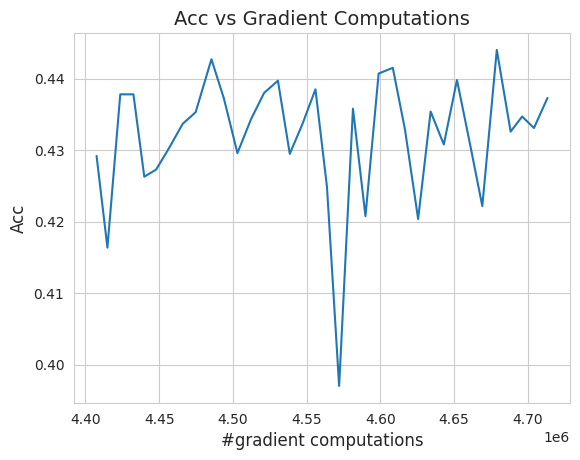

Training: 100%|██████████| 195/195 [00:01<00:00, 127.96it/s, loss=1.8778]


Epoch 37: val_acc=0.42848557233810425


Training: 100%|██████████| 195/195 [00:01<00:00, 134.68it/s, loss=1.7941] 


Epoch 38: val_acc=0.39252805709838867


Training: 100%|██████████| 195/195 [00:01<00:00, 129.22it/s, loss=1.4758]


Epoch 39: val_acc=0.42287659645080566


Training: 100%|██████████| 195/195 [00:01<00:00, 125.62it/s, loss=1.0450]


Epoch 40: val_acc=0.4242788553237915


Training: 100%|██████████| 195/195 [00:01<00:00, 127.99it/s, loss=1.4076]


Epoch 41: val_acc=0.43800079822540283


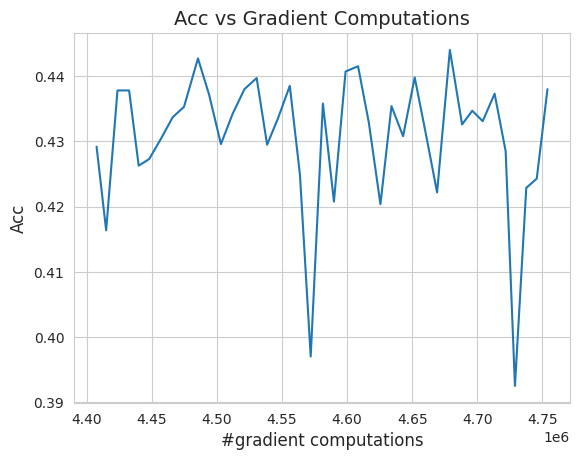

Training: 100%|██████████| 195/195 [00:01<00:00, 138.75it/s, loss=1.1711]


Epoch 42: val_acc=0.43739983439445496


Training: 100%|██████████| 195/195 [00:01<00:00, 129.71it/s, loss=1.3961]


Epoch 43: val_acc=0.44000402092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 129.56it/s, loss=1.0602]


Epoch 44: val_acc=0.4377003312110901


Training: 100%|██████████| 195/195 [00:01<00:00, 130.46it/s, loss=1.5206]


Epoch 45: val_acc=0.4309895932674408


Training: 100%|██████████| 195/195 [00:01<00:00, 128.25it/s, loss=1.5033]


Epoch 46: val_acc=0.4372996985912323


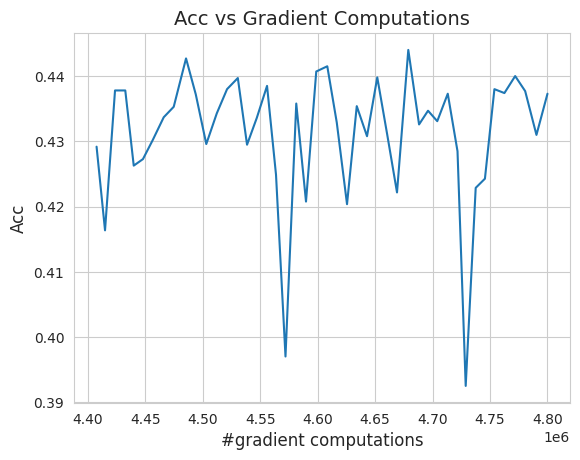

Training: 100%|██████████| 195/195 [00:01<00:00, 133.46it/s, loss=1.3502]


Epoch 47: val_acc=0.41826924681663513


Training: 100%|██████████| 195/195 [00:01<00:00, 134.90it/s, loss=1.1369]


Epoch 48: val_acc=0.4288862347602844


Training: 100%|██████████| 195/195 [00:01<00:00, 120.32it/s, loss=1.3647]


Epoch 49: val_acc=0.43108975887298584


Training: 100%|██████████| 195/195 [00:01<00:00, 133.07it/s, loss=1.6247]


Epoch 50: val_acc=0.4386017620563507


Training: 100%|██████████| 195/195 [00:01<00:00, 129.15it/s, loss=1.4189]


Epoch 51: val_acc=0.43890225887298584


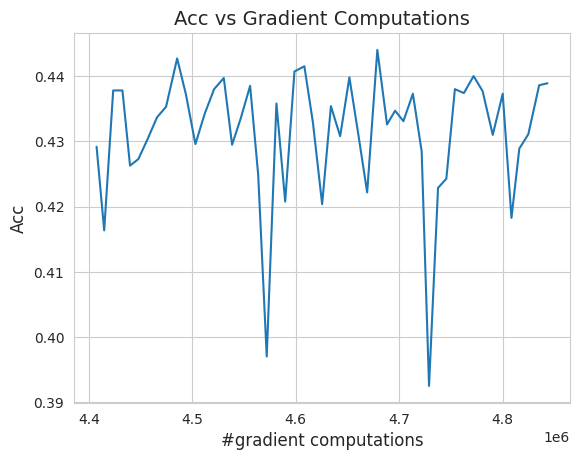

Training: 100%|██████████| 195/195 [00:01<00:00, 124.16it/s, loss=1.4039]


Epoch 52: val_acc=0.43359375


Training: 100%|██████████| 195/195 [00:01<00:00, 119.98it/s, loss=1.4705]


Epoch 53: val_acc=0.4339943826198578


Training: 100%|██████████| 195/195 [00:01<00:00, 123.55it/s, loss=1.3824]


Epoch 54: val_acc=0.43930289149284363


Training: 100%|██████████| 195/195 [00:01<00:00, 127.62it/s, loss=1.0617]


Epoch 55: val_acc=0.44220754504203796


Training: 100%|██████████| 195/195 [00:01<00:00, 111.21it/s, loss=1.2296]


Epoch 56: val_acc=0.4405048191547394


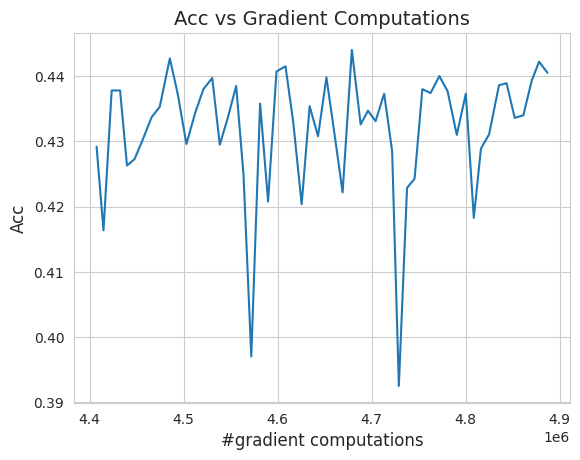

Training: 100%|██████████| 195/195 [00:01<00:00, 128.30it/s, loss=1.2511]


Epoch 57: val_acc=0.43870192766189575


Training: 100%|██████████| 195/195 [00:01<00:00, 123.67it/s, loss=1.2514]


Epoch 58: val_acc=0.4370993673801422


Training: 100%|██████████| 195/195 [00:01<00:00, 121.27it/s, loss=1.5890]


Epoch 59: val_acc=0.44280850887298584


Training: 100%|██████████| 195/195 [00:01<00:00, 129.46it/s, loss=1.6305]


Epoch 60: val_acc=0.44190704822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 123.11it/s, loss=1.1841]


Epoch 61: val_acc=0.43199118971824646


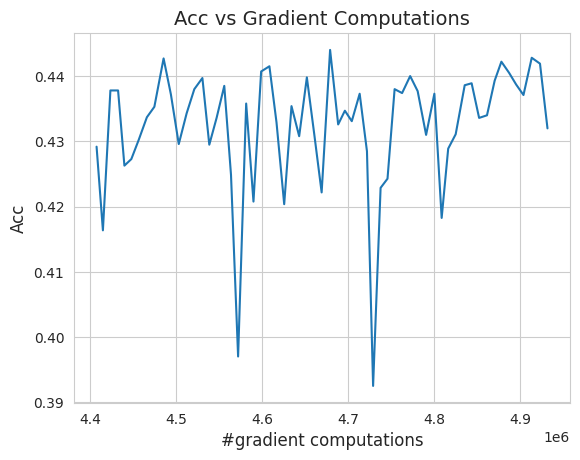

Training: 100%|██████████| 195/195 [00:01<00:00, 125.81it/s, loss=2.0229]


Epoch 62: val_acc=0.43960335850715637


Training: 100%|██████████| 195/195 [00:01<00:00, 124.62it/s, loss=0.9902]


Epoch 63: val_acc=0.44260817766189575


Training: 100%|██████████| 195/195 [00:01<00:00, 127.84it/s, loss=1.0884]


Epoch 64: val_acc=0.4333934485912323


Training: 100%|██████████| 195/195 [00:01<00:00, 131.60it/s, loss=1.6536]


Epoch 65: val_acc=0.4367988705635071


Training: 100%|██████████| 195/195 [00:01<00:00, 130.77it/s, loss=1.8922]


Epoch 66: val_acc=0.4279847741127014


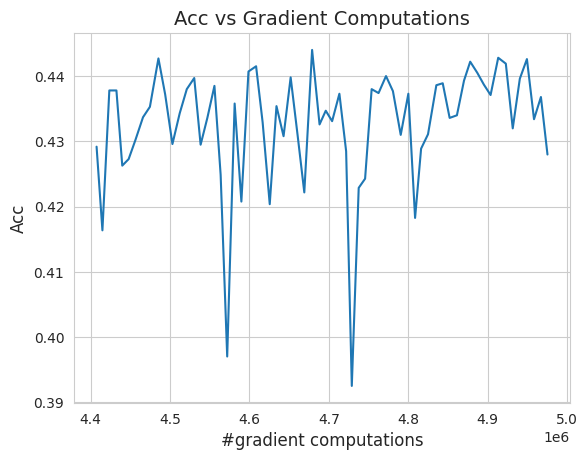

Training: 100%|██████████| 195/195 [00:01<00:00, 137.34it/s, loss=1.4334]


Epoch 67: val_acc=0.4382011294364929


Training: 100%|██████████| 195/195 [00:01<00:00, 123.02it/s, loss=1.2339]


Epoch 68: val_acc=0.43850159645080566


Training: 100%|██████████| 195/195 [00:01<00:00, 128.37it/s, loss=1.8004]


Epoch 69: val_acc=0.44110578298568726


Training: 100%|██████████| 195/195 [00:01<00:00, 135.28it/s, loss=1.3125]


Epoch 70: val_acc=0.44330930709838867


Training: 100%|██████████| 195/195 [00:01<00:00, 130.20it/s, loss=1.1699]


Epoch 71: val_acc=0.4397035241127014


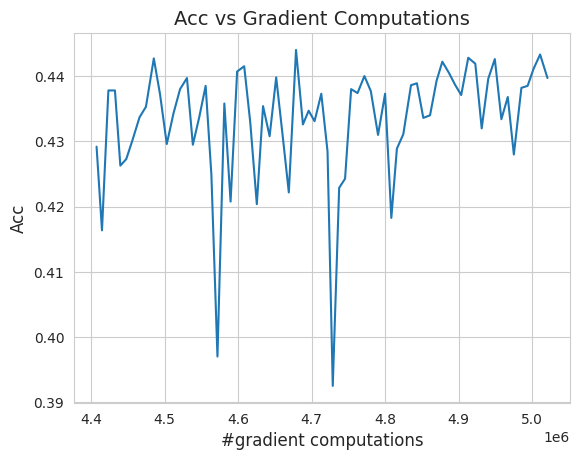

Training: 100%|██████████| 195/195 [00:01<00:00, 127.56it/s, loss=1.3146]


Epoch 72: val_acc=0.4333934485912323


Training: 100%|██████████| 195/195 [00:01<00:00, 128.33it/s, loss=1.1827]


Epoch 73: val_acc=0.44190704822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 124.85it/s, loss=1.2811]


Epoch 74: val_acc=0.4341947138309479


Training: 100%|██████████| 195/195 [00:01<00:00, 124.55it/s, loss=1.4232]


Epoch 75: val_acc=0.4436097741127014


Training: 100%|██████████| 195/195 [00:01<00:00, 132.49it/s, loss=1.0540]


Epoch 76: val_acc=0.4499198794364929


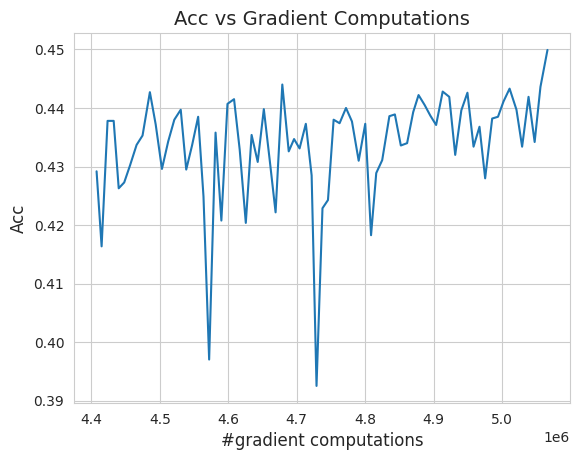

Training: 100%|██████████| 195/195 [00:01<00:00, 132.72it/s, loss=0.9501]


Epoch 77: val_acc=0.4431089758872986


Training: 100%|██████████| 195/195 [00:01<00:00, 129.62it/s, loss=1.0553]


Epoch 78: val_acc=0.4451121985912323


Training: 100%|██████████| 195/195 [00:01<00:00, 127.00it/s, loss=1.3646]


Epoch 79: val_acc=0.4436097741127014


Training: 100%|██████████| 195/195 [00:01<00:00, 127.84it/s, loss=1.7446]


Epoch 80: val_acc=0.4408052861690521


Training: 100%|██████████| 195/195 [00:01<00:00, 131.78it/s, loss=1.1556]


Epoch 81: val_acc=0.4357972741127014


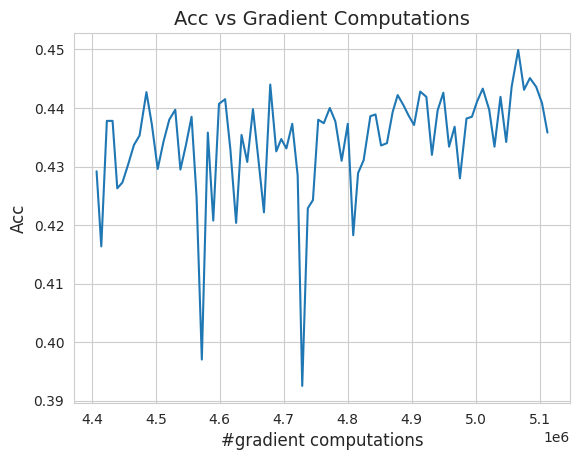

Training: 100%|██████████| 195/195 [00:01<00:00, 130.64it/s, loss=1.4893]


Epoch 82: val_acc=0.43780049681663513


Training: 100%|██████████| 195/195 [00:01<00:00, 128.64it/s, loss=1.2061]


Epoch 83: val_acc=0.4406049847602844


Training: 100%|██████████| 195/195 [00:01<00:00, 125.69it/s, loss=1.8813]


Epoch 84: val_acc=0.4399038553237915


Training: 100%|██████████| 195/195 [00:01<00:00, 122.60it/s, loss=1.4244]


Epoch 85: val_acc=0.4486177861690521


Training: 100%|██████████| 195/195 [00:01<00:00, 124.44it/s, loss=0.9532]


Epoch 86: val_acc=0.43199118971824646


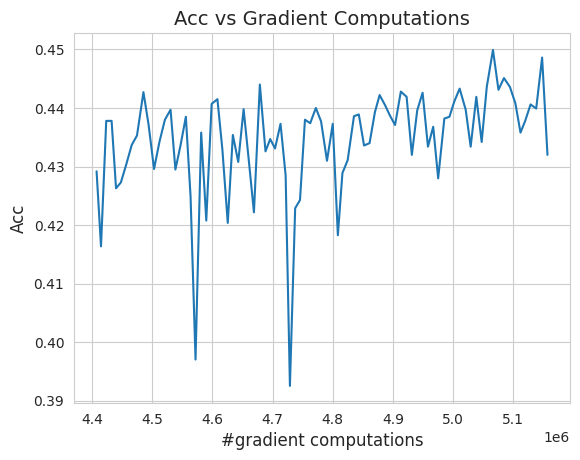

Training: 100%|██████████| 195/195 [00:01<00:00, 120.05it/s, loss=1.0844]


Epoch 87: val_acc=0.4079527258872986


Training: 100%|██████████| 195/195 [00:01<00:00, 132.35it/s, loss=1.2392]


Epoch 88: val_acc=0.4084535241127014


Training: 100%|██████████| 195/195 [00:01<00:00, 128.18it/s, loss=1.2606]


Epoch 89: val_acc=0.43159055709838867


Training: 100%|██████████| 195/195 [00:01<00:00, 128.52it/s, loss=1.5318]


Epoch 90: val_acc=0.4381009638309479


Training: 100%|██████████| 195/195 [00:01<00:00, 129.35it/s, loss=1.1294]


Epoch 91: val_acc=0.4445112347602844


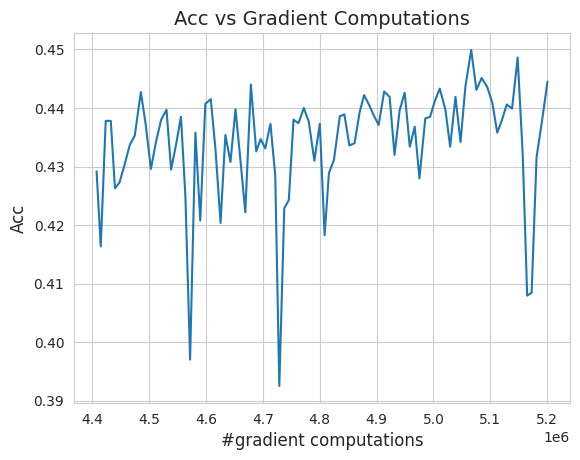

Training: 100%|██████████| 195/195 [00:01<00:00, 125.95it/s, loss=1.7515]


Epoch 92: val_acc=0.4270833432674408


Training: 100%|██████████| 195/195 [00:01<00:00, 124.52it/s, loss=1.3523]


Epoch 93: val_acc=0.3059895932674408


Training: 100%|██████████| 195/195 [00:01<00:00, 124.20it/s, loss=1.6363]


Epoch 94: val_acc=0.414963960647583


Training: 100%|██████████| 195/195 [00:01<00:00, 133.70it/s, loss=1.4488]


Epoch 95: val_acc=0.43219152092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 125.67it/s, loss=1.8656]


Epoch 96: val_acc=0.4407051205635071


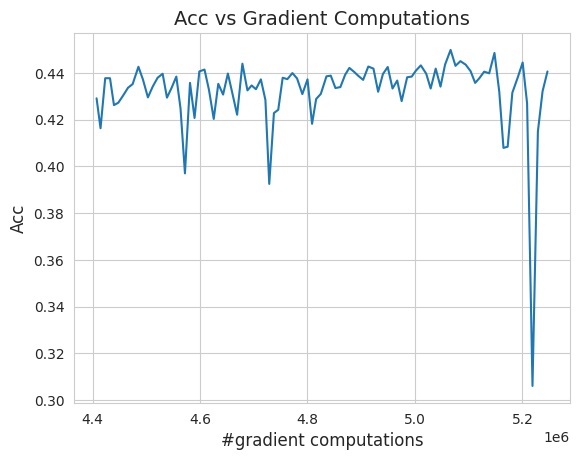

Training: 100%|██████████| 195/195 [00:01<00:00, 124.97it/s, loss=1.3649]


Epoch 97: val_acc=0.430588960647583


Training: 100%|██████████| 195/195 [00:01<00:00, 124.29it/s, loss=1.1884]


Epoch 98: val_acc=0.4412059485912323


Training: 100%|██████████| 195/195 [00:01<00:00, 134.46it/s, loss=1.4472]


Epoch 99: val_acc=0.44431090354919434


Training: 100%|██████████| 195/195 [00:01<00:00, 130.70it/s, loss=1.1765]


Epoch 100: val_acc=0.4399038553237915


Training: 100%|██████████| 195/195 [00:01<00:00, 130.56it/s, loss=1.2073]


Epoch 101: val_acc=0.44040465354919434


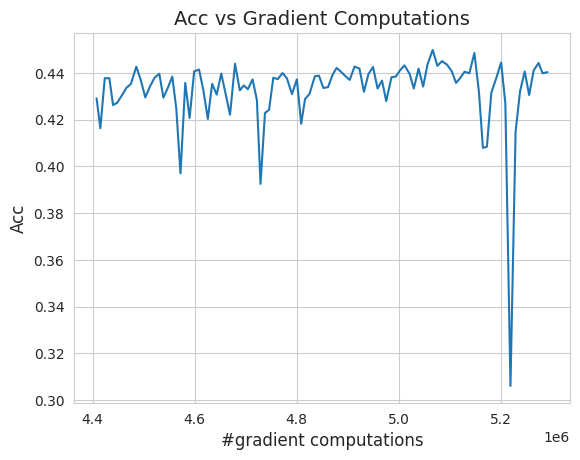

Training: 100%|██████████| 195/195 [00:01<00:00, 130.87it/s, loss=1.4622]


Epoch 102: val_acc=0.4464142620563507


Training: 100%|██████████| 195/195 [00:01<00:00, 127.88it/s, loss=1.5239]


Epoch 103: val_acc=0.4361979365348816


Training: 100%|██████████| 195/195 [00:01<00:00, 125.67it/s, loss=1.5933]


Epoch 104: val_acc=0.44240784645080566


Training: 100%|██████████| 195/195 [00:01<00:00, 123.81it/s, loss=1.5416]


Epoch 105: val_acc=0.4431089758872986


Training: 100%|██████████| 195/195 [00:01<00:00, 130.06it/s, loss=1.3306]


Epoch 106: val_acc=0.4466145932674408


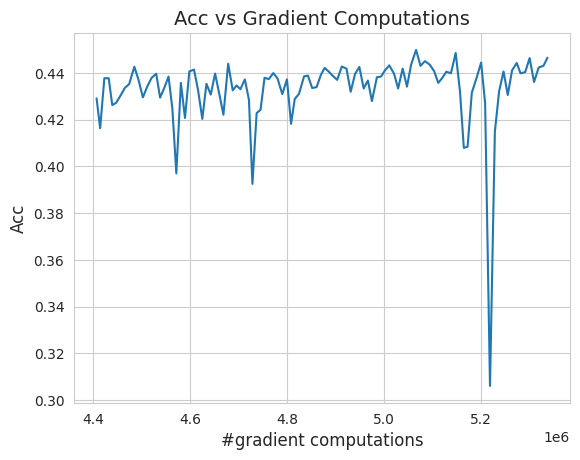

Training: 100%|██████████| 195/195 [00:01<00:00, 125.99it/s, loss=1.2969]


Epoch 107: val_acc=0.4421073794364929


Training: 100%|██████████| 195/195 [00:01<00:00, 132.87it/s, loss=1.4057]


Epoch 108: val_acc=0.43609777092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 134.90it/s, loss=1.4255]


Epoch 109: val_acc=0.4346955120563507


Training: 100%|██████████| 195/195 [00:01<00:00, 137.17it/s, loss=1.4116]


Epoch 110: val_acc=0.44150641560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 136.80it/s, loss=1.3305]


Epoch 111: val_acc=0.45132210850715637


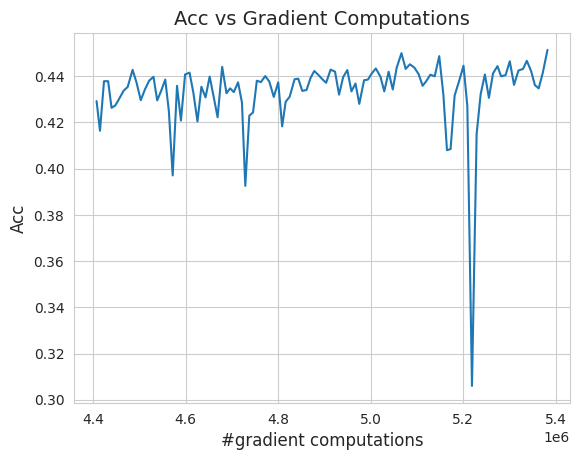

Training: 100%|██████████| 195/195 [00:01<00:00, 124.36it/s, loss=1.1430]


Epoch 112: val_acc=0.4436097741127014


Training: 100%|██████████| 195/195 [00:01<00:00, 123.70it/s, loss=1.3085]


Epoch 113: val_acc=0.4436097741127014


Training: 100%|██████████| 195/195 [00:01<00:00, 126.26it/s, loss=1.1327]


Epoch 114: val_acc=0.4505208432674408


Training: 100%|██████████| 195/195 [00:01<00:00, 128.59it/s, loss=1.3272]


Epoch 115: val_acc=0.4484174847602844


Training: 100%|██████████| 195/195 [00:01<00:00, 137.97it/s, loss=1.7720]


Epoch 116: val_acc=0.4298878312110901


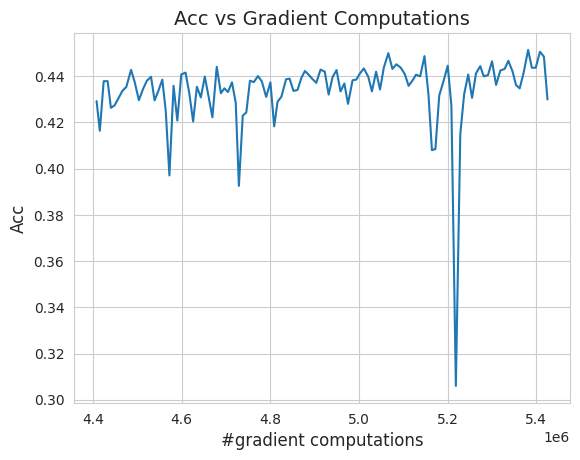

Training: 100%|██████████| 195/195 [00:01<00:00, 135.72it/s, loss=1.6418]


Epoch 117: val_acc=0.44260817766189575


Training: 100%|██████████| 195/195 [00:01<00:00, 124.63it/s, loss=1.0693]


Epoch 118: val_acc=0.45392629504203796


Training: 100%|██████████| 195/195 [00:01<00:00, 129.15it/s, loss=1.2584]


Epoch 119: val_acc=0.4464142620563507


Training: 100%|██████████| 195/195 [00:01<00:00, 137.03it/s, loss=1.3125]


Epoch 120: val_acc=0.44521233439445496


Training: 100%|██████████| 195/195 [00:01<00:00, 118.68it/s, loss=1.9818]


Epoch 121: val_acc=0.45282453298568726


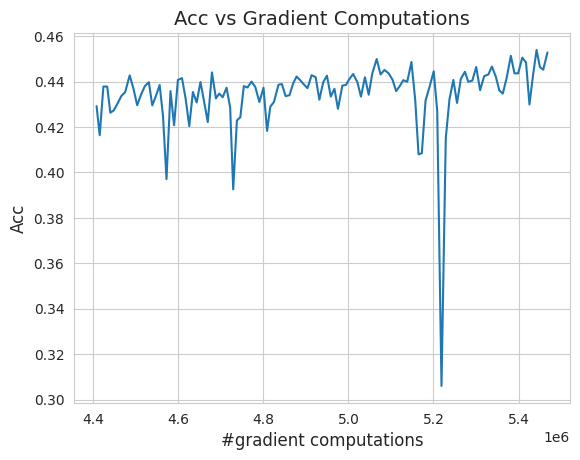

Training: 100%|██████████| 195/195 [00:01<00:00, 130.01it/s, loss=0.9954]


Epoch 122: val_acc=0.4490184485912323


Training: 100%|██████████| 195/195 [00:01<00:00, 136.62it/s, loss=0.9977]


Epoch 123: val_acc=0.45262420177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 126.22it/s, loss=1.5525]


Epoch 124: val_acc=0.4525240361690521


Training: 100%|██████████| 195/195 [00:01<00:00, 130.27it/s, loss=1.4223]


Epoch 125: val_acc=0.44611379504203796


Training: 100%|██████████| 195/195 [00:01<00:00, 131.28it/s, loss=1.3808]


Epoch 126: val_acc=0.446213960647583


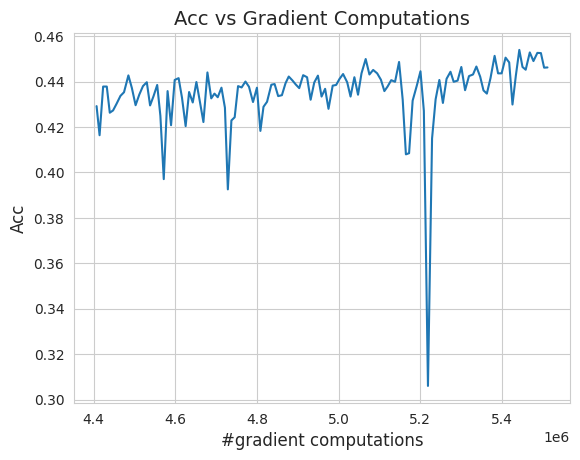

Training: 100%|██████████| 195/195 [00:01<00:00, 123.31it/s, loss=1.5002]


Epoch 127: val_acc=0.44561299681663513


Training: 100%|██████████| 195/195 [00:01<00:00, 133.37it/s, loss=1.5938]


Epoch 128: val_acc=0.4464142620563507


Training: 100%|██████████| 195/195 [00:01<00:00, 126.62it/s, loss=0.9974]


Epoch 129: val_acc=0.4475160241127014


Training: 100%|██████████| 195/195 [00:01<00:00, 125.63it/s, loss=1.3996]


Epoch 130: val_acc=0.4494190812110901


Training: 100%|██████████| 195/195 [00:01<00:00, 130.55it/s, loss=1.4839]


Epoch 131: val_acc=0.43629807233810425


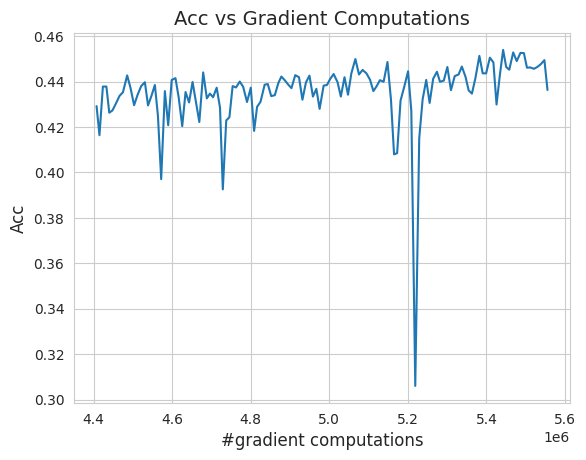

Training: 100%|██████████| 195/195 [00:01<00:00, 124.88it/s, loss=1.1975]


Epoch 132: val_acc=0.4516226053237915


Training: 100%|██████████| 195/195 [00:01<00:00, 134.78it/s, loss=1.8075]


Epoch 133: val_acc=0.44801682233810425


Training: 100%|██████████| 195/195 [00:01<00:00, 137.66it/s, loss=1.1171]


Epoch 134: val_acc=0.43800079822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 126.75it/s, loss=0.9644]


Epoch 135: val_acc=0.45212340354919434


Training: 100%|██████████| 195/195 [00:01<00:00, 119.87it/s, loss=1.2738]


Epoch 136: val_acc=0.43830129504203796


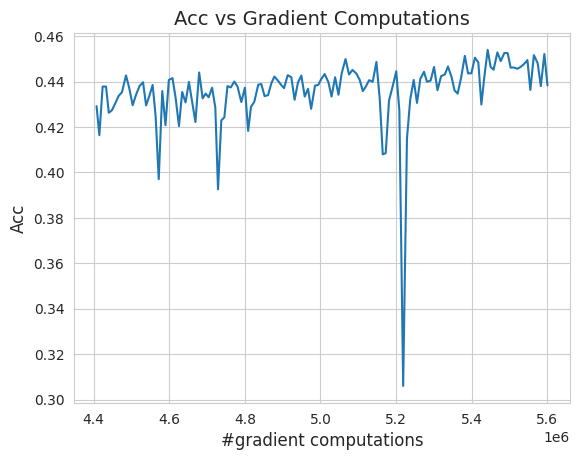

Training: 100%|██████████| 195/195 [00:01<00:00, 135.77it/s, loss=1.0814]


Epoch 137: val_acc=0.44140625


Training: 100%|██████████| 195/195 [00:01<00:00, 120.31it/s, loss=1.6628]


Epoch 138: val_acc=0.4449118673801422


Training: 100%|██████████| 195/195 [00:01<00:00, 133.03it/s, loss=1.4945]


Epoch 139: val_acc=0.45082131028175354


Training: 100%|██████████| 195/195 [00:01<00:00, 131.06it/s, loss=1.2492]


Epoch 140: val_acc=0.44260817766189575


Training: 100%|██████████| 195/195 [00:01<00:00, 132.21it/s, loss=1.3461]


Epoch 141: val_acc=0.45062100887298584


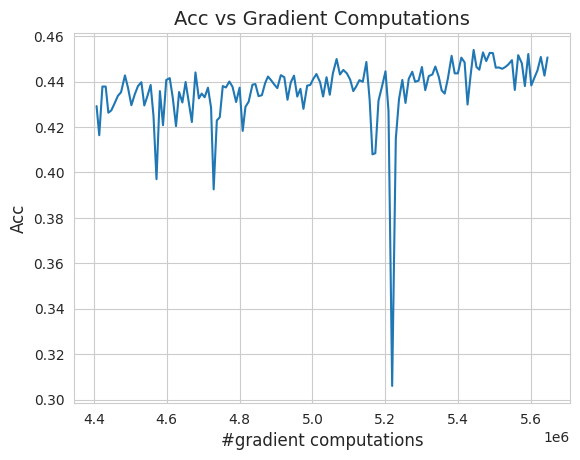

Training: 100%|██████████| 195/195 [00:01<00:00, 137.17it/s, loss=1.2606]


Epoch 142: val_acc=0.4490184485912323


Training: 100%|██████████| 195/195 [00:01<00:00, 126.72it/s, loss=1.3050]


Epoch 143: val_acc=0.45302483439445496


Training: 100%|██████████| 195/195 [00:01<00:00, 131.83it/s, loss=1.3646]


Epoch 144: val_acc=0.4368990361690521


Training: 100%|██████████| 195/195 [00:01<00:00, 134.68it/s, loss=1.2537]


Epoch 145: val_acc=0.4542267620563507


Training: 100%|██████████| 195/195 [00:01<00:00, 122.29it/s, loss=1.7188]


Epoch 146: val_acc=0.39072516560554504


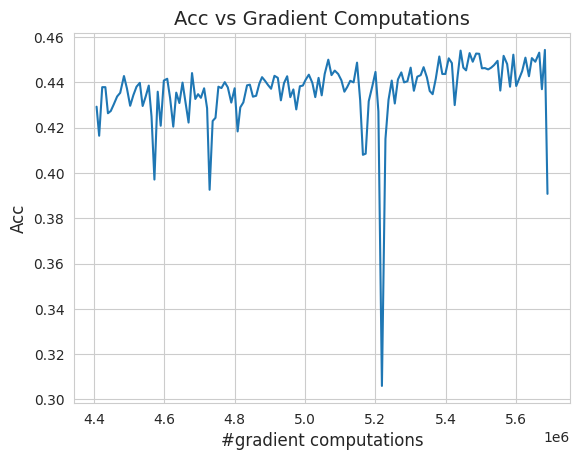

Training: 100%|██████████| 195/195 [00:01<00:00, 134.48it/s, loss=1.5694]


Epoch 147: val_acc=0.44240784645080566


Training: 100%|██████████| 195/195 [00:01<00:00, 139.31it/s, loss=1.7616]


Epoch 148: val_acc=0.4427083432674408


Training: 100%|██████████| 195/195 [00:01<00:00, 133.54it/s, loss=1.4383]


Epoch 149: val_acc=0.4537259638309479


Training: 100%|██████████| 195/195 [00:01<00:00, 133.63it/s, loss=1.0529]


Epoch 150: val_acc=0.45132210850715637


Training: 100%|██████████| 195/195 [00:01<00:00, 127.19it/s, loss=1.3460]


Epoch 151: val_acc=0.4442107379436493


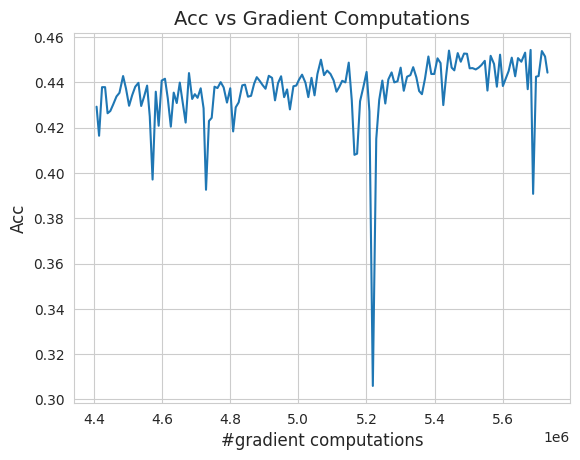

Training: 100%|██████████| 195/195 [00:01<00:00, 133.66it/s, loss=1.3276]


Epoch 152: val_acc=0.446213960647583


Training: 100%|██████████| 195/195 [00:01<00:00, 136.51it/s, loss=1.6883]


Epoch 153: val_acc=0.4455128312110901


Training: 100%|██████████| 195/195 [00:01<00:00, 125.32it/s, loss=1.3150]


Epoch 154: val_acc=0.4509214758872986


Training: 100%|██████████| 195/195 [00:01<00:00, 120.65it/s, loss=1.2460]


Epoch 155: val_acc=0.44631409645080566


Training: 100%|██████████| 195/195 [00:01<00:00, 132.90it/s, loss=1.3238]


Epoch 156: val_acc=0.438401460647583


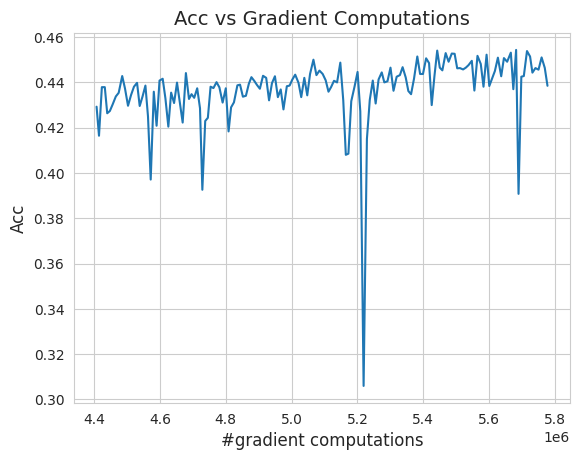

Training: 100%|██████████| 195/195 [00:01<00:00, 134.08it/s, loss=1.7982]


Epoch 157: val_acc=0.44671475887298584


Training: 100%|██████████| 195/195 [00:01<00:00, 130.33it/s, loss=1.2645]


Epoch 158: val_acc=0.44521233439445496


Training: 100%|██████████| 195/195 [00:01<00:00, 126.50it/s, loss=1.1899]


Epoch 159: val_acc=0.4451121985912323


Training: 100%|██████████| 195/195 [00:01<00:00, 123.47it/s, loss=1.2730]


Epoch 160: val_acc=0.4505208432674408


Training: 100%|██████████| 195/195 [00:01<00:00, 125.56it/s, loss=0.9721]


Epoch 161: val_acc=0.45562902092933655


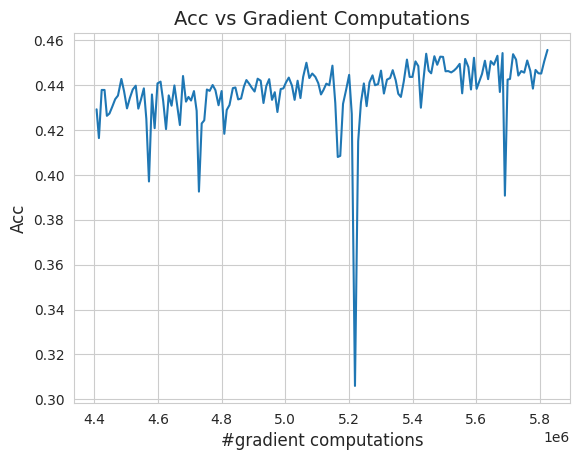

Training: 100%|██████████| 195/195 [00:01<00:00, 128.43it/s, loss=0.9556]


Epoch 162: val_acc=0.45883414149284363


Training: 100%|██████████| 195/195 [00:01<00:00, 120.53it/s, loss=1.9779]


Epoch 163: val_acc=0.4512219727039337


Training: 100%|██████████| 195/195 [00:01<00:00, 129.73it/s, loss=1.0781]


Epoch 164: val_acc=0.45502805709838867


Training: 100%|██████████| 195/195 [00:01<00:00, 125.32it/s, loss=1.5218]


Epoch 165: val_acc=0.4566306173801422


Training: 100%|██████████| 195/195 [00:01<00:00, 117.26it/s, loss=1.1277]


Epoch 166: val_acc=0.45132210850715637


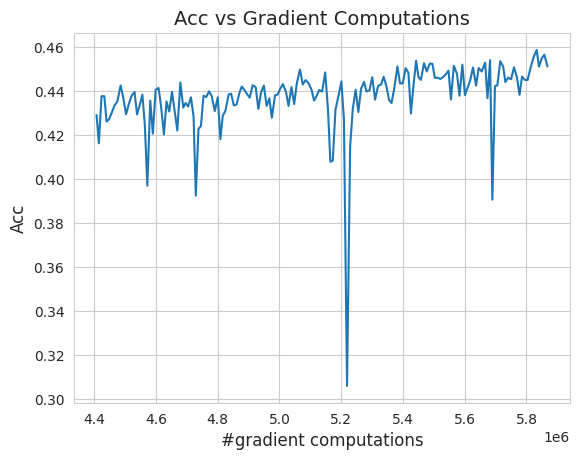

Training: 100%|██████████| 195/195 [00:01<00:00, 133.78it/s, loss=1.7035]


Epoch 167: val_acc=0.4566306173801422


Training: 100%|██████████| 195/195 [00:01<00:00, 128.49it/s, loss=1.2725]


Epoch 168: val_acc=0.44891828298568726


Training: 100%|██████████| 195/195 [00:01<00:00, 134.32it/s, loss=0.9446]


Epoch 169: val_acc=0.45112180709838867


Training: 100%|██████████| 195/195 [00:01<00:00, 139.82it/s, loss=0.8938]


Epoch 170: val_acc=0.45733174681663513


Training: 100%|██████████| 195/195 [00:01<00:00, 133.26it/s, loss=1.5985]


Epoch 171: val_acc=0.4488181173801422


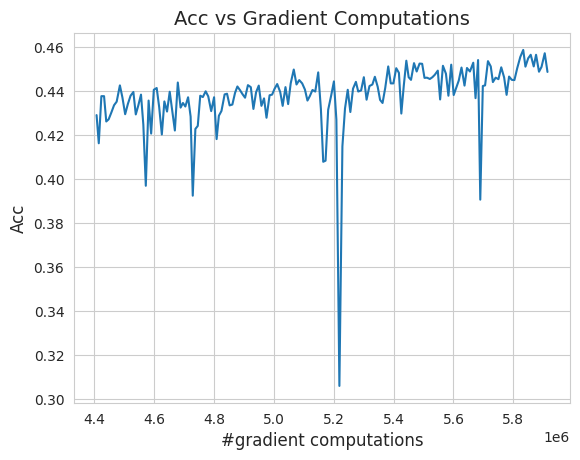

Training: 100%|██████████| 195/195 [00:01<00:00, 125.38it/s, loss=1.2802]


Epoch 172: val_acc=0.4527243673801422


Training: 100%|██████████| 195/195 [00:01<00:00, 126.74it/s, loss=1.4877]


Epoch 173: val_acc=0.44781652092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 141.92it/s, loss=1.3468]


Epoch 174: val_acc=0.4407051205635071


Training: 100%|██████████| 195/195 [00:01<00:00, 130.54it/s, loss=1.2106]


Epoch 175: val_acc=0.4488181173801422


Training: 100%|██████████| 195/195 [00:01<00:00, 127.05it/s, loss=1.5053]


Epoch 176: val_acc=0.44971954822540283


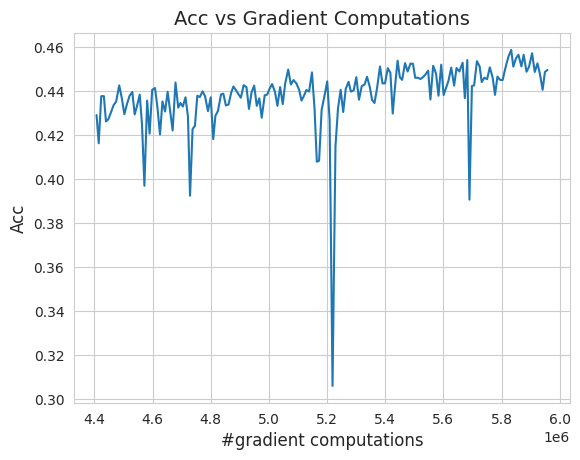

Training: 100%|██████████| 195/195 [00:01<00:00, 132.77it/s, loss=0.9990]


Epoch 177: val_acc=0.4557291865348816


Training: 100%|██████████| 195/195 [00:01<00:00, 129.63it/s, loss=1.0100]


Epoch 178: val_acc=0.4420072138309479


Training: 100%|██████████| 195/195 [00:01<00:00, 133.76it/s, loss=1.6045]


Epoch 179: val_acc=0.45673078298568726


Training: 100%|██████████| 195/195 [00:01<00:00, 138.19it/s, loss=1.7368]


Epoch 180: val_acc=0.4535256326198578


Training: 100%|██████████| 195/195 [00:01<00:00, 133.50it/s, loss=1.0661]


Epoch 181: val_acc=0.4622395932674408


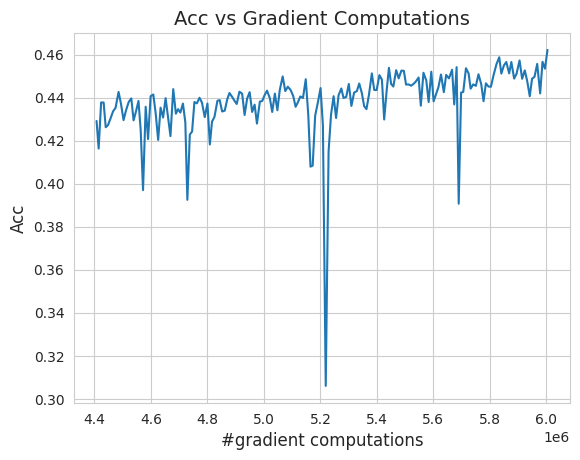

Training: 100%|██████████| 195/195 [00:01<00:00, 128.19it/s, loss=1.7070]


Epoch 182: val_acc=0.45282453298568726


Training: 100%|██████████| 195/195 [00:01<00:00, 138.10it/s, loss=1.2016]


Epoch 183: val_acc=0.4537259638309479


Training: 100%|██████████| 195/195 [00:01<00:00, 114.05it/s, loss=1.1615]


Epoch 184: val_acc=0.44971954822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 134.50it/s, loss=1.2567]


Epoch 185: val_acc=0.39723557233810425


Training: 100%|██████████| 195/195 [00:01<00:00, 130.15it/s, loss=1.2044]


Epoch 186: val_acc=0.4294871985912323


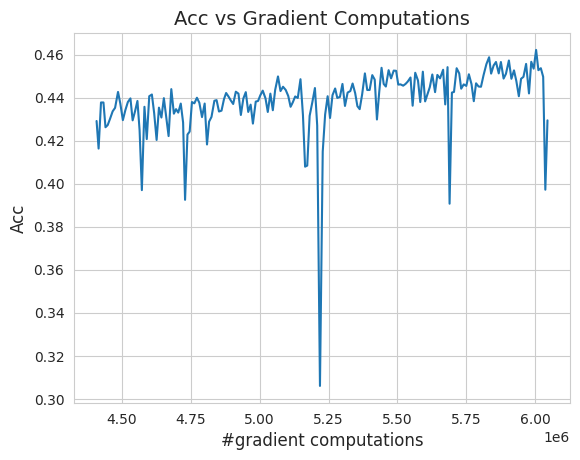

Training: 100%|██████████| 195/195 [00:01<00:00, 137.31it/s, loss=1.3363]


Epoch 187: val_acc=0.442307710647583


Training: 100%|██████████| 195/195 [00:01<00:00, 137.07it/s, loss=1.6465]


Epoch 188: val_acc=0.44691506028175354


Training: 100%|██████████| 195/195 [00:01<00:00, 122.28it/s, loss=1.3226]


Epoch 189: val_acc=0.4479166865348816


Training: 100%|██████████| 195/195 [00:01<00:00, 134.79it/s, loss=1.5310]


Epoch 190: val_acc=0.4498197138309479


Training: 100%|██████████| 195/195 [00:01<00:00, 128.46it/s, loss=1.3056]


Epoch 191: val_acc=0.44871795177459717


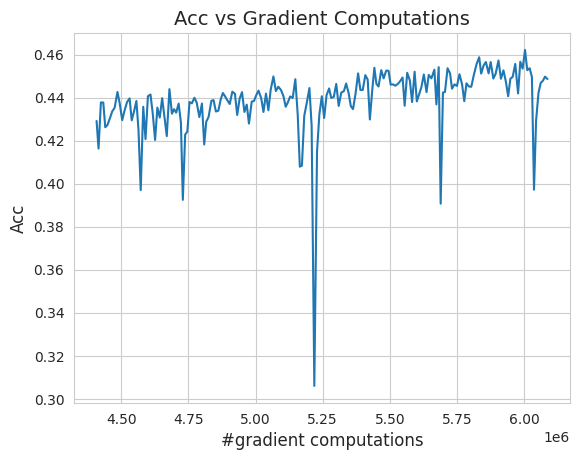

Training: 100%|██████████| 195/195 [00:01<00:00, 126.92it/s, loss=1.2636]


Epoch 192: val_acc=0.44240784645080566


Training: 100%|██████████| 195/195 [00:01<00:00, 136.37it/s, loss=1.3078]


Epoch 193: val_acc=0.45432692766189575


Training: 100%|██████████| 195/195 [00:01<00:00, 124.92it/s, loss=1.2565]


Epoch 194: val_acc=0.4535256326198578


Training: 100%|██████████| 195/195 [00:01<00:00, 134.02it/s, loss=1.5808]


Epoch 195: val_acc=0.45893430709838867


Training: 100%|██████████| 195/195 [00:01<00:00, 127.61it/s, loss=1.2579]


Epoch 196: val_acc=0.45602965354919434


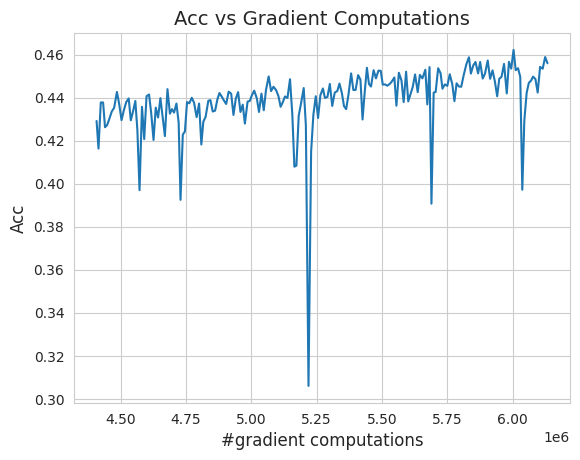

Training: 100%|██████████| 195/195 [00:01<00:00, 130.66it/s, loss=1.1419]


Epoch 197: val_acc=0.44931891560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 143.65it/s, loss=1.5963]


Epoch 198: val_acc=0.44821715354919434


Training: 100%|██████████| 195/195 [00:01<00:00, 130.32it/s, loss=1.4018]


Epoch 199: val_acc=0.45783254504203796


Training: 100%|██████████| 195/195 [00:01<00:00, 129.76it/s, loss=1.4999]


Epoch 200: val_acc=0.4505208432674408


Training: 100%|██████████| 195/195 [00:01<00:00, 135.71it/s, loss=1.2527]


Epoch 201: val_acc=0.457932710647583


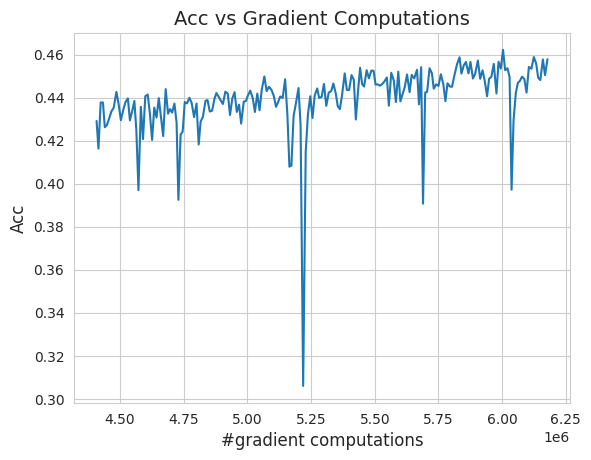

Training: 100%|██████████| 195/195 [00:01<00:00, 134.01it/s, loss=0.9383]


Epoch 202: val_acc=0.4609375


Training: 100%|██████████| 195/195 [00:01<00:00, 127.39it/s, loss=1.5593]


Epoch 203: val_acc=0.46103766560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 136.27it/s, loss=1.0301]


Epoch 204: val_acc=0.46434295177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 124.70it/s, loss=0.9169]


Epoch 205: val_acc=0.4577323794364929


Training: 100%|██████████| 195/195 [00:01<00:00, 143.00it/s, loss=1.4463]


Epoch 206: val_acc=0.4577323794364929


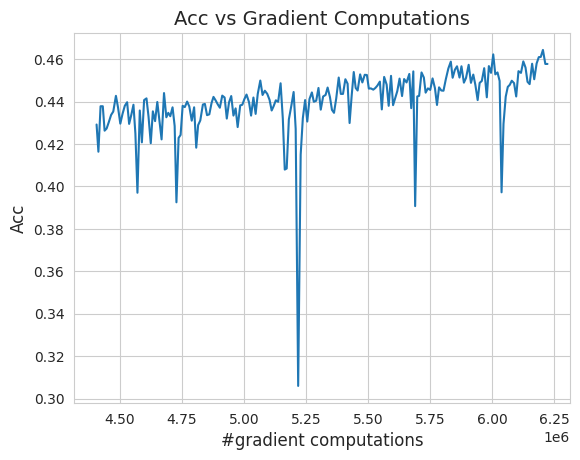

Training: 100%|██████████| 195/195 [00:01<00:00, 132.83it/s, loss=1.0594]


Epoch 207: val_acc=0.4609375


Training: 100%|██████████| 195/195 [00:01<00:00, 128.58it/s, loss=1.9172]


Epoch 208: val_acc=0.44330930709838867


Training: 100%|██████████| 195/195 [00:01<00:00, 135.25it/s, loss=1.3162]


Epoch 209: val_acc=0.45492789149284363


Training: 100%|██████████| 195/195 [00:01<00:00, 141.89it/s, loss=1.2147]


Epoch 210: val_acc=0.45082131028175354


Training: 100%|██████████| 195/195 [00:01<00:00, 132.88it/s, loss=1.2967]


Epoch 211: val_acc=0.4503205120563507


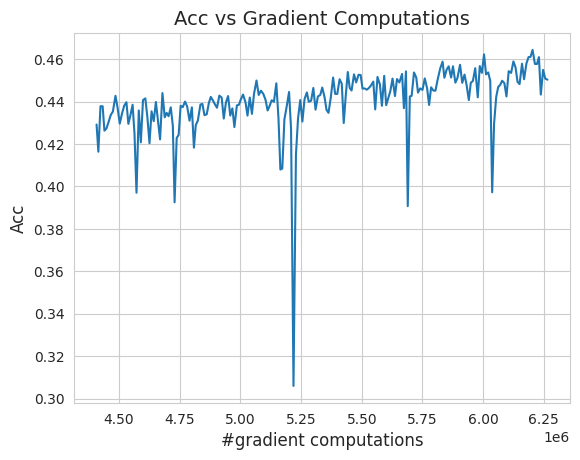

Training: 100%|██████████| 195/195 [00:01<00:00, 131.26it/s, loss=1.5064]


Epoch 212: val_acc=0.426682710647583


Training: 100%|██████████| 195/195 [00:01<00:00, 131.40it/s, loss=1.6504]


Epoch 213: val_acc=0.4464142620563507


Training: 100%|██████████| 195/195 [00:01<00:00, 145.73it/s, loss=1.2892]


Epoch 214: val_acc=0.4548277258872986


Training: 100%|██████████| 195/195 [00:01<00:00, 119.26it/s, loss=1.6489]


Epoch 215: val_acc=0.44130608439445496


Training: 100%|██████████| 195/195 [00:01<00:00, 121.25it/s, loss=1.2802]


Epoch 216: val_acc=0.4596354365348816


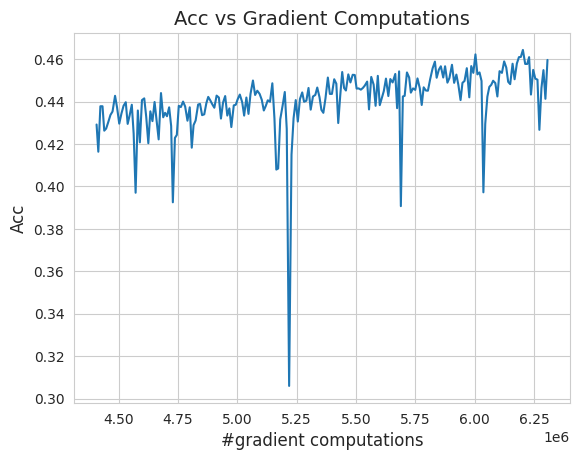

Training: 100%|██████████| 195/195 [00:01<00:00, 136.95it/s, loss=1.0298]


Epoch 217: val_acc=0.465745210647583


Training: 100%|██████████| 195/195 [00:01<00:00, 132.25it/s, loss=0.9917]


Epoch 218: val_acc=0.4646434485912323


Training: 100%|██████████| 195/195 [00:01<00:00, 123.37it/s, loss=1.0559]


Epoch 219: val_acc=0.4516226053237915


Training: 100%|██████████| 195/195 [00:01<00:00, 122.84it/s, loss=1.3680]


Epoch 220: val_acc=0.46624600887298584


Training: 100%|██████████| 195/195 [00:01<00:00, 116.22it/s, loss=1.3741]


Epoch 221: val_acc=0.4485176205635071


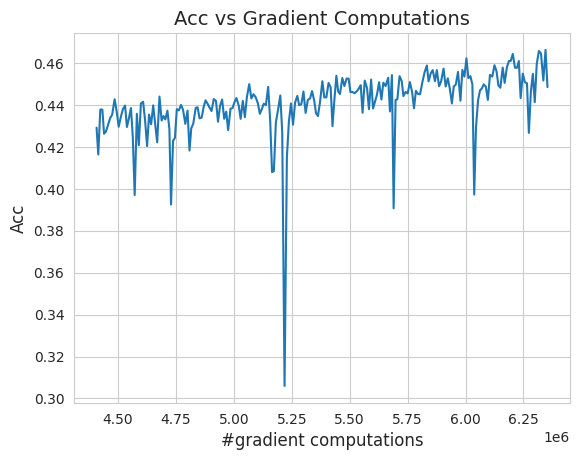

Training: 100%|██████████| 195/195 [00:01<00:00, 123.39it/s, loss=1.4597]


Epoch 222: val_acc=0.4633413553237915


Training: 100%|██████████| 195/195 [00:01<00:00, 117.27it/s, loss=0.9081]


Epoch 223: val_acc=0.4620392620563507


Training: 100%|██████████| 195/195 [00:01<00:00, 123.76it/s, loss=1.5357]


Epoch 224: val_acc=0.45002004504203796


Training: 100%|██████████| 195/195 [00:01<00:00, 125.89it/s, loss=1.2917]


Epoch 225: val_acc=0.45693108439445496


Training: 100%|██████████| 195/195 [00:01<00:00, 124.54it/s, loss=1.3981]


Epoch 226: val_acc=0.454026460647583


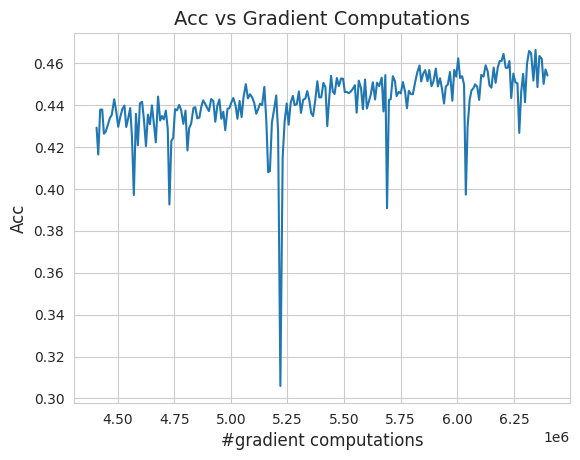

Training: 100%|██████████| 195/195 [00:01<00:00, 127.69it/s, loss=1.9030]


Epoch 227: val_acc=0.4486177861690521


Training: 100%|██████████| 195/195 [00:01<00:00, 128.46it/s, loss=1.7550]


Epoch 228: val_acc=0.46324118971824646


Training: 100%|██████████| 195/195 [00:01<00:00, 130.40it/s, loss=1.7917]


Epoch 229: val_acc=0.4563301205635071


Training: 100%|██████████| 195/195 [00:01<00:00, 128.15it/s, loss=1.2510]


Epoch 230: val_acc=0.4568309485912323


Training: 100%|██████████| 195/195 [00:01<00:00, 130.75it/s, loss=1.3672]


Epoch 231: val_acc=0.45542868971824646


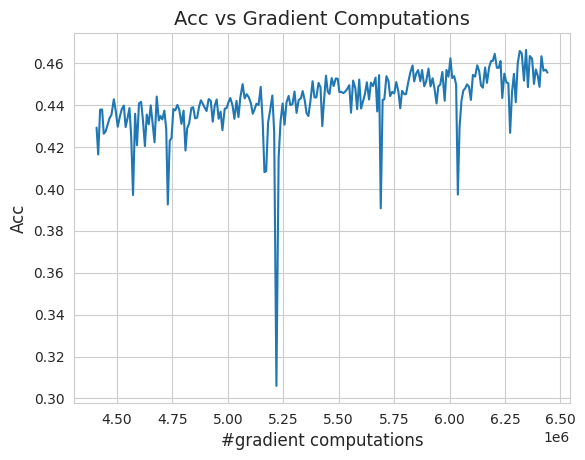

Training: 100%|██████████| 195/195 [00:01<00:00, 131.74it/s, loss=1.3052]


Epoch 232: val_acc=0.4566306173801422


Training: 100%|██████████| 195/195 [00:01<00:00, 132.53it/s, loss=1.5627]


Epoch 233: val_acc=0.45693108439445496


Training: 100%|██████████| 195/195 [00:01<00:00, 127.86it/s, loss=2.1900]


Epoch 234: val_acc=0.45883414149284363


Training: 100%|██████████| 195/195 [00:01<00:00, 133.97it/s, loss=1.3442]


Epoch 235: val_acc=0.45542868971824646


Training: 100%|██████████| 195/195 [00:01<00:00, 133.82it/s, loss=1.0859]


Epoch 236: val_acc=0.4551282227039337


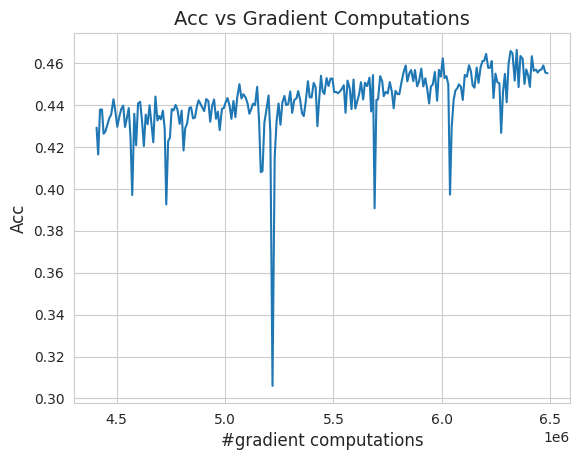

Training: 100%|██████████| 195/195 [00:01<00:00, 132.54it/s, loss=1.5320]


Epoch 237: val_acc=0.42788460850715637


Training: 100%|██████████| 195/195 [00:01<00:00, 129.65it/s, loss=1.3396]


Epoch 238: val_acc=0.45322516560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 139.26it/s, loss=1.0095]


Epoch 239: val_acc=0.4665464758872986


Training: 100%|██████████| 195/195 [00:01<00:00, 135.52it/s, loss=0.7915]


Epoch 240: val_acc=0.46173879504203796


Training: 100%|██████████| 195/195 [00:01<00:00, 123.39it/s, loss=1.0595]


Epoch 241: val_acc=0.4581330120563507


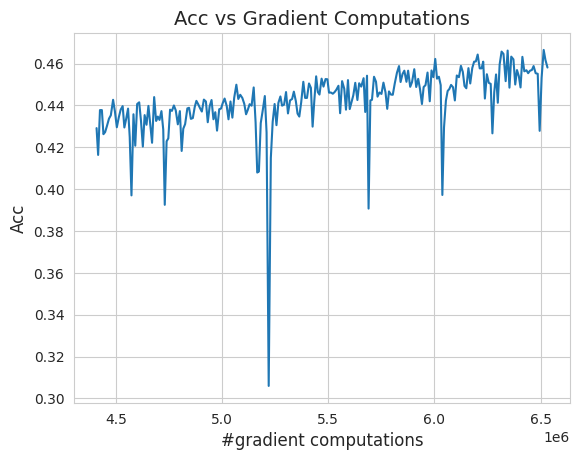

Training: 100%|██████████| 195/195 [00:01<00:00, 139.10it/s, loss=1.4822]


Epoch 242: val_acc=0.46304085850715637


Training: 100%|██████████| 195/195 [00:01<00:00, 123.54it/s, loss=1.2707]


Epoch 243: val_acc=0.4616386294364929


Training: 100%|██████████| 195/195 [00:01<00:00, 131.25it/s, loss=1.0346]


Epoch 244: val_acc=0.45602965354919434


Training: 100%|██████████| 195/195 [00:01<00:00, 122.60it/s, loss=1.4356]


Epoch 245: val_acc=0.4670472741127014


Training: 100%|██████████| 195/195 [00:01<00:00, 126.09it/s, loss=1.1395]


Epoch 246: val_acc=0.46173879504203796


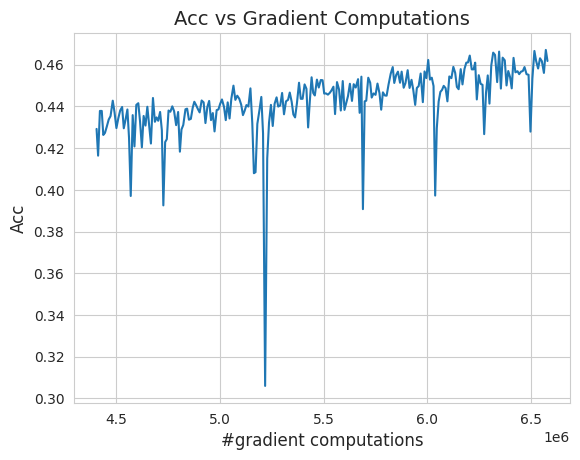

Training: 100%|██████████| 195/195 [00:01<00:00, 135.81it/s, loss=1.0362]


Epoch 247: val_acc=0.4535256326198578


Training: 100%|██████████| 195/195 [00:01<00:00, 132.04it/s, loss=0.9105]


Epoch 248: val_acc=0.45452725887298584


Training: 100%|██████████| 195/195 [00:01<00:00, 127.23it/s, loss=1.3791]


Epoch 249: val_acc=0.45562902092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 119.85it/s, loss=1.3341]


Epoch 250: val_acc=0.46564504504203796


Training: 100%|██████████| 195/195 [00:01<00:00, 126.27it/s, loss=1.3249]


Epoch 251: val_acc=0.4561298191547394


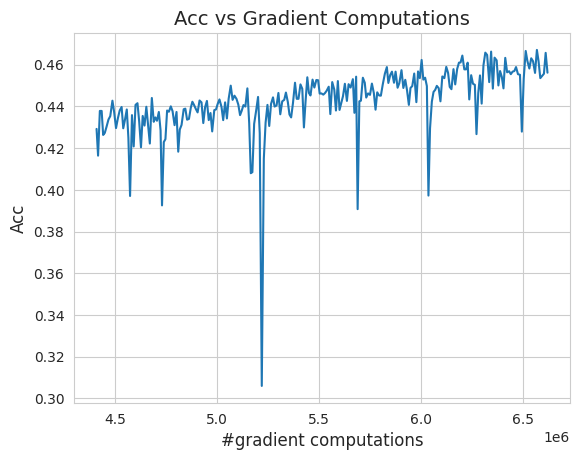

Training: 100%|██████████| 195/195 [00:01<00:00, 120.67it/s, loss=1.3113]


Epoch 252: val_acc=0.4535256326198578


Training: 100%|██████████| 195/195 [00:01<00:00, 129.80it/s, loss=1.2625]


Epoch 253: val_acc=0.46484375


Training: 100%|██████████| 195/195 [00:01<00:00, 129.95it/s, loss=1.8589]


Epoch 254: val_acc=0.46564504504203796


Training: 100%|██████████| 195/195 [00:01<00:00, 128.23it/s, loss=1.7752]


Epoch 255: val_acc=0.4713541865348816


Training: 100%|██████████| 195/195 [00:01<00:00, 109.87it/s, loss=1.0156]


Epoch 256: val_acc=0.46233975887298584


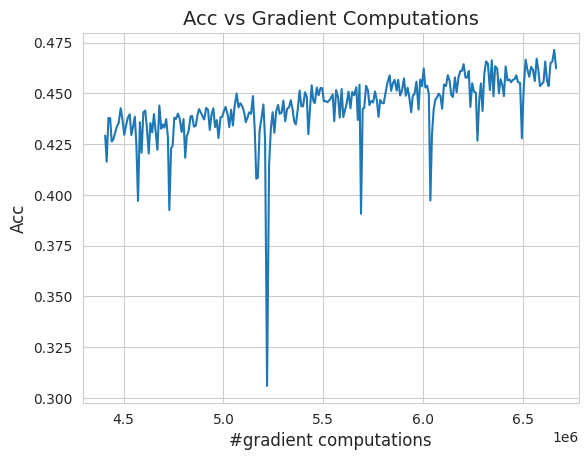

Training: 100%|██████████| 195/195 [00:01<00:00, 130.02it/s, loss=1.6373]


Epoch 257: val_acc=0.44110578298568726


Training: 100%|██████████| 195/195 [00:01<00:00, 113.32it/s, loss=0.9906]


Epoch 258: val_acc=0.46484375


Training: 100%|██████████| 195/195 [00:01<00:00, 112.38it/s, loss=1.3547]


Epoch 259: val_acc=0.46604567766189575


Training: 100%|██████████| 195/195 [00:01<00:00, 124.20it/s, loss=1.2594]


Epoch 260: val_acc=0.4626402258872986


Training: 100%|██████████| 195/195 [00:01<00:00, 120.30it/s, loss=1.2675]


Epoch 261: val_acc=0.46754807233810425


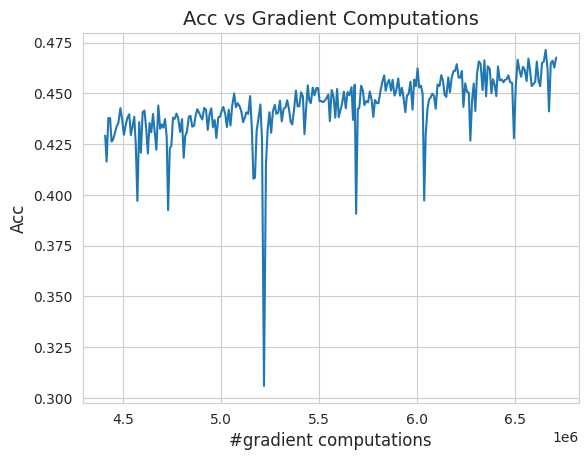

Training: 100%|██████████| 195/195 [00:01<00:00, 128.79it/s, loss=1.6370]


Epoch 262: val_acc=0.4633413553237915


Training: 100%|██████████| 195/195 [00:01<00:00, 133.48it/s, loss=1.2217]


Epoch 263: val_acc=0.4624399244785309


Training: 100%|██████████| 195/195 [00:01<00:00, 117.75it/s, loss=1.0528]


Epoch 264: val_acc=0.4316907227039337


Training: 100%|██████████| 195/195 [00:01<00:00, 123.93it/s, loss=1.3108]


Epoch 265: val_acc=0.4600360691547394


Training: 100%|██████████| 195/195 [00:01<00:00, 124.63it/s, loss=1.2163]


Epoch 266: val_acc=0.45673078298568726


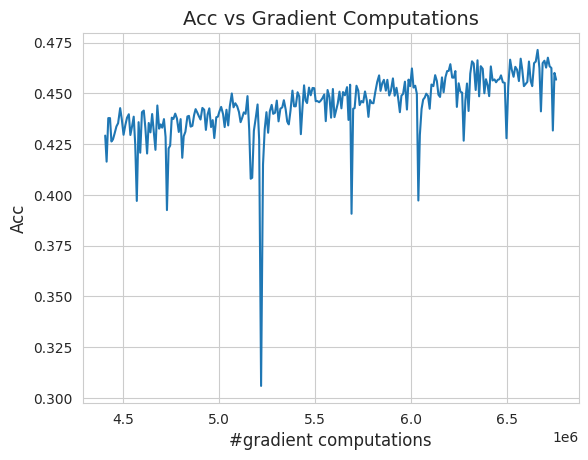

Training: 100%|██████████| 195/195 [00:01<00:00, 128.15it/s, loss=1.0669]


Epoch 267: val_acc=0.46714743971824646


Training: 100%|██████████| 195/195 [00:01<00:00, 124.40it/s, loss=1.1727]


Epoch 268: val_acc=0.41416266560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 131.22it/s, loss=1.1909]


Epoch 269: val_acc=0.4622395932674408


Training: 100%|██████████| 195/195 [00:01<00:00, 125.17it/s, loss=1.4848]


Epoch 270: val_acc=0.44411057233810425


Training: 100%|██████████| 195/195 [00:01<00:00, 122.80it/s, loss=1.1606]


Epoch 271: val_acc=0.4442107379436493


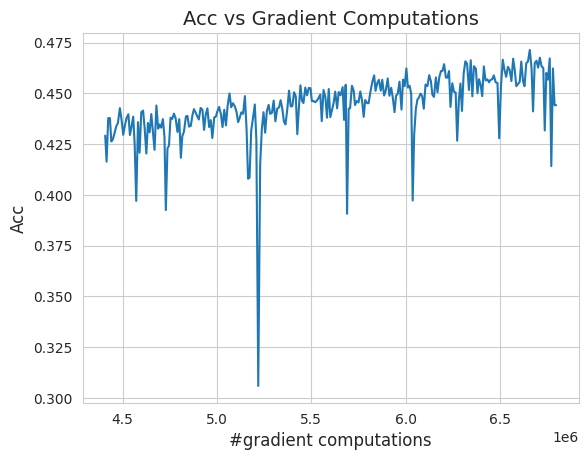

Training: 100%|██████████| 195/195 [00:01<00:00, 121.67it/s, loss=1.3599]


Epoch 272: val_acc=0.4598357379436493


Training: 100%|██████████| 195/195 [00:01<00:00, 125.71it/s, loss=1.2749]


Epoch 273: val_acc=0.46324118971824646


Training: 100%|██████████| 195/195 [00:01<00:00, 118.80it/s, loss=1.1843]


Epoch 274: val_acc=0.4624399244785309


Training: 100%|██████████| 195/195 [00:01<00:00, 123.07it/s, loss=1.4472]


Epoch 275: val_acc=0.4693509638309479


Training: 100%|██████████| 195/195 [00:01<00:00, 129.45it/s, loss=1.2285]


Epoch 276: val_acc=0.45693108439445496


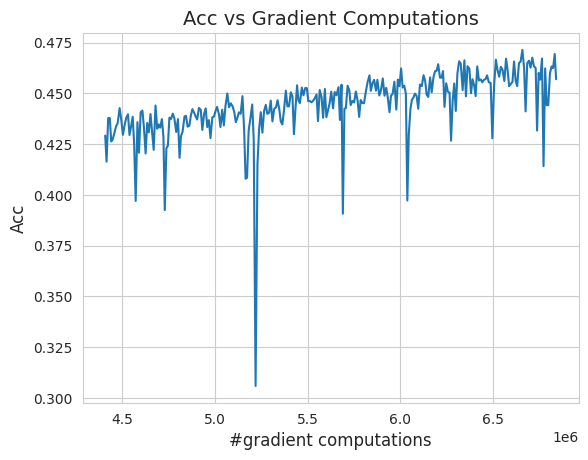

Training: 100%|██████████| 195/195 [00:01<00:00, 133.27it/s, loss=1.0172]


Epoch 277: val_acc=0.4611378312110901


Training: 100%|██████████| 195/195 [00:01<00:00, 123.53it/s, loss=1.5252]


Epoch 278: val_acc=0.46254006028175354


Training: 100%|██████████| 195/195 [00:01<00:00, 116.01it/s, loss=1.4935]


Epoch 279: val_acc=0.4674479365348816


Training: 100%|██████████| 195/195 [00:01<00:00, 130.60it/s, loss=1.3432]


Epoch 280: val_acc=0.46384215354919434


Training: 100%|██████████| 195/195 [00:01<00:00, 129.32it/s, loss=1.2519]


Epoch 281: val_acc=0.46083733439445496


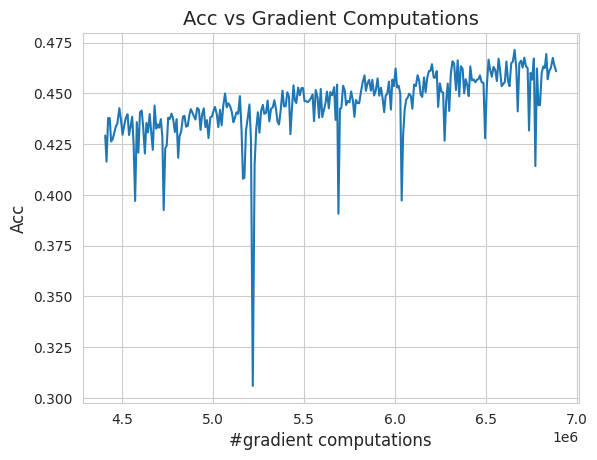

Training: 100%|██████████| 195/195 [00:01<00:00, 126.25it/s, loss=1.3237]


Epoch 282: val_acc=0.4650440812110901


Training: 100%|██████████| 195/195 [00:01<00:00, 125.61it/s, loss=1.2244]


Epoch 283: val_acc=0.47055289149284363


Training: 100%|██████████| 195/195 [00:01<00:00, 118.65it/s, loss=1.5054]


Epoch 284: val_acc=0.4624399244785309


Training: 100%|██████████| 195/195 [00:01<00:00, 118.44it/s, loss=1.2236]


Epoch 285: val_acc=0.46103766560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 121.82it/s, loss=1.4365]


Epoch 286: val_acc=0.47165465354919434


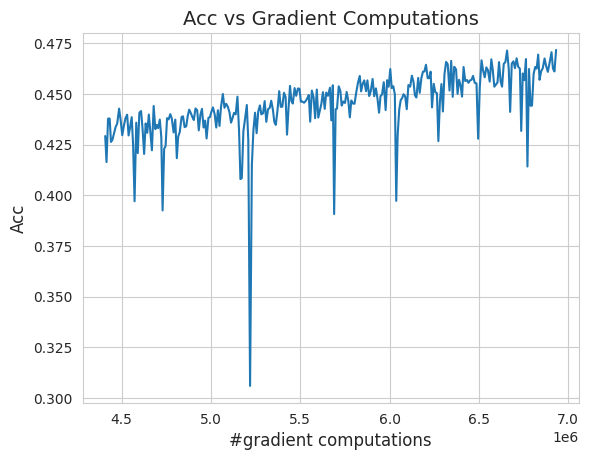

Training: 100%|██████████| 195/195 [00:01<00:00, 117.48it/s, loss=1.0263]


Epoch 287: val_acc=0.46754807233810425


Training: 100%|██████████| 195/195 [00:01<00:00, 125.47it/s, loss=1.1282]


Epoch 288: val_acc=0.4654447138309479


Training: 100%|██████████| 195/195 [00:01<00:00, 123.62it/s, loss=1.0742]


Epoch 289: val_acc=0.4693509638309479


Training: 100%|██████████| 195/195 [00:01<00:00, 127.05it/s, loss=1.1311]


Epoch 290: val_acc=0.4641426205635071


Training: 100%|██████████| 195/195 [00:01<00:00, 118.24it/s, loss=1.1945]


Epoch 291: val_acc=0.4603365361690521


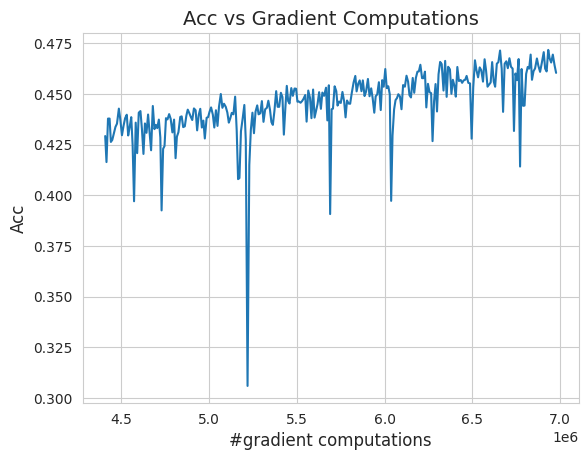

Training: 100%|██████████| 195/195 [00:01<00:00, 121.10it/s, loss=1.4777]


Epoch 292: val_acc=0.46103766560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 120.81it/s, loss=1.3281]


Epoch 293: val_acc=0.46674680709838867


Training: 100%|██████████| 195/195 [00:01<00:00, 115.41it/s, loss=1.2340]


Epoch 294: val_acc=0.4542267620563507


Training: 100%|██████████| 195/195 [00:01<00:00, 124.64it/s, loss=1.4562]


Epoch 295: val_acc=0.4644431173801422


Training: 100%|██████████| 195/195 [00:01<00:00, 127.28it/s, loss=1.4917]


Epoch 296: val_acc=0.45993590354919434


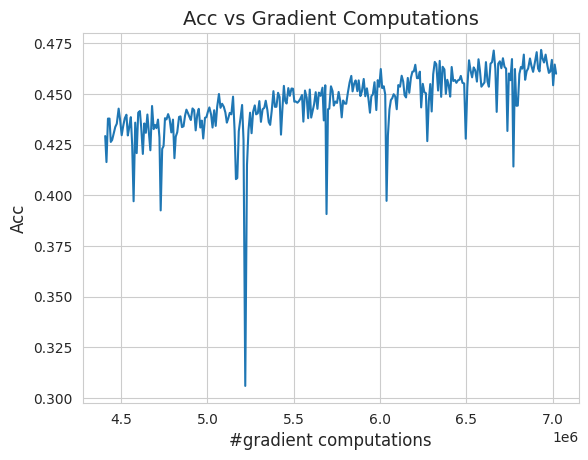

Training: 100%|██████████| 195/195 [00:01<00:00, 134.93it/s, loss=1.5884]


Epoch 297: val_acc=0.4551282227039337


Training: 100%|██████████| 195/195 [00:01<00:00, 121.35it/s, loss=1.2908]


Epoch 298: val_acc=0.46173879504203796


Training: 100%|██████████| 195/195 [00:01<00:00, 122.95it/s, loss=1.3402]


Epoch 299: val_acc=0.46514424681663513


Training: 100%|██████████| 195/195 [00:01<00:00, 123.12it/s, loss=1.1842]


Epoch 300: val_acc=0.442307710647583


Training: 100%|██████████| 195/195 [00:01<00:00, 121.96it/s, loss=0.9779]


Epoch 301: val_acc=0.4555288553237915


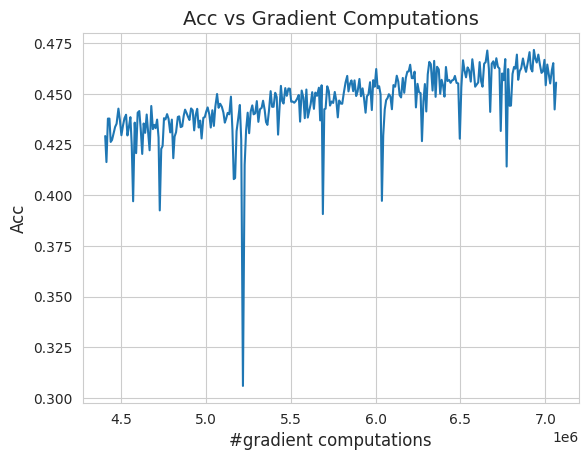

Training: 100%|██████████| 195/195 [00:01<00:00, 115.70it/s, loss=1.3600]


Epoch 302: val_acc=0.47015225887298584


Training: 100%|██████████| 195/195 [00:01<00:00, 130.53it/s, loss=1.0785]


Epoch 303: val_acc=0.4670472741127014


Training: 100%|██████████| 195/195 [00:01<00:00, 129.52it/s, loss=1.2479]


Epoch 304: val_acc=0.46344152092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 129.11it/s, loss=0.9415]


Epoch 305: val_acc=0.4559294879436493


Training: 100%|██████████| 195/195 [00:01<00:00, 131.54it/s, loss=0.7895]


Epoch 306: val_acc=0.47165465354919434


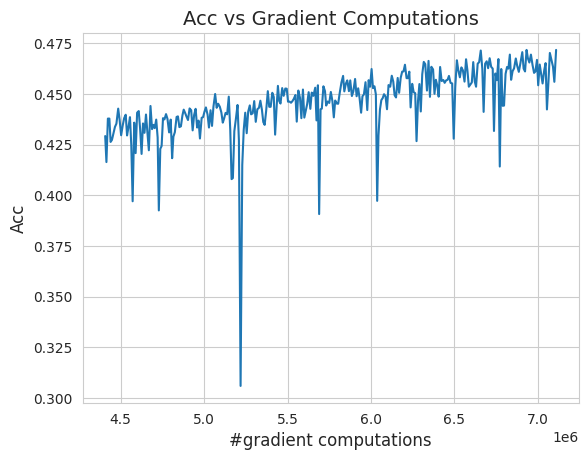

Training: 100%|██████████| 195/195 [00:01<00:00, 125.01it/s, loss=1.3359]


Epoch 307: val_acc=0.4707532227039337


Training: 100%|██████████| 195/195 [00:01<00:00, 125.93it/s, loss=1.5066]


Epoch 308: val_acc=0.4668469727039337


Training: 100%|██████████| 195/195 [00:01<00:00, 123.15it/s, loss=1.3432]


Epoch 309: val_acc=0.46774840354919434


Training: 100%|██████████| 195/195 [00:01<00:00, 116.21it/s, loss=1.3056]


Epoch 310: val_acc=0.46364182233810425


Training: 100%|██████████| 195/195 [00:01<00:00, 128.49it/s, loss=1.0659]


Epoch 311: val_acc=0.46604567766189575


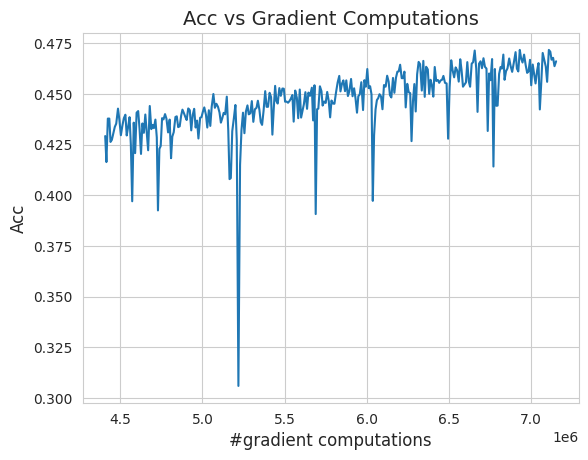

Training: 100%|██████████| 195/195 [00:01<00:00, 121.06it/s, loss=0.9388]


Epoch 312: val_acc=0.4654447138309479


Training: 100%|██████████| 195/195 [00:01<00:00, 123.19it/s, loss=1.5396]


Epoch 313: val_acc=0.47035256028175354


Training: 100%|██████████| 195/195 [00:01<00:00, 116.92it/s, loss=1.7143]


Epoch 314: val_acc=0.4717548191547394


Training: 100%|██████████| 195/195 [00:01<00:00, 130.70it/s, loss=1.2536]


Epoch 315: val_acc=0.46484375


Training: 100%|██████████| 195/195 [00:01<00:00, 125.58it/s, loss=1.3316]


Epoch 316: val_acc=0.4624399244785309


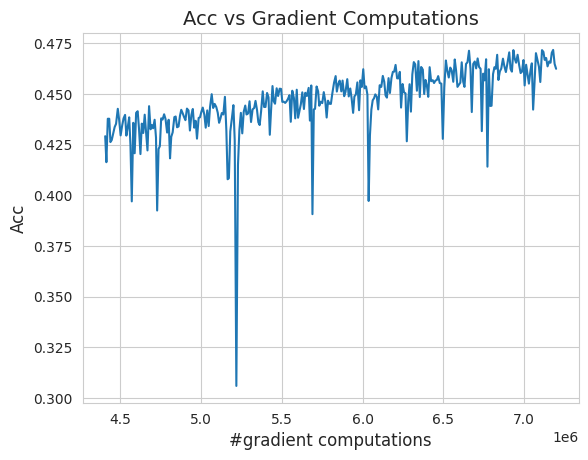

Training: 100%|██████████| 195/195 [00:01<00:00, 128.47it/s, loss=1.6313]


Epoch 317: val_acc=0.4596354365348816


Training: 100%|██████████| 195/195 [00:01<00:00, 125.35it/s, loss=1.7963]


Epoch 318: val_acc=0.4641426205635071


Training: 100%|██████████| 195/195 [00:01<00:00, 128.68it/s, loss=1.3288]


Epoch 319: val_acc=0.4640424847602844


Training: 100%|██████████| 195/195 [00:01<00:00, 119.86it/s, loss=1.0497]


Epoch 320: val_acc=0.4674479365348816


Training: 100%|██████████| 195/195 [00:01<00:00, 132.39it/s, loss=1.3422]


Epoch 321: val_acc=0.46604567766189575


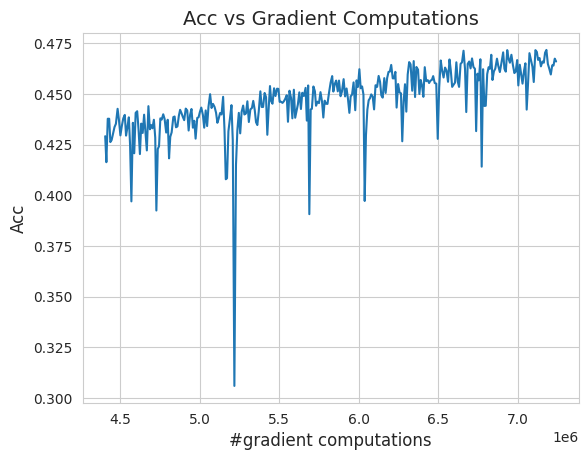

Training: 100%|██████████| 195/195 [00:01<00:00, 125.63it/s, loss=0.8511]


Epoch 322: val_acc=0.46975159645080566


Training: 100%|██████████| 195/195 [00:01<00:00, 122.92it/s, loss=1.2049]


Epoch 323: val_acc=0.4681490361690521


Training: 100%|██████████| 195/195 [00:01<00:00, 122.43it/s, loss=1.3776]


Epoch 324: val_acc=0.45102164149284363


Training: 100%|██████████| 195/195 [00:01<00:00, 119.89it/s, loss=1.0345]


Epoch 325: val_acc=0.4700520932674408


Training: 100%|██████████| 195/195 [00:01<00:00, 127.36it/s, loss=1.0802]


Epoch 326: val_acc=0.4674479365348816


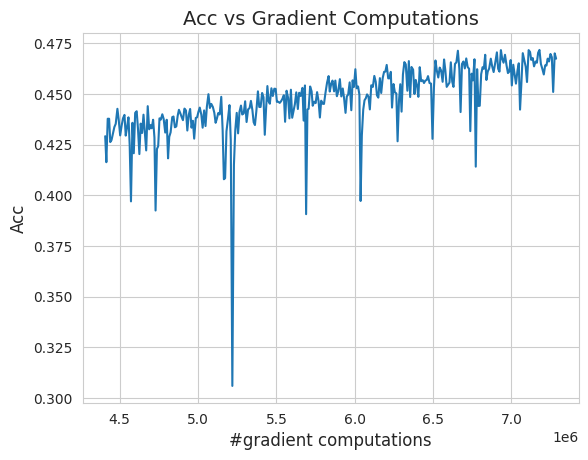

Training: 100%|██████████| 195/195 [00:01<00:00, 122.03it/s, loss=1.2103]


Epoch 327: val_acc=0.4620392620563507


Training: 100%|██████████| 195/195 [00:01<00:00, 135.69it/s, loss=1.1415]


Epoch 328: val_acc=0.4637419879436493


Training: 100%|██████████| 195/195 [00:01<00:00, 123.84it/s, loss=0.7894]


Epoch 329: val_acc=0.41676682233810425


Training: 100%|██████████| 195/195 [00:01<00:00, 121.77it/s, loss=1.7708]


Epoch 330: val_acc=0.45152243971824646


Training: 100%|██████████| 195/195 [00:01<00:00, 115.49it/s, loss=1.1290]


Epoch 331: val_acc=0.45933493971824646


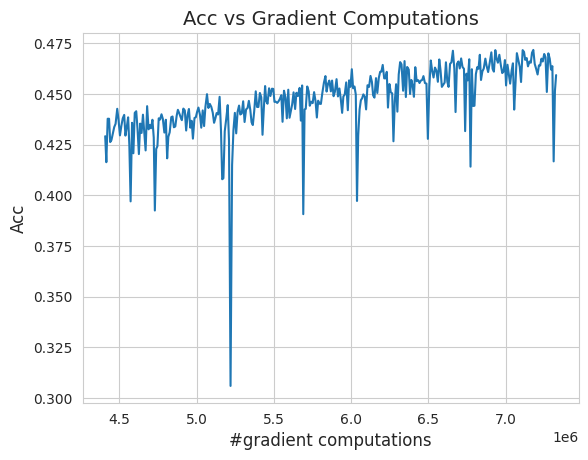

Training: 100%|██████████| 195/195 [00:01<00:00, 127.83it/s, loss=1.2423]


Epoch 332: val_acc=0.46123799681663513


Training: 100%|██████████| 195/195 [00:01<00:00, 126.24it/s, loss=1.1838]


Epoch 333: val_acc=0.45843350887298584


Training: 100%|██████████| 195/195 [00:01<00:00, 132.44it/s, loss=1.4633]


Epoch 334: val_acc=0.4650440812110901


Training: 100%|██████████| 195/195 [00:01<00:00, 133.01it/s, loss=1.2853]


Epoch 335: val_acc=0.4626402258872986


Training: 100%|██████████| 195/195 [00:01<00:00, 126.08it/s, loss=1.0472]


Epoch 336: val_acc=0.4679487347602844


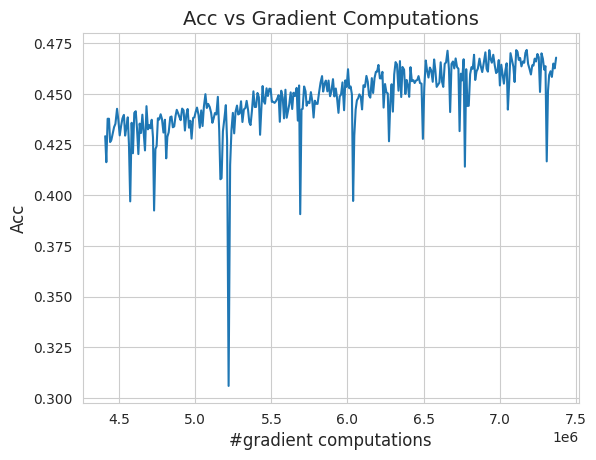

Training: 100%|██████████| 195/195 [00:01<00:00, 128.04it/s, loss=1.1606]


Epoch 337: val_acc=0.4650440812110901


Training: 100%|██████████| 195/195 [00:01<00:00, 124.66it/s, loss=1.4154]


Epoch 338: val_acc=0.4694511294364929


Training: 100%|██████████| 195/195 [00:01<00:00, 130.29it/s, loss=1.5021]


Epoch 339: val_acc=0.4635416865348816


Training: 100%|██████████| 195/195 [00:01<00:00, 130.77it/s, loss=0.9912]


Epoch 340: val_acc=0.4637419879436493


Training: 100%|██████████| 195/195 [00:01<00:00, 129.63it/s, loss=0.8141]


Epoch 341: val_acc=0.47035256028175354


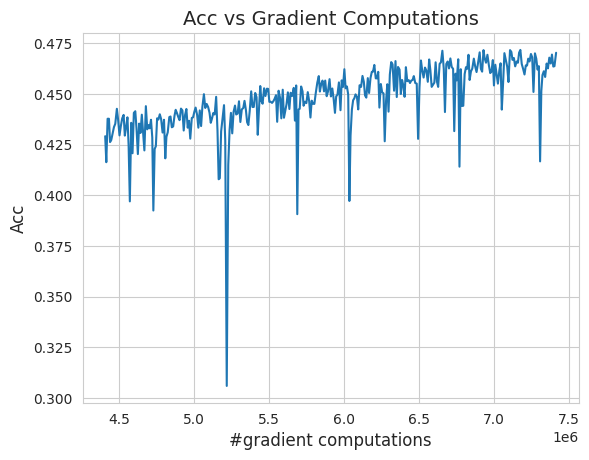

Training: 100%|██████████| 195/195 [00:01<00:00, 122.81it/s, loss=1.1749]


Epoch 342: val_acc=0.47215545177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 121.74it/s, loss=1.2260]


Epoch 343: val_acc=0.47125402092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 130.23it/s, loss=0.9339]


Epoch 344: val_acc=0.47085335850715637


Training: 100%|██████████| 195/195 [00:01<00:00, 140.71it/s, loss=1.0025]


Epoch 345: val_acc=0.4746594727039337


Training: 100%|██████████| 195/195 [00:01<00:00, 122.55it/s, loss=0.9362]


Epoch 346: val_acc=0.47295674681663513


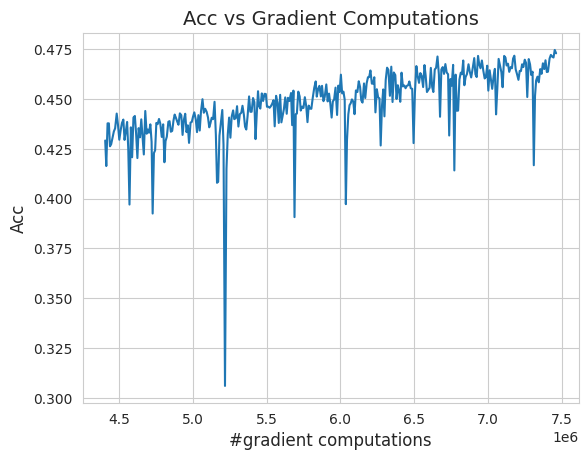

Training: 100%|██████████| 195/195 [00:01<00:00, 120.42it/s, loss=1.2528]


Epoch 347: val_acc=0.4434094727039337


Training: 100%|██████████| 195/195 [00:01<00:00, 128.16it/s, loss=1.2467]


Epoch 348: val_acc=0.4694511294364929


Training: 100%|██████████| 195/195 [00:01<00:00, 133.41it/s, loss=0.7462]


Epoch 349: val_acc=0.47265625


Training: 100%|██████████| 195/195 [00:01<00:00, 123.90it/s, loss=1.1828]


Epoch 350: val_acc=0.4769631326198578


Training: 100%|██████████| 195/195 [00:01<00:00, 128.72it/s, loss=0.8666]


Epoch 351: val_acc=0.4737580120563507


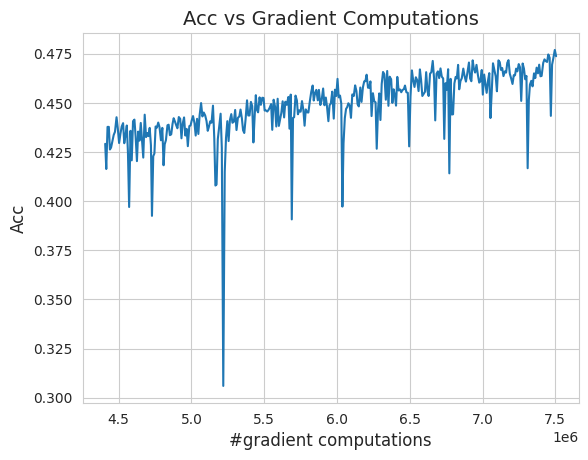

Training: 100%|██████████| 195/195 [00:01<00:00, 121.52it/s, loss=1.5283]


Epoch 352: val_acc=0.46213942766189575


Training: 100%|██████████| 195/195 [00:01<00:00, 124.17it/s, loss=1.5849]


Epoch 353: val_acc=0.4746594727039337


Training: 100%|██████████| 195/195 [00:01<00:00, 124.74it/s, loss=1.3324]


Epoch 354: val_acc=0.4778645932674408


Training: 100%|██████████| 195/195 [00:01<00:00, 121.25it/s, loss=0.8105]


Epoch 355: val_acc=0.4659455120563507


Training: 100%|██████████| 195/195 [00:01<00:00, 121.03it/s, loss=1.0834]


Epoch 356: val_acc=0.47235578298568726


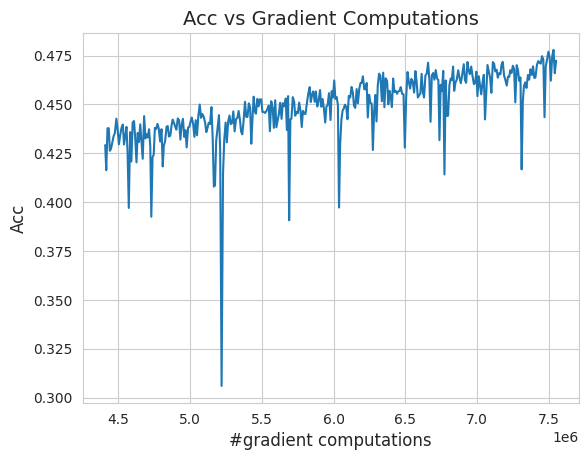

Training: 100%|██████████| 195/195 [00:01<00:00, 118.59it/s, loss=1.1916]


Epoch 357: val_acc=0.47055289149284363


Training: 100%|██████████| 195/195 [00:01<00:00, 122.33it/s, loss=0.9777]


Epoch 358: val_acc=0.4546274244785309


Training: 100%|██████████| 195/195 [00:01<00:00, 131.26it/s, loss=1.2685]


Epoch 359: val_acc=0.4732572138309479


Training: 100%|██████████| 195/195 [00:01<00:00, 128.76it/s, loss=1.0909]


Epoch 360: val_acc=0.47365784645080566


Training: 100%|██████████| 195/195 [00:01<00:00, 128.24it/s, loss=1.1505]


Epoch 361: val_acc=0.4605368673801422


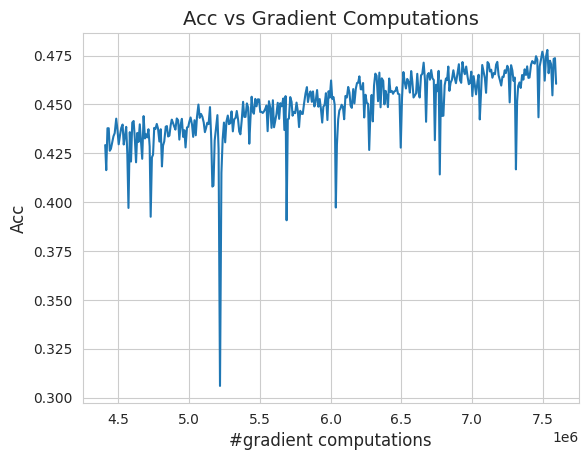

Training: 100%|██████████| 195/195 [00:01<00:00, 127.34it/s, loss=1.4832]


Epoch 362: val_acc=0.47255608439445496


Training: 100%|██████████| 195/195 [00:01<00:00, 125.89it/s, loss=1.2549]


Epoch 363: val_acc=0.46324118971824646


Training: 100%|██████████| 195/195 [00:01<00:00, 124.90it/s, loss=1.1837]


Epoch 364: val_acc=0.4365985691547394


Training: 100%|██████████| 195/195 [00:01<00:00, 128.09it/s, loss=1.5487]


Epoch 365: val_acc=0.4544270932674408


Training: 100%|██████████| 195/195 [00:01<00:00, 131.43it/s, loss=0.8872]


Epoch 366: val_acc=0.44951924681663513


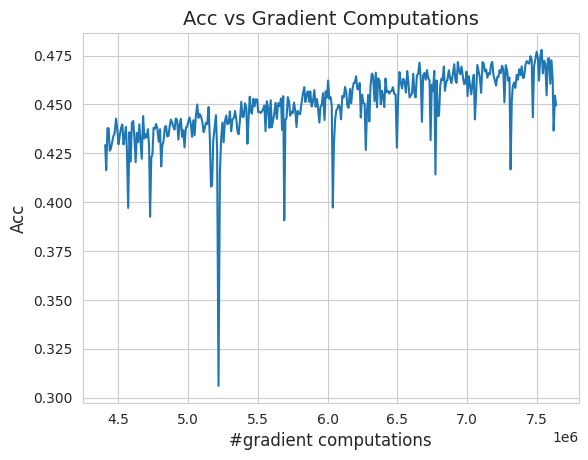

Training: 100%|██████████| 195/195 [00:01<00:00, 122.05it/s, loss=1.7088]


Epoch 367: val_acc=0.45993590354919434


Training: 100%|██████████| 195/195 [00:01<00:00, 114.61it/s, loss=1.3043]


Epoch 368: val_acc=0.4436097741127014


Training: 100%|██████████| 195/195 [00:01<00:00, 121.65it/s, loss=1.8410]


Epoch 369: val_acc=0.45733174681663513


Training: 100%|██████████| 195/195 [00:01<00:00, 123.90it/s, loss=1.2188]


Epoch 370: val_acc=0.46714743971824646


Training: 100%|██████████| 195/195 [00:01<00:00, 124.76it/s, loss=1.0523]


Epoch 371: val_acc=0.4698517620563507


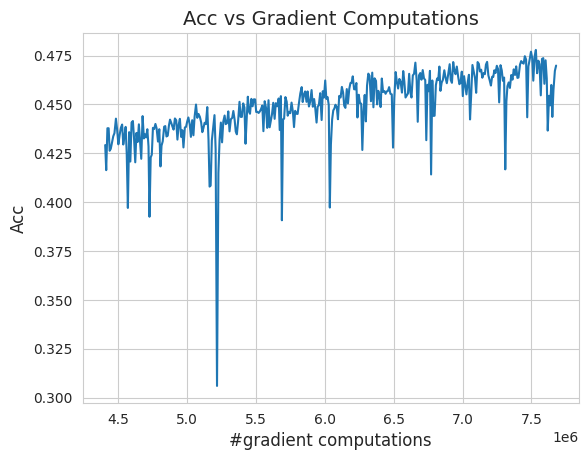

Training: 100%|██████████| 195/195 [00:01<00:00, 120.14it/s, loss=1.3454]


Epoch 372: val_acc=0.4700520932674408


Training: 100%|██████████| 195/195 [00:01<00:00, 121.26it/s, loss=1.1656]


Epoch 373: val_acc=0.4473157227039337


Training: 100%|██████████| 195/195 [00:01<00:00, 122.01it/s, loss=1.2421]


Epoch 374: val_acc=0.4672476053237915


Training: 100%|██████████| 195/195 [00:01<00:00, 123.37it/s, loss=1.4308]


Epoch 375: val_acc=0.45953527092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 136.15it/s, loss=1.0620]


Epoch 376: val_acc=0.4679487347602844


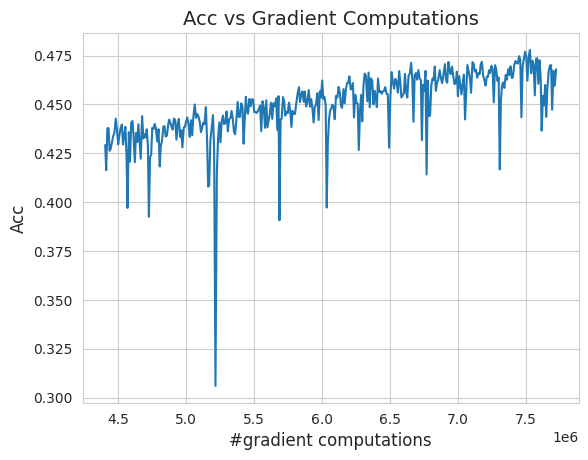

Training: 100%|██████████| 195/195 [00:01<00:00, 129.03it/s, loss=1.2166]


Epoch 377: val_acc=0.4739583432674408


Training: 100%|██████████| 195/195 [00:01<00:00, 124.30it/s, loss=1.1903]


Epoch 378: val_acc=0.4694511294364929


Training: 100%|██████████| 195/195 [00:01<00:00, 124.38it/s, loss=1.0043]


Epoch 379: val_acc=0.46995192766189575


Training: 100%|██████████| 195/195 [00:01<00:00, 129.74it/s, loss=1.1742]


Epoch 380: val_acc=0.46925079822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 129.64it/s, loss=1.4508]


Epoch 381: val_acc=0.47556090354919434


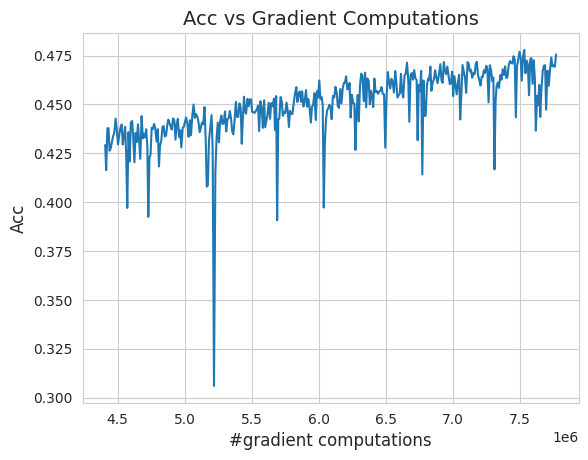

Training: 100%|██████████| 195/195 [00:01<00:00, 138.34it/s, loss=0.9778]


Epoch 382: val_acc=0.4718549847602844


Training: 100%|██████████| 195/195 [00:01<00:00, 128.44it/s, loss=1.3913]


Epoch 383: val_acc=0.47085335850715637


Training: 100%|██████████| 195/195 [00:01<00:00, 130.27it/s, loss=0.9253]


Epoch 384: val_acc=0.4752604365348816


Training: 100%|██████████| 195/195 [00:01<00:00, 120.62it/s, loss=1.1647]


Epoch 385: val_acc=0.4713541865348816


Training: 100%|██████████| 195/195 [00:01<00:00, 125.65it/s, loss=1.2208]


Epoch 386: val_acc=0.47365784645080566


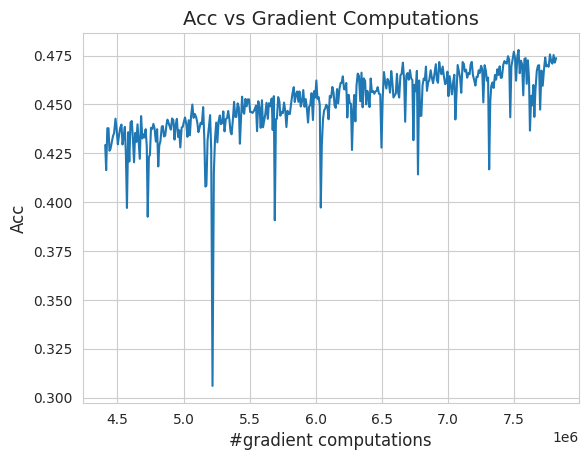

Training: 100%|██████████| 195/195 [00:01<00:00, 125.94it/s, loss=1.1433]


Epoch 387: val_acc=0.4767628312110901


Training: 100%|██████████| 195/195 [00:01<00:00, 139.14it/s, loss=0.9883]


Epoch 388: val_acc=0.47365784645080566


Training: 100%|██████████| 195/195 [00:01<00:00, 129.74it/s, loss=0.7450]


Epoch 389: val_acc=0.47385817766189575


Training: 100%|██████████| 195/195 [00:01<00:00, 140.46it/s, loss=1.0512]


Epoch 390: val_acc=0.477463960647583


Training: 100%|██████████| 195/195 [00:01<00:00, 133.95it/s, loss=1.1138]


Epoch 391: val_acc=0.47405850887298584


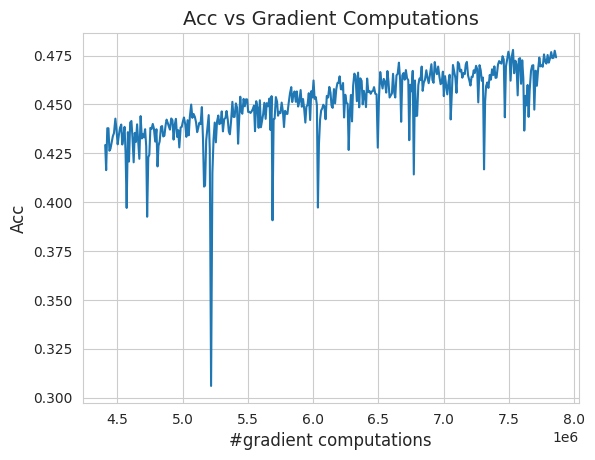

Training: 100%|██████████| 195/195 [00:01<00:00, 125.48it/s, loss=1.0646]


Epoch 392: val_acc=0.47756409645080566


Training: 100%|██████████| 195/195 [00:01<00:00, 130.38it/s, loss=1.3036]


Epoch 393: val_acc=0.4791666865348816


Training: 100%|██████████| 195/195 [00:01<00:00, 123.13it/s, loss=1.3350]


Epoch 394: val_acc=0.477463960647583


Training: 100%|██████████| 195/195 [00:01<00:00, 130.26it/s, loss=0.8776]


Epoch 395: val_acc=0.48056891560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 130.66it/s, loss=1.5234]


Epoch 396: val_acc=0.477463960647583


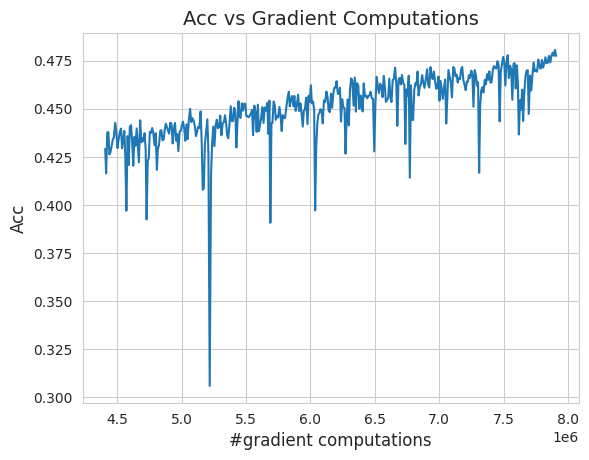

Training: 100%|██████████| 195/195 [00:01<00:00, 127.06it/s, loss=1.2561]


Epoch 397: val_acc=0.4758613705635071


Training: 100%|██████████| 195/195 [00:01<00:00, 126.86it/s, loss=1.0237]


Epoch 398: val_acc=0.47455930709838867


Training: 100%|██████████| 195/195 [00:01<00:00, 127.68it/s, loss=1.1786]


Epoch 399: val_acc=0.4789663553237915


Training: 100%|██████████| 195/195 [00:01<00:00, 120.81it/s, loss=0.9091]


Epoch 400: val_acc=0.4559294879436493


Training: 100%|██████████| 195/195 [00:01<00:00, 133.86it/s, loss=1.1066]


Epoch 401: val_acc=0.4700520932674408


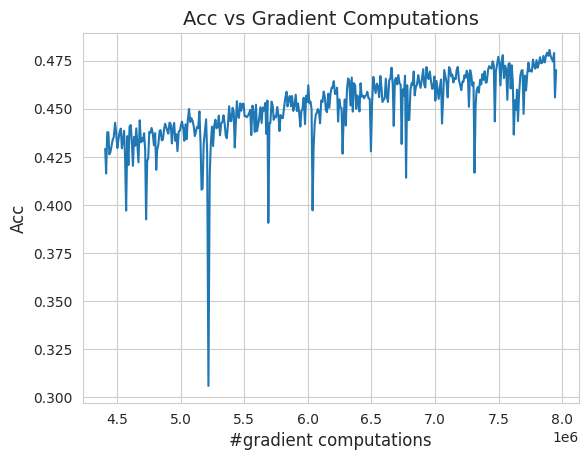

Training: 100%|██████████| 195/195 [00:01<00:00, 121.84it/s, loss=1.0366]


Epoch 402: val_acc=0.4782652258872986


Training: 100%|██████████| 195/195 [00:01<00:00, 126.90it/s, loss=1.2970]


Epoch 403: val_acc=0.47516027092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 125.03it/s, loss=1.3555]


Epoch 404: val_acc=0.46664664149284363


Training: 100%|██████████| 195/195 [00:01<00:00, 137.31it/s, loss=1.2784]


Epoch 405: val_acc=0.4563301205635071


Training: 100%|██████████| 195/195 [00:01<00:00, 121.78it/s, loss=1.0018]


Epoch 406: val_acc=0.46824920177459717


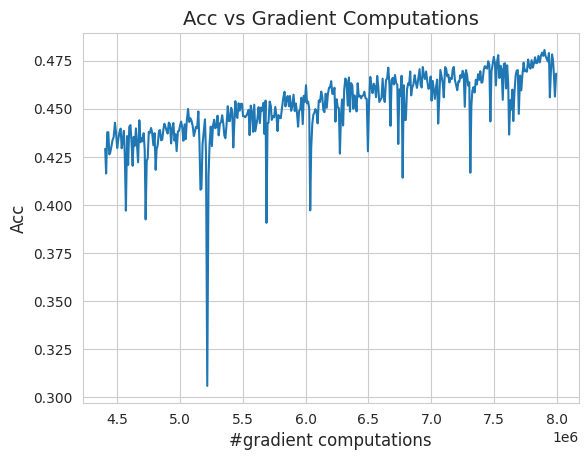

Training: 100%|██████████| 195/195 [00:01<00:00, 125.12it/s, loss=1.1670]


Epoch 407: val_acc=0.47315704822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 128.84it/s, loss=1.4034]


Epoch 408: val_acc=0.4659455120563507


Training: 100%|██████████| 195/195 [00:01<00:00, 122.19it/s, loss=0.9491]


Epoch 409: val_acc=0.4665464758872986


Training: 100%|██████████| 195/195 [00:01<00:00, 132.70it/s, loss=1.0735]


Epoch 410: val_acc=0.46604567766189575


Training: 100%|██████████| 195/195 [00:01<00:00, 130.16it/s, loss=0.9629]


Epoch 411: val_acc=0.4694511294364929


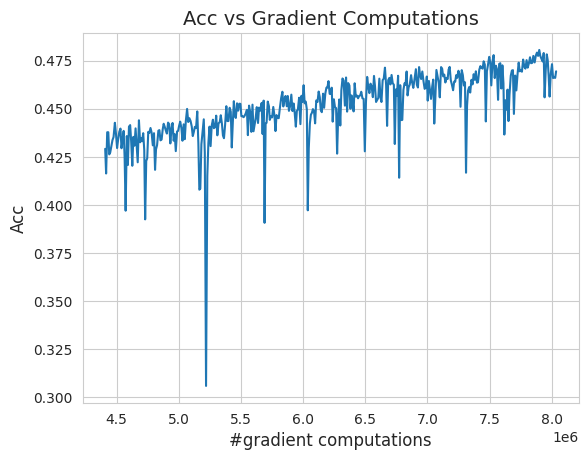

Training: 100%|██████████| 195/195 [00:01<00:00, 126.94it/s, loss=0.8773]


Epoch 412: val_acc=0.4780649244785309


Training: 100%|██████████| 195/195 [00:01<00:00, 133.14it/s, loss=1.0797]


Epoch 413: val_acc=0.47666266560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 129.87it/s, loss=1.0668]


Epoch 414: val_acc=0.4780649244785309


Training: 100%|██████████| 195/195 [00:01<00:00, 134.64it/s, loss=1.3109]


Epoch 415: val_acc=0.4750601053237915


Training: 100%|██████████| 195/195 [00:01<00:00, 122.13it/s, loss=1.2151]


Epoch 416: val_acc=0.47776442766189575


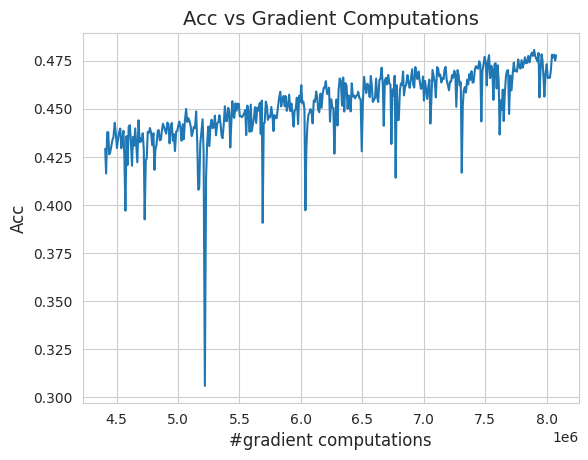

Training: 100%|██████████| 195/195 [00:01<00:00, 129.08it/s, loss=1.3284]


Epoch 417: val_acc=0.4752604365348816


Training: 100%|██████████| 195/195 [00:01<00:00, 124.21it/s, loss=0.9283]


Epoch 418: val_acc=0.4767628312110901


Training: 100%|██████████| 195/195 [00:01<00:00, 124.39it/s, loss=1.1622]


Epoch 419: val_acc=0.47556090354919434


Training: 100%|██████████| 195/195 [00:01<00:00, 125.67it/s, loss=0.8571]


Epoch 420: val_acc=0.47606170177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 129.97it/s, loss=1.4453]


Epoch 421: val_acc=0.47866585850715637


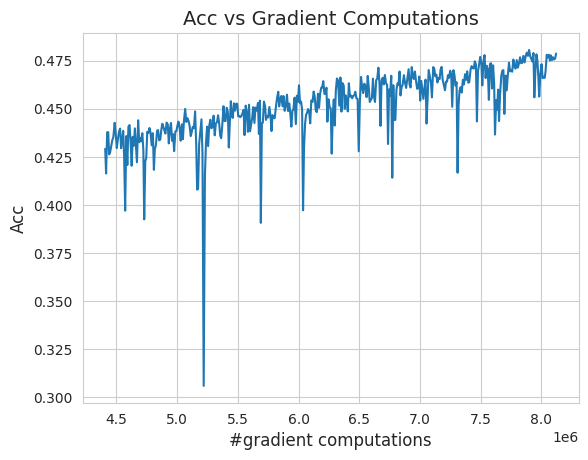

Training: 100%|██████████| 195/195 [00:01<00:00, 128.08it/s, loss=1.3895]


Epoch 422: val_acc=0.46664664149284363


Training: 100%|██████████| 195/195 [00:01<00:00, 126.65it/s, loss=0.8516]


Epoch 423: val_acc=0.4689503312110901


Training: 100%|██████████| 195/195 [00:01<00:00, 126.05it/s, loss=1.2591]


Epoch 424: val_acc=0.47606170177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 131.39it/s, loss=1.5024]


Epoch 425: val_acc=0.4817708432674408


Training: 100%|██████████| 195/195 [00:01<00:00, 129.22it/s, loss=1.2563]


Epoch 426: val_acc=0.44871795177459717


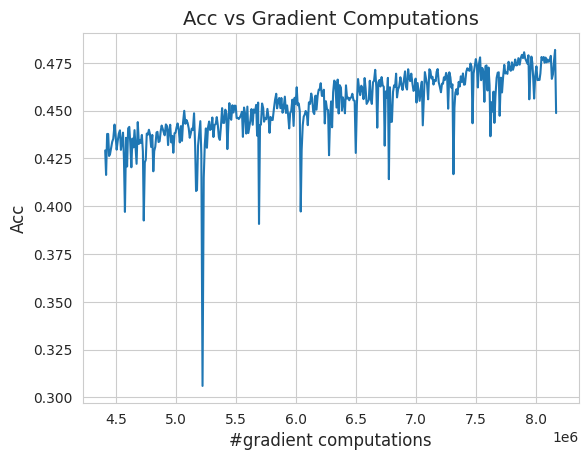

Training: 100%|██████████| 195/195 [00:01<00:00, 128.62it/s, loss=1.2061]


Epoch 427: val_acc=0.4748597741127014


Training: 100%|██████████| 195/195 [00:01<00:00, 128.50it/s, loss=1.0462]


Epoch 428: val_acc=0.4759615361690521


Training: 100%|██████████| 195/195 [00:01<00:00, 139.77it/s, loss=1.5779]


Epoch 429: val_acc=0.4698517620563507


Training: 100%|██████████| 195/195 [00:01<00:00, 126.72it/s, loss=0.8115]


Epoch 430: val_acc=0.4601362347602844


Training: 100%|██████████| 195/195 [00:01<00:00, 127.42it/s, loss=1.1091]


Epoch 431: val_acc=0.4780649244785309


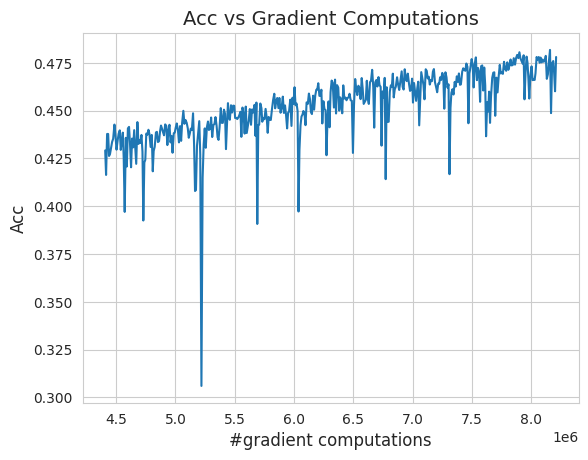

Training: 100%|██████████| 195/195 [00:01<00:00, 129.22it/s, loss=1.4287]


Epoch 432: val_acc=0.47996795177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 129.24it/s, loss=1.3069]


Epoch 433: val_acc=0.4457131326198578


Training: 100%|██████████| 195/195 [00:01<00:00, 132.72it/s, loss=1.1386]


Epoch 434: val_acc=0.469651460647583


Training: 100%|██████████| 195/195 [00:01<00:00, 118.16it/s, loss=1.1256]


Epoch 435: val_acc=0.4741586744785309


Training: 100%|██████████| 195/195 [00:01<00:00, 129.30it/s, loss=0.9895]


Epoch 436: val_acc=0.4758613705635071


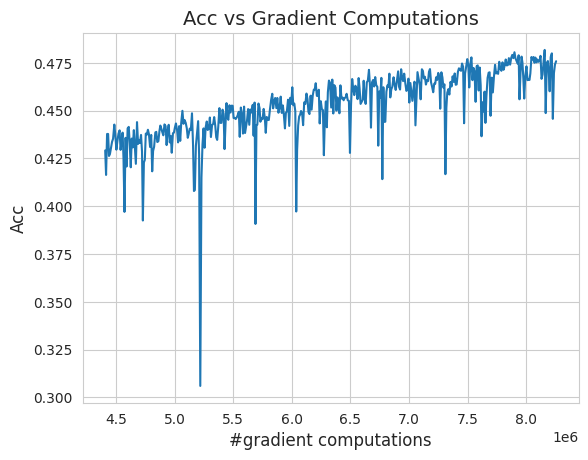

Training: 100%|██████████| 195/195 [00:01<00:00, 126.06it/s, loss=1.1650]


Epoch 437: val_acc=0.48046875


Training: 100%|██████████| 195/195 [00:01<00:00, 127.24it/s, loss=1.3025]


Epoch 438: val_acc=0.4776642620563507


Training: 100%|██████████| 195/195 [00:01<00:00, 119.90it/s, loss=1.1806]


Epoch 439: val_acc=0.4603365361690521


Training: 100%|██████████| 195/195 [00:01<00:00, 127.52it/s, loss=1.0795]


Epoch 440: val_acc=0.47315704822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 126.15it/s, loss=0.9919]


Epoch 441: val_acc=0.4839743673801422


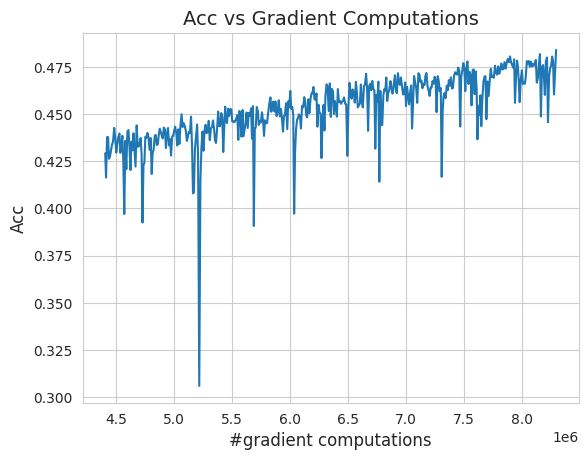

Training: 100%|██████████| 195/195 [00:01<00:00, 137.58it/s, loss=1.2237]


Epoch 442: val_acc=0.44971954822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 120.41it/s, loss=1.3915]


Epoch 443: val_acc=0.45863381028175354


Training: 100%|██████████| 195/195 [00:01<00:00, 127.20it/s, loss=1.0400]


Epoch 444: val_acc=0.4765625


Training: 100%|██████████| 195/195 [00:01<00:00, 130.50it/s, loss=1.1818]


Epoch 445: val_acc=0.4626402258872986


Training: 100%|██████████| 195/195 [00:01<00:00, 125.03it/s, loss=1.6531]


Epoch 446: val_acc=0.47145432233810425


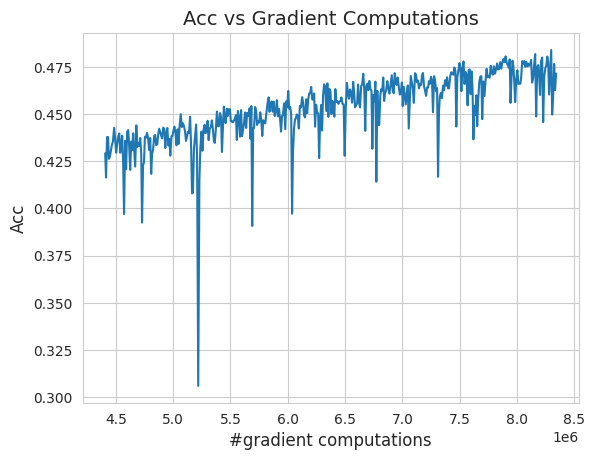

Training: 100%|██████████| 195/195 [00:01<00:00, 141.50it/s, loss=1.0606]


Epoch 447: val_acc=0.4819711744785309


Training: 100%|██████████| 195/195 [00:01<00:00, 126.72it/s, loss=1.2789]


Epoch 448: val_acc=0.47646233439445496


Training: 100%|██████████| 195/195 [00:01<00:00, 118.82it/s, loss=1.4723]


Epoch 449: val_acc=0.4464142620563507


Training: 100%|██████████| 195/195 [00:01<00:00, 126.44it/s, loss=1.3596]


Epoch 450: val_acc=0.4600360691547394


Training: 100%|██████████| 195/195 [00:01<00:00, 123.28it/s, loss=1.1218]


Epoch 451: val_acc=0.47275641560554504


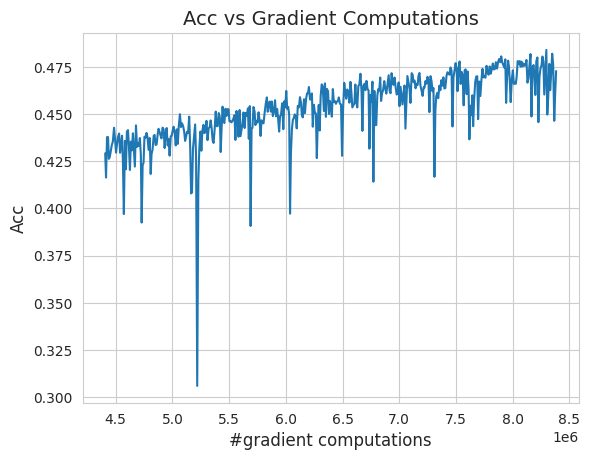

Training: 100%|██████████| 195/195 [00:01<00:00, 136.32it/s, loss=1.3635]


Epoch 452: val_acc=0.4576322138309479


Training: 100%|██████████| 195/195 [00:01<00:00, 124.03it/s, loss=1.5400]


Epoch 453: val_acc=0.48036858439445496


Training: 100%|██████████| 195/195 [00:01<00:00, 123.98it/s, loss=1.0079]


Epoch 454: val_acc=0.47536057233810425


Training: 100%|██████████| 195/195 [00:01<00:00, 130.83it/s, loss=1.1739]


Epoch 455: val_acc=0.47495993971824646


Training: 100%|██████████| 195/195 [00:01<00:00, 142.21it/s, loss=0.7815]


Epoch 456: val_acc=0.47926682233810425


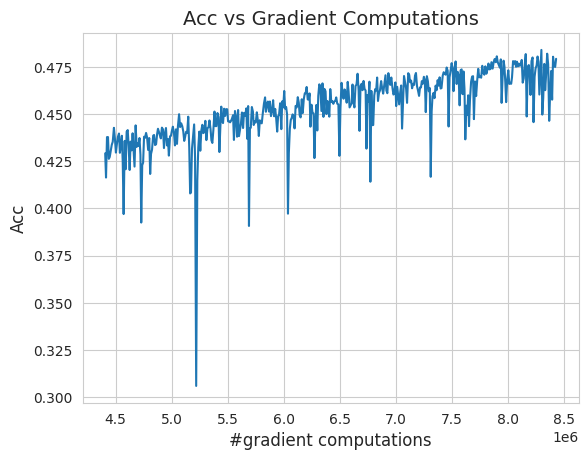

Training: 100%|██████████| 195/195 [00:01<00:00, 138.38it/s, loss=1.0108]


Epoch 457: val_acc=0.4789663553237915


Training: 100%|██████████| 195/195 [00:01<00:00, 131.68it/s, loss=0.9354]


Epoch 458: val_acc=0.47626203298568726


Training: 100%|██████████| 195/195 [00:01<00:00, 123.44it/s, loss=1.2652]


Epoch 459: val_acc=0.47836539149284363


Training: 100%|██████████| 195/195 [00:01<00:00, 121.00it/s, loss=1.4410]


Epoch 460: val_acc=0.4590344727039337


Training: 100%|██████████| 195/195 [00:01<00:00, 130.86it/s, loss=1.3889]


Epoch 461: val_acc=0.47796475887298584


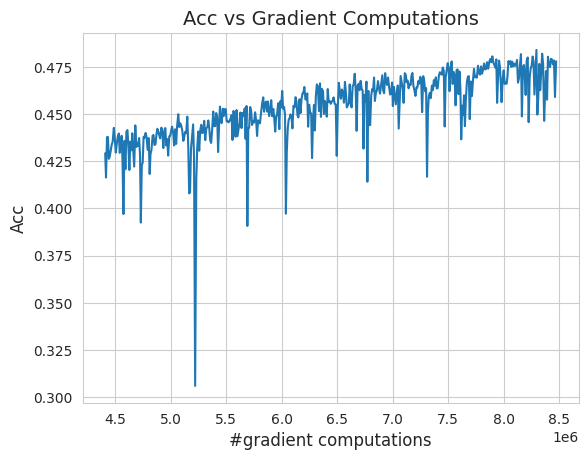

Training: 100%|██████████| 195/195 [00:01<00:00, 130.09it/s, loss=1.1656]


Epoch 462: val_acc=0.4754607379436493


Training: 100%|██████████| 195/195 [00:01<00:00, 121.56it/s, loss=1.2497]


Epoch 463: val_acc=0.4752604365348816


Training: 100%|██████████| 195/195 [00:01<00:00, 124.28it/s, loss=1.3455]


Epoch 464: val_acc=0.4642427861690521


Training: 100%|██████████| 195/195 [00:01<00:00, 116.78it/s, loss=1.3260]


Epoch 465: val_acc=0.46925079822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 129.87it/s, loss=1.1533]


Epoch 466: val_acc=0.47055289149284363


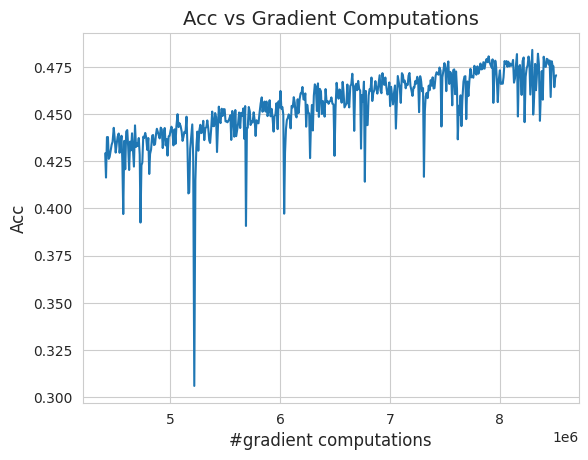

Training: 100%|██████████| 195/195 [00:01<00:00, 131.35it/s, loss=1.0881]


Epoch 467: val_acc=0.47926682233810425


Training: 100%|██████████| 195/195 [00:01<00:00, 127.63it/s, loss=1.2575]


Epoch 468: val_acc=0.4767628312110901


Training: 100%|██████████| 195/195 [00:01<00:00, 126.24it/s, loss=1.2049]


Epoch 469: val_acc=0.48056891560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 123.17it/s, loss=0.6726]


Epoch 470: val_acc=0.4815705120563507


Training: 100%|██████████| 195/195 [00:01<00:00, 124.93it/s, loss=1.2216]


Epoch 471: val_acc=0.48387420177459717


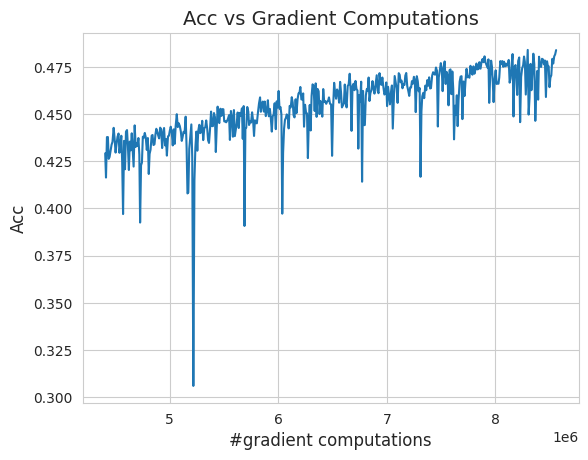

Training: 100%|██████████| 195/195 [00:01<00:00, 126.58it/s, loss=1.0824]


Epoch 472: val_acc=0.4873798191547394


Training: 100%|██████████| 195/195 [00:01<00:00, 125.68it/s, loss=0.9468]


Epoch 473: val_acc=0.44150641560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 129.22it/s, loss=1.3328]


Epoch 474: val_acc=0.47035256028175354


Training: 100%|██████████| 195/195 [00:01<00:00, 120.16it/s, loss=1.3431]


Epoch 475: val_acc=0.4858774244785309


Training: 100%|██████████| 195/195 [00:01<00:00, 125.74it/s, loss=1.3650]


Epoch 476: val_acc=0.48577725887298584


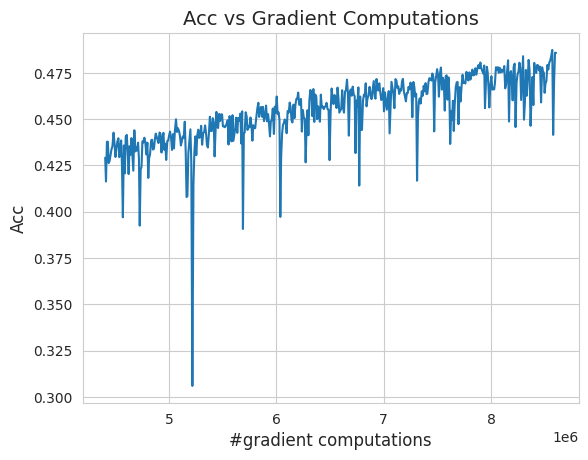

Training: 100%|██████████| 195/195 [00:01<00:00, 126.91it/s, loss=1.3060]


Epoch 477: val_acc=0.47836539149284363


Training: 100%|██████████| 195/195 [00:01<00:00, 126.31it/s, loss=1.4675]


Epoch 478: val_acc=0.4871794879436493


Training: 100%|██████████| 195/195 [00:01<00:00, 132.18it/s, loss=0.9431]


Epoch 479: val_acc=0.48948317766189575


Training: 100%|██████████| 195/195 [00:01<00:00, 130.81it/s, loss=1.3490]


Epoch 480: val_acc=0.4821714758872986


Training: 100%|██████████| 195/195 [00:01<00:00, 119.08it/s, loss=1.1258]


Epoch 481: val_acc=0.4919871985912323


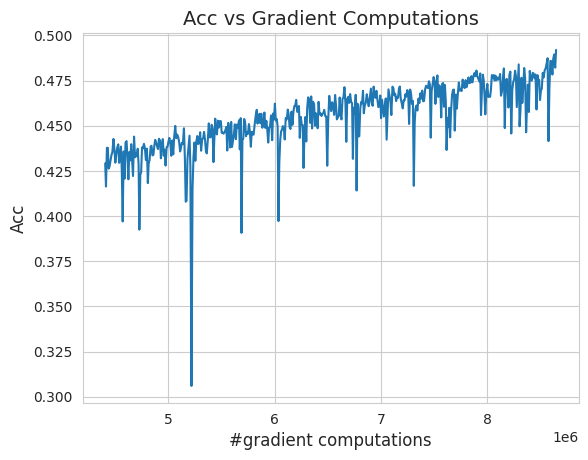

Training: 100%|██████████| 195/195 [00:01<00:00, 124.23it/s, loss=1.3149]


Epoch 482: val_acc=0.4854767620563507


Training: 100%|██████████| 195/195 [00:01<00:00, 124.86it/s, loss=1.2579]


Epoch 483: val_acc=0.48687902092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 131.17it/s, loss=1.0448]


Epoch 484: val_acc=0.48387420177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 119.75it/s, loss=1.1999]


Epoch 485: val_acc=0.4899839758872986


Training: 100%|██████████| 195/195 [00:01<00:00, 125.90it/s, loss=1.2386]


Epoch 486: val_acc=0.48407453298568726


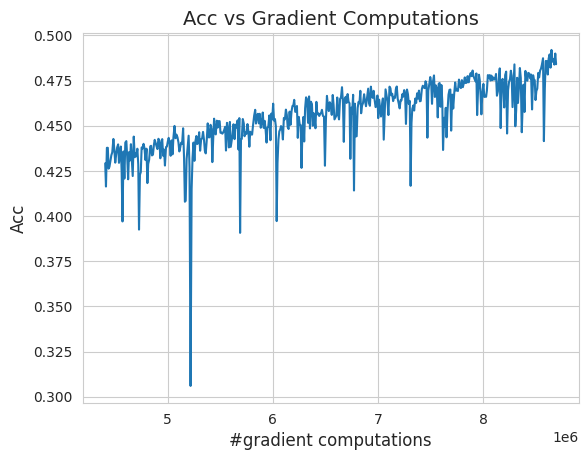

Training: 100%|██████████| 195/195 [00:01<00:00, 128.62it/s, loss=0.9180]


Epoch 487: val_acc=0.48447516560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 126.73it/s, loss=1.2384]


Epoch 488: val_acc=0.4888822138309479


Training: 100%|██████████| 195/195 [00:01<00:00, 122.55it/s, loss=1.3737]


Epoch 489: val_acc=0.4865785241127014


Training: 100%|██████████| 195/195 [00:01<00:00, 132.20it/s, loss=1.0662]


Epoch 490: val_acc=0.48427483439445496


Training: 100%|██████████| 195/195 [00:01<00:00, 126.96it/s, loss=1.1278]


Epoch 491: val_acc=0.4927884638309479


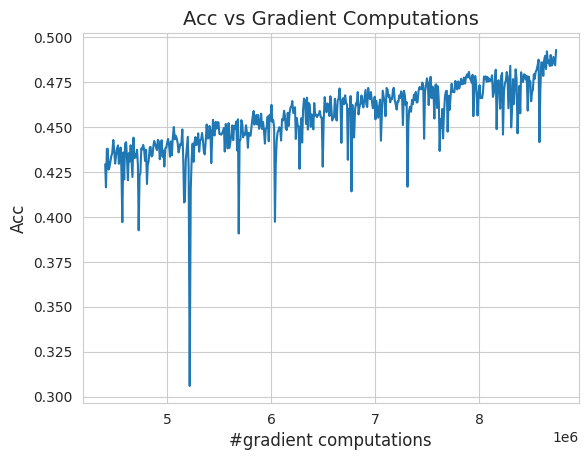

Training: 100%|██████████| 195/195 [00:01<00:00, 125.11it/s, loss=1.3409]


Epoch 492: val_acc=0.481370210647583


Training: 100%|██████████| 195/195 [00:01<00:00, 129.09it/s, loss=1.0649]


Epoch 493: val_acc=0.48096954822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 134.41it/s, loss=0.9868]


Epoch 494: val_acc=0.49208733439445496


Training: 100%|██████████| 195/195 [00:01<00:00, 130.27it/s, loss=1.2422]


Epoch 495: val_acc=0.47626203298568726


Training: 100%|██████████| 195/195 [00:01<00:00, 116.32it/s, loss=1.4296]


Epoch 496: val_acc=0.49058493971824646


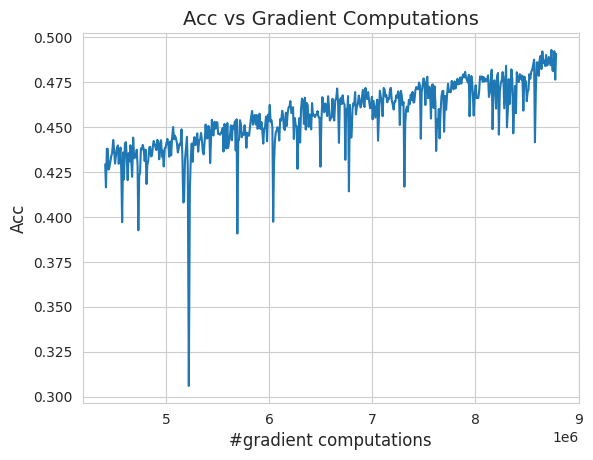

Training: 100%|██████████| 195/195 [00:01<00:00, 128.47it/s, loss=1.4056]


Epoch 497: val_acc=0.43479567766189575


Training: 100%|██████████| 195/195 [00:01<00:00, 129.40it/s, loss=0.7398]


Epoch 498: val_acc=0.489182710647583


Training: 100%|██████████| 195/195 [00:01<00:00, 131.63it/s, loss=1.6275]


Epoch 499: val_acc=0.4904847741127014


Training: 100%|██████████| 195/195 [00:01<00:00, 125.53it/s, loss=1.2750]


Epoch 500: val_acc=0.48988381028175354


In [13]:
acc_arr_add, grad_count_add, state = train(state=state,
            optimizer=optimizer,
            train_loader=train_loader,
            val_loader=val_loader,
            num_epochs=500,
            compute_accuracy=compute_accuracy)

In [15]:
sgd_grads = '49920, 99840, 149760, 199680, 249600, 299520, 349440, 399360, 449280, 499200, 549120, 599040, 648960, 698880, 748800, 798720, 848640, 898560, 948480, 998400, 1048320, 1098240, 1148160, 1198080, 1248000, 1297920, 1347840, 1397760, 1447680, 1497600, 1547520, 1597440, 1647360, 1697280, 1747200, 1797120, 1847040, 1896960, 1946880, 1996800, 2046720, 2096640, 2146560, 2196480, 2246400, 2296320, 2346240, 2396160, 2446080, 2496000, 2545920, 2595840, 2645760, 2695680, 2745600, 2795520, 2845440, 2895360, 2945280, 2995200, 3045120, 3095040, 3144960, 3194880, 3244800, 3294720, 3344640, 3394560, 3444480, 3494400, 3544320, 3594240, 3644160, 3694080, 3744000, 3793920, 3843840, 3893760, 3943680, 3993600, 4043520, 4093440, 4143360, 4193280, 4243200, 4293120, 4343040, 4392960, 4442880, 4492800, 4542720, 4592640, 4642560, 4692480, 4742400, 4792320, 4842240, 4892160, 4942080, 4992000, 5041920, 5091840, 5141760, 5191680, 5241600, 5291520, 5341440, 5391360, 5441280, 5491200, 5541120, 5591040, 5640960, 5690880, 5740800, 5790720, 5840640, 5890560, 5940480, 5990400, 6040320, 6090240, 6140160, 6190080, 6240000, 6289920, 6339840, 6389760, 6439680, 6489600, 6539520, 6589440, 6639360, 6689280, 6739200, 6789120, 6839040, 6888960, 6938880, 6988800, 7038720, 7088640, 7138560, 7188480, 7238400, 7288320, 7338240, 7388160, 7438080, 7488000, 7537920, 7587840, 7637760, 7687680, 7737600, 7787520, 7837440, 7887360, 7937280, 7987200, 8037120, 8087040, 8136960, 8186880, 8236800, 8286720, 8336640, 8386560, 8436480, 8486400, 8536320, 8586240, 8636160, 8686080, 8736000, 8785920, 8835840, 8885760, 8935680, 8985600, 9035520, 9085440, 9135360, 9185280, 9235200, 9285120, 9335040, 9384960, 9434880, 9484800, 9534720, 9584640, 9634560, 9684480, 9734400, 9784320, 9834240, 9884160, 9934080, 9984000, 10033920, 10083840, 10133760, 10183680, 10233600, 10283520, 10333440, 10383360, 10433280, 10483200, 10533120, 10583040, 10632960, 10682880, 10732800, 10782720, 10832640, 10882560, 10932480, 10982400, 11032320, 11082240, 11132160, 11182080, 11232000, 11281920, 11331840, 11381760, 11431680, 11481600, 11531520, 11581440, 11631360, 11681280, 11731200, 11781120, 11831040, 11880960, 11930880, 11980800, 12030720, 12080640, 12130560, 12180480, 12230400, 12280320, 12330240, 12380160, 12430080, 12480000, 12529920, 12579840, 12629760, 12679680, 12729600, 12779520, 12829440, 12879360, 12929280, 12979200, 13029120, 13079040, 13128960, 13178880, 13228800, 13278720, 13328640, 13378560, 13428480, 13478400, 13528320, 13578240, 13628160, 13678080, 13728000, 13777920, 13827840, 13877760, 13927680, 13977600, 14027520, 14077440, 14127360, 14177280, 14227200, 14277120, 14327040, 14376960, 14426880, 14476800, 14526720, 14576640, 14626560, 14676480, 14726400, 14776320, 14826240, 14876160, 14926080, 14976000, 15025920, 15075840, 15125760, 15175680, 15225600, 15275520, 15325440, 15375360, 15425280, 15475200, 15525120, 15575040, 15624960, 15674880, 15724800, 15774720, 15824640, 15874560, 15924480, 15974400, 16024320, 16074240, 16124160, 16174080, 16224000, 16273920, 16323840, 16373760, 16423680, 16473600, 16523520, 16573440, 16623360, 16673280, 16723200, 16773120, 16823040, 16872960, 16922880, 16972800, 17022720, 17072640, 17122560, 17172480, 17222400, 17272320, 17322240, 17372160, 17422080, 17472000, 17521920, 17571840, 17621760, 17671680, 17721600, 17771520, 17821440, 17871360, 17921280, 17971200, 18021120, 18071040, 18120960, 18170880, 18220800, 18270720, 18320640, 18370560, 18420480, 18470400, 18520320, 18570240, 18620160, 18670080, 18720000, 18769920, 18819840, 18869760, 18919680, 18969600, 19019520, 19069440, 19119360, 19169280, 19219200, 19269120, 19319040, 19368960, 19418880, 19468800, 19518720, 19568640, 19618560, 19668480, 19718400, 19768320, 19818240, 19868160, 19918080, 19968000, 20017920, 20067840, 20117760, 20167680, 20217600, 20267520, 20317440, 20367360, 20417280, 20467200, 20517120, 20567040, 20616960, 20666880, 20716800, 20766720, 20816640, 20866560, 20916480, 20966400, 21016320, 21066240, 21116160, 21166080, 21216000, 21265920, 21315840, 21365760, 21415680, 21465600, 21515520, 21565440, 21615360, 21665280, 21715200, 21765120, 21815040, 21864960, 21914880, 21964800, 22014720, 22064640, 22114560, 22164480, 22214400, 22264320, 22314240, 22364160, 22414080, 22464000, 22513920, 22563840, 22613760, 22663680, 22713600, 22763520, 22813440, 22863360, 22913280, 22963200, 23013120, 23063040, 23112960, 23162880, 23212800, 23262720, 23312640, 23362560, 23412480, 23462400, 23512320, 23562240, 23612160, 23662080, 23712000, 23761920, 23811840, 23861760, 23911680, 23961600, 24011520, 24061440, 24111360, 24161280, 24211200, 24261120, 24311040, 24360960, 24410880, 24460800, 24510720, 24560640, 24610560, 24660480, 24710400, 24760320, 24810240, 24860160, 24910080, 24960000'
sgd_grads = list(map(int, sgd_grads.split(", ")))


sgd_acc = '0.17107372, 0.21644631, 0.24419071, 0.263121, 0.28064904, 0.29126602, 0.2991787, 0.3091947, 0.31870994, 0.3258213, 0.33303285, 0.33733976, 0.3422476, 0.34715545, 0.35036057, 0.35166267, 0.35667068, 0.36047676, 0.36428285, 0.367488, 0.36919072, 0.3729968, 0.37560096, 0.37810498, 0.38090947, 0.38241187, 0.3846154, 0.38591748, 0.3873197, 0.39032453, 0.39152646, 0.39362982, 0.39623398, 0.39773637, 0.39983976, 0.40084136, 0.40244392, 0.4047476, 0.4052484, 0.40584937, 0.40715146, 0.40815306, 0.4085537, 0.4095553, 0.4107572, 0.41185898, 0.41286057, 0.41376203, 0.4153646, 0.41566506, 0.41696715, 0.41796875, 0.4173678, 0.41766828, 0.41897035, 0.4198718, 0.42077324, 0.42117387, 0.4221755, 0.42207533, 0.4226763, 0.4228766, 0.4236779, 0.4241787, 0.4246795, 0.42528045, 0.42568108, 0.42568108, 0.42538062, 0.42648238, 0.4271835, 0.42678285, 0.42728364, 0.42748398, 0.4278846, 0.4281851, 0.4278846, 0.4286859, 0.42888623, 0.4296875, 0.4286859, 0.42908654, 0.4294872, 0.4296875, 0.4301883, 0.43028846, 0.43058896, 0.4304888, 0.43028846, 0.4301883, 0.43078926, 0.43129006, 0.43139023, 0.43078926, 0.43129006, 0.43179086, 0.4314904, 0.4314904, 0.43189102, 0.43209136, 0.43219152, 0.43239182, 0.4322917, 0.43269232, 0.43279248, 0.4329928, 0.43329328, 0.43329328, 0.43349358, 0.43359375, 0.43379408, 0.43409455, 0.4341947, 0.43429488, 0.43409455, 0.43429488, 0.434996, 0.43509614, 0.43459535, 0.4341947, 0.43479568, 0.43489584, 0.43509614, 0.43509614, 0.43509614, 0.43529648, 0.4356971, 0.43509614, 0.43489584, 0.43529648, 0.43559697, 0.43539664, 0.4354968, 0.4351963, 0.434996, 0.4354968, 0.4354968, 0.43559697, 0.4359976, 0.43609777, 0.43609777, 0.43639824, 0.43619794, 0.43609777, 0.43619794, 0.43659857, 0.43619794, 0.43639824, 0.4364984, 0.43679887, 0.43689904, 0.43609777, 0.43589744, 0.43619794, 0.4375, 0.4369992, 0.43709937, 0.4364984, 0.4364984, 0.43679887, 0.43689904, 0.43689904, 0.43629807, 0.43579727, 0.43579727, 0.43589744, 0.4356971, 0.43489584, 0.43579727, 0.43559697, 0.4359976, 0.43609777, 0.43619794, 0.43609777, 0.43629807, 0.43639824, 0.43619794, 0.43659857, 0.43619794, 0.43669873, 0.4364984, 0.43739983, 0.4372997, 0.4372997, 0.4375, 0.43719953, 0.4369992, 0.43679887, 0.43689904, 0.43659857, 0.4372997, 0.43659857, 0.43679887, 0.43669873, 0.43709937, 0.43679887, 0.43659857, 0.4364984, 0.43689904, 0.4359976, 0.43609777, 0.4359976, 0.43539664, 0.43579727, 0.4351963, 0.43619794, 0.43559697, 0.43529648, 0.43559697, 0.4359976, 0.43619794, 0.43539664, 0.4354968, 0.4356971, 0.4359976, 0.4359976, 0.43579727, 0.4356971, 0.4356971, 0.4354968, 0.43579727, 0.43639824, 0.43619794, 0.4364984, 0.4359976, 0.43579727, 0.4359976, 0.43629807, 0.43629807, 0.43629807, 0.43639824, 0.43639824, 0.43629807, 0.43659857, 0.43639824, 0.4364984, 0.43659857, 0.43639824, 0.4364984, 0.43659857, 0.4369992, 0.4369992, 0.4369992, 0.43659857, 0.43679887, 0.43679887, 0.4369992, 0.43679887, 0.43689904, 0.4372997, 0.43679887, 0.43689904, 0.43679887, 0.43709937, 0.4369992, 0.43689904, 0.43709937, 0.43709937, 0.43709937, 0.4369992, 0.43669873, 0.43719953, 0.4369992, 0.4364984, 0.43639824, 0.43629807, 0.43629807, 0.43609777, 0.43669873, 0.4364984, 0.43629807, 0.4359976, 0.43629807, 0.43609777, 0.4359976, 0.43609777, 0.4356971, 0.4356971, 0.43619794, 0.43579727, 0.43539664, 0.4359976, 0.4356971, 0.43589744, 0.43579727, 0.4354968, 0.43559697, 0.4354968, 0.4356971, 0.43589744, 0.4356971, 0.4359976, 0.43589744, 0.43579727, 0.43629807, 0.43619794, 0.43609777, 0.43609777, 0.43619794, 0.43629807, 0.4354968, 0.4356971, 0.43579727, 0.4356971, 0.43619794, 0.43639824, 0.43579727, 0.43579727, 0.43609777, 0.4356971, 0.43579727, 0.4356971, 0.43629807, 0.43679887, 0.43609777, 0.43619794, 0.43639824, 0.43619794, 0.4359976, 0.43579727, 0.4356971, 0.43559697, 0.43559697, 0.43579727, 0.4356971, 0.4356971, 0.4356971, 0.43579727, 0.43619794, 0.43579727, 0.4351963, 0.43529648, 0.43539664, 0.43489584, 0.43539664, 0.43579727, 0.4356971, 0.43539664, 0.43579727, 0.43539664, 0.43529648, 0.43509614, 0.43509614, 0.43479568, 0.43529648, 0.43559697, 0.43539664, 0.43539664, 0.43559697, 0.43539664, 0.4351963, 0.43529648, 0.4356971, 0.43529648, 0.43509614, 0.43509614, 0.43529648, 0.43539664, 0.434996, 0.43489584, 0.4354968, 0.4351963, 0.4351963, 0.43479568, 0.434996, 0.43479568, 0.43529648, 0.43509614, 0.43509614, 0.43539664, 0.43529648, 0.43479568, 0.43539664, 0.43489584, 0.4346955, 0.43489584, 0.4351963, 0.434996, 0.434996, 0.43459535, 0.43459535, 0.43489584, 0.43489584, 0.43479568, 0.43439505, 0.43459535, 0.43479568, 0.4344952, 0.43489584, 0.43459535, 0.43489584, 0.434996, 0.4346955, 0.43489584, 0.43489584, 0.43479568, 0.4344952, 0.43429488, 0.43509614, 0.43479568, 0.43489584, 0.4344952, 0.43509614, 0.4346955, 0.43489584, 0.434996, 0.43459535, 0.43459535, 0.43489584, 0.43459535, 0.4346955, 0.43479568, 0.43479568, 0.4351963, 0.43509614, 0.43509614, 0.434996, 0.43479568, 0.43509614, 0.434996, 0.43479568, 0.43509614, 0.434996, 0.43479568, 0.43539664, 0.43559697, 0.43489584, 0.43539664, 0.4354968, 0.4351963, 0.434996, 0.43509614, 0.43529648, 0.43539664, 0.43539664, 0.4351963, 0.43529648, 0.434996, 0.4351963, 0.43529648, 0.4351963, 0.43509614, 0.43489584, 0.43529648, 0.43529648, 0.43559697, 0.43559697, 0.43559697, 0.4354968, 0.43509614, 0.43539664, 0.4356971, 0.4364984, 0.4354968, 0.4356971, 0.43559697, 0.43579727, 0.43579727, 0.4354968, 0.4354968, 0.43579727, 0.43579727, 0.4359976, 0.4359976, 0.43579727, 0.4356971, 0.4359976, 0.43619794, 0.4359976, 0.4356971, 0.4356971, 0.43589744, 0.43559697, 0.43619794, 0.43629807, 0.43619794, 0.43629807, 0.43609777, 0.43639824, 0.43629807, 0.43669873, 0.43689904, 0.43639824, 0.43629807, 0.43629807, 0.43709937, 0.4369992, 0.43669873, 0.4364984, 0.43709937, 0.4364984, 0.4364984, 0.4364984, 0.43709937, 0.4364984, 0.43679887, 0.4372997, 0.43659857, 0.4369992, 0.43679887'
sgd_acc = list(map(float, sgd_acc.split(", ")))

In [17]:
grad_count += grad_count_add
acc_arr += acc_arr_add

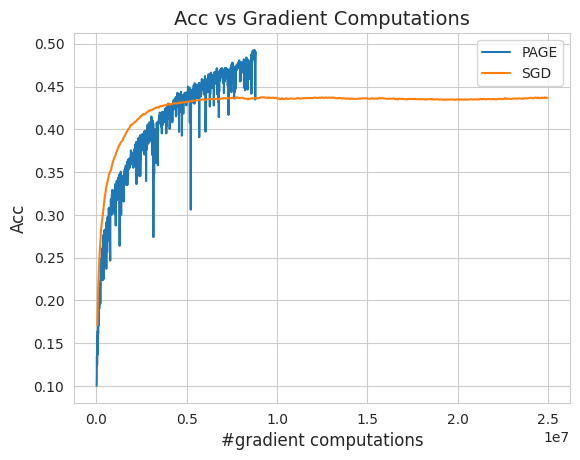

In [20]:
plt.plot(grad_count, acc_arr, label="PAGE")
plt.plot(sgd_grads, sgd_acc, label="SGD")
plt.xlabel('#gradient computations', fontsize=12)
plt.ylabel('Acc', fontsize=12)
plt.title('Acc vs Gradient Computations', fontsize=14)
plt.legend()
plt.savefig("acc_vs_grad_sgd_vs_page.png")
plt.show()

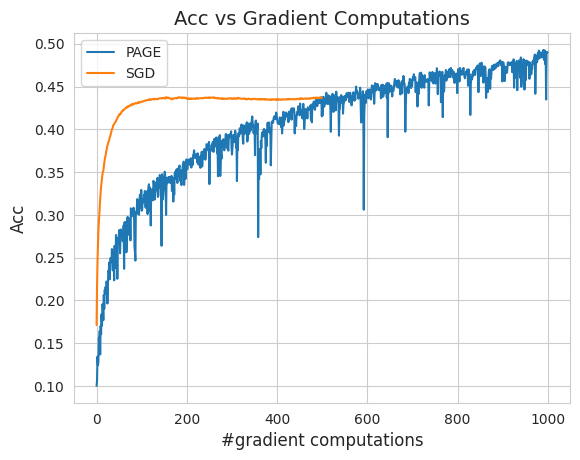

In [21]:
plt.plot(range(len(acc_arr)), acc_arr, label="PAGE")
plt.plot(range(len(sgd_acc)), sgd_acc, label="SGD")
plt.xlabel('#gradient computations', fontsize=12)
plt.ylabel('Acc', fontsize=12)
plt.title('Acc vs Gradient Computations', fontsize=14)
plt.legend()
plt.savefig("acc_vs_iter_sgd_vs_page.png")
plt.show()

Training: 100%|██████████| 195/195 [00:01<00:00, 119.17it/s, loss=1.2340]


Epoch 1: val_acc=0.49018430709838867


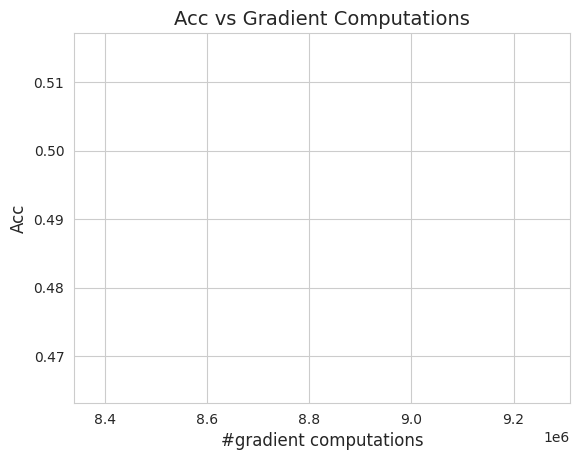

Training: 100%|██████████| 195/195 [00:01<00:00, 121.70it/s, loss=0.8630]


Epoch 2: val_acc=0.4847756326198578


Training: 100%|██████████| 195/195 [00:01<00:00, 127.56it/s, loss=1.0487]


Epoch 3: val_acc=0.4826722741127014


Training: 100%|██████████| 195/195 [00:01<00:00, 126.71it/s, loss=0.7287]


Epoch 4: val_acc=0.4886818826198578


Training: 100%|██████████| 195/195 [00:01<00:00, 119.29it/s, loss=0.8986]


Epoch 5: val_acc=0.49559295177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 123.22it/s, loss=1.4904]


Epoch 6: val_acc=0.44350960850715637


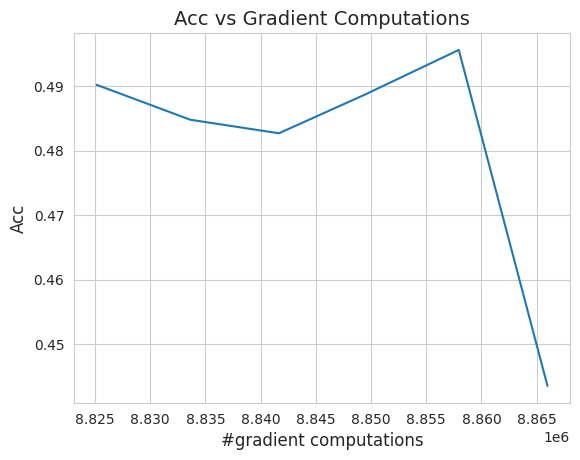

Training: 100%|██████████| 195/195 [00:01<00:00, 142.40it/s, loss=1.1760]


Epoch 7: val_acc=0.4709535241127014


Training: 100%|██████████| 195/195 [00:01<00:00, 128.63it/s, loss=1.2888]


Epoch 8: val_acc=0.4927884638309479


Training: 100%|██████████| 195/195 [00:01<00:00, 124.50it/s, loss=1.2530]


Epoch 9: val_acc=0.49298879504203796


Training: 100%|██████████| 195/195 [00:01<00:00, 122.99it/s, loss=0.9638]


Epoch 10: val_acc=0.49188703298568726


Training: 100%|██████████| 195/195 [00:01<00:00, 126.05it/s, loss=1.5954]


Epoch 11: val_acc=0.4854767620563507


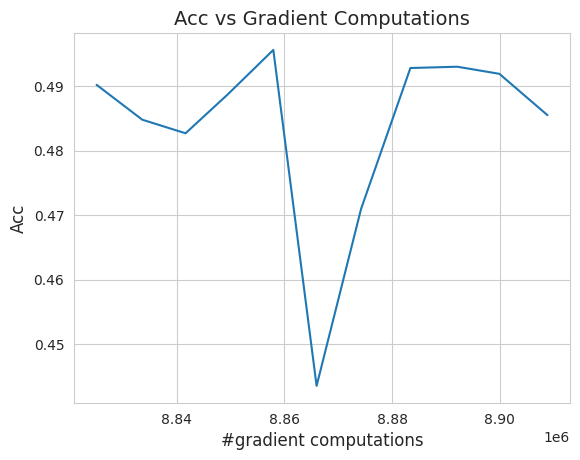

Training: 100%|██████████| 195/195 [00:01<00:00, 130.33it/s, loss=1.1500]


Epoch 12: val_acc=0.48647835850715637


Training: 100%|██████████| 195/195 [00:01<00:00, 130.38it/s, loss=0.7742]


Epoch 13: val_acc=0.49619391560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 115.22it/s, loss=1.0528]


Epoch 14: val_acc=0.49789664149284363


Training: 100%|██████████| 195/195 [00:01<00:00, 118.87it/s, loss=1.2585]


Epoch 15: val_acc=0.46955129504203796


Training: 100%|██████████| 195/195 [00:01<00:00, 119.17it/s, loss=1.0913]


Epoch 16: val_acc=0.4886818826198578


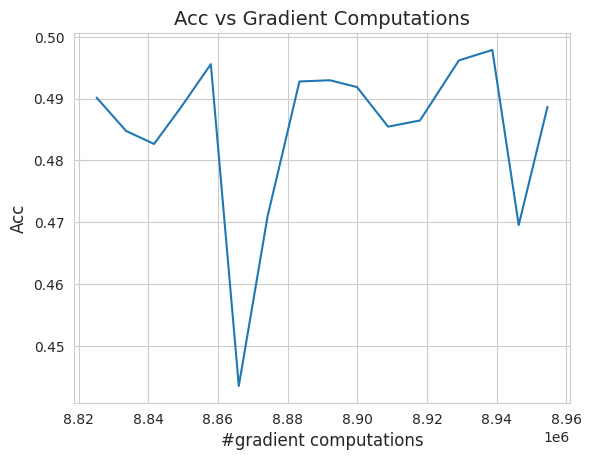

Training: 100%|██████████| 195/195 [00:01<00:00, 120.91it/s, loss=0.7611]


Epoch 17: val_acc=0.4880809485912323


Training: 100%|██████████| 195/195 [00:01<00:00, 134.95it/s, loss=1.1533]


Epoch 18: val_acc=0.4980969727039337


Training: 100%|██████████| 195/195 [00:01<00:00, 128.73it/s, loss=0.8056]


Epoch 19: val_acc=0.48818108439445496


Training: 100%|██████████| 195/195 [00:01<00:00, 123.79it/s, loss=0.8531]


Epoch 20: val_acc=0.48577725887298584


Training: 100%|██████████| 195/195 [00:01<00:00, 130.00it/s, loss=1.5440]


Epoch 21: val_acc=0.49078527092933655


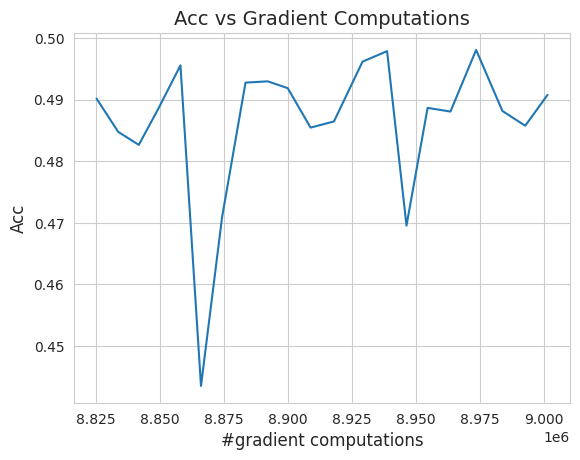

Training: 100%|██████████| 195/195 [00:01<00:00, 128.85it/s, loss=1.1491]


Epoch 22: val_acc=0.4917868673801422


Training: 100%|██████████| 195/195 [00:01<00:00, 129.04it/s, loss=1.1618]


Epoch 23: val_acc=0.48838141560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 129.55it/s, loss=0.9942]
2025-05-23 07:56:06.729568: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 24: val_acc=0.4785657227039337


Training: 100%|██████████| 195/195 [00:01<00:00, 119.16it/s, loss=1.6830]


Epoch 25: val_acc=0.48707932233810425


Training: 100%|██████████| 195/195 [00:01<00:00, 127.94it/s, loss=1.3067]


Epoch 26: val_acc=0.49449118971824646


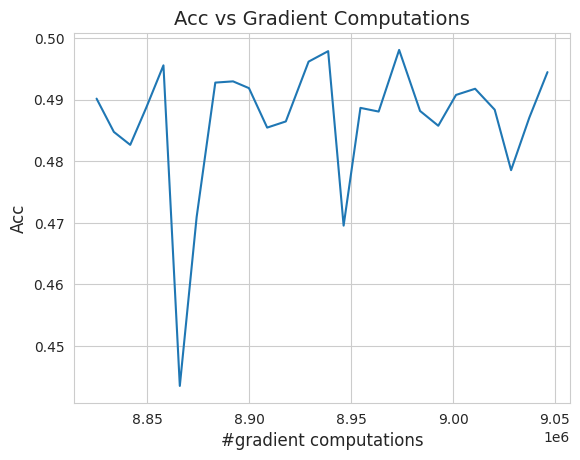

Training: 100%|██████████| 195/195 [00:01<00:00, 125.57it/s, loss=0.9629]


Epoch 27: val_acc=0.46454328298568726


Training: 100%|██████████| 195/195 [00:01<00:00, 118.01it/s, loss=1.0071]


Epoch 28: val_acc=0.49318909645080566


Training: 100%|██████████| 195/195 [00:01<00:00, 125.34it/s, loss=0.9346]


Epoch 29: val_acc=0.47836539149284363


Training: 100%|██████████| 195/195 [00:01<00:00, 131.91it/s, loss=1.3162]


Epoch 30: val_acc=0.4913862347602844


Training: 100%|██████████| 195/195 [00:01<00:00, 133.66it/s, loss=0.7096]


Epoch 31: val_acc=0.48667868971824646


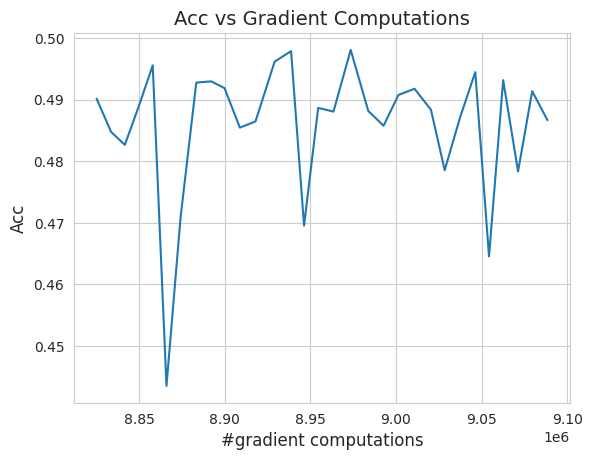

Training: 100%|██████████| 195/195 [00:01<00:00, 136.99it/s, loss=1.5320]


Epoch 32: val_acc=0.4854767620563507


Training: 100%|██████████| 195/195 [00:01<00:00, 129.34it/s, loss=1.0958]


Epoch 33: val_acc=0.48838141560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 129.38it/s, loss=1.2003]


Epoch 34: val_acc=0.47065305709838867


Training: 100%|██████████| 195/195 [00:01<00:00, 143.54it/s, loss=1.5299]


Epoch 35: val_acc=0.49188703298568726


Training: 100%|██████████| 195/195 [00:01<00:00, 134.29it/s, loss=0.9419]


Epoch 36: val_acc=0.4880809485912323


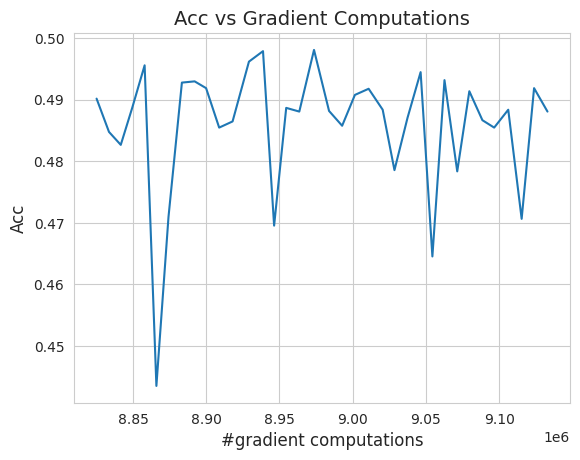

Training: 100%|██████████| 195/195 [00:01<00:00, 124.64it/s, loss=1.1291]


Epoch 37: val_acc=0.47265625


Training: 100%|██████████| 195/195 [00:01<00:00, 121.51it/s, loss=1.3451]


Epoch 38: val_acc=0.4737580120563507


Training: 100%|██████████| 195/195 [00:01<00:00, 129.69it/s, loss=0.8863]


Epoch 39: val_acc=0.49338942766189575


Training: 100%|██████████| 195/195 [00:01<00:00, 129.91it/s, loss=1.2807]


Epoch 40: val_acc=0.4943910241127014


Training: 100%|██████████| 195/195 [00:01<00:00, 124.69it/s, loss=1.3521]


Epoch 41: val_acc=0.47405850887298584


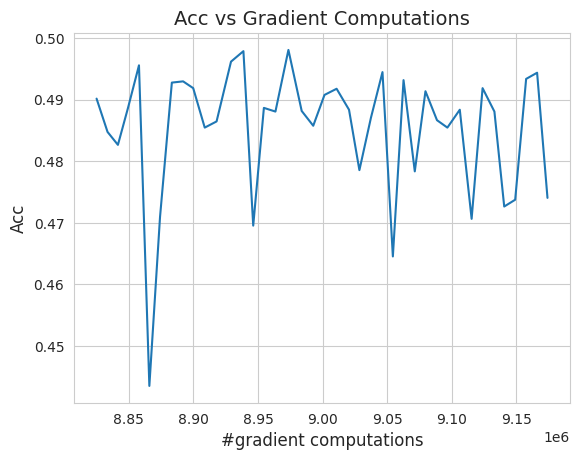

Training: 100%|██████████| 195/195 [00:01<00:00, 131.56it/s, loss=1.2383]


Epoch 42: val_acc=0.48647835850715637


Training: 100%|██████████| 195/195 [00:01<00:00, 127.27it/s, loss=1.1885]


Epoch 43: val_acc=0.4899839758872986


Training: 100%|██████████| 195/195 [00:01<00:00, 125.34it/s, loss=1.0511]


Epoch 44: val_acc=0.48968350887298584


Training: 100%|██████████| 195/195 [00:01<00:00, 125.62it/s, loss=0.9135]


Epoch 45: val_acc=0.49659454822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 113.59it/s, loss=0.6358]


Epoch 46: val_acc=0.4936899244785309


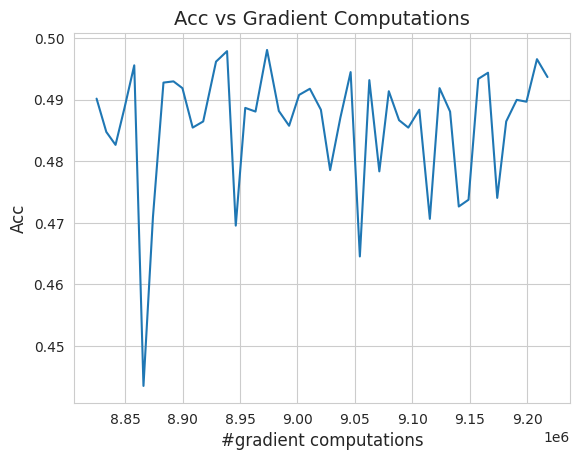

Training: 100%|██████████| 195/195 [00:01<00:00, 128.81it/s, loss=0.8536]


Epoch 47: val_acc=0.4759615361690521


Training: 100%|██████████| 195/195 [00:01<00:00, 116.61it/s, loss=1.4496]


Epoch 48: val_acc=0.4928886294364929


Training: 100%|██████████| 195/195 [00:01<00:00, 124.38it/s, loss=1.1711]


Epoch 49: val_acc=0.4910857379436493


Training: 100%|██████████| 195/195 [00:01<00:00, 127.21it/s, loss=1.0087]


Epoch 50: val_acc=0.4878806173801422


Training: 100%|██████████| 195/195 [00:01<00:00, 125.12it/s, loss=0.8657]


Epoch 51: val_acc=0.48237180709838867


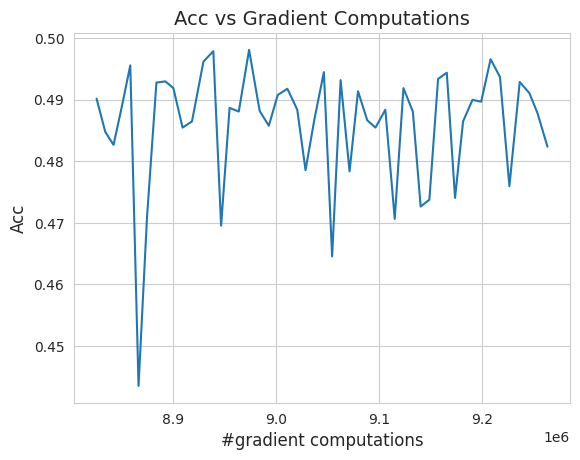

Training: 100%|██████████| 195/195 [00:01<00:00, 119.70it/s, loss=1.6638]


Epoch 52: val_acc=0.4555288553237915


Training: 100%|██████████| 195/195 [00:01<00:00, 134.65it/s, loss=1.1048]


Epoch 53: val_acc=0.48687902092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 132.15it/s, loss=0.9931]


Epoch 54: val_acc=0.48647835850715637


Training: 100%|██████████| 195/195 [00:01<00:00, 129.81it/s, loss=0.8716]


Epoch 55: val_acc=0.49839743971824646


Training: 100%|██████████| 195/195 [00:01<00:00, 124.72it/s, loss=1.2558]


Epoch 56: val_acc=0.4971955120563507


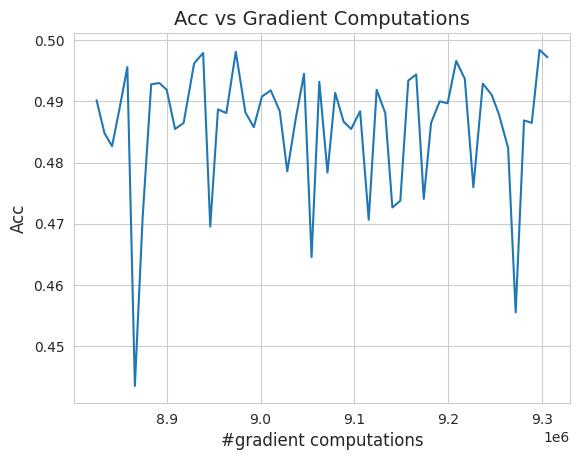

Training: 100%|██████████| 195/195 [00:01<00:00, 125.71it/s, loss=1.1650]


Epoch 57: val_acc=0.4984976053237915


Training: 100%|██████████| 195/195 [00:01<00:00, 120.73it/s, loss=1.5921]


Epoch 58: val_acc=0.4990985691547394


Training: 100%|██████████| 195/195 [00:01<00:00, 127.16it/s, loss=1.1237]


Epoch 59: val_acc=0.4921875


Training: 100%|██████████| 195/195 [00:01<00:00, 125.93it/s, loss=1.0249]


Epoch 60: val_acc=0.49168670177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 133.87it/s, loss=1.3182]


Epoch 61: val_acc=0.4893830120563507


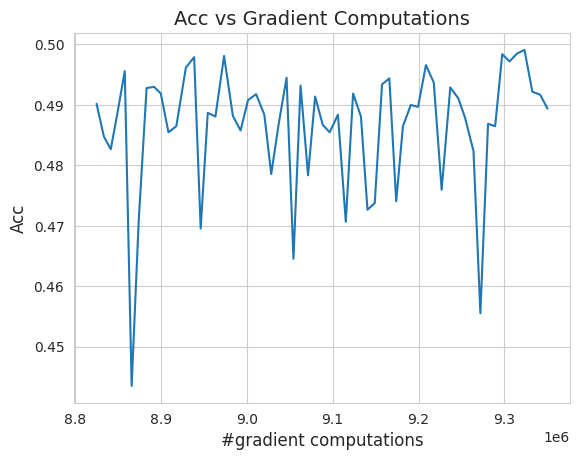

Training: 100%|██████████| 195/195 [00:01<00:00, 123.64it/s, loss=0.7575]


Epoch 62: val_acc=0.5015023946762085


Training: 100%|██████████| 195/195 [00:01<00:00, 118.70it/s, loss=1.1072]


Epoch 63: val_acc=0.4941907227039337


Training: 100%|██████████| 195/195 [00:01<00:00, 114.04it/s, loss=1.2210]


Epoch 64: val_acc=0.49399039149284363


Training: 100%|██████████| 195/195 [00:01<00:00, 122.65it/s, loss=1.2053]


Epoch 65: val_acc=0.4967948794364929


Training: 100%|██████████| 195/195 [00:01<00:00, 129.95it/s, loss=0.7299]


Epoch 66: val_acc=0.49379006028175354


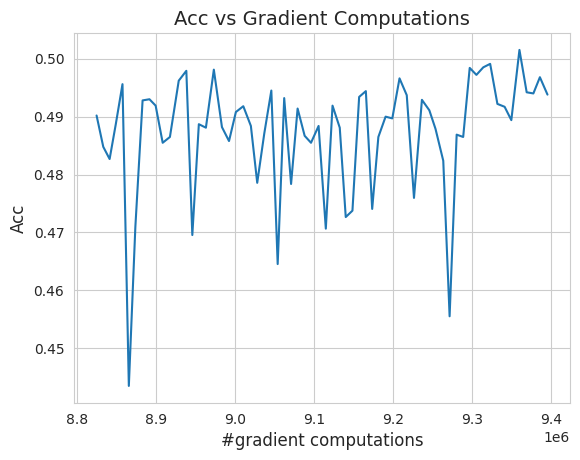

Training: 100%|██████████| 195/195 [00:01<00:00, 124.47it/s, loss=1.2421]


Epoch 67: val_acc=0.49819710850715637


Training: 100%|██████████| 195/195 [00:01<00:00, 136.37it/s, loss=1.1256]


Epoch 68: val_acc=0.48257210850715637


Training: 100%|██████████| 195/195 [00:01<00:00, 135.89it/s, loss=1.2936]


Epoch 69: val_acc=0.4947916865348816


Training: 100%|██████████| 195/195 [00:01<00:00, 120.80it/s, loss=0.8463]


Epoch 70: val_acc=0.4954927861690521


Training: 100%|██████████| 195/195 [00:01<00:00, 121.74it/s, loss=0.9191]


Epoch 71: val_acc=0.4679487347602844


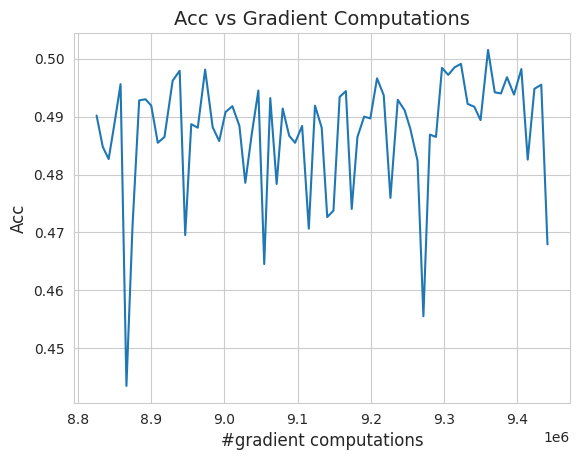

Training: 100%|██████████| 195/195 [00:01<00:00, 121.69it/s, loss=0.9091]


Epoch 72: val_acc=0.4928886294364929


Training: 100%|██████████| 195/195 [00:01<00:00, 132.43it/s, loss=1.2662]


Epoch 73: val_acc=0.49379006028175354


Training: 100%|██████████| 195/195 [00:01<00:00, 123.56it/s, loss=0.8782]


Epoch 74: val_acc=0.4880809485912323


Training: 100%|██████████| 195/195 [00:01<00:00, 119.02it/s, loss=1.2136]


Epoch 75: val_acc=0.4945913553237915


Training: 100%|██████████| 195/195 [00:01<00:00, 115.38it/s, loss=1.1207]


Epoch 76: val_acc=0.49058493971824646


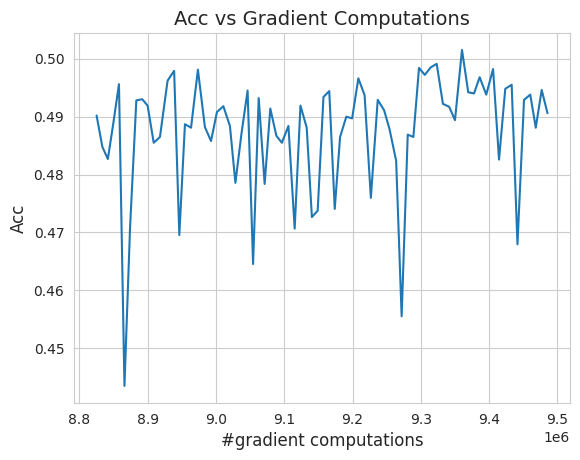

Training: 100%|██████████| 195/195 [00:01<00:00, 122.64it/s, loss=1.3491]


Epoch 77: val_acc=0.48727965354919434


Training: 100%|██████████| 195/195 [00:01<00:00, 128.50it/s, loss=1.0331]


Epoch 78: val_acc=0.46494391560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 123.73it/s, loss=1.6252]


Epoch 79: val_acc=0.49469152092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 118.23it/s, loss=1.1149]


Epoch 80: val_acc=0.49859777092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 132.65it/s, loss=1.0017]


Epoch 81: val_acc=0.4958934485912323


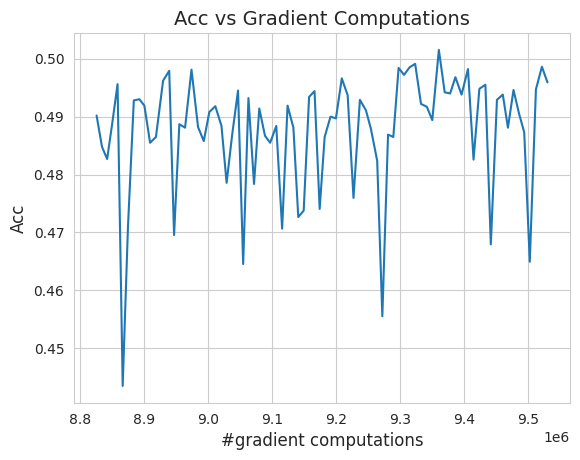

Training: 100%|██████████| 195/195 [00:01<00:00, 132.65it/s, loss=1.2357]


Epoch 82: val_acc=0.4811698794364929


Training: 100%|██████████| 195/195 [00:01<00:00, 124.51it/s, loss=1.1938]


Epoch 83: val_acc=0.4927884638309479


Training: 100%|██████████| 195/195 [00:01<00:00, 130.09it/s, loss=1.3440]


Epoch 84: val_acc=0.47385817766189575


Training: 100%|██████████| 195/195 [00:01<00:00, 129.56it/s, loss=1.2013]


Epoch 85: val_acc=0.4899839758872986


Training: 100%|██████████| 195/195 [00:01<00:00, 131.40it/s, loss=1.1256]


Epoch 86: val_acc=0.4958934485912323


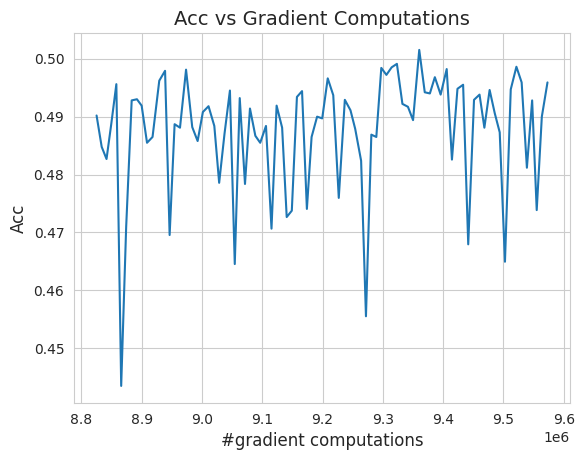

Training: 100%|██████████| 195/195 [00:01<00:00, 129.58it/s, loss=0.9313]


Epoch 87: val_acc=0.4873798191547394


Training: 100%|██████████| 195/195 [00:01<00:00, 121.72it/s, loss=1.3833]


Epoch 88: val_acc=0.4912860691547394


Training: 100%|██████████| 195/195 [00:01<00:00, 126.76it/s, loss=0.9198]


Epoch 89: val_acc=0.4874799847602844


Training: 100%|██████████| 195/195 [00:01<00:00, 127.61it/s, loss=1.4240]


Epoch 90: val_acc=0.47365784645080566


Training: 100%|██████████| 195/195 [00:01<00:00, 123.47it/s, loss=1.0721]


Epoch 91: val_acc=0.4874799847602844


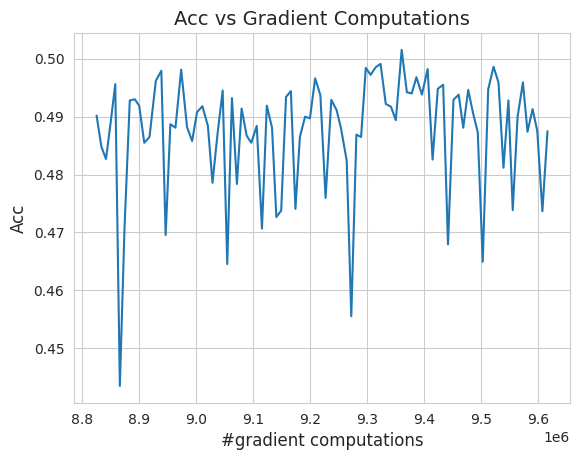

Training: 100%|██████████| 195/195 [00:01<00:00, 131.77it/s, loss=0.9892]


Epoch 92: val_acc=0.48577725887298584


Training: 100%|██████████| 195/195 [00:01<00:00, 126.90it/s, loss=1.0993]


Epoch 93: val_acc=0.4915865361690521


Training: 100%|██████████| 195/195 [00:01<00:00, 132.47it/s, loss=1.2496]


Epoch 94: val_acc=0.46584534645080566


Training: 100%|██████████| 195/195 [00:01<00:00, 118.39it/s, loss=1.6989]


Epoch 95: val_acc=0.4878806173801422


Training: 100%|██████████| 195/195 [00:01<00:00, 125.69it/s, loss=1.1656]


Epoch 96: val_acc=0.4858774244785309


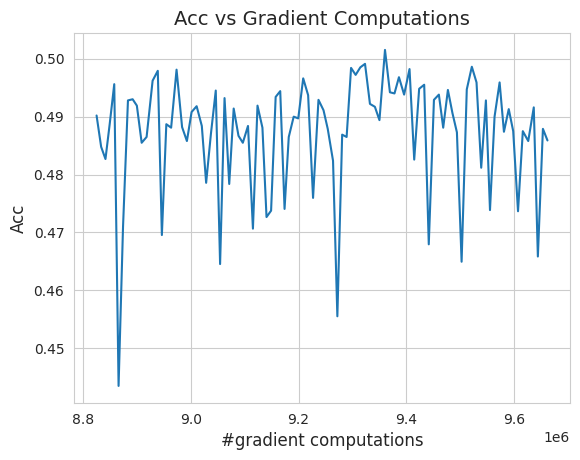

Training: 100%|██████████| 195/195 [00:01<00:00, 132.66it/s, loss=1.1753]


Epoch 97: val_acc=0.4943910241127014


Training: 100%|██████████| 195/195 [00:01<00:00, 134.43it/s, loss=1.1310]


Epoch 98: val_acc=0.47055289149284363


Training: 100%|██████████| 195/195 [00:01<00:00, 122.49it/s, loss=0.9962]


Epoch 99: val_acc=0.49358975887298584


Training: 100%|██████████| 195/195 [00:01<00:00, 127.24it/s, loss=0.8017]


Epoch 100: val_acc=0.493088960647583


Training: 100%|██████████| 195/195 [00:01<00:00, 131.64it/s, loss=1.1033]


Epoch 101: val_acc=0.4956931173801422


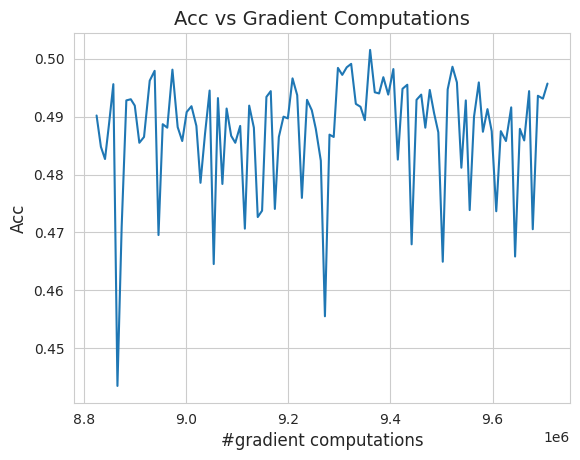

Training: 100%|██████████| 195/195 [00:01<00:00, 130.04it/s, loss=1.0392]


Epoch 102: val_acc=0.4927884638309479


Training: 100%|██████████| 195/195 [00:01<00:00, 122.94it/s, loss=0.7711]


Epoch 103: val_acc=0.48968350887298584


Training: 100%|██████████| 195/195 [00:01<00:00, 128.72it/s, loss=1.0058]


Epoch 104: val_acc=0.4854767620563507


Training: 100%|██████████| 195/195 [00:01<00:00, 119.39it/s, loss=1.5086]


Epoch 105: val_acc=0.4845753312110901


Training: 100%|██████████| 195/195 [00:01<00:00, 125.51it/s, loss=0.8522]


Epoch 106: val_acc=0.4668469727039337


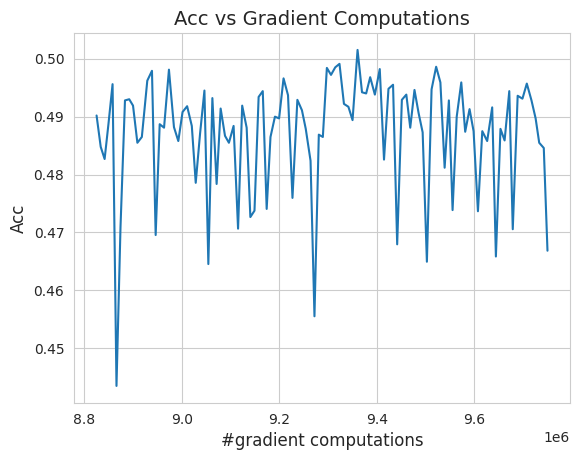

Training: 100%|██████████| 195/195 [00:01<00:00, 112.11it/s, loss=1.0181]


Epoch 107: val_acc=0.4707532227039337


Training: 100%|██████████| 195/195 [00:01<00:00, 121.20it/s, loss=1.4378]


Epoch 108: val_acc=0.4865785241127014


Training: 100%|██████████| 195/195 [00:01<00:00, 126.04it/s, loss=1.9370]


Epoch 109: val_acc=0.4906851053237915


Training: 100%|██████████| 195/195 [00:01<00:00, 125.98it/s, loss=1.4444]


Epoch 110: val_acc=0.4908854365348816


Training: 100%|██████████| 195/195 [00:01<00:00, 115.55it/s, loss=1.4475]


Epoch 111: val_acc=0.48407453298568726


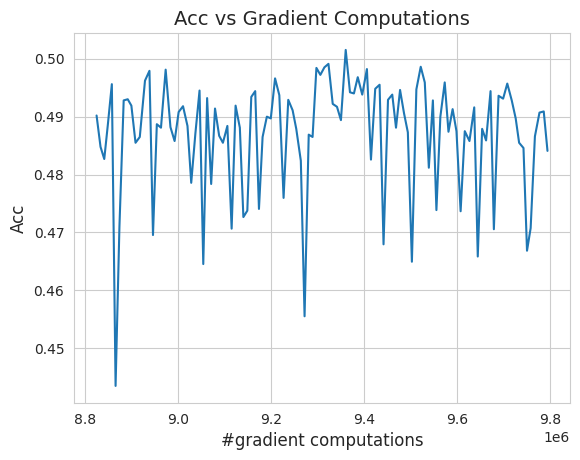

Training: 100%|██████████| 195/195 [00:01<00:00, 122.94it/s, loss=1.5382]


Epoch 112: val_acc=0.49208733439445496


Training: 100%|██████████| 195/195 [00:01<00:00, 121.96it/s, loss=1.2336]


Epoch 113: val_acc=0.4821714758872986


Training: 100%|██████████| 195/195 [00:01<00:00, 126.03it/s, loss=1.7423]


Epoch 114: val_acc=0.48988381028175354


Training: 100%|██████████| 195/195 [00:01<00:00, 121.09it/s, loss=0.9860]


Epoch 115: val_acc=0.4952924847602844


Training: 100%|██████████| 195/195 [00:01<00:00, 133.83it/s, loss=0.8166]


Epoch 116: val_acc=0.4919871985912323


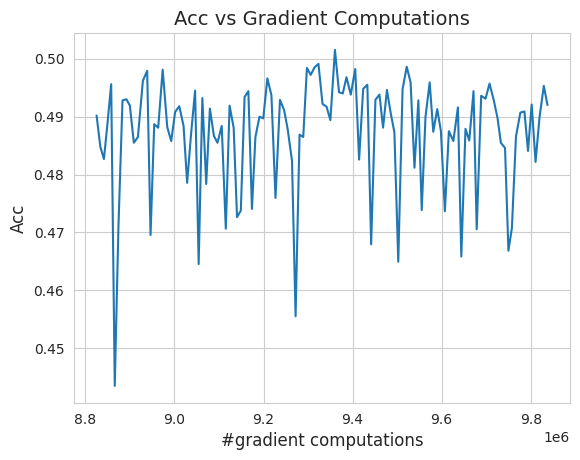

Training: 100%|██████████| 195/195 [00:01<00:00, 127.71it/s, loss=1.2975]


Epoch 117: val_acc=0.4964943826198578


Training: 100%|██████████| 195/195 [00:01<00:00, 134.27it/s, loss=1.0376]


Epoch 118: val_acc=0.4893830120563507


Training: 100%|██████████| 195/195 [00:01<00:00, 127.51it/s, loss=2.5562]


Epoch 119: val_acc=0.42868590354919434


Training: 100%|██████████| 195/195 [00:01<00:00, 125.56it/s, loss=1.1863]


Epoch 120: val_acc=0.49749600887298584


Training: 100%|██████████| 195/195 [00:01<00:00, 123.00it/s, loss=1.5172]


Epoch 121: val_acc=0.49819710850715637


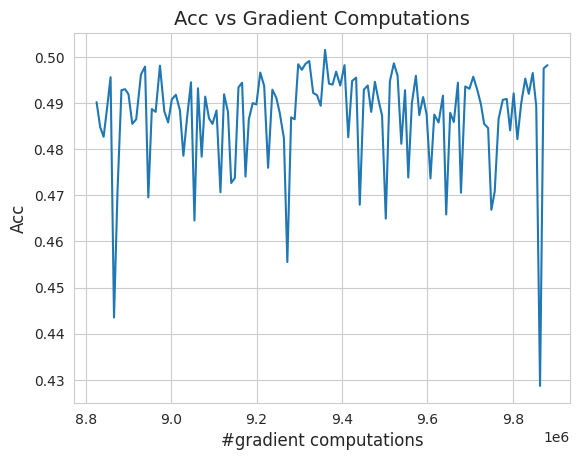

Training: 100%|██████████| 195/195 [00:01<00:00, 126.02it/s, loss=1.1774]


Epoch 122: val_acc=0.4949919879436493


Training: 100%|██████████| 195/195 [00:01<00:00, 130.16it/s, loss=0.9931]


Epoch 123: val_acc=0.4917868673801422


Training: 100%|██████████| 195/195 [00:01<00:00, 121.44it/s, loss=1.1627]


Epoch 124: val_acc=0.49489182233810425


Training: 100%|██████████| 195/195 [00:01<00:00, 121.39it/s, loss=1.2783]


Epoch 125: val_acc=0.48948317766189575


Training: 100%|██████████| 195/195 [00:01<00:00, 119.59it/s, loss=0.9701]


Epoch 126: val_acc=0.4991987347602844


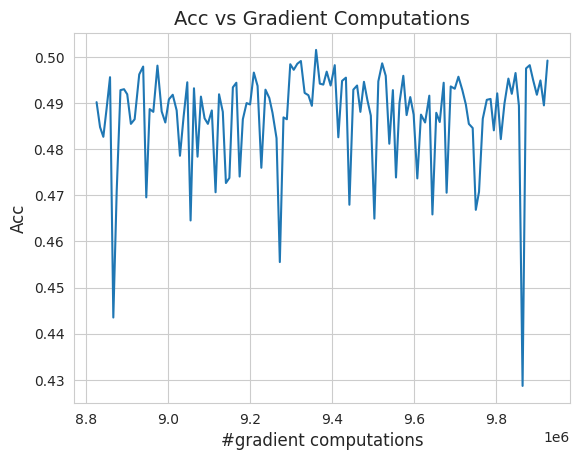

Training: 100%|██████████| 195/195 [00:01<00:00, 120.45it/s, loss=1.1311]


Epoch 127: val_acc=0.4954927861690521


Training: 100%|██████████| 195/195 [00:01<00:00, 119.72it/s, loss=1.3013]


Epoch 128: val_acc=0.49098557233810425


Training: 100%|██████████| 195/195 [00:01<00:00, 134.20it/s, loss=1.0181]


Epoch 129: val_acc=0.5063101053237915


Training: 100%|██████████| 195/195 [00:01<00:00, 123.87it/s, loss=1.0070]


Epoch 130: val_acc=0.49559295177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 132.83it/s, loss=1.0975]


Epoch 131: val_acc=0.4964943826198578


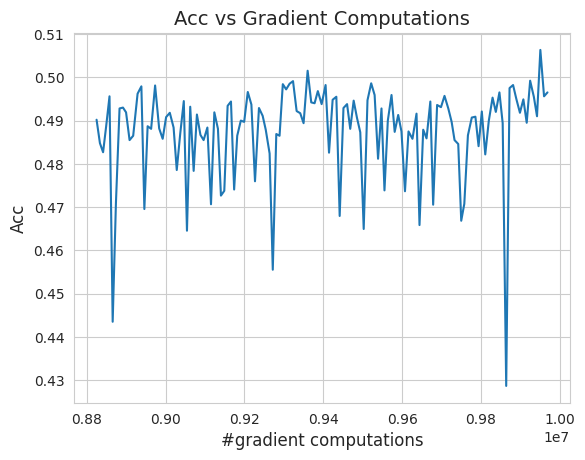

Training: 100%|██████████| 195/195 [00:01<00:00, 128.99it/s, loss=1.4220]


Epoch 132: val_acc=0.49899840354919434


Training: 100%|██████████| 195/195 [00:01<00:00, 126.97it/s, loss=1.9214]


Epoch 133: val_acc=0.4837740361690521


Training: 100%|██████████| 195/195 [00:01<00:00, 124.20it/s, loss=0.8660]


Epoch 134: val_acc=0.4975961744785309


Training: 100%|██████████| 195/195 [00:01<00:00, 120.49it/s, loss=1.0781]


Epoch 135: val_acc=0.49619391560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 126.08it/s, loss=1.1810]


Epoch 136: val_acc=0.4947916865348816


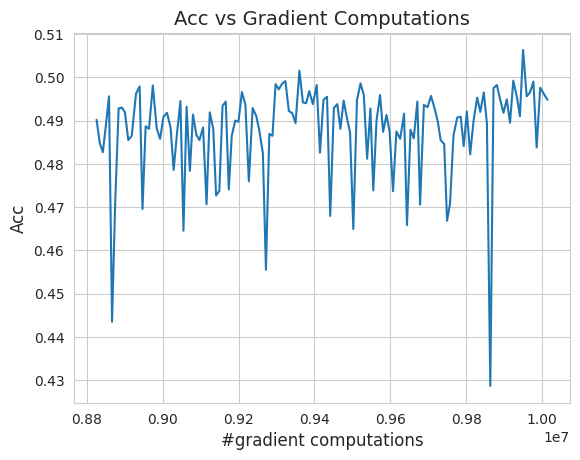

Training: 100%|██████████| 195/195 [00:01<00:00, 126.89it/s, loss=0.8870]


Epoch 137: val_acc=0.4984976053237915


Training: 100%|██████████| 195/195 [00:01<00:00, 138.72it/s, loss=1.1288]


Epoch 138: val_acc=0.49769631028175354


Training: 100%|██████████| 195/195 [00:01<00:00, 125.88it/s, loss=1.5649]


Epoch 139: val_acc=0.49659454822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 122.90it/s, loss=0.9459]


Epoch 140: val_acc=0.48828125


Training: 100%|██████████| 195/195 [00:01<00:00, 130.18it/s, loss=0.9649]


Epoch 141: val_acc=0.4800681173801422


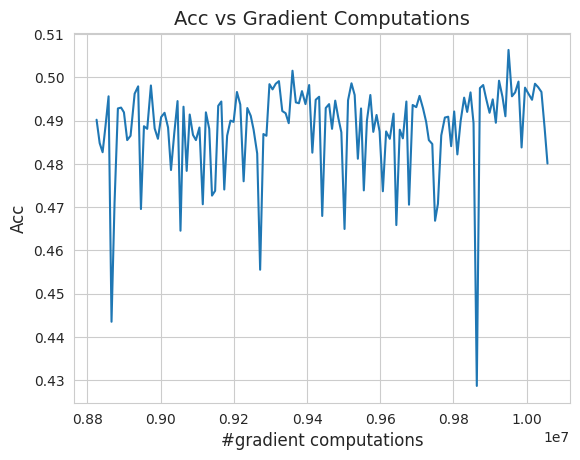

Training: 100%|██████████| 195/195 [00:01<00:00, 127.74it/s, loss=1.1592]


Epoch 142: val_acc=0.4880809485912323


Training: 100%|██████████| 195/195 [00:01<00:00, 127.93it/s, loss=1.4248]


Epoch 143: val_acc=0.48467549681663513


Training: 100%|██████████| 195/195 [00:01<00:00, 120.86it/s, loss=1.6066]


Epoch 144: val_acc=0.45342549681663513


Training: 100%|██████████| 195/195 [00:01<00:00, 124.03it/s, loss=1.2044]


Epoch 145: val_acc=0.49639424681663513


Training: 100%|██████████| 195/195 [00:01<00:00, 125.55it/s, loss=1.3219]


Epoch 146: val_acc=0.48387420177459717


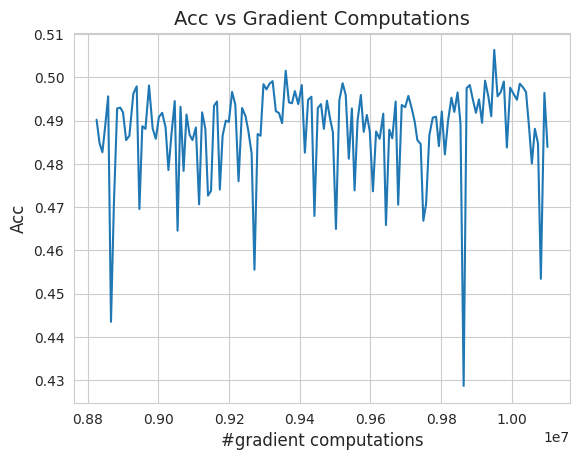

Training: 100%|██████████| 195/195 [00:01<00:00, 121.84it/s, loss=0.7684]


Epoch 147: val_acc=0.48667868971824646


Training: 100%|██████████| 195/195 [00:01<00:00, 126.07it/s, loss=1.8690]


Epoch 148: val_acc=0.4341947138309479


Training: 100%|██████████| 195/195 [00:01<00:00, 126.96it/s, loss=1.1393]


Epoch 149: val_acc=0.48337340354919434


Training: 100%|██████████| 195/195 [00:01<00:00, 138.00it/s, loss=0.9630]


Epoch 150: val_acc=0.48798078298568726


Training: 100%|██████████| 195/195 [00:01<00:00, 128.43it/s, loss=0.7175]


Epoch 151: val_acc=0.4824719727039337


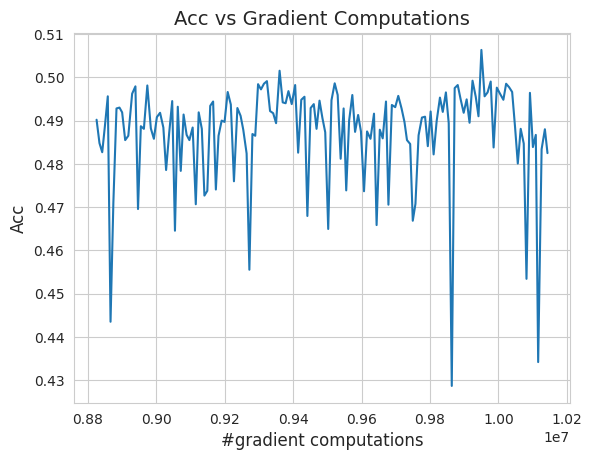

Training: 100%|██████████| 195/195 [00:01<00:00, 131.70it/s, loss=1.3636]


Epoch 152: val_acc=0.49298879504203796


Training: 100%|██████████| 195/195 [00:01<00:00, 122.33it/s, loss=1.0015]


Epoch 153: val_acc=0.46734777092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 125.48it/s, loss=1.4408]


Epoch 154: val_acc=0.4835737347602844


Training: 100%|██████████| 195/195 [00:01<00:00, 128.07it/s, loss=1.4918]


Epoch 155: val_acc=0.48687902092933655


Training: 100%|██████████| 195/195 [00:01<00:00, 124.54it/s, loss=1.5735]


Epoch 156: val_acc=0.4902844727039337


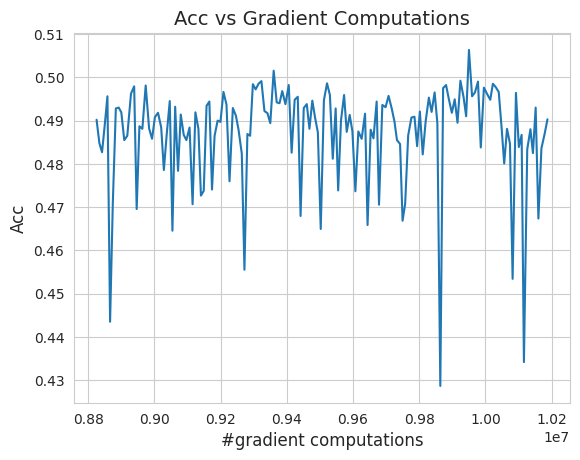

Training: 100%|██████████| 195/195 [00:01<00:00, 141.52it/s, loss=1.4538]


Epoch 157: val_acc=0.5011017918586731


Training: 100%|██████████| 195/195 [00:01<00:00, 124.73it/s, loss=0.8701]


Epoch 158: val_acc=0.48988381028175354


Training: 100%|██████████| 195/195 [00:01<00:00, 121.81it/s, loss=1.4976]


Epoch 159: val_acc=0.4923878312110901


Training: 100%|██████████| 195/195 [00:01<00:00, 126.74it/s, loss=1.4226]


Epoch 160: val_acc=0.48727965354919434


Training: 100%|██████████| 195/195 [00:01<00:00, 128.28it/s, loss=1.0770]


Epoch 161: val_acc=0.4951923191547394


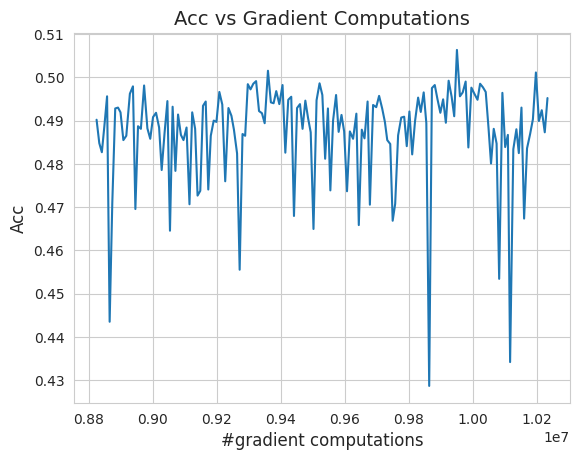

Training: 100%|██████████| 195/195 [00:01<00:00, 130.49it/s, loss=1.0708]


Epoch 162: val_acc=0.4982972741127014


Training: 100%|██████████| 195/195 [00:01<00:00, 120.37it/s, loss=1.2341]


Epoch 163: val_acc=0.4945913553237915


Training: 100%|██████████| 195/195 [00:01<00:00, 123.85it/s, loss=0.9361]


Epoch 164: val_acc=0.4899839758872986


Training: 100%|██████████| 195/195 [00:01<00:00, 125.29it/s, loss=1.1336]


Epoch 165: val_acc=0.4988982379436493


Training: 100%|██████████| 195/195 [00:01<00:00, 142.62it/s, loss=1.5140]


Epoch 166: val_acc=0.4867788553237915


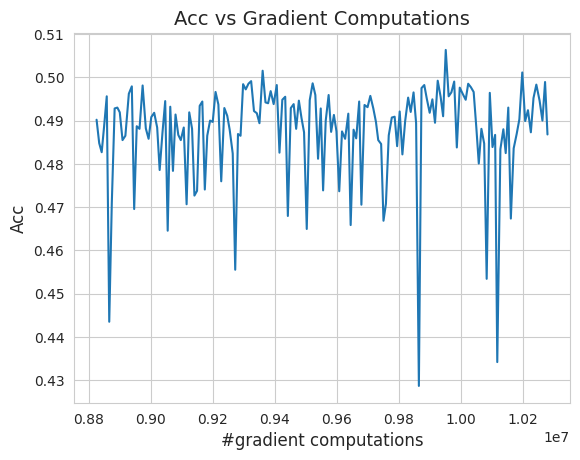

Training: 100%|██████████| 195/195 [00:01<00:00, 128.89it/s, loss=1.0191]


Epoch 167: val_acc=0.48778045177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 119.76it/s, loss=0.9700]


Epoch 168: val_acc=0.496995210647583


Training: 100%|██████████| 195/195 [00:01<00:00, 131.34it/s, loss=1.1367]


Epoch 169: val_acc=0.47085335850715637


Training: 100%|██████████| 195/195 [00:01<00:00, 133.75it/s, loss=1.1721]


Epoch 170: val_acc=0.45582932233810425


Training: 100%|██████████| 195/195 [00:01<00:00, 130.25it/s, loss=1.3494]


Epoch 171: val_acc=0.49098557233810425


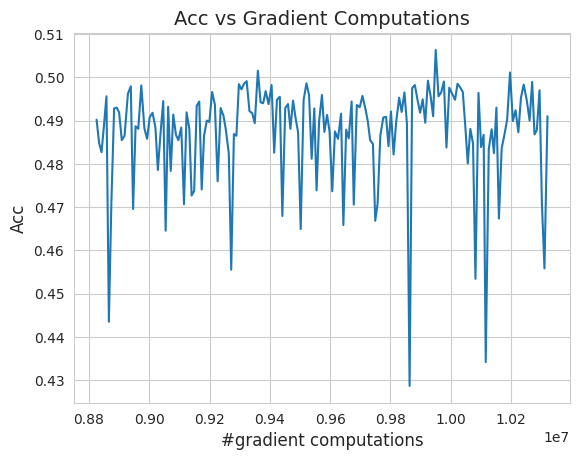

Training: 100%|██████████| 195/195 [00:01<00:00, 121.53it/s, loss=0.9309]


Epoch 172: val_acc=0.49489182233810425


Training: 100%|██████████| 195/195 [00:01<00:00, 126.62it/s, loss=1.2412]


Epoch 173: val_acc=0.49639424681663513


Training: 100%|██████████| 195/195 [00:01<00:00, 123.65it/s, loss=1.5238]


Epoch 174: val_acc=0.4904847741127014


Training: 100%|██████████| 195/195 [00:01<00:00, 134.41it/s, loss=1.4929]


Epoch 175: val_acc=0.49208733439445496


Training: 100%|██████████| 195/195 [00:01<00:00, 133.71it/s, loss=1.4331]


Epoch 176: val_acc=0.49248799681663513


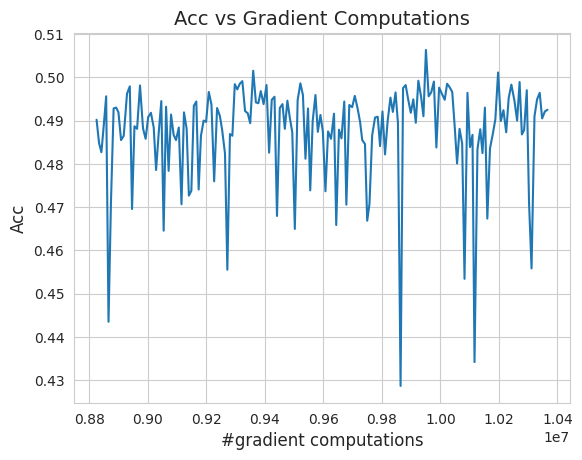

Training: 100%|██████████| 195/195 [00:01<00:00, 133.38it/s, loss=1.5377]


Epoch 177: val_acc=0.4990985691547394


Training: 100%|██████████| 195/195 [00:01<00:00, 131.65it/s, loss=1.5862]


Epoch 178: val_acc=0.4990985691547394


Training: 100%|██████████| 195/195 [00:01<00:00, 132.74it/s, loss=0.9475]


Epoch 179: val_acc=0.5006009936332703


Training: 100%|██████████| 195/195 [00:01<00:00, 133.60it/s, loss=1.3192]


Epoch 180: val_acc=0.4322916865348816


Training: 100%|██████████| 195/195 [00:01<00:00, 132.73it/s, loss=1.3055]


Epoch 181: val_acc=0.4796674847602844


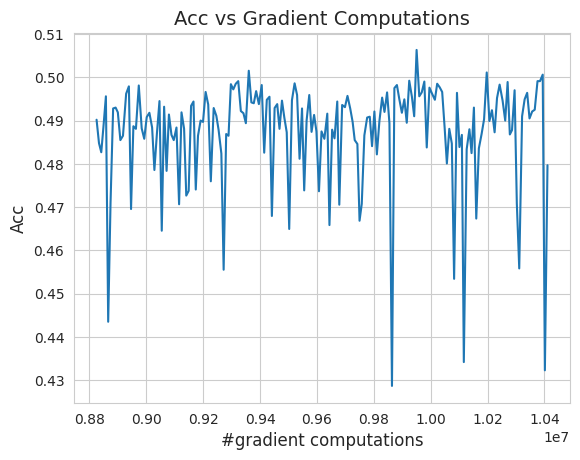

Training: 100%|██████████| 195/195 [00:01<00:00, 126.99it/s, loss=1.0168]


Epoch 182: val_acc=0.4875801205635071


Training: 100%|██████████| 195/195 [00:01<00:00, 122.16it/s, loss=1.1925]


Epoch 183: val_acc=0.49509215354919434


Training: 100%|██████████| 195/195 [00:01<00:00, 131.24it/s, loss=1.0969]


Epoch 184: val_acc=0.5016025900840759


Training: 100%|██████████| 195/195 [00:01<00:00, 135.81it/s, loss=0.9837]


Epoch 185: val_acc=0.4936899244785309


Training: 100%|██████████| 195/195 [00:01<00:00, 126.12it/s, loss=0.9630]


Epoch 186: val_acc=0.49969953298568726


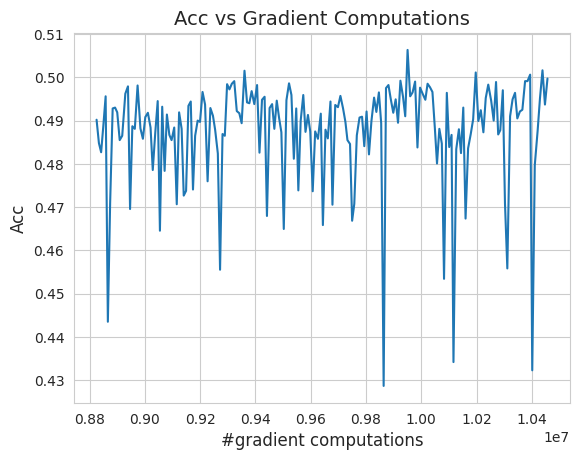

Training: 100%|██████████| 195/195 [00:01<00:00, 125.62it/s, loss=1.6784]


Epoch 187: val_acc=0.4993990361690521


Training: 100%|██████████| 195/195 [00:01<00:00, 130.33it/s, loss=1.0683]


Epoch 188: val_acc=0.49409055709838867


Training: 100%|██████████| 195/195 [00:01<00:00, 123.11it/s, loss=0.8983]


Epoch 189: val_acc=0.5035055875778198


Training: 100%|██████████| 195/195 [00:01<00:00, 122.22it/s, loss=0.8590]


Epoch 190: val_acc=0.5040064454078674


Training: 100%|██████████| 195/195 [00:01<00:00, 127.48it/s, loss=1.0911]


Epoch 191: val_acc=0.5036057829856873


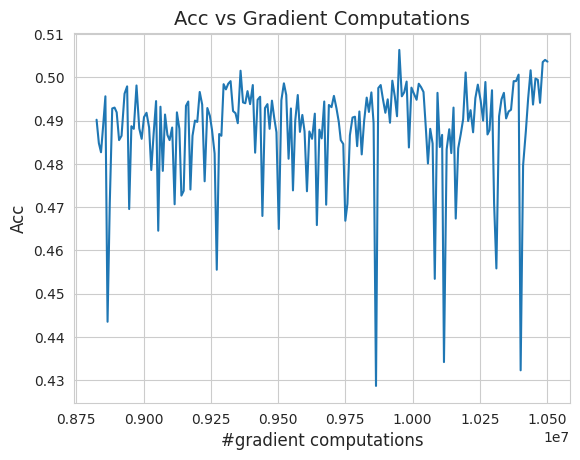

Training: 100%|██████████| 195/195 [00:01<00:00, 129.05it/s, loss=0.5798]


Epoch 192: val_acc=0.49338942766189575


Training: 100%|██████████| 195/195 [00:01<00:00, 130.26it/s, loss=1.2348]


Epoch 193: val_acc=0.48076924681663513


Training: 100%|██████████| 195/195 [00:01<00:00, 130.23it/s, loss=1.2247]


Epoch 194: val_acc=0.4982972741127014


Training: 100%|██████████| 195/195 [00:01<00:00, 129.00it/s, loss=0.8993]


Epoch 195: val_acc=0.49969953298568726


Training: 100%|██████████| 195/195 [00:01<00:00, 123.47it/s, loss=1.4171]


Epoch 196: val_acc=0.5046073794364929


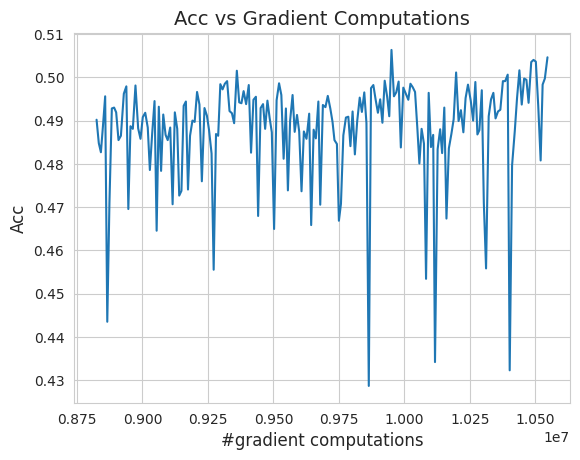

Training: 100%|██████████| 195/195 [00:01<00:00, 125.35it/s, loss=1.5609]


Epoch 197: val_acc=0.5060096383094788


Training: 100%|██████████| 195/195 [00:01<00:00, 131.80it/s, loss=1.1580]


Epoch 198: val_acc=0.48467549681663513


Training: 100%|██████████| 195/195 [00:01<00:00, 130.52it/s, loss=1.1333]


Epoch 199: val_acc=0.5012019276618958


Training: 100%|██████████| 195/195 [00:01<00:00, 127.45it/s, loss=0.8801]


Epoch 200: val_acc=0.5025039911270142


Training: 100%|██████████| 195/195 [00:01<00:00, 127.50it/s, loss=1.0109]


Epoch 201: val_acc=0.49729567766189575


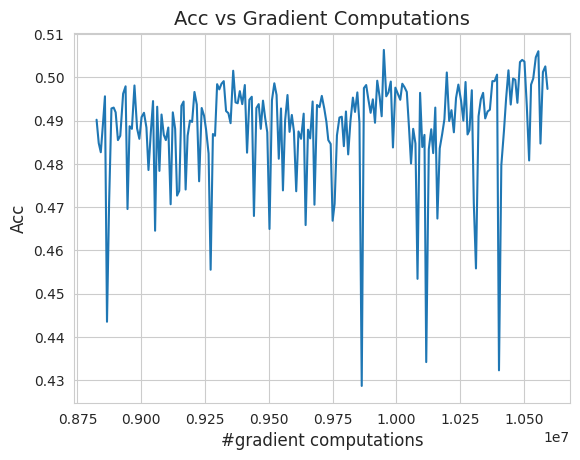

Training: 100%|██████████| 195/195 [00:01<00:00, 135.82it/s, loss=1.1229]


Epoch 202: val_acc=0.4951923191547394


Training: 100%|██████████| 195/195 [00:01<00:00, 127.83it/s, loss=1.1505]


Epoch 203: val_acc=0.49769631028175354


Training: 100%|██████████| 195/195 [00:01<00:00, 125.74it/s, loss=0.7720]


Epoch 204: val_acc=0.5080128312110901


Training: 100%|██████████| 195/195 [00:01<00:00, 120.14it/s, loss=0.6800]


Epoch 205: val_acc=0.4997996985912323


Training: 100%|██████████| 195/195 [00:01<00:00, 121.73it/s, loss=1.3831]


Epoch 206: val_acc=0.4932892620563507


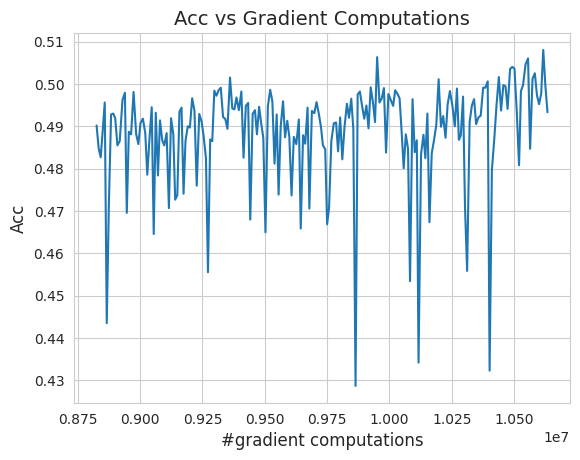

Training: 100%|██████████| 195/195 [00:01<00:00, 122.56it/s, loss=1.0557]


Epoch 207: val_acc=0.5042067170143127


Training: 100%|██████████| 195/195 [00:01<00:00, 128.26it/s, loss=1.0735]


Epoch 208: val_acc=0.5074118375778198


Training: 100%|██████████| 195/195 [00:01<00:00, 130.19it/s, loss=1.0413]


Epoch 209: val_acc=0.4941907227039337


Training: 100%|██████████| 195/195 [00:01<00:00, 128.07it/s, loss=1.0997]


Epoch 210: val_acc=0.5008012652397156


Training: 100%|██████████| 195/195 [00:01<00:00, 127.89it/s, loss=0.9281]


Epoch 211: val_acc=0.5118189454078674


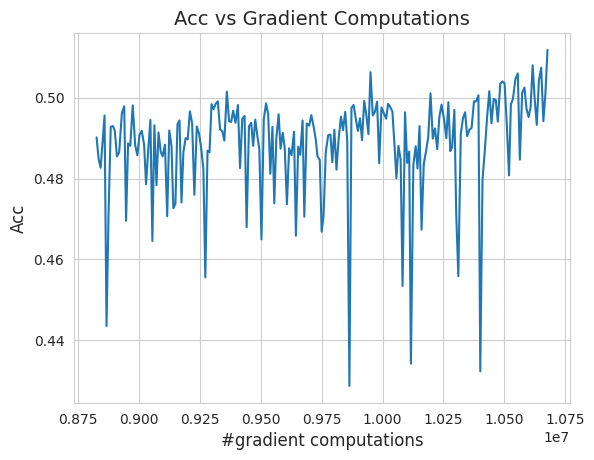

Training: 100%|██████████| 195/195 [00:01<00:00, 125.32it/s, loss=0.8506]


Epoch 212: val_acc=0.5062099695205688


Training: 100%|██████████| 195/195 [00:01<00:00, 131.56it/s, loss=0.6814]


Epoch 213: val_acc=0.5104166865348816


Training: 100%|██████████| 195/195 [00:01<00:00, 133.82it/s, loss=0.7338]


Epoch 214: val_acc=0.5118189454078674


Training: 100%|██████████| 195/195 [00:01<00:00, 132.87it/s, loss=1.0250]


Epoch 215: val_acc=0.5101162195205688


Training: 100%|██████████| 195/195 [00:01<00:00, 133.96it/s, loss=0.7340]


Epoch 216: val_acc=0.5096153616905212


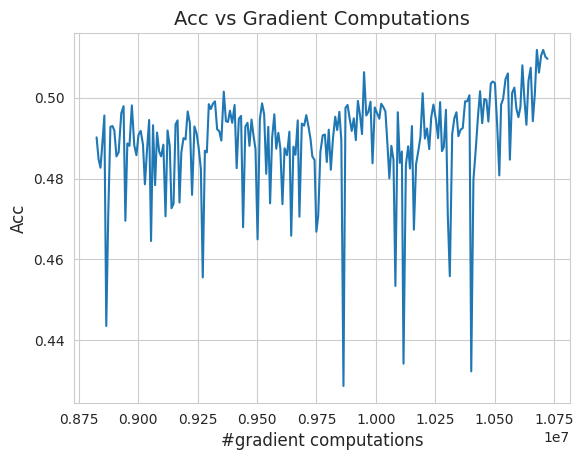

Training: 100%|██████████| 195/195 [00:01<00:00, 127.92it/s, loss=1.1924]


Epoch 217: val_acc=0.5011017918586731


Training: 100%|██████████| 195/195 [00:01<00:00, 128.10it/s, loss=1.6049]


Epoch 218: val_acc=0.3578726053237915


Training: 100%|██████████| 195/195 [00:01<00:00, 126.13it/s, loss=1.1087]


Epoch 219: val_acc=0.5007011294364929


Training: 100%|██████████| 195/195 [00:01<00:00, 127.74it/s, loss=1.4578]


Epoch 220: val_acc=0.5015023946762085


Training: 100%|██████████| 195/195 [00:01<00:00, 125.00it/s, loss=1.5550]


Epoch 221: val_acc=0.5043069124221802


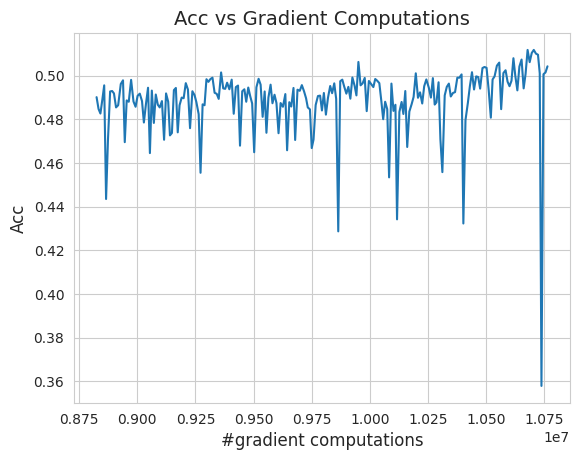

Training: 100%|██████████| 195/195 [00:01<00:00, 123.15it/s, loss=1.2605]


Epoch 222: val_acc=0.4884815812110901


Training: 100%|██████████| 195/195 [00:01<00:00, 124.80it/s, loss=1.5132]


Epoch 223: val_acc=0.41766828298568726


Training: 100%|██████████| 195/195 [00:01<00:00, 125.60it/s, loss=1.1178]


Epoch 224: val_acc=0.49379006028175354


Training: 100%|██████████| 195/195 [00:01<00:00, 122.99it/s, loss=1.2808]


Epoch 225: val_acc=0.4941907227039337


Training: 100%|██████████| 195/195 [00:01<00:00, 126.05it/s, loss=0.9569]


Epoch 226: val_acc=0.48337340354919434


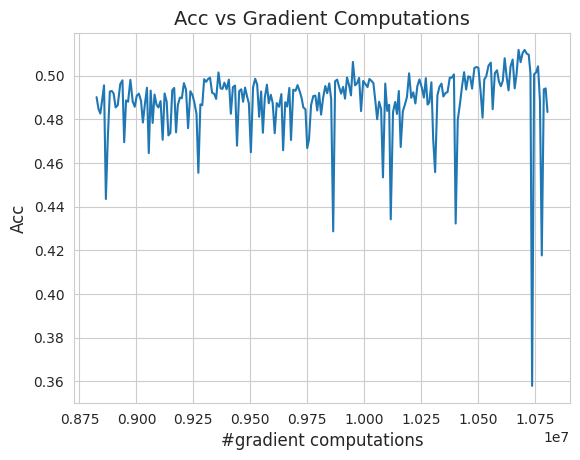

Training: 100%|██████████| 195/195 [00:01<00:00, 126.06it/s, loss=1.1612]


Epoch 227: val_acc=0.49318909645080566


Training: 100%|██████████| 195/195 [00:01<00:00, 125.10it/s, loss=0.9586]


Epoch 228: val_acc=0.5044070482254028


Training: 100%|██████████| 195/195 [00:01<00:00, 125.37it/s, loss=1.0960]


Epoch 229: val_acc=0.49409055709838867


Training: 100%|██████████| 195/195 [00:01<00:00, 118.21it/s, loss=1.2900]


Epoch 230: val_acc=0.5031049847602844


Training: 100%|██████████| 195/195 [00:01<00:00, 125.82it/s, loss=1.0529]


Epoch 231: val_acc=0.5021033883094788


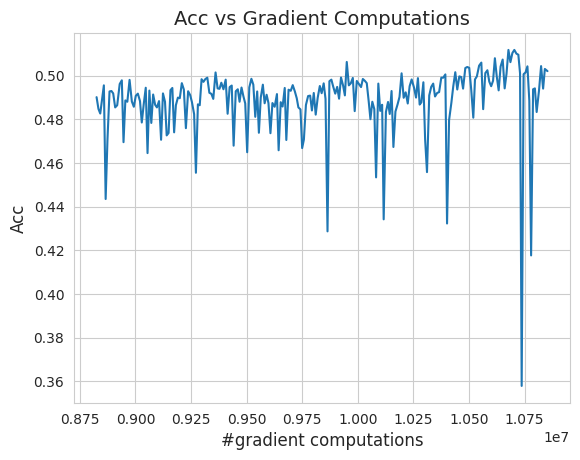

Training: 100%|██████████| 195/195 [00:01<00:00, 135.27it/s, loss=1.0658]


Epoch 232: val_acc=0.5082131624221802


Training: 100%|██████████| 195/195 [00:01<00:00, 129.44it/s, loss=1.0357]


Epoch 233: val_acc=0.5060096383094788


Training: 100%|██████████| 195/195 [00:01<00:00, 131.75it/s, loss=1.0130]


Epoch 234: val_acc=0.5010015964508057


Training: 100%|██████████| 195/195 [00:01<00:00, 122.60it/s, loss=1.0674]


Epoch 235: val_acc=0.5085136294364929


Training: 100%|██████████| 195/195 [00:01<00:00, 132.74it/s, loss=1.0783]


Epoch 236: val_acc=0.4966947138309479


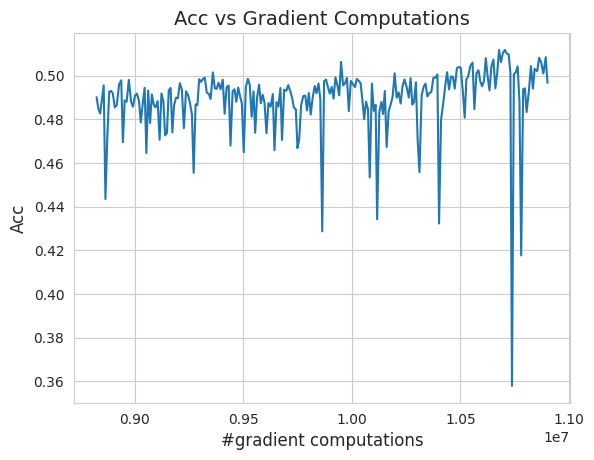

Training: 100%|██████████| 195/195 [00:01<00:00, 125.60it/s, loss=1.0126]


Epoch 237: val_acc=0.50390625


Training: 100%|██████████| 195/195 [00:01<00:00, 116.67it/s, loss=1.1797]


Epoch 238: val_acc=0.4806690812110901


Training: 100%|██████████| 195/195 [00:01<00:00, 129.73it/s, loss=1.4247]


Epoch 239: val_acc=0.5042067170143127


Training: 100%|██████████| 195/195 [00:01<00:00, 121.24it/s, loss=0.8841]


Epoch 240: val_acc=0.4988982379436493


Training: 100%|██████████| 195/195 [00:01<00:00, 130.80it/s, loss=0.8678]


Epoch 241: val_acc=0.5097155570983887


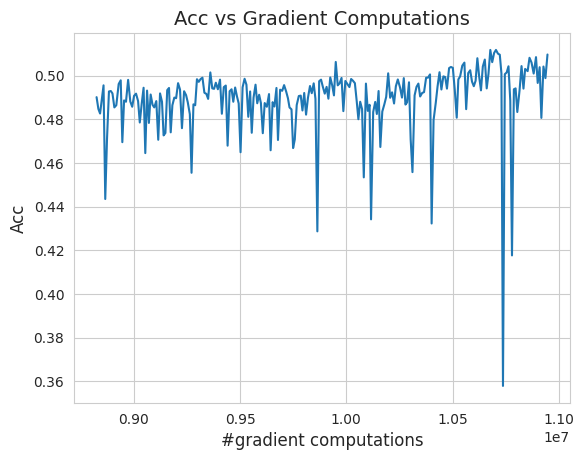

Training: 100%|██████████| 195/195 [00:01<00:00, 128.61it/s, loss=0.7420]


Epoch 242: val_acc=0.5028045177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 130.50it/s, loss=1.0901]


Epoch 243: val_acc=0.5038061141967773


Training: 100%|██████████| 195/195 [00:01<00:00, 126.64it/s, loss=1.1686]


Epoch 244: val_acc=0.5074118375778198


Training: 100%|██████████| 195/195 [00:01<00:00, 132.83it/s, loss=1.1003]


Epoch 245: val_acc=0.5066105723381042


Training: 100%|██████████| 195/195 [00:01<00:00, 123.50it/s, loss=0.6056]


Epoch 246: val_acc=0.49769631028175354


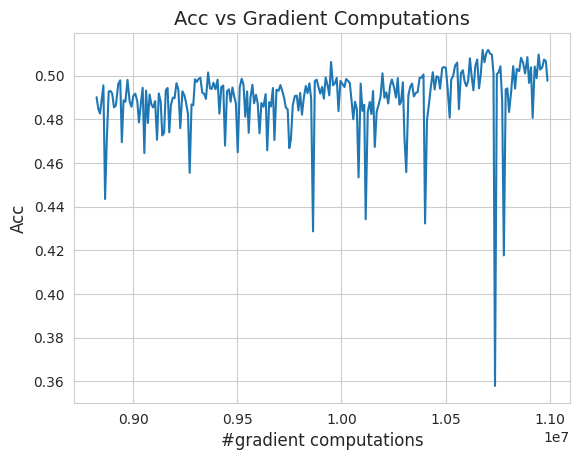

Training: 100%|██████████| 195/195 [00:01<00:00, 125.03it/s, loss=1.5147]


Epoch 247: val_acc=0.4341947138309479


Training: 100%|██████████| 195/195 [00:01<00:00, 129.29it/s, loss=1.1691]


Epoch 248: val_acc=0.5093148946762085


Training: 100%|██████████| 195/195 [00:01<00:00, 122.18it/s, loss=1.4906]


Epoch 249: val_acc=0.46534454822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 125.30it/s, loss=1.5083]


Epoch 250: val_acc=0.4806690812110901


Training: 100%|██████████| 195/195 [00:01<00:00, 128.70it/s, loss=1.3157]


Epoch 251: val_acc=0.4906851053237915


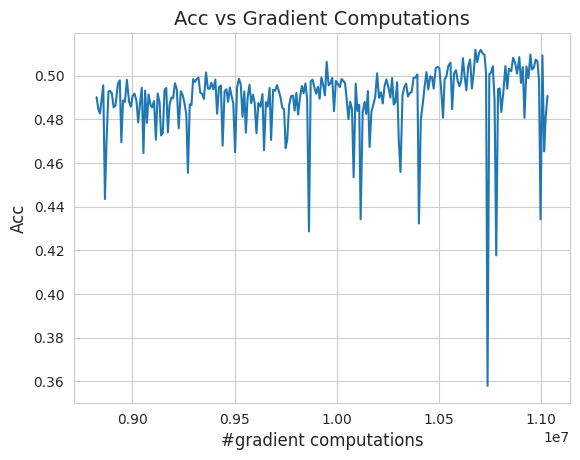

Training: 100%|██████████| 195/195 [00:01<00:00, 127.70it/s, loss=1.2145]


Epoch 252: val_acc=0.4980969727039337


Training: 100%|██████████| 195/195 [00:01<00:00, 121.81it/s, loss=1.0889]


Epoch 253: val_acc=0.49579328298568726


Training: 100%|██████████| 195/195 [00:01<00:00, 126.42it/s, loss=1.0799]


Epoch 254: val_acc=0.5043069124221802


Training: 100%|██████████| 195/195 [00:01<00:00, 127.11it/s, loss=1.6904]


Epoch 255: val_acc=0.48337340354919434


Training: 100%|██████████| 195/195 [00:01<00:00, 126.52it/s, loss=1.1905]


Epoch 256: val_acc=0.5036057829856873


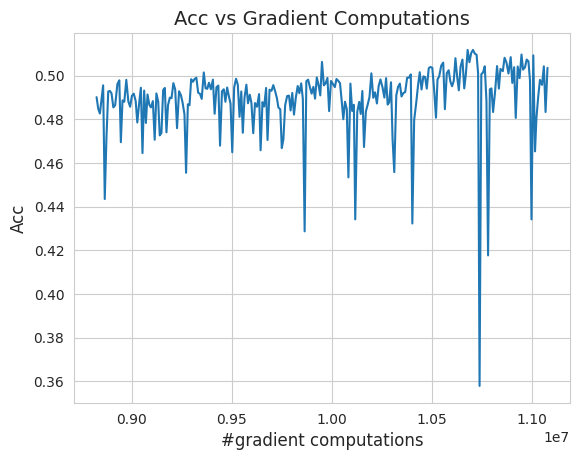

Training: 100%|██████████| 195/195 [00:01<00:00, 126.33it/s, loss=1.2372]


Epoch 257: val_acc=0.5044070482254028


Training: 100%|██████████| 195/195 [00:01<00:00, 122.66it/s, loss=1.2141]


Epoch 258: val_acc=0.48277243971824646


Training: 100%|██████████| 195/195 [00:01<00:00, 120.68it/s, loss=0.8080]


Epoch 259: val_acc=0.5078125


Training: 100%|██████████| 195/195 [00:01<00:00, 122.25it/s, loss=1.1771]


Epoch 260: val_acc=0.5082131624221802


Training: 100%|██████████| 195/195 [00:01<00:00, 121.28it/s, loss=1.2247]


Epoch 261: val_acc=0.5064102411270142


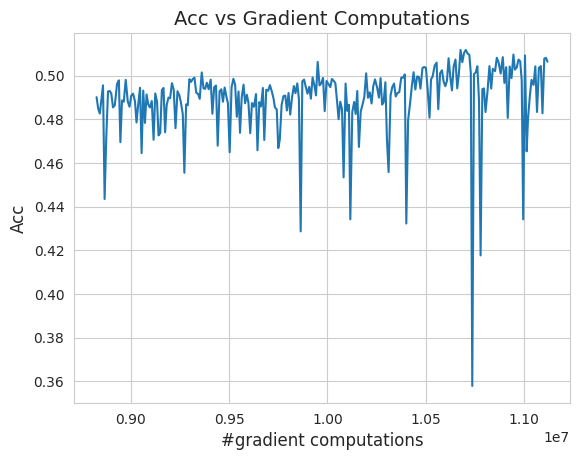

Training: 100%|██████████| 195/195 [00:01<00:00, 118.68it/s, loss=1.3717]


Epoch 262: val_acc=0.50390625


Training: 100%|██████████| 195/195 [00:01<00:00, 129.67it/s, loss=0.8323]


Epoch 263: val_acc=0.5077123641967773


Training: 100%|██████████| 195/195 [00:01<00:00, 114.00it/s, loss=0.9869]


Epoch 264: val_acc=0.5075120329856873


Training: 100%|██████████| 195/195 [00:01<00:00, 125.22it/s, loss=1.0728]


Epoch 265: val_acc=0.5017027258872986


Training: 100%|██████████| 195/195 [00:01<00:00, 124.19it/s, loss=1.1819]


Epoch 266: val_acc=0.5058093070983887


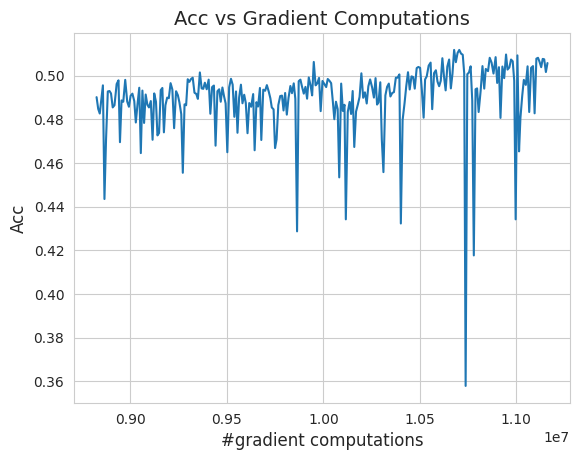

Training: 100%|██████████| 195/195 [00:01<00:00, 120.75it/s, loss=1.2491]


Epoch 267: val_acc=0.46824920177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 118.35it/s, loss=1.1926]


Epoch 268: val_acc=0.5058093070983887


Training: 100%|██████████| 195/195 [00:01<00:00, 120.37it/s, loss=0.7566]


Epoch 269: val_acc=0.5106170177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 125.82it/s, loss=0.9858]


Epoch 270: val_acc=0.5025039911270142


Training: 100%|██████████| 195/195 [00:01<00:00, 129.03it/s, loss=0.9775]


Epoch 271: val_acc=0.5146234035491943


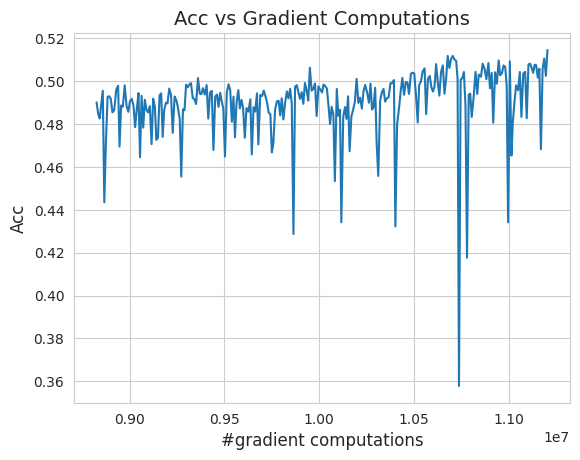

Training: 100%|██████████| 195/195 [00:01<00:00, 135.34it/s, loss=1.6546]


Epoch 272: val_acc=0.4655448794364929


Training: 100%|██████████| 195/195 [00:01<00:00, 124.10it/s, loss=1.9609]


Epoch 273: val_acc=0.5079126954078674


Training: 100%|██████████| 195/195 [00:01<00:00, 133.35it/s, loss=1.1707]


Epoch 274: val_acc=0.48878204822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 121.65it/s, loss=1.0044]


Epoch 275: val_acc=0.5032051205635071


Training: 100%|██████████| 195/195 [00:01<00:00, 128.68it/s, loss=0.9006]


Epoch 276: val_acc=0.5046073794364929


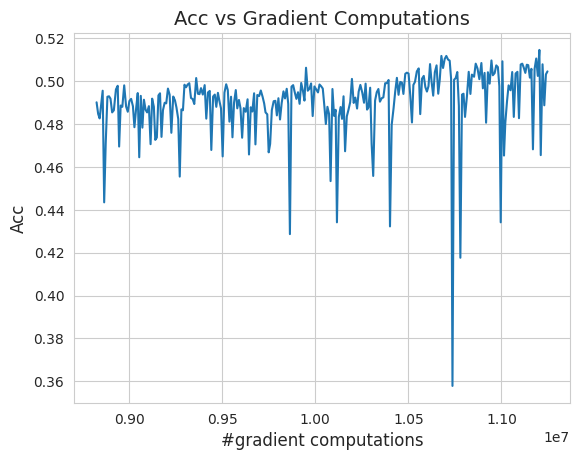

Training: 100%|██████████| 195/195 [00:01<00:00, 110.15it/s, loss=0.9047]


Epoch 277: val_acc=0.5056089758872986


Training: 100%|██████████| 195/195 [00:01<00:00, 118.61it/s, loss=0.8395]


Epoch 278: val_acc=0.5095152258872986


Training: 100%|██████████| 195/195 [00:01<00:00, 124.21it/s, loss=1.2471]


Epoch 279: val_acc=0.4668469727039337


Training: 100%|██████████| 195/195 [00:01<00:00, 129.75it/s, loss=1.0379]


Epoch 280: val_acc=0.5055088400840759


Training: 100%|██████████| 195/195 [00:01<00:00, 126.01it/s, loss=1.1250]


Epoch 281: val_acc=0.5074118375778198


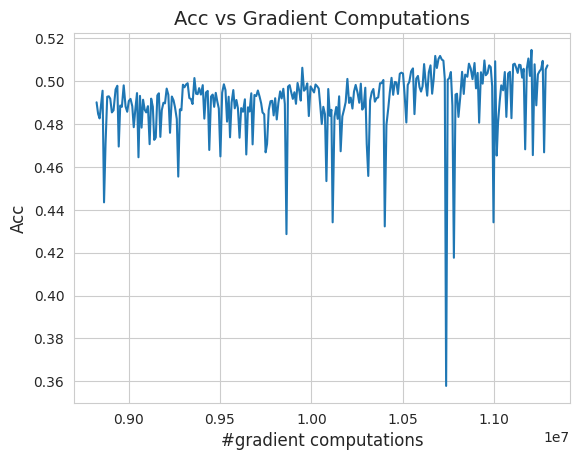

Training: 100%|██████████| 195/195 [00:01<00:00, 122.35it/s, loss=1.3308]


Epoch 282: val_acc=0.5012019276618958


Training: 100%|██████████| 195/195 [00:01<00:00, 122.28it/s, loss=1.2983]


Epoch 283: val_acc=0.5084134936332703


Training: 100%|██████████| 195/195 [00:01<00:00, 127.16it/s, loss=1.1055]


Epoch 284: val_acc=0.5031049847602844


Training: 100%|██████████| 195/195 [00:01<00:00, 137.08it/s, loss=1.0558]


Epoch 285: val_acc=0.5071113705635071


Training: 100%|██████████| 195/195 [00:01<00:00, 126.42it/s, loss=1.3905]


Epoch 286: val_acc=0.5056089758872986


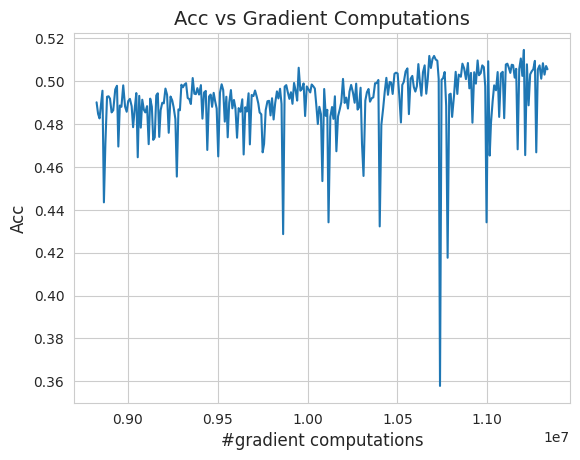

Training: 100%|██████████| 195/195 [00:01<00:00, 128.22it/s, loss=0.9860]


Epoch 287: val_acc=0.5133213400840759


Training: 100%|██████████| 195/195 [00:01<00:00, 117.97it/s, loss=1.1261]


Epoch 288: val_acc=0.5110176205635071


Training: 100%|██████████| 195/195 [00:01<00:00, 130.43it/s, loss=0.8696]


Epoch 289: val_acc=0.5136218070983887


Training: 100%|██████████| 195/195 [00:01<00:00, 128.67it/s, loss=0.5647]


Epoch 290: val_acc=0.5159254670143127


Training: 100%|██████████| 195/195 [00:01<00:00, 123.67it/s, loss=1.1420]


Epoch 291: val_acc=0.4934895932674408


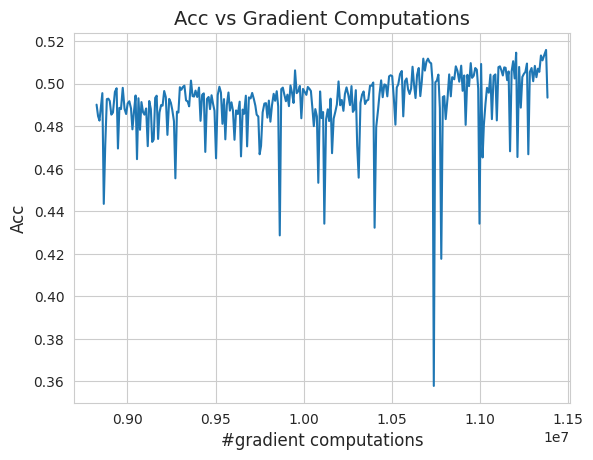

Training: 100%|██████████| 195/195 [00:01<00:00, 129.11it/s, loss=0.8617]


Epoch 292: val_acc=0.5043069124221802


Training: 100%|██████████| 195/195 [00:01<00:00, 128.08it/s, loss=1.3205]


Epoch 293: val_acc=0.5045072436332703


Training: 100%|██████████| 195/195 [00:01<00:00, 123.84it/s, loss=1.2187]


Epoch 294: val_acc=0.5116186141967773


Training: 100%|██████████| 195/195 [00:01<00:00, 121.84it/s, loss=1.1405]


Epoch 295: val_acc=0.5136218070983887


Training: 100%|██████████| 195/195 [00:01<00:00, 126.47it/s, loss=1.2407]


Epoch 296: val_acc=0.5125200152397156


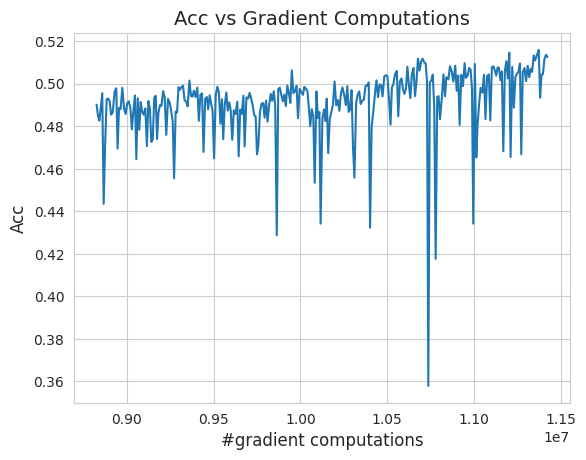

Training: 100%|██████████| 195/195 [00:01<00:00, 126.29it/s, loss=1.1500]


Epoch 297: val_acc=0.5060096383094788


Training: 100%|██████████| 195/195 [00:01<00:00, 126.87it/s, loss=0.9495]


Epoch 298: val_acc=0.5143229365348816


Training: 100%|██████████| 195/195 [00:01<00:00, 121.68it/s, loss=1.2996]


Epoch 299: val_acc=0.5116186141967773


Training: 100%|██████████| 195/195 [00:01<00:00, 127.67it/s, loss=1.4611]


Epoch 300: val_acc=0.4899839758872986


Training: 100%|██████████| 195/195 [00:01<00:00, 125.84it/s, loss=1.3969]


Epoch 301: val_acc=0.5109174847602844


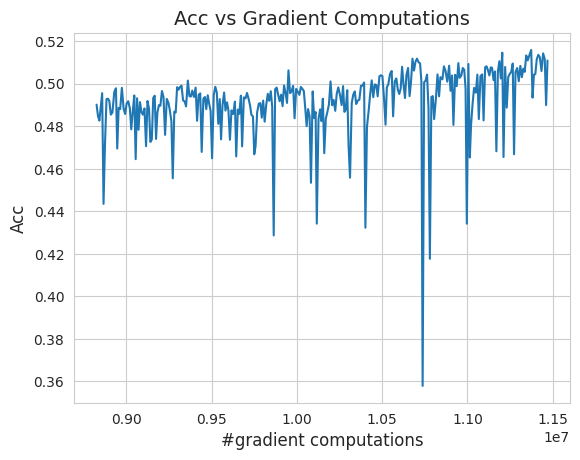

Training: 100%|██████████| 195/195 [00:01<00:00, 131.38it/s, loss=0.9904]


Epoch 302: val_acc=0.5161257982254028


Training: 100%|██████████| 195/195 [00:01<00:00, 120.46it/s, loss=0.8003]


Epoch 303: val_acc=0.5106170177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 133.71it/s, loss=0.9801]


Epoch 304: val_acc=0.5153245329856873


Training: 100%|██████████| 195/195 [00:01<00:00, 127.24it/s, loss=1.6384]


Epoch 305: val_acc=0.5177283883094788


Training: 100%|██████████| 195/195 [00:01<00:00, 124.92it/s, loss=1.3003]


Epoch 306: val_acc=0.5102163553237915


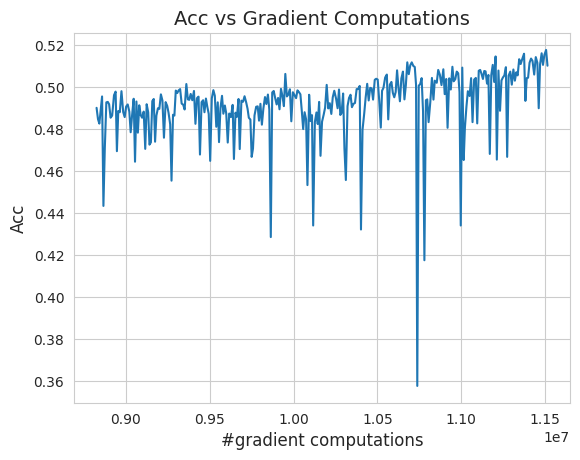

Training: 100%|██████████| 195/195 [00:01<00:00, 124.73it/s, loss=0.7614]


Epoch 307: val_acc=0.5111178159713745


Training: 100%|██████████| 195/195 [00:01<00:00, 134.60it/s, loss=1.1953]


Epoch 308: val_acc=0.5029046535491943


Training: 100%|██████████| 195/195 [00:01<00:00, 117.25it/s, loss=1.1561]


Epoch 309: val_acc=0.5158253312110901


Training: 100%|██████████| 195/195 [00:01<00:00, 119.59it/s, loss=0.8843]


Epoch 310: val_acc=0.5174278616905212


Training: 100%|██████████| 195/195 [00:01<00:00, 120.67it/s, loss=1.3023]


Epoch 311: val_acc=0.5144230723381042


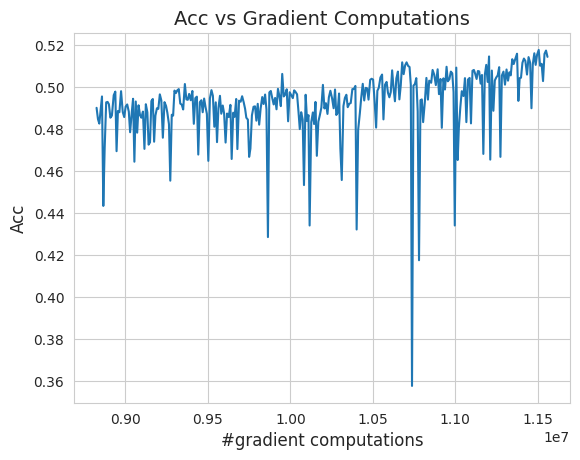

Training: 100%|██████████| 195/195 [00:01<00:00, 127.76it/s, loss=1.2258]


Epoch 312: val_acc=0.516526460647583


Training: 100%|██████████| 195/195 [00:01<00:00, 125.36it/s, loss=1.1413]


Epoch 313: val_acc=0.5077123641967773


Training: 100%|██████████| 195/195 [00:01<00:00, 123.24it/s, loss=1.3502]


Epoch 314: val_acc=0.46995192766189575


Training: 100%|██████████| 195/195 [00:01<00:00, 130.23it/s, loss=1.0870]


Epoch 315: val_acc=0.4943910241127014


Training: 100%|██████████| 195/195 [00:01<00:00, 125.88it/s, loss=1.1946]


Epoch 316: val_acc=0.5142227411270142


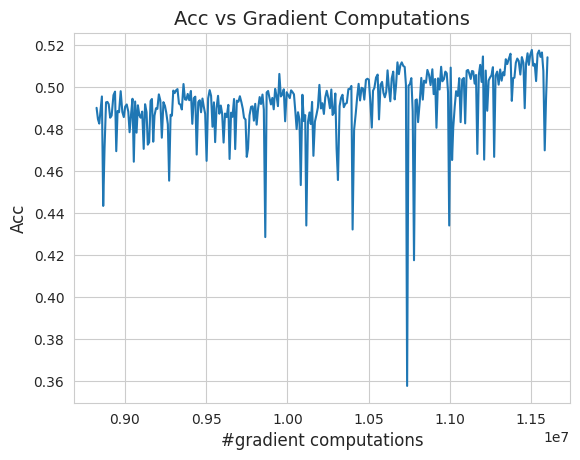

Training: 100%|██████████| 195/195 [00:01<00:00, 136.59it/s, loss=0.7827]


Epoch 317: val_acc=0.5076121687889099


Training: 100%|██████████| 195/195 [00:01<00:00, 121.19it/s, loss=1.1595]


Epoch 318: val_acc=0.4982972741127014


Training: 100%|██████████| 195/195 [00:01<00:00, 121.10it/s, loss=0.7749]


Epoch 319: val_acc=0.5191305875778198


Training: 100%|██████████| 195/195 [00:01<00:00, 124.12it/s, loss=1.3930]


Epoch 320: val_acc=0.5129206776618958


Training: 100%|██████████| 195/195 [00:01<00:00, 124.17it/s, loss=0.8112]


Epoch 321: val_acc=0.5169270634651184


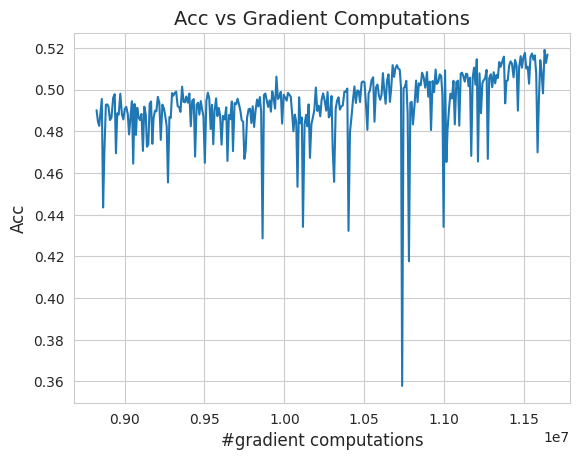

Training: 100%|██████████| 195/195 [00:01<00:00, 129.68it/s, loss=1.0298]


Epoch 322: val_acc=0.5134214758872986


Training: 100%|██████████| 195/195 [00:01<00:00, 118.26it/s, loss=1.2132]


Epoch 323: val_acc=0.5179287195205688


Training: 100%|██████████| 195/195 [00:01<00:00, 125.10it/s, loss=0.5694]


Epoch 324: val_acc=0.5236378312110901


Training: 100%|██████████| 195/195 [00:01<00:00, 129.26it/s, loss=1.5092]


Epoch 325: val_acc=0.5128205418586731


Training: 100%|██████████| 195/195 [00:01<00:00, 123.92it/s, loss=0.6639]


Epoch 326: val_acc=0.5201322436332703


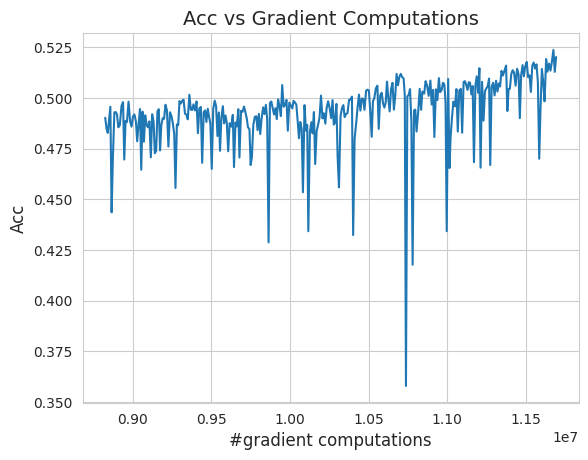

Training: 100%|██████████| 195/195 [00:01<00:00, 124.47it/s, loss=0.8455]


Epoch 327: val_acc=0.5143229365348816


Training: 100%|██████████| 195/195 [00:01<00:00, 136.36it/s, loss=1.0448]


Epoch 328: val_acc=0.5177283883094788


Training: 100%|██████████| 195/195 [00:01<00:00, 127.90it/s, loss=1.3106]


Epoch 329: val_acc=0.5229367017745972


Training: 100%|██████████| 195/195 [00:01<00:00, 131.31it/s, loss=1.1844]


Epoch 330: val_acc=0.5135216116905212


Training: 100%|██████████| 195/195 [00:01<00:00, 116.98it/s, loss=0.9990]


Epoch 331: val_acc=0.5183293223381042


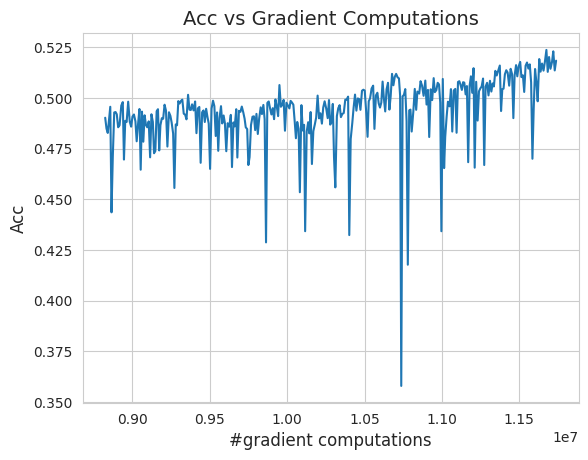

Training: 100%|██████████| 195/195 [00:01<00:00, 123.87it/s, loss=1.3137]


Epoch 332: val_acc=0.5062099695205688


Training: 100%|██████████| 195/195 [00:01<00:00, 132.83it/s, loss=0.8889]


Epoch 333: val_acc=0.5091145634651184


Training: 100%|██████████| 195/195 [00:01<00:00, 124.75it/s, loss=1.2656]


Epoch 334: val_acc=0.4886818826198578


Training: 100%|██████████| 195/195 [00:01<00:00, 127.48it/s, loss=1.0253]


Epoch 335: val_acc=0.5201322436332703


Training: 100%|██████████| 195/195 [00:01<00:00, 125.47it/s, loss=0.9069]


Epoch 336: val_acc=0.5210336446762085


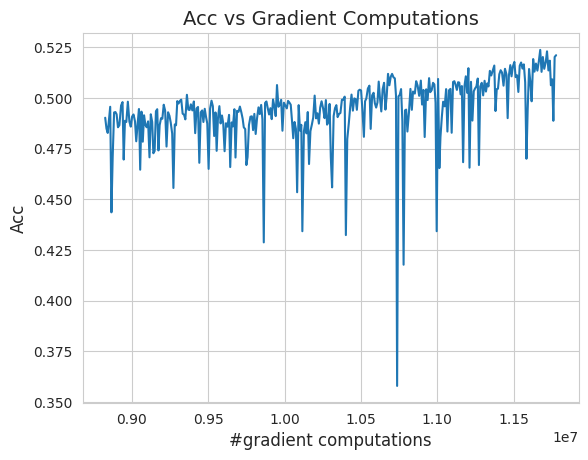

Training: 100%|██████████| 195/195 [00:01<00:00, 132.84it/s, loss=1.0278]


Epoch 337: val_acc=0.49659454822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 122.43it/s, loss=0.9665]


Epoch 338: val_acc=0.5118189454078674


Training: 100%|██████████| 195/195 [00:01<00:00, 126.50it/s, loss=0.6663]


Epoch 339: val_acc=0.5015023946762085


Training: 100%|██████████| 195/195 [00:01<00:00, 123.47it/s, loss=1.1727]


Epoch 340: val_acc=0.5121194124221802


Training: 100%|██████████| 195/195 [00:01<00:00, 124.07it/s, loss=0.9273]


Epoch 341: val_acc=0.4951923191547394


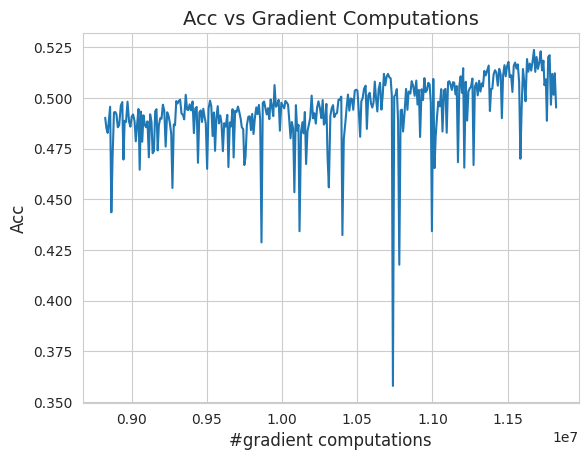

Training: 100%|██████████| 195/195 [00:01<00:00, 123.85it/s, loss=1.2270]


Epoch 342: val_acc=0.5178285241127014


Training: 100%|██████████| 195/195 [00:01<00:00, 116.18it/s, loss=1.0967]


Epoch 343: val_acc=0.5157251954078674


Training: 100%|██████████| 195/195 [00:01<00:00, 124.38it/s, loss=1.0123]


Epoch 344: val_acc=0.5104166865348816


Training: 100%|██████████| 195/195 [00:01<00:00, 134.89it/s, loss=1.0751]


Epoch 345: val_acc=0.5157251954078674


Training: 100%|██████████| 195/195 [00:01<00:00, 128.55it/s, loss=1.5310]


Epoch 346: val_acc=0.5111178159713745


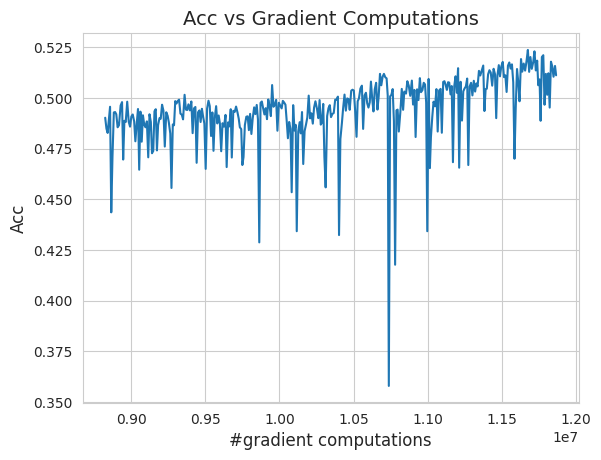

Training: 100%|██████████| 195/195 [00:01<00:00, 125.74it/s, loss=1.1806]


Epoch 347: val_acc=0.5133213400840759


Training: 100%|██████████| 195/195 [00:01<00:00, 121.75it/s, loss=1.0716]


Epoch 348: val_acc=0.5210336446762085


Training: 100%|██████████| 195/195 [00:01<00:00, 128.71it/s, loss=1.1513]


Epoch 349: val_acc=0.5162259936332703


Training: 100%|██████████| 195/195 [00:01<00:00, 136.58it/s, loss=1.0470]


Epoch 350: val_acc=0.5202323794364929


Training: 100%|██████████| 195/195 [00:01<00:00, 124.88it/s, loss=1.0604]


Epoch 351: val_acc=0.516526460647583


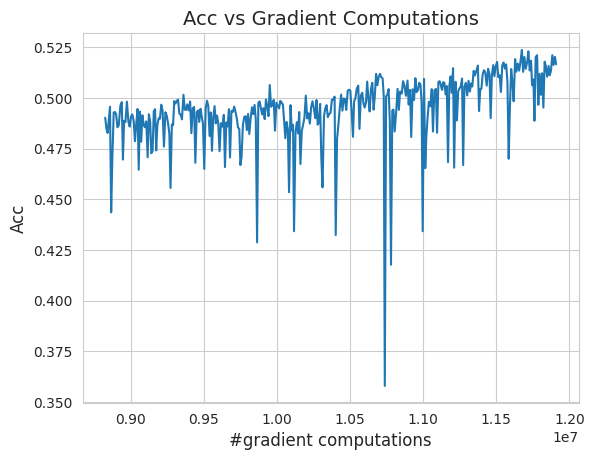

Training: 100%|██████████| 195/195 [00:01<00:00, 124.75it/s, loss=0.7999]


Epoch 352: val_acc=0.5145232677459717


Training: 100%|██████████| 195/195 [00:01<00:00, 119.33it/s, loss=0.9087]


Epoch 353: val_acc=0.5203325152397156


Training: 100%|██████████| 195/195 [00:01<00:00, 126.18it/s, loss=0.4910]


Epoch 354: val_acc=0.5184295177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 122.58it/s, loss=0.9040]


Epoch 355: val_acc=0.5211338400840759


Training: 100%|██████████| 195/195 [00:01<00:00, 125.99it/s, loss=1.1107]


Epoch 356: val_acc=0.5169270634651184


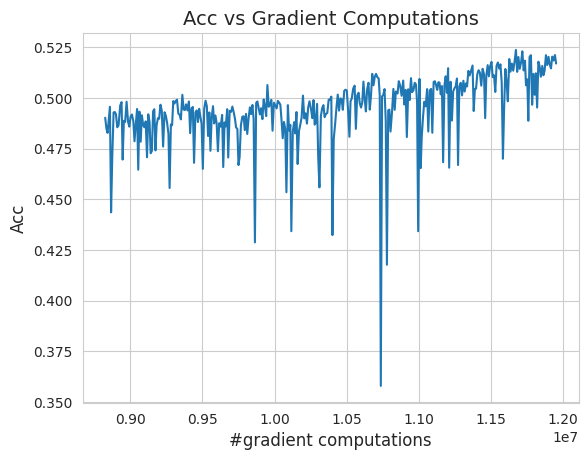

Training: 100%|██████████| 195/195 [00:01<00:00, 126.40it/s, loss=0.4624]


Epoch 357: val_acc=0.5200320482254028


Training: 100%|██████████| 195/195 [00:01<00:00, 124.66it/s, loss=1.0473]


Epoch 358: val_acc=0.5190304517745972


Training: 100%|██████████| 195/195 [00:01<00:00, 126.67it/s, loss=0.9138]


Epoch 359: val_acc=0.5191305875778198


Training: 100%|██████████| 195/195 [00:01<00:00, 124.32it/s, loss=1.0287]


Epoch 360: val_acc=0.5193309187889099


Training: 100%|██████████| 195/195 [00:01<00:00, 131.76it/s, loss=1.0453]


Epoch 361: val_acc=0.5124198794364929


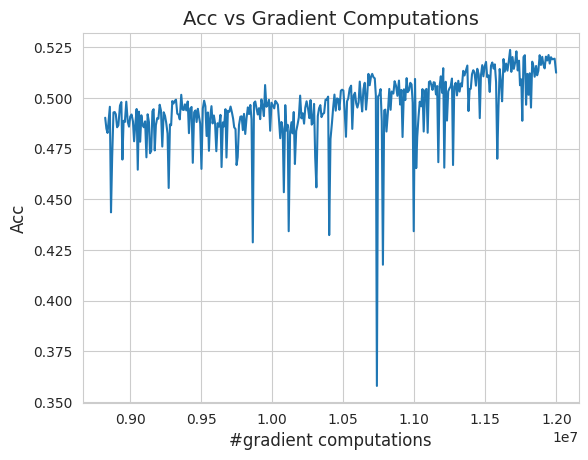

Training: 100%|██████████| 195/195 [00:01<00:00, 125.68it/s, loss=1.0014]


Epoch 362: val_acc=0.5179287195205688


Training: 100%|██████████| 195/195 [00:01<00:00, 124.45it/s, loss=0.6682]


Epoch 363: val_acc=0.5244390964508057


Training: 100%|██████████| 195/195 [00:01<00:00, 125.36it/s, loss=1.0607]


Epoch 364: val_acc=0.5124198794364929


Training: 100%|██████████| 195/195 [00:01<00:00, 123.48it/s, loss=1.2347]


Epoch 365: val_acc=0.5172275900840759


Training: 100%|██████████| 195/195 [00:01<00:00, 130.34it/s, loss=1.3754]


Epoch 366: val_acc=0.5106170177459717


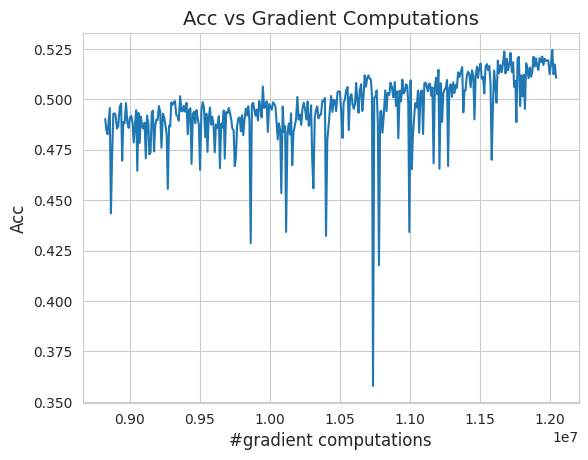

Training: 100%|██████████| 195/195 [00:01<00:00, 125.61it/s, loss=0.9575]


Epoch 367: val_acc=0.5182291865348816


Training: 100%|██████████| 195/195 [00:01<00:00, 130.62it/s, loss=1.1293]


Epoch 368: val_acc=0.5169270634651184


Training: 100%|██████████| 195/195 [00:01<00:00, 131.56it/s, loss=0.9050]


Epoch 369: val_acc=0.508713960647583


Training: 100%|██████████| 195/195 [00:01<00:00, 132.06it/s, loss=1.3374]


Epoch 370: val_acc=0.49839743971824646


Training: 100%|██████████| 195/195 [00:01<00:00, 128.42it/s, loss=1.3736]


Epoch 371: val_acc=0.5049078464508057


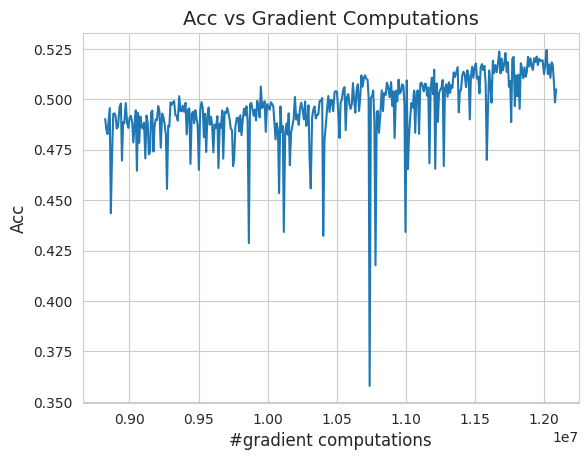

Training: 100%|██████████| 195/195 [00:01<00:00, 133.22it/s, loss=1.5688]


Epoch 372: val_acc=0.5153245329856873


Training: 100%|██████████| 195/195 [00:01<00:00, 126.55it/s, loss=1.0422]


Epoch 373: val_acc=0.5157251954078674


Training: 100%|██████████| 195/195 [00:01<00:00, 124.67it/s, loss=1.1889]


Epoch 374: val_acc=0.5178285241127014


Training: 100%|██████████| 195/195 [00:01<00:00, 124.51it/s, loss=0.9319]


Epoch 375: val_acc=0.5050080418586731


Training: 100%|██████████| 195/195 [00:01<00:00, 122.14it/s, loss=0.8917]


Epoch 376: val_acc=0.5133213400840759


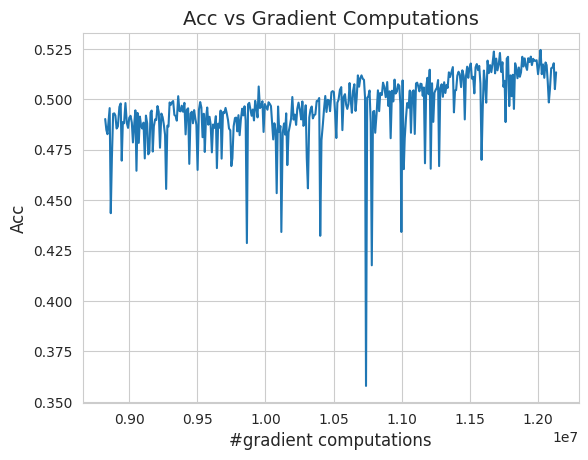

Training: 100%|██████████| 195/195 [00:01<00:00, 138.32it/s, loss=0.9044]


Epoch 377: val_acc=0.5093148946762085


Training: 100%|██████████| 195/195 [00:01<00:00, 119.93it/s, loss=1.1635]


Epoch 378: val_acc=0.510817289352417


Training: 100%|██████████| 195/195 [00:01<00:00, 136.98it/s, loss=1.1925]


Epoch 379: val_acc=0.5170272588729858


Training: 100%|██████████| 195/195 [00:01<00:00, 129.92it/s, loss=1.4337]


Epoch 380: val_acc=0.5206330418586731


Training: 100%|██████████| 195/195 [00:01<00:00, 128.20it/s, loss=1.1688]


Epoch 381: val_acc=0.5155248641967773


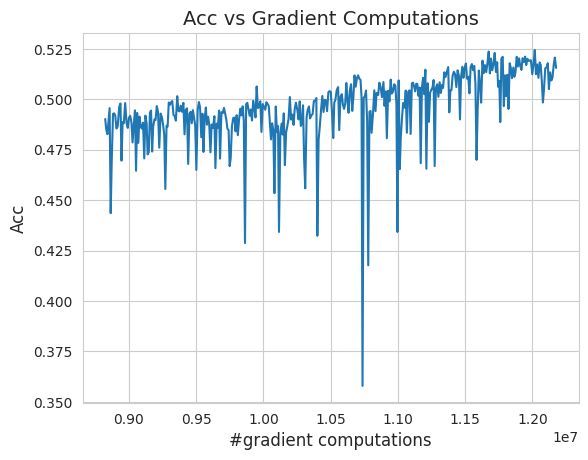

Training: 100%|██████████| 195/195 [00:01<00:00, 139.45it/s, loss=1.0858]


Epoch 382: val_acc=0.5079126954078674


Training: 100%|██████████| 195/195 [00:01<00:00, 140.67it/s, loss=1.5936]


Epoch 383: val_acc=0.5135216116905212


Training: 100%|██████████| 195/195 [00:01<00:00, 123.13it/s, loss=0.8124]


Epoch 384: val_acc=0.5221354365348816


Training: 100%|██████████| 195/195 [00:01<00:00, 122.73it/s, loss=1.3254]


Epoch 385: val_acc=0.5166265964508057


Training: 100%|██████████| 195/195 [00:01<00:00, 138.48it/s, loss=1.1377]


Epoch 386: val_acc=0.5123197436332703


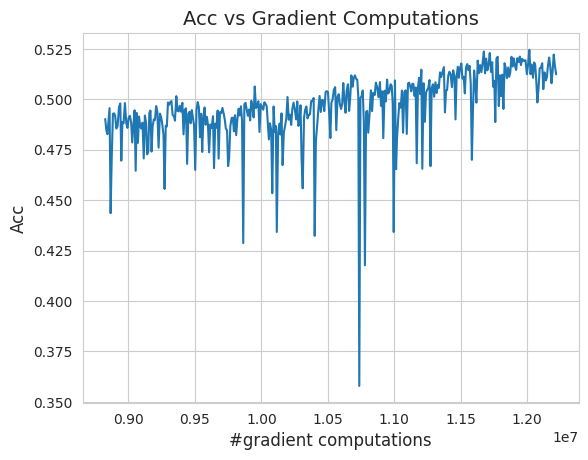

Training: 100%|██████████| 195/195 [00:01<00:00, 130.18it/s, loss=1.2067]


Epoch 387: val_acc=0.5132211446762085


Training: 100%|██████████| 195/195 [00:01<00:00, 132.68it/s, loss=1.6417]


Epoch 388: val_acc=0.5084134936332703


Training: 100%|██████████| 195/195 [00:01<00:00, 124.28it/s, loss=1.3170]


Epoch 389: val_acc=0.5173277258872986


Training: 100%|██████████| 195/195 [00:01<00:00, 123.75it/s, loss=0.9300]


Epoch 390: val_acc=0.5183293223381042


Training: 100%|██████████| 195/195 [00:01<00:00, 124.75it/s, loss=1.4906]


Epoch 391: val_acc=0.5145232677459717


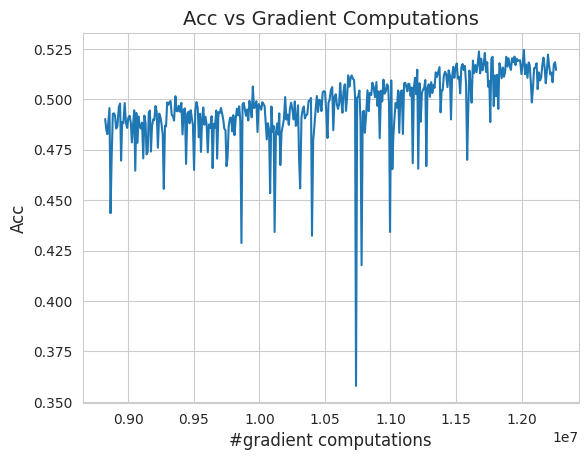

Training: 100%|██████████| 195/195 [00:01<00:00, 126.69it/s, loss=1.2042]


Epoch 392: val_acc=0.5191305875778198


Training: 100%|██████████| 195/195 [00:01<00:00, 132.23it/s, loss=1.0489]


Epoch 393: val_acc=0.5160256624221802


Training: 100%|██████████| 195/195 [00:01<00:00, 123.61it/s, loss=1.0368]


Epoch 394: val_acc=0.5208333134651184


Training: 100%|██████████| 195/195 [00:01<00:00, 121.89it/s, loss=0.8732]


Epoch 395: val_acc=0.5203325152397156


Training: 100%|██████████| 195/195 [00:01<00:00, 122.91it/s, loss=1.0185]


Epoch 396: val_acc=0.5217347741127014


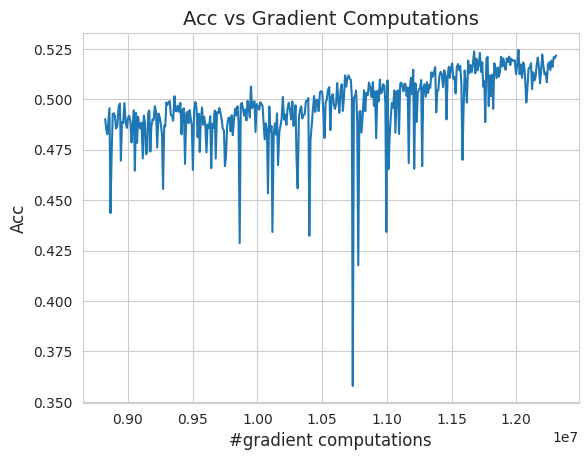

Training: 100%|██████████| 195/195 [00:01<00:00, 114.31it/s, loss=1.0738]


Epoch 397: val_acc=0.5113180875778198


Training: 100%|██████████| 195/195 [00:01<00:00, 115.79it/s, loss=0.9705]


Epoch 398: val_acc=0.5176281929016113


Training: 100%|██████████| 195/195 [00:01<00:00, 121.64it/s, loss=1.2514]


Epoch 399: val_acc=0.5221354365348816


Training: 100%|██████████| 195/195 [00:01<00:00, 118.85it/s, loss=1.2813]


Epoch 400: val_acc=0.5179287195205688


Training: 100%|██████████| 195/195 [00:01<00:00, 127.14it/s, loss=1.1411]


Epoch 401: val_acc=0.5164262652397156


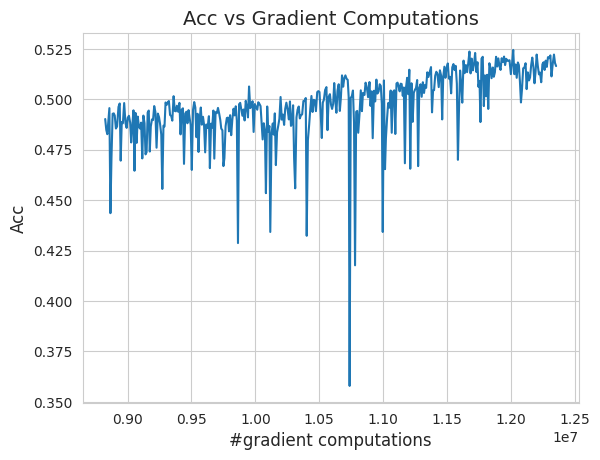

Training: 100%|██████████| 195/195 [00:01<00:00, 121.43it/s, loss=0.6028]


Epoch 402: val_acc=0.5210336446762085


Training: 100%|██████████| 195/195 [00:01<00:00, 118.87it/s, loss=0.6582]


Epoch 403: val_acc=0.5149238705635071


Training: 100%|██████████| 195/195 [00:01<00:00, 137.94it/s, loss=0.8732]


Epoch 404: val_acc=0.5084134936332703


Training: 100%|██████████| 195/195 [00:01<00:00, 129.26it/s, loss=1.0869]


Epoch 405: val_acc=0.5012019276618958


Training: 100%|██████████| 195/195 [00:01<00:00, 126.54it/s, loss=0.9827]


Epoch 406: val_acc=0.5059094429016113


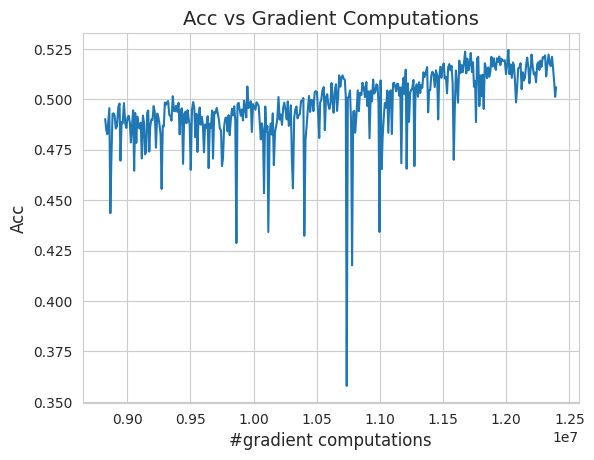

Training: 100%|██████████| 195/195 [00:01<00:00, 123.50it/s, loss=1.0694]


Epoch 407: val_acc=0.5142227411270142


Training: 100%|██████████| 195/195 [00:01<00:00, 124.31it/s, loss=1.0923]


Epoch 408: val_acc=0.5024038553237915


Training: 100%|██████████| 195/195 [00:01<00:00, 127.18it/s, loss=0.9952]


Epoch 409: val_acc=0.5049078464508057


Training: 100%|██████████| 195/195 [00:01<00:00, 125.84it/s, loss=1.8066]


Epoch 410: val_acc=0.3937299847602844


Training: 100%|██████████| 195/195 [00:01<00:00, 128.03it/s, loss=1.1381]


Epoch 411: val_acc=0.5189303159713745


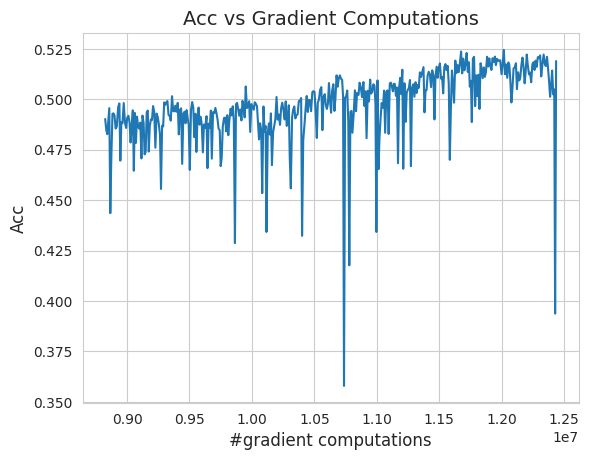

Training: 100%|██████████| 195/195 [00:01<00:00, 130.79it/s, loss=1.5136]


Epoch 412: val_acc=0.5122195482254028


Training: 100%|██████████| 195/195 [00:01<00:00, 127.61it/s, loss=1.4450]


Epoch 413: val_acc=0.522536039352417


Training: 100%|██████████| 195/195 [00:01<00:00, 119.57it/s, loss=1.1782]


Epoch 414: val_acc=0.5211338400840759


Training: 100%|██████████| 195/195 [00:01<00:00, 112.52it/s, loss=1.4199]


Epoch 415: val_acc=0.5077123641967773


Training: 100%|██████████| 195/195 [00:01<00:00, 116.83it/s, loss=1.3372]


Epoch 416: val_acc=0.5168269276618958


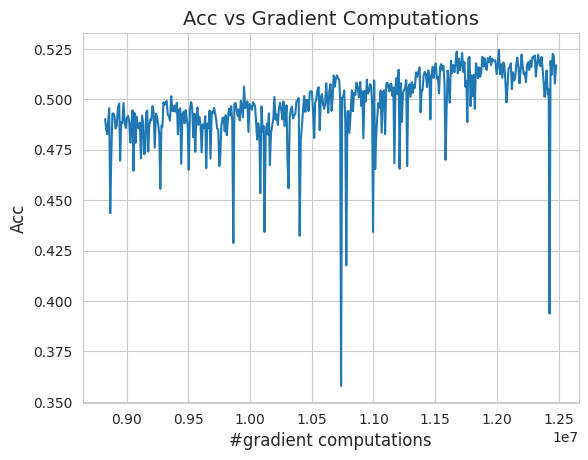

Training: 100%|██████████| 195/195 [00:01<00:00, 125.18it/s, loss=0.8622]


Epoch 417: val_acc=0.5212339758872986


Training: 100%|██████████| 195/195 [00:01<00:00, 127.10it/s, loss=1.2667]


Epoch 418: val_acc=0.5259414911270142


Training: 100%|██████████| 195/195 [00:01<00:00, 134.27it/s, loss=1.1715]


Epoch 419: val_acc=0.5227363705635071


Training: 100%|██████████| 195/195 [00:01<00:00, 128.27it/s, loss=1.1488]


Epoch 420: val_acc=0.512620210647583


Training: 100%|██████████| 195/195 [00:01<00:00, 133.58it/s, loss=1.1299]


Epoch 421: val_acc=0.5045072436332703


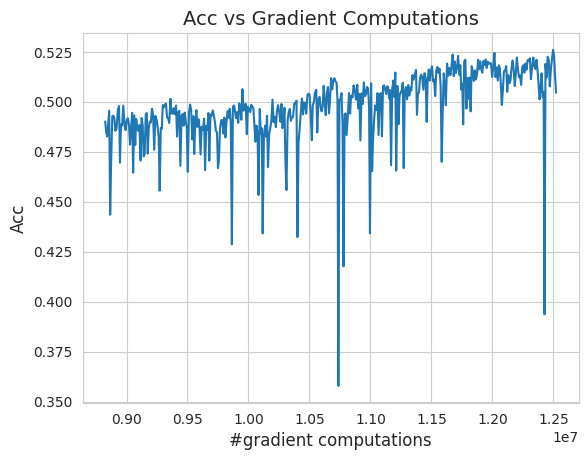

Training: 100%|██████████| 195/195 [00:01<00:00, 122.97it/s, loss=1.4728]


Epoch 422: val_acc=0.5158253312110901


Training: 100%|██████████| 195/195 [00:01<00:00, 124.18it/s, loss=1.0922]


Epoch 423: val_acc=0.518629789352417


Training: 100%|██████████| 195/195 [00:01<00:00, 129.89it/s, loss=0.7154]


Epoch 424: val_acc=0.5163261294364929


Training: 100%|██████████| 195/195 [00:01<00:00, 124.18it/s, loss=1.4501]


Epoch 425: val_acc=0.47686299681663513


Training: 100%|██████████| 195/195 [00:01<00:00, 128.76it/s, loss=1.2658]


Epoch 426: val_acc=0.5035055875778198


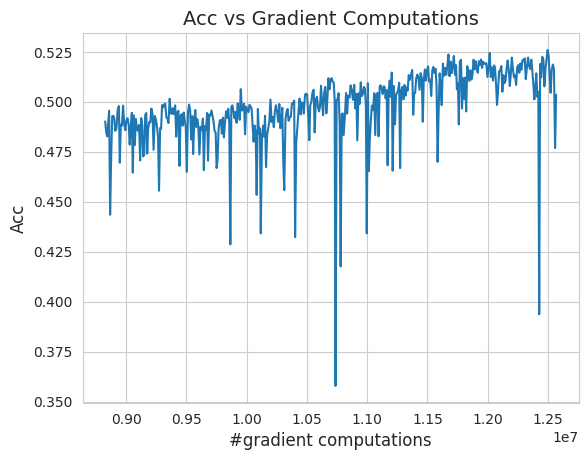

Training: 100%|██████████| 195/195 [00:01<00:00, 125.67it/s, loss=1.2830]


Epoch 427: val_acc=0.4949919879436493


Training: 100%|██████████| 195/195 [00:01<00:00, 140.46it/s, loss=1.0865]


Epoch 428: val_acc=0.4980969727039337


Training: 100%|██████████| 195/195 [00:01<00:00, 129.22it/s, loss=0.9649]


Epoch 429: val_acc=0.48778045177459717


Training: 100%|██████████| 195/195 [00:01<00:00, 136.46it/s, loss=1.7316]


Epoch 430: val_acc=0.4982972741127014


Training: 100%|██████████| 195/195 [00:01<00:00, 129.72it/s, loss=1.5040]


Epoch 431: val_acc=0.4988982379436493


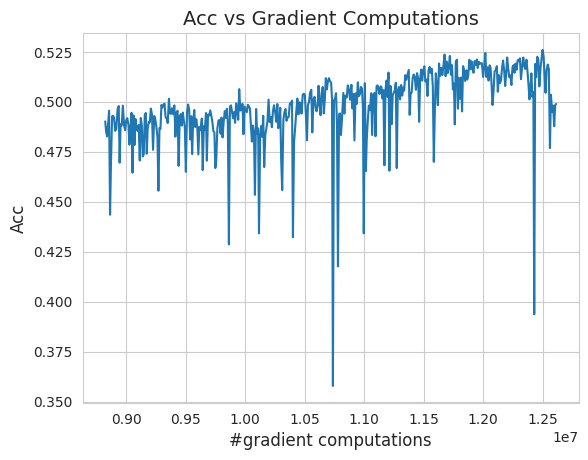

Training: 100%|██████████| 195/195 [00:01<00:00, 126.69it/s, loss=0.8468]


Epoch 432: val_acc=0.4990985691547394


Training: 100%|██████████| 195/195 [00:01<00:00, 130.98it/s, loss=1.5335]


Epoch 433: val_acc=0.5010015964508057


Training: 100%|██████████| 195/195 [00:01<00:00, 125.53it/s, loss=1.0215]


Epoch 434: val_acc=0.5092147588729858


Training: 100%|██████████| 195/195 [00:01<00:00, 126.35it/s, loss=1.2596]


Epoch 435: val_acc=0.5155248641967773


Training: 100%|██████████| 195/195 [00:01<00:00, 130.61it/s, loss=1.0616]


Epoch 436: val_acc=0.510817289352417


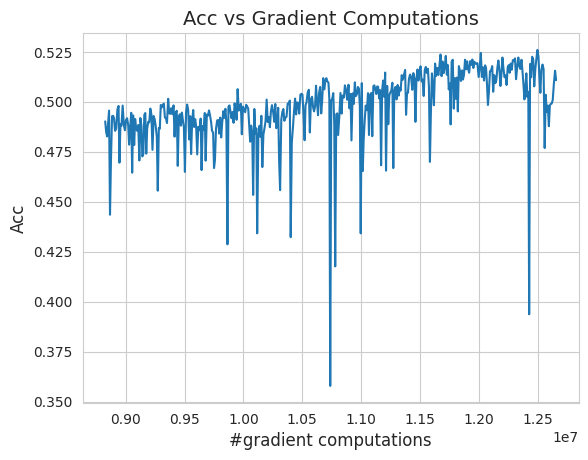

Training: 100%|██████████| 195/195 [00:01<00:00, 121.91it/s, loss=0.7083]


Epoch 437: val_acc=0.5136218070983887


Training: 100%|██████████| 195/195 [00:01<00:00, 130.96it/s, loss=1.7861]


Epoch 438: val_acc=0.39463141560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 127.23it/s, loss=1.0502]


Epoch 439: val_acc=0.5035055875778198


Training: 100%|██████████| 195/195 [00:01<00:00, 134.93it/s, loss=0.5180]


Epoch 440: val_acc=0.4603365361690521


Training: 100%|██████████| 195/195 [00:01<00:00, 122.51it/s, loss=1.1801]


Epoch 441: val_acc=0.4947916865348816


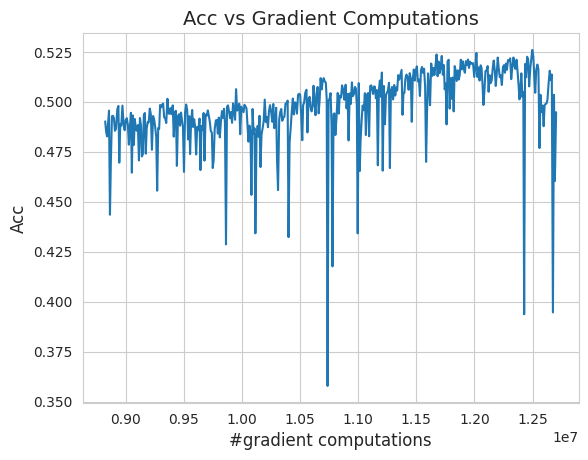

Training: 100%|██████████| 195/195 [00:01<00:00, 126.97it/s, loss=1.3305]


Epoch 442: val_acc=0.5036057829856873


Training: 100%|██████████| 195/195 [00:01<00:00, 128.20it/s, loss=0.7404]


Epoch 443: val_acc=0.4992988705635071


Training: 100%|██████████| 195/195 [00:01<00:00, 125.51it/s, loss=1.2320]


Epoch 444: val_acc=0.4880809485912323


Training: 100%|██████████| 195/195 [00:01<00:00, 135.64it/s, loss=1.0039]


Epoch 445: val_acc=0.5037059187889099


Training: 100%|██████████| 195/195 [00:01<00:00, 130.84it/s, loss=0.7056]


Epoch 446: val_acc=0.5061097741127014


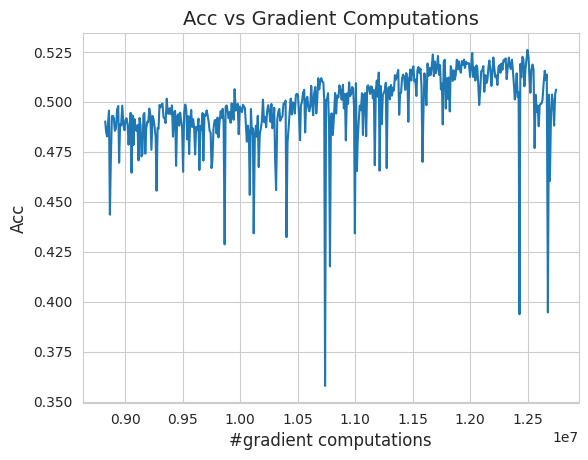

Training: 100%|██████████| 195/195 [00:01<00:00, 133.13it/s, loss=1.0826]


Epoch 447: val_acc=0.5085136294364929


Training: 100%|██████████| 195/195 [00:01<00:00, 123.64it/s, loss=0.6508]


Epoch 448: val_acc=0.5104166865348816


Training: 100%|██████████| 195/195 [00:01<00:00, 121.54it/s, loss=1.0098]


Epoch 449: val_acc=0.5025039911270142


Training: 100%|██████████| 195/195 [00:01<00:00, 128.34it/s, loss=1.2935]


Epoch 450: val_acc=0.49639424681663513


Training: 100%|██████████| 195/195 [00:01<00:00, 125.11it/s, loss=0.9160]


Epoch 451: val_acc=0.5109174847602844


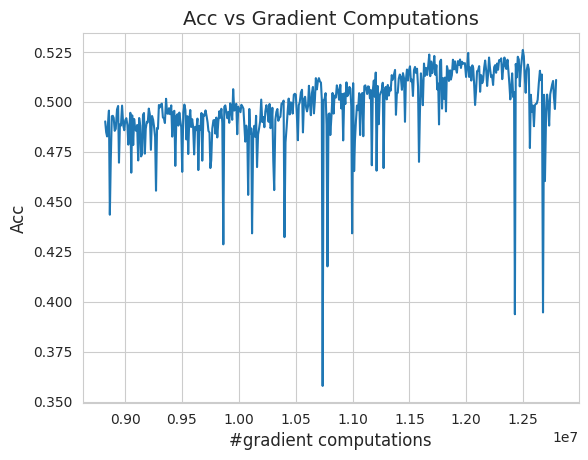

Training: 100%|██████████| 195/195 [00:01<00:00, 131.89it/s, loss=1.1682]


Epoch 452: val_acc=0.5113180875778198


Training: 100%|██████████| 195/195 [00:01<00:00, 133.16it/s, loss=1.0662]


Epoch 453: val_acc=0.47666266560554504


Training: 100%|██████████| 195/195 [00:01<00:00, 129.56it/s, loss=1.1760]


Epoch 454: val_acc=0.49879807233810425


Training: 100%|██████████| 195/195 [00:01<00:00, 121.67it/s, loss=0.8676]


Epoch 455: val_acc=0.49489182233810425


Training: 100%|██████████| 195/195 [00:01<00:00, 128.77it/s, loss=0.9278]


Epoch 456: val_acc=0.5055088400840759


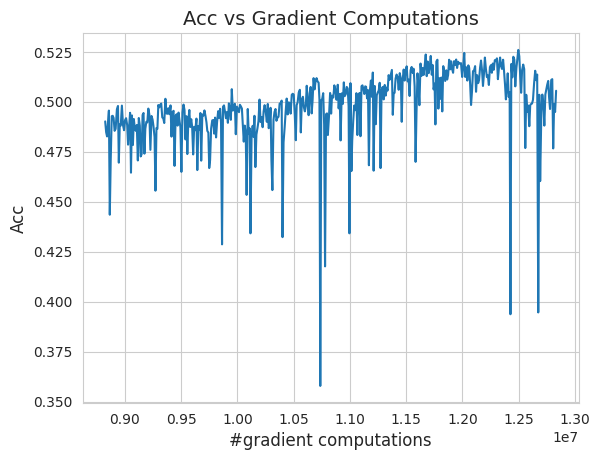

Training: 100%|██████████| 195/195 [00:01<00:00, 123.23it/s, loss=0.7363]


Epoch 457: val_acc=0.5092147588729858


Training: 100%|██████████| 195/195 [00:01<00:00, 124.23it/s, loss=1.3993]


Epoch 458: val_acc=0.500901460647583


Training: 100%|██████████| 195/195 [00:01<00:00, 124.89it/s, loss=1.3893]


Epoch 459: val_acc=0.45993590354919434


Training: 100%|██████████| 195/195 [00:01<00:00, 128.16it/s, loss=1.6373]


Epoch 460: val_acc=0.5012019276618958


Training: 100%|██████████| 195/195 [00:01<00:00, 117.44it/s, loss=1.3081]


Epoch 461: val_acc=0.5054086446762085


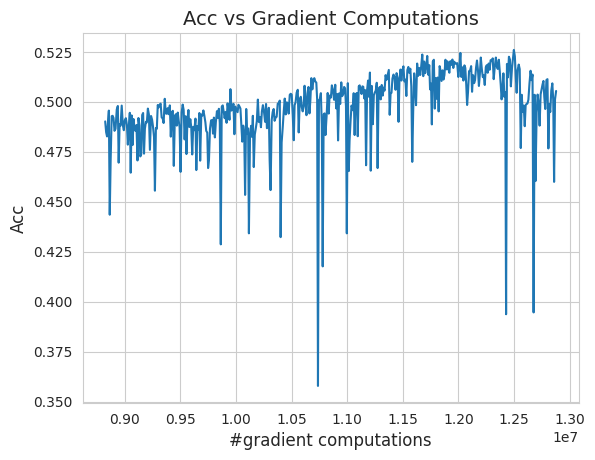

Training: 100%|██████████| 195/195 [00:01<00:00, 124.88it/s, loss=0.8415]


Epoch 462: val_acc=0.5082131624221802


Training: 100%|██████████| 195/195 [00:01<00:00, 134.58it/s, loss=1.5776]


Epoch 463: val_acc=0.48878204822540283


Training: 100%|██████████| 195/195 [00:01<00:00, 132.04it/s, loss=0.8269]


Epoch 464: val_acc=0.5056089758872986


Training: 100%|██████████| 195/195 [00:01<00:00, 123.54it/s, loss=1.1512]


Epoch 465: val_acc=0.4765625


Training: 100%|██████████| 195/195 [00:01<00:00, 128.93it/s, loss=0.8782]


Epoch 466: val_acc=0.5015023946762085


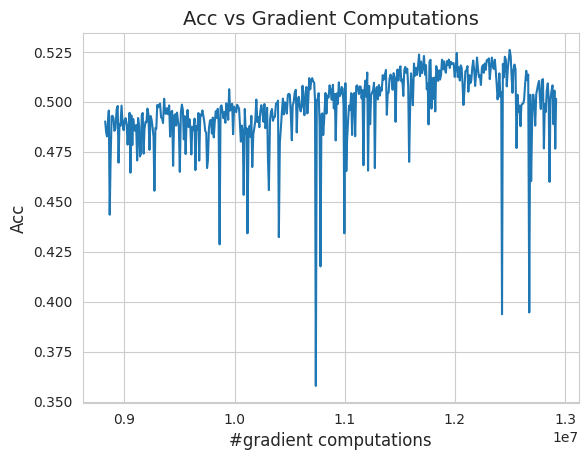

Training: 100%|██████████| 195/195 [00:01<00:00, 121.81it/s, loss=1.1077]


Epoch 467: val_acc=0.5008012652397156


Training: 100%|██████████| 195/195 [00:01<00:00, 113.48it/s, loss=1.4364]


Epoch 468: val_acc=0.5004006624221802


Training: 100%|██████████| 195/195 [00:01<00:00, 123.01it/s, loss=0.6469]


Epoch 469: val_acc=0.5058093070983887


Training: 100%|██████████| 195/195 [00:01<00:00, 118.00it/s, loss=1.4111]


Epoch 470: val_acc=0.5080128312110901


Training: 100%|██████████| 195/195 [00:01<00:00, 126.24it/s, loss=1.6006]


Epoch 471: val_acc=0.510817289352417


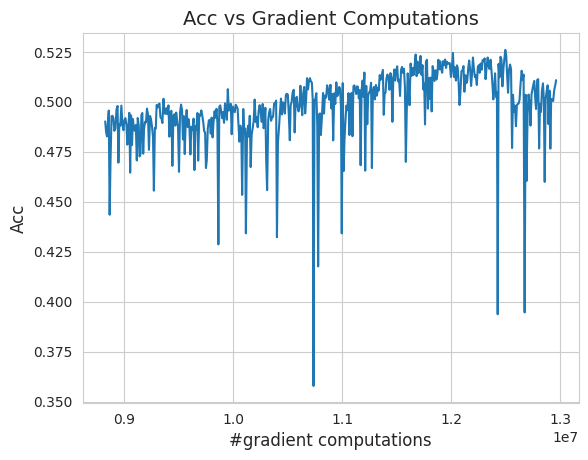

Training: 100%|██████████| 195/195 [00:01<00:00, 118.01it/s, loss=1.2443]


Epoch 472: val_acc=0.5129206776618958


Training: 100%|██████████| 195/195 [00:01<00:00, 132.59it/s, loss=1.7867]


Epoch 473: val_acc=0.5171273946762085


Training: 100%|██████████| 195/195 [00:01<00:00, 130.42it/s, loss=1.2339]


Epoch 474: val_acc=0.5114182829856873


Training: 100%|██████████| 195/195 [00:01<00:00, 134.15it/s, loss=1.3968]


Epoch 475: val_acc=0.5091145634651184


Training: 100%|██████████| 195/195 [00:01<00:00, 121.59it/s, loss=0.9607]


Epoch 476: val_acc=0.512620210647583


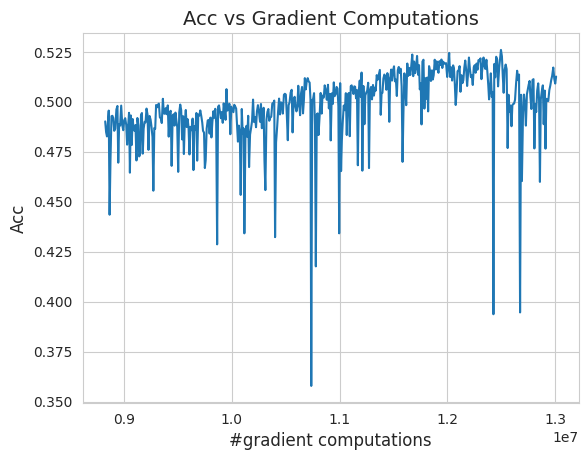

Training: 100%|██████████| 195/195 [00:01<00:00, 130.49it/s, loss=1.2173]


Epoch 477: val_acc=0.5075120329856873


Training: 100%|██████████| 195/195 [00:01<00:00, 123.30it/s, loss=1.6515]


Epoch 478: val_acc=0.5148237347602844


Training: 100%|██████████| 195/195 [00:01<00:00, 122.28it/s, loss=1.0455]


Epoch 479: val_acc=0.5148237347602844


Training: 100%|██████████| 195/195 [00:01<00:00, 122.54it/s, loss=0.7758]


Epoch 480: val_acc=0.5142227411270142


Training: 100%|██████████| 195/195 [00:01<00:00, 129.23it/s, loss=1.3311]


Epoch 481: val_acc=0.5055088400840759


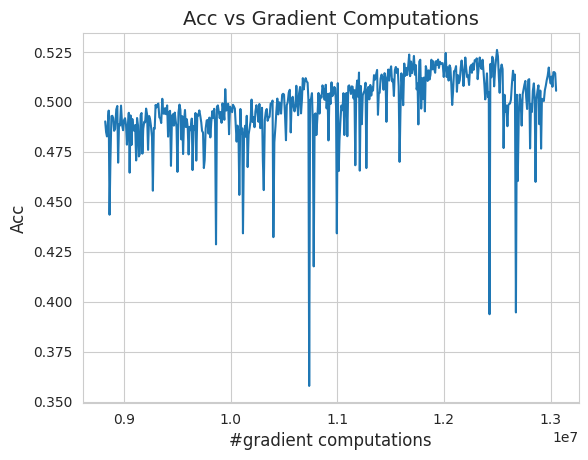

Training: 100%|██████████| 195/195 [00:01<00:00, 133.97it/s, loss=0.9392]


Epoch 482: val_acc=0.5178285241127014


Training: 100%|██████████| 195/195 [00:01<00:00, 123.78it/s, loss=0.9393]


Epoch 483: val_acc=0.5185296535491943


Training: 100%|██████████| 195/195 [00:01<00:00, 124.91it/s, loss=0.9844]


Epoch 484: val_acc=0.5232371687889099


Training: 100%|██████████| 195/195 [00:01<00:00, 126.89it/s, loss=0.9395]


Epoch 485: val_acc=0.5253405570983887


Training: 100%|██████████| 195/195 [00:01<00:00, 128.46it/s, loss=1.6500]


Epoch 486: val_acc=0.5118189454078674


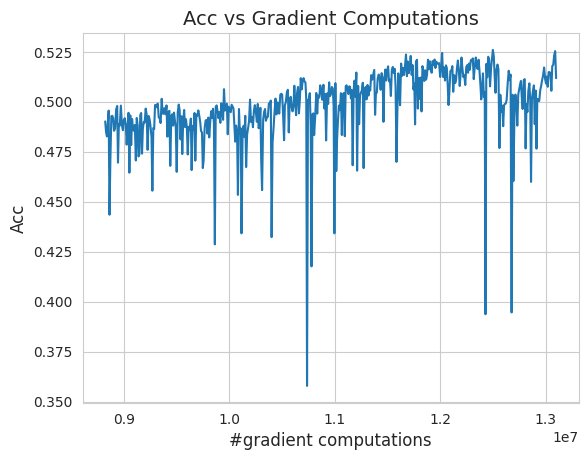

Training: 100%|██████████| 195/195 [00:01<00:00, 125.80it/s, loss=0.7765]


Epoch 487: val_acc=0.5180288553237915


Training: 100%|██████████| 195/195 [00:01<00:00, 128.11it/s, loss=0.8570]


Epoch 488: val_acc=0.5205328464508057


Training: 100%|██████████| 195/195 [00:01<00:00, 127.68it/s, loss=0.9071]


Epoch 489: val_acc=0.5129206776618958


Training: 100%|██████████| 195/195 [00:01<00:00, 128.39it/s, loss=1.0496]


Epoch 490: val_acc=0.5231370329856873


Training: 100%|██████████| 195/195 [00:01<00:00, 134.55it/s, loss=1.3404]


Epoch 491: val_acc=0.5238381624221802


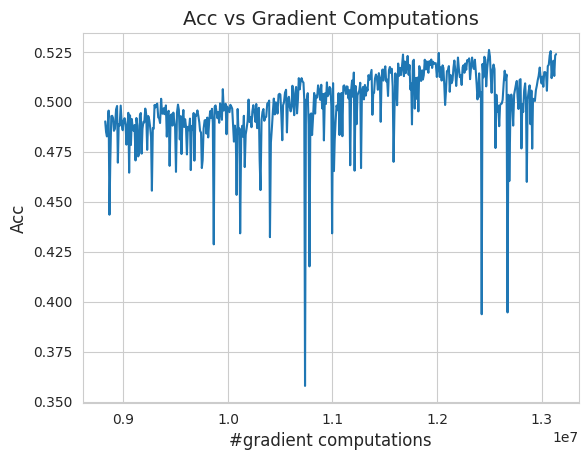

Training: 100%|██████████| 195/195 [00:01<00:00, 120.01it/s, loss=1.2068]


Epoch 492: val_acc=0.51171875


Training: 100%|██████████| 195/195 [00:01<00:00, 113.03it/s, loss=0.7555]


Epoch 493: val_acc=0.5241386294364929


Training: 100%|██████████| 195/195 [00:01<00:00, 128.33it/s, loss=0.6065]


Epoch 494: val_acc=0.5110176205635071


Training: 100%|██████████| 195/195 [00:01<00:00, 129.42it/s, loss=0.7447]


Epoch 495: val_acc=0.5246394276618958


Training: 100%|██████████| 195/195 [00:01<00:00, 131.75it/s, loss=1.4051]


Epoch 496: val_acc=0.5105168223381042


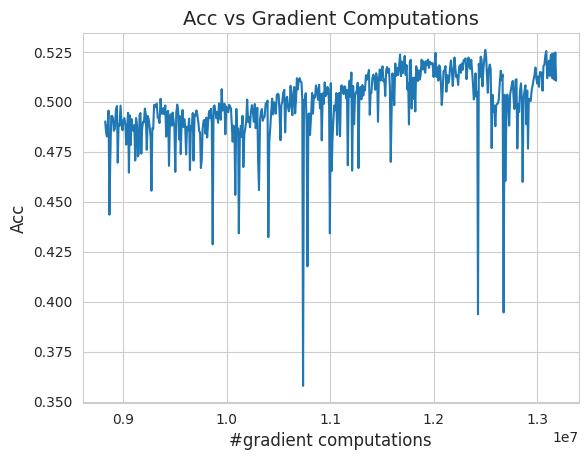

Training: 100%|██████████| 195/195 [00:01<00:00, 118.85it/s, loss=0.7824]


Epoch 497: val_acc=0.4795673191547394


Training: 100%|██████████| 195/195 [00:01<00:00, 122.47it/s, loss=0.9034]


Epoch 498: val_acc=0.5153245329856873


Training: 100%|██████████| 195/195 [00:01<00:00, 123.13it/s, loss=1.1440]


Epoch 499: val_acc=0.5135216116905212


Training: 100%|██████████| 195/195 [00:01<00:00, 125.02it/s, loss=1.3725]


Epoch 500: val_acc=0.5163261294364929


In [22]:
acc_arr_tr, grad_count_tr, state = train(state=state,
            optimizer=optimizer,
            train_loader=train_loader,
            val_loader=val_loader,
            num_epochs=500,
            compute_accuracy=compute_accuracy)

In [23]:
grad_count += grad_count_tr
acc_arr += acc_arr_tr

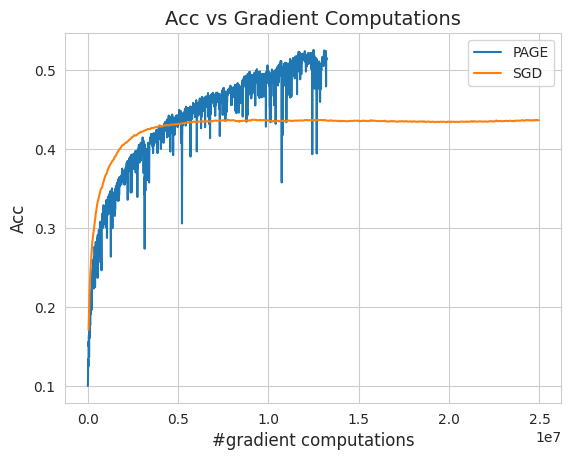

In [24]:
plt.plot(grad_count, acc_arr, label="PAGE")
plt.plot(sgd_grads, sgd_acc, label="SGD")
plt.xlabel('#gradient computations', fontsize=12)
plt.ylabel('Acc', fontsize=12)
plt.title('Acc vs Gradient Computations', fontsize=14)
plt.legend()
plt.savefig("acc_vs_grad_sgd_vs_page.png")
plt.show()

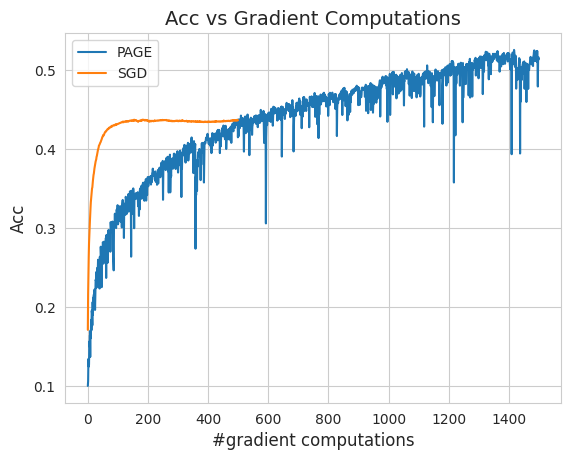

In [25]:
plt.plot(range(len(acc_arr)), acc_arr, label="PAGE")
plt.plot(range(len(sgd_acc)), sgd_acc, label="SGD")
plt.xlabel('#gradient computations', fontsize=12)
plt.ylabel('Acc', fontsize=12)
plt.title('Acc vs Gradient Computations', fontsize=14)
plt.legend()
plt.savefig("acc_vs_iter_sgd_vs_page.png")
plt.show()